<img src="images\GRU_formulas.jpg" width=800>
<img src="images\GRU_shapes.jpg" width=200>

In [96]:
import random, math
import numpy as np
from matplotlib import pyplot as plt
plt.rcParams["figure.figsize"]=16,5


def load_data_txt(filename, dimensions, max_len=None):
    f = open(filename, "r")
    questions = []
    answers = []
    question = []
    answer = []
    was_q = False
    ln = 0
    print("loading data")
    for line in f:
        for c in line:
            new_data = []
            for i in range(0, dimensions):
                new_data.append([0])
                
            if ord(c)-ord('A') < 26 and ord(c)-ord('A') >= 0:
                new_data[ord(c)-ord('A')] = [1]
            else:
                if c == " ":
                    new_data[-1] = [1]
            if ln % 2 == 0:
                was_q = True
                question.append(new_data)
            else:
                was_q = False
                answer.append(new_data)
            if max_len != None:
                if ln >= max_len:
                    print("all loaded")    
                    return questions, answers
                    
        ln += 1
        if was_q:
            print("question: " + line)
            questions.append(question)
            question = []
        else:
            print("answer: " + line)
            answers.append(answer)
            answer = []
        
    print("all loaded")  
    return questions, answers
            
def sigmoid(x):
    return 1/(1+np.exp(-np.clip(x, -500, 500)))

def swish(x):
    return x*sigmoid(x)

def relu(x):
    return np.maximum(0,x)

def softmax(x, temperature):
    inp = x/temperature
    p = np.exp(inp - np.max(inp))
    return p/np.sum(p)

def MSE(target, x):
    return np.power(target - x, 2)

#def cross_entropy(target, x):
#    data = np.clip(x, 1, 

def activation_function(z, act, derivative=False, activated_value=None):
    if derivative == False:
        if act=="sigmoid":
            return sigmoid(z)
        elif act == "swish":
            return swish(z)
        elif act == "relu":
            return relu(z)
        elif act=="tanh":
            return np.tanh(z)
        elif act=="softmax":
            return softmax(z, 0.5)
    else:
        if act=="sigmoid":
            return activated_value * (1 - activated_value)
        elif act == "swish":
            return activated_value + sigmoid(z) * (1 - activated_value)
        elif act == "relu":  
            x = activated_value
            x[x<=0] = 0
            x[x>0] = 1
            return x
        
        elif act=="tanh":
            return 1 - np.power(activated_value, 2)
        elif act=="softmax":
            return activated_value

class RNN():
    
    def __init__(self, l_rate):
        self.layers = []
        self.learning_rate = l_rate
        
    def add_layer(self, input_size, output_size, last_activation=None):
        new_layer = Layer(input_size, output_size, last_activation)
        self.layers.append(new_layer)
        
    def forward_pass(self, input_data, max_steps=0):
        self.layers[0].forward_pass(input_data, max_steps)
        for i in range(1, len(self.layers)):
            prev_layer_out = self.layers[i-1].h[-1]        # Takes in the output of the previous layer. h[-1] is the hidden state of the last timestep of the layer
            self.layers[i].forward_pass(prev_layer_out, max_steps)
            
        return self.layers[-1].y
            
    def clear_memory(self):
        for i in range(0, len(self.layers)):
            self.layers[i].clear_memory()
            
    def backpropagation_through_time(self, input_data, target, max_steps, t):
        gradient, loss = self.layers[-1].der_MSE(target)
        #print("MSE gradient: " + str(gradient))
        for i in range(1, len(self.layers)):
            inputs = self.layers[-i-1].h
            gradient = self.layers[-i].descent(gradient, inputs, self.learning_rate, max_steps, t)
        self.layers[0].descent(gradient, input_data, self.learning_rate, max_steps, t)
        return loss
    
    def predict(self, input_data):
        self.clear_memory()
        next_letter = []
        out_letter = []
        for i in range(0, len(input_data)):
            next_letter = self.forward_pass(input_data[i])
            
        out_letter = next_letter
        print_output = ""
        for i in range(0, 40):
            maximum = 0;
            max_index = 0;
            """for k in range(0, self.layers[0].input_size):
                if next_letter[k][0] > maximum:
                    maximum = next_letter[k][0]
                    max_index = k"""
            max_index = np.random.choice(len(next_letter), p=np.squeeze(softmax(next_letter, 0.05).T))
            out_letter = np.zeros(next_letter.shape)
            out_letter[max_index,0] = 1
            if max_index < 26:
                print_output += chr(ord('A')+max_index)
            else:
                if max_index == 26:
                    print_output += ' '
                    
            next_letter = self.forward_pass(out_letter)
        print(print_output)
    
class Layer():
    
    def __init__(self, input_size, output_size, last_activation=None):
        self.input_size = input_size # M
        self.output_size = output_size # N
        self.last_activation = last_activation
        
        self.Wz = self.weights_init(output_size, input_size) # NxM
        self.Wr = self.weights_init(output_size, input_size) # NxM
        self.Wh = self.weights_init(output_size, input_size) # NxM
        
        self.Uz = self.weights_init(output_size, output_size) # NxN
        self.Ur = self.weights_init(output_size, output_size) # NxN
        self.Uh = self.weights_init(output_size, output_size) # NxN
        
        self.bz = self.weights_init(output_size, 1, bias=True) # Nx1
        self.br = self.weights_init(output_size, 1, bias=True, var=1) # Nx1
        self.bh = self.weights_init(output_size, 1, bias=True) # Nx1
        
        # T = time steps, starts with 0
        
        self.z       = np.empty((0,output_size,1)) # TxNx1, z(t) = Nx1
        self.r       = np.empty((0,output_size,1)) # TxNx1, r(t) = Nx1
        self.h_tilde = np.empty((0,output_size,1)) # TxNx1, h_tilde(t) = Nx1
        self.h       = np.empty((0,output_size,1)) # TxNx1, h(t) = Nx1
        self.inputs  = np.empty((0,input_size,1))  # TxMx1, inputs(t) = Mx1
        self.y       = np.empty((output_size, 1))
        
        self.beta1 = 0.9
        self.beta2 = 0.999
        self.mWz = np.zeros((output_size, input_size))
        self.vWz = np.zeros((output_size, input_size))
        self.mWr = np.zeros((output_size, input_size))
        self.vWr = np.zeros((output_size, input_size))
        self.mWh = np.zeros((output_size, input_size))
        self.vWh = np.zeros((output_size, input_size))
        
        self.mUz = np.zeros((output_size, output_size))
        self.vUz = np.zeros((output_size, output_size))
        self.mUr = np.zeros((output_size, output_size))
        self.vUr = np.zeros((output_size, output_size))
        self.mUh = np.zeros((output_size, output_size))
        self.vUh = np.zeros((output_size, output_size))
        
        self.mbz = np.zeros((output_size, 1))
        self.vbz = np.zeros((output_size, 1))
        self.mbr = np.zeros((output_size, 1))
        self.vbr = np.zeros((output_size, 1))
        self.mbh = np.zeros((output_size, 1))
        self.vbh = np.zeros((output_size, 1))
        
        self.epsilon = 0.000000001
        
        #self.errors  = np.empty((0,input_size,1))  # TxMx1, inputs(t) = Mx1
        
    def weights_init(self, rows, cols, bias=False, var=0.1):
        variance = math.sqrt(1/self.input_size)
        if bias:
            return np.random.uniform(-var,var,(rows, cols))
        return np.random.uniform(-variance,variance,(rows, cols))
    
    
    def forward_pass(self, input_data, max_steps=0):
        
        self.inputs = np.concatenate((self.inputs, [input_data]), axis=0)
        prev_h = []
        if len(self.h) > 0:
            prev_h = self.h[-1]
        else:
            prev_h = np.zeros((self.output_size, 1))
        
        new_z = self.Wz @ input_data + self.Uz @ prev_h + self.bz      #Nx1
        new_z = sigmoid(new_z)
        self.z = np.concatenate((self.z, [new_z]), axis=0)

        new_r = self.Wr @ input_data + self.Ur @ prev_h + self.br
        new_r = sigmoid(new_r)
        self.r = np.concatenate((self.r, [new_r]), axis=0)
        
        new_h_tilde = self.Wh @ input_data + self.Uh @ (new_r * prev_h) + self.bh
        new_h_tilde = np.tanh(new_h_tilde)
        self.h_tilde = np.concatenate((self.h_tilde, [new_h_tilde]), axis=0)
        
        new_h = new_z * prev_h + (1 - new_z) * new_h_tilde
        self.h = np.concatenate((self.h, [new_h]), axis=0)
        if self.last_activation != None:
            self.y = activation_function(new_h, self.last_activation)
        else:
            self.y = new_h
        
        """if max_steps != 0:
            if len(self.z) > max_steps:
                self.z = np.delete(self.z, 0, 0)
            if len(self.r) > max_steps:
                self.r = np.delete(self.r, 0, 0)
            if len(self.h_tilde) > max_steps:
                self.h_tilde = np.delete(self.h_tilde, 0, 0)
            if len(self.h) > max_steps:
                self.h = np.delete(self.h, 0, 0)
            if len(self.h) > max_steps:
                self.inputs = np.delete(self.inputs, 0, 0)"""
            
        
    def clear_memory(self):
        self.z       = np.empty((0,self.output_size,1))
        self.r       = np.empty((0,self.output_size,1))
        self.h_tilde = np.empty((0,self.output_size,1))
        self.h       = np.empty((0,self.output_size,1))
        self.inputs  = np.empty((0,self.input_size,1))  # TxMx1, inputs(t) = Mx1
        
        self.mWz = np.zeros((self.output_size, self.input_size))
        self.vWz = np.zeros((self.output_size, self.input_size))
        self.mWr = np.zeros((self.output_size, self.input_size))
        self.vWr = np.zeros((self.output_size, self.input_size))
        self.mWh = np.zeros((self.output_size, self.input_size))
        self.vWh = np.zeros((self.output_size, self.input_size))
        
        self.mUz = np.zeros((self.output_size, self.output_size))
        self.vUz = np.zeros((self.output_size, self.output_size))
        self.mUr = np.zeros((self.output_size, self.output_size))
        self.vUr = np.zeros((self.output_size, self.output_size))
        self.mUh = np.zeros((self.output_size, self.output_size))
        self.vUh = np.zeros((self.output_size, self.output_size))
        
        self.mbz = np.zeros((self.output_size, 1))
        self.vbz = np.zeros((self.output_size, 1))
        self.mbr = np.zeros((self.output_size, 1))
        self.vbr = np.zeros((self.output_size, 1))
        self.mbh = np.zeros((self.output_size, 1))
        self.vbh = np.zeros((self.output_size, 1))
        #self.errors  = np.empty((0,self.input_size,1))  # TxMx1, inputs(t) = Mx1
        
        
    def der_MSE(self, target):
        if self.last_activation != None:
            return 2*(self.y-target) * softmax(self.y, 0.5), np.power(target - self.y, 2)
        return 2*(self.y-target), np.power(target - self.y, 2)

     

<img src="images\article_derivative_image.png" width=800>

In [97]:
class Layer(Layer):    
    
    def descent(self, gradient, input_data, learning_rate, max_steps, t):
        
        first_index = 0 if len(self.inputs) <= max(max_steps, len(input_data)) else len(self.inputs) - max(max_steps, len(input_data))
        step = 1
        
        d0 = gradient
        d1=0
        d2=0
        d3=0
        d4=0
        d5=0
        d6=0
        d7=0
        d8=0
        d9=0
        d10=0
        d11=0
        d12=0
        d13=0
        d14=0
        d15=0
        d16=0
        d17=0
        d18=0
        d19=0
        d20=0
        dx=0
        dh=0
        dWz=0
        dWr=0
        dWh=0
        dUz=0
        dUr=0
        dUh=0
        dbz=0
        dbr=0
        dbh=0
        
        
        while len(self.inputs) - step > first_index:
            x = np.array(self.inputs[len(self.inputs) - step])
            prev_h = self.h[len(self.inputs) - step-1] if len(self.inputs) - step-1 >= 0 else np.zeros((self.output_size, 1))
            h_tilde = self.h_tilde[len(self.inputs) - step]
            h = self.h[len(self.inputs) - step]
            z = self.z[len(self.inputs) - step]
            r = self.r[len(self.inputs) - step]
            
            d1 = d0 * z
            d2 = d0 * prev_h
            d3 = d0 * h_tilde
            d4 = -d3
            d5 = d2 + d4
            d6 = d0 * (1-z)
            d7 = d5 * (z * (1-z))
            d8 = d6 * (1 - np.power(h_tilde, 2))
            
            d9 = self.Wh.T @ d8 
            d10= self.Uh.T @ d8 
            d11= self.Wz.T @ d7
            d12= self.Uz.T @ d7
            d14= d10 * r
            d15= d10 * prev_h
            d16= d15 * (r * (1-r))
            d17= self.Ur.T @ d16
            d13= self.Wr.T @ d16
            
            if step == 1:
                dx = d13 + d11 + d9
            dh = d1 + d14 + d17 + d12
            dWr+= d16 @ x.T
            dWh+= d8 @ x.T
            dWz+= d7 @ x.T
            dUr+= d16 @ prev_h.T
            dUh+= d8 @ (r * prev_h).T
            dUz+= d7 @ prev_h.T
            
            dbh+= d8
            dbr+= d16
            dbz+= d7
            
            d0 = dh
            
            step += 1
        
        oneminusbeta1 = (1 - self.beta1)
        oneminusbeta2 = (1 - self.beta2)
        
        self.mWz = self.beta1 * self.mWz + oneminusbeta1 * dWz
        self.vWz = self.beta2 * self.vWz + oneminusbeta2 * np.power(dWz, 2)
        self.mWr = self.beta1 * self.mWr + oneminusbeta1 * dWr
        self.vWr = self.beta2 * self.vWr + oneminusbeta2 * np.power(dWr, 2)
        self.mWh = self.beta1 * self.mWh + oneminusbeta1 * dWh
        self.vWh = self.beta2 * self.vWh + oneminusbeta2 * np.power(dWh, 2)
        
        self.mUz = self.beta1 * self.mUz + oneminusbeta1 * dUz
        self.vUz = self.beta2 * self.vUz + oneminusbeta2 * np.power(dUz, 2)
        self.mUr = self.beta1 * self.mUr + oneminusbeta1 * dUr
        self.vUr = self.beta2 * self.vUr + oneminusbeta2 * np.power(dUr, 2)
        self.mUh = self.beta1 * self.mUh + oneminusbeta1 * dUh
        self.vUh = self.beta2 * self.vUh + oneminusbeta2 * np.power(dUh, 2)
        
        self.mbz = self.beta1 * self.mbz + oneminusbeta1 * dbz
        self.vbz = self.beta2 * self.vbz + oneminusbeta2 * np.power(dbz, 2)
        self.mbr = self.beta1 * self.mbr + oneminusbeta1 * dbr
        self.vbr = self.beta2 * self.vbr + oneminusbeta2 * np.power(dbr, 2)
        self.mbh = self.beta1 * self.mbh + oneminusbeta1 * dbh
        self.vbh = self.beta2 * self.vbh + oneminusbeta2 * np.power(dbh, 2)
        
        powerbeta1 = (1 - np.power(self.beta1, t))
        powerbeta2 = (1 - np.power(self.beta2, t))
        
        mWz_hat = self.mWz / powerbeta1
        vWz_hat = self.vWz / powerbeta2
        mWr_hat = self.mWr / powerbeta1
        vWr_hat = self.vWr / powerbeta2
        mWh_hat = self.mWh / powerbeta1
        vWh_hat = self.vWh / powerbeta2
        mUz_hat = self.mUz / powerbeta1
        vUz_hat = self.vUz / powerbeta2
        mUr_hat = self.mUr / powerbeta1
        vUr_hat = self.vUr / powerbeta2
        mUh_hat = self.mUh / powerbeta1
        vUh_hat = self.vUh / powerbeta2
        mbz_hat = self.mbz / powerbeta1
        vbz_hat = self.vbz / powerbeta2
        mbr_hat = self.mbr / powerbeta1
        vbr_hat = self.vbr / powerbeta2
        mbh_hat = self.mbh / powerbeta1
        vbh_hat = self.vbh / powerbeta2
        
        self.Wr = self.Wr - learning_rate * mWr_hat / (np.sqrt(vWr_hat) + self.epsilon)
        self.Wh = self.Wh - learning_rate * mWh_hat / (np.sqrt(vWh_hat) + self.epsilon)
        self.Wz = self.Wz - learning_rate * mWz_hat / (np.sqrt(vWz_hat) + self.epsilon)
        self.Ur = self.Ur - learning_rate * mUr_hat / (np.sqrt(vUr_hat) + self.epsilon)
        self.Uh = self.Uh - learning_rate * mUh_hat / (np.sqrt(vUh_hat) + self.epsilon)
        self.Uz = self.Uz - learning_rate * mUz_hat / (np.sqrt(vUz_hat) + self.epsilon)
        self.br = self.br - learning_rate * mbr_hat / (np.sqrt(vbr_hat) + self.epsilon)
        self.bh = self.bh - learning_rate * mbh_hat / (np.sqrt(vbh_hat) + self.epsilon)
        self.bz = self.bz - learning_rate * mbz_hat / (np.sqrt(vbz_hat) + self.epsilon)
        
        return dx
    

In [98]:
network = RNN(0.001)
network.add_layer(27, 100)
network.add_layer(100, 50)
network.add_layer(50, 25)
network.add_layer(25, 27, "softmax")

In [99]:
input_questions, input_answers = load_data_txt("QA.txt", 27, 9000)

loading data
question: WHAT TIME IS IT

answer: SOME HOURS AND SOME MINUTES

question: WHAT IS YOUR NAME

answer: MY NAME IS GRUBOY

question: CAN YOU TALK

answer: SADLY NO

question: ARE YOU GOOD AT MATHS

answer: VERY GOOD

question: ARE YOU GOOD AT LEARNING

answer: YES I AM

question: DO YOU LIKE PYTHON

answer: VERY MUCH

question: WE LOVE YOU

answer: I APPRECIATE THAT
all loaded


---------------
epoch 0
-----------------
average loss: 
[[0.06965699]
 [0.01097978]
 [0.02176771]
 [0.03087643]
 [0.08928307]
 [0.00065868]
 [0.02105455]
 [0.03121436]
 [0.0410782 ]
 [0.00047652]
 [0.0004826 ]
 [0.01093882]
 [0.06112057]
 [0.04055879]
 [0.06958482]
 [0.02153055]
 [0.00062164]
 [0.05085805]
 [0.05046542]
 [0.04141015]
 [0.04072444]
 [0.00123928]
 [0.00095138]
 [0.00073465]
 [0.05124621]
 [0.00076793]
 [0.13423768]]


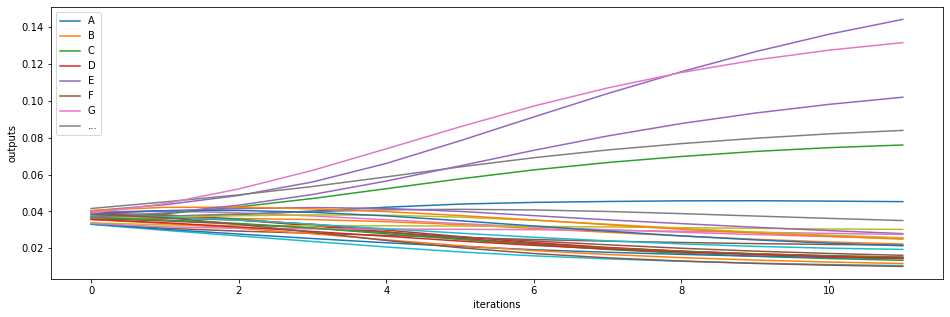

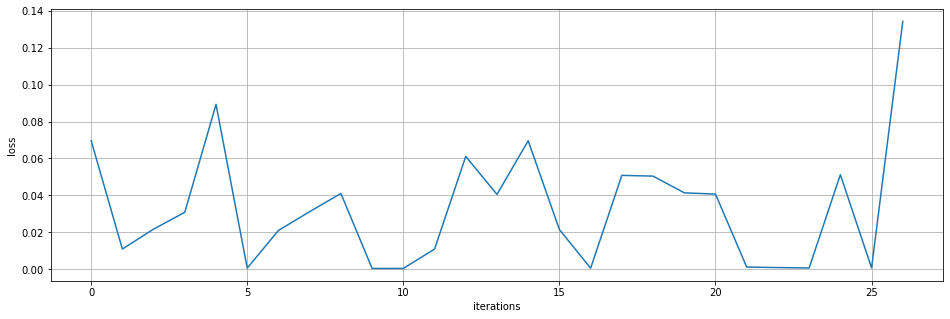

RZJEYXYYWGC J EACEUVAE ER DIS ABZE E E Q
---------------
epoch 5
---------------
epoch 10
---------------
epoch 15
-----------------
average loss: 
[[0.05013033]
 [0.01069031]
 [0.02097401]
 [0.03070265]
 [0.03080103]
 [0.00066603]
 [0.02056459]
 [0.03042329]
 [0.04044249]
 [0.00066014]
 [0.00066313]
 [0.0106868 ]
 [0.05994884]
 [0.04085686]
 [0.06916459]
 [0.02043798]
 [0.00066238]
 [0.04554052]
 [0.05115725]
 [0.04028937]
 [0.04028815]
 [0.00066428]
 [0.00066396]
 [0.00066067]
 [0.0504795 ]
 [0.00065916]
 [0.05312696]]


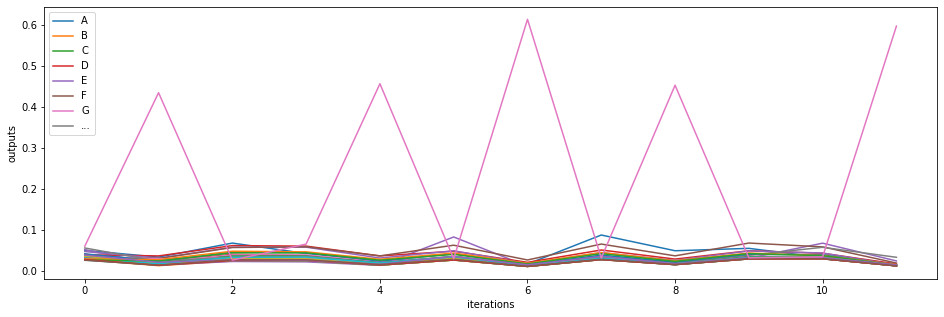

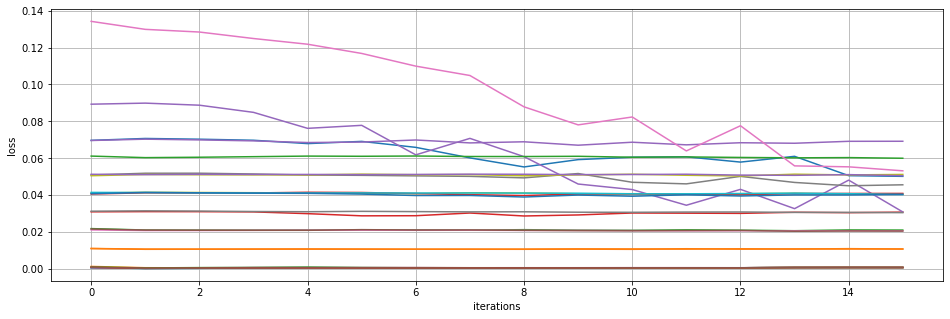

 EII JHLRFSAAE G UQ HHD ZF HCGYDNP GGRCW
---------------
epoch 20
---------------
epoch 25
---------------
epoch 30
-----------------
average loss: 
[[0.02577843]
 [0.01075431]
 [0.02051636]
 [0.03059936]
 [0.01978069]
 [0.00076185]
 [0.02053966]
 [0.03033988]
 [0.04032551]
 [0.00076016]
 [0.00076958]
 [0.0106571 ]
 [0.0588723 ]
 [0.04027268]
 [0.06046271]
 [0.01869563]
 [0.00075973]
 [0.01063465]
 [0.05010311]
 [0.04073699]
 [0.0402731 ]
 [0.000775  ]
 [0.00083535]
 [0.00076089]
 [0.02767299]
 [0.00076221]
 [0.01857331]]


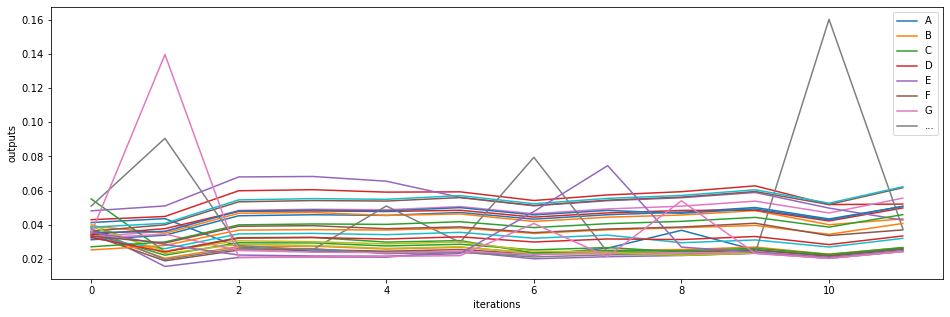

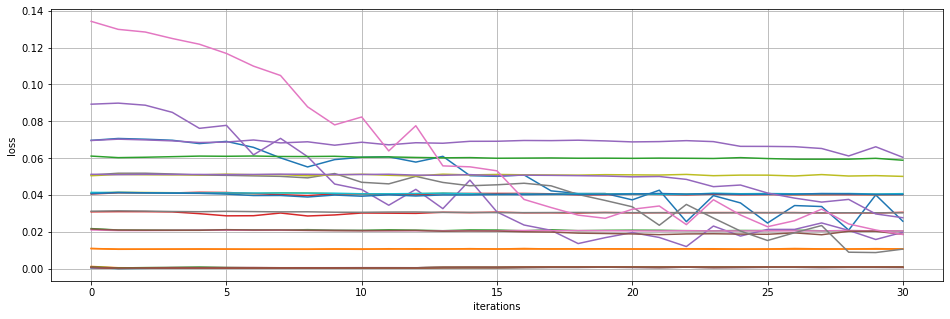

EOME EUR  ATS XERTAXBAEVQUY JARE FZ RHGM
---------------
epoch 35
---------------
epoch 40
---------------
epoch 45
-----------------
average loss: 
[[0.02720075]
 [0.01067909]
 [0.0205287 ]
 [0.03038142]
 [0.01518233]
 [0.00082786]
 [0.02052854]
 [0.03037882]
 [0.04022336]
 [0.00082781]
 [0.00082777]
 [0.01068065]
 [0.05969044]
 [0.04025039]
 [0.06395722]
 [0.02041658]
 [0.00082777]
 [0.00638705]
 [0.05010087]
 [0.04023057]
 [0.04023233]
 [0.00082776]
 [0.00082795]
 [0.0008278 ]
 [0.02395721]
 [0.00082777]
 [0.0163756 ]]


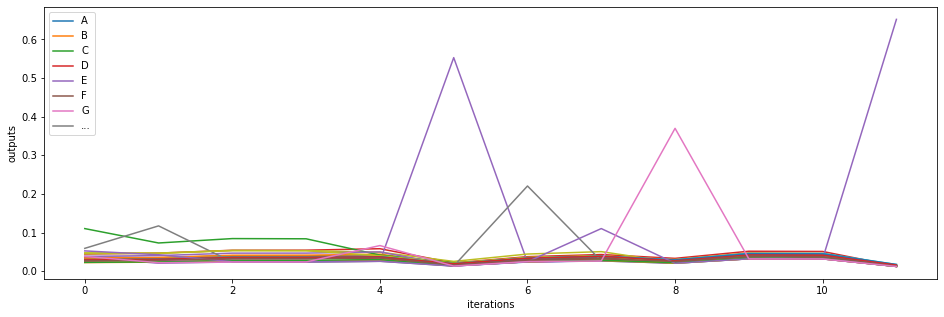

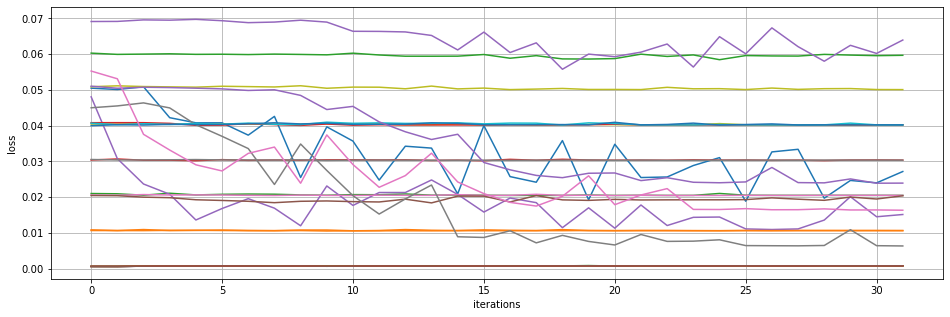

EOXE Y ZCNAYEEY O Y WGQME CNAPERY TACE S
---------------
epoch 50
---------------
epoch 55
---------------
epoch 60
-----------------
average loss: 
[[0.01734446]
 [0.01069132]
 [0.02054105]
 [0.03039097]
 [0.01079157]
 [0.0008405 ]
 [0.02054106]
 [0.03039134]
 [0.04024162]
 [0.0008405 ]
 [0.0008405 ]
 [0.01069069]
 [0.05993991]
 [0.04024163]
 [0.0352387 ]
 [0.02053874]
 [0.0008405 ]
 [0.00637017]
 [0.05009303]
 [0.04024169]
 [0.04024176]
 [0.0008405 ]
 [0.0008405 ]
 [0.0008405 ]
 [0.02386079]
 [0.0008405 ]
 [0.01631929]]


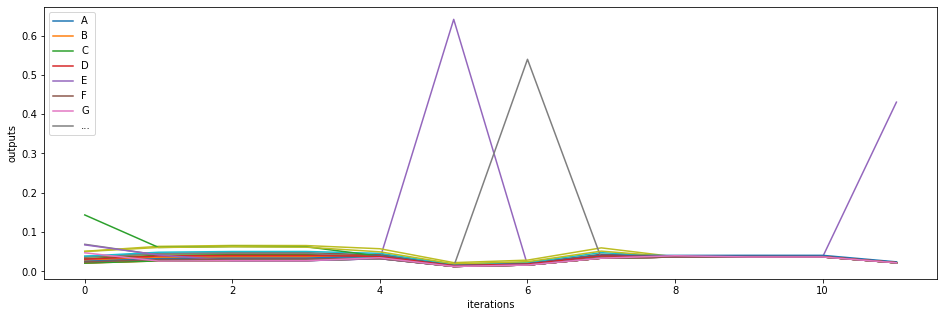

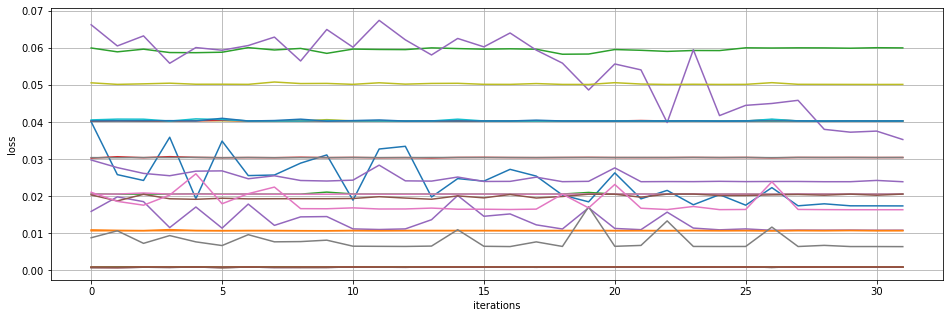

OOVERY KOGGIUCEWATE ZTRJBCRE AOCWVWLPAES
---------------
epoch 65
---------------
epoch 70
---------------
epoch 75
-----------------
average loss: 
[[0.01731068]
 [0.01067788]
 [0.02052815]
 [0.03037845]
 [0.01077644]
 [0.0008276 ]
 [0.02052815]
 [0.03037843]
 [0.0402287 ]
 [0.0008276 ]
 [0.0008276 ]
 [0.01067788]
 [0.0599285 ]
 [0.0402287 ]
 [0.02605593]
 [0.02052138]
 [0.0008276 ]
 [0.00635506]
 [0.05007897]
 [0.0402287 ]
 [0.0402287 ]
 [0.0008276 ]
 [0.0008276 ]
 [0.0008276 ]
 [0.02384444]
 [0.0008276 ]
 [0.01630373]]


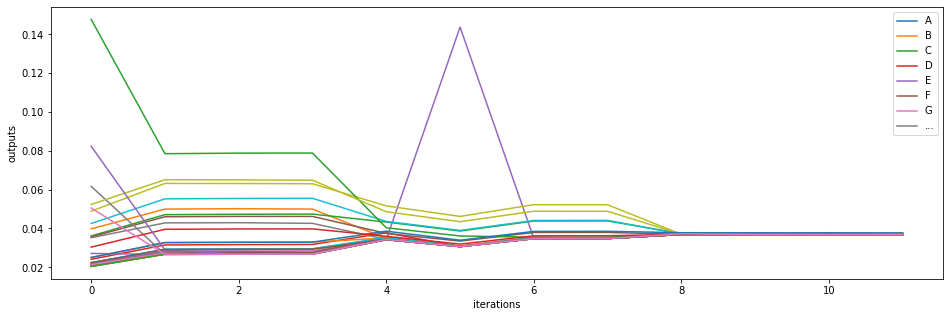

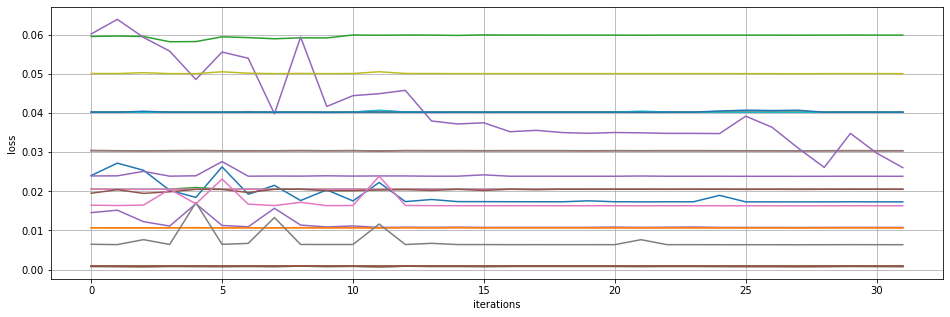

OONE ZJVJBUDUF  GDMBKAHUEY Y KOMG OXJD Z
---------------
epoch 80
---------------
epoch 85
---------------
epoch 90
-----------------
average loss: 
[[0.01730082]
 [0.01066345]
 [0.02051419]
 [0.03036424]
 [0.01076219]
 [0.00081317]
 [0.02051383]
 [0.03036401]
 [0.04021428]
 [0.00081317]
 [0.00081317]
 [0.01066345]
 [0.05960441]
 [0.04021427]
 [0.01704711]
 [0.02039218]
 [0.00081317]
 [0.0063453 ]
 [0.05006456]
 [0.04021444]
 [0.04021809]
 [0.00081317]
 [0.00081317]
 [0.00081317]
 [0.02382999]
 [0.00081317]
 [0.01629464]]


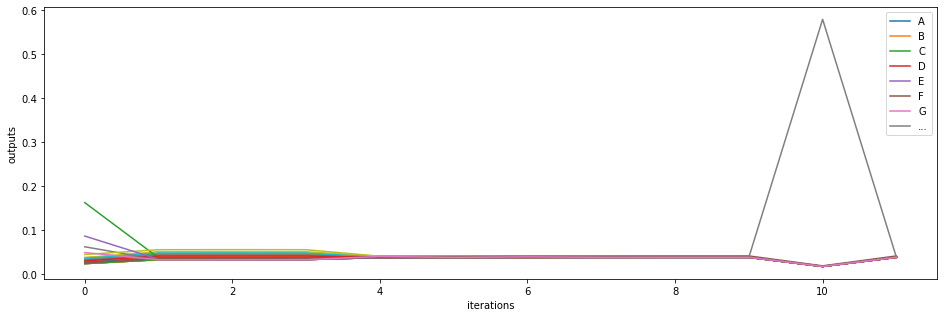

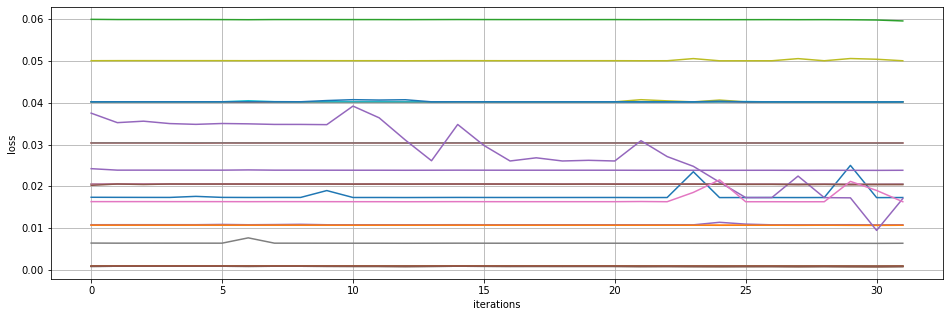

OODW AUHWGPWONO KO PLNNVQEWZ RMIANIAEERY
---------------
epoch 95
---------------
epoch 100
---------------
epoch 105
-----------------
average loss: 
[[0.01726632]
 [0.01063319]
 [0.0204837 ]
 [0.03033375]
 [0.01073193]
 [0.00078291]
 [0.02048347]
 [0.03033391]
 [0.04018626]
 [0.00078291]
 [0.00078291]
 [0.01063319]
 [0.04735023]
 [0.04018462]
 [0.00852101]
 [0.02046773]
 [0.00078291]
 [0.00631104]
 [0.05003431]
 [0.04018408]
 [0.04018248]
 [0.00078291]
 [0.00078291]
 [0.00078291]
 [0.02379972]
 [0.00078291]
 [0.0162599 ]]


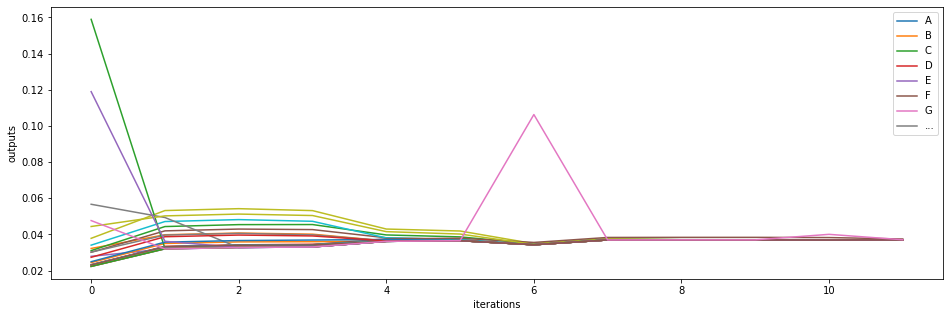

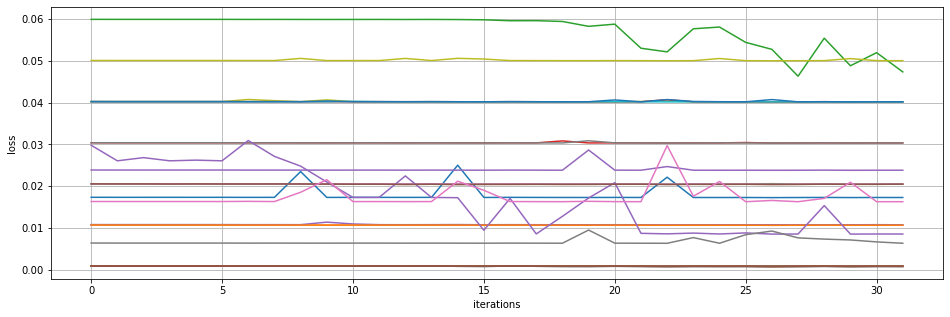

YOTE JDFCGMEFY WCHCERY CONLQBERY MBEFITA
---------------
epoch 110
---------------
epoch 115
---------------
epoch 120
-----------------
average loss: 
[[0.01723294]
 [0.01060011]
 [0.02045044]
 [0.03030066]
 [0.01272935]
 [0.00074983]
 [0.02045038]
 [0.03030073]
 [0.04015118]
 [0.00074983]
 [0.00074983]
 [0.01060011]
 [0.02678318]
 [0.04015097]
 [0.00848888]
 [0.02044196]
 [0.00074983]
 [0.0062812 ]
 [0.05000387]
 [0.04015094]
 [0.04015049]
 [0.00074983]
 [0.00074983]
 [0.00074983]
 [0.02376664]
 [0.00074983]
 [0.01623679]]


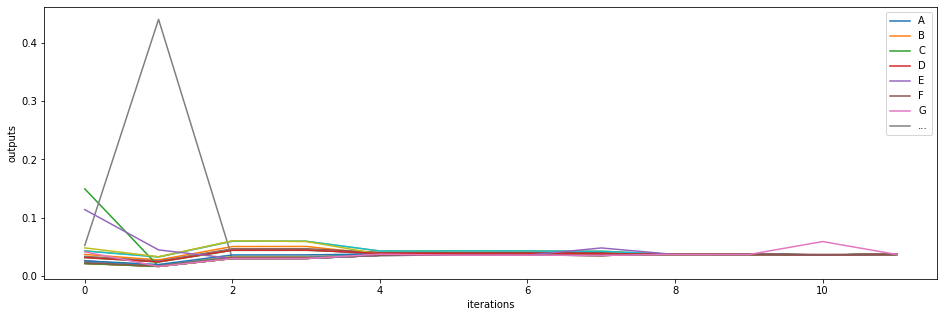

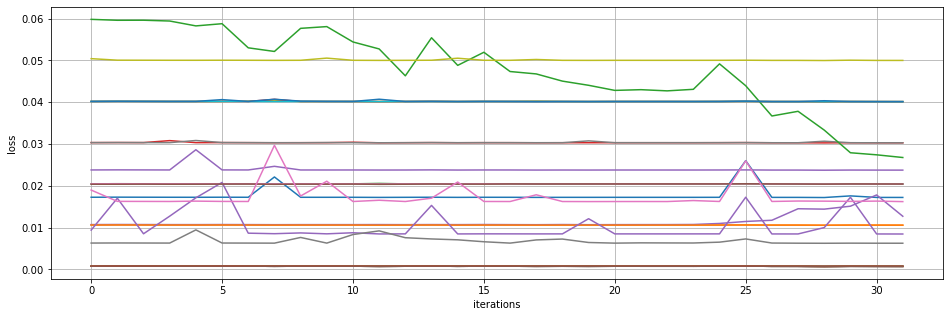

TOY COCTY GOCHUDKKAZY EFRFCZAIE ERY FO  
---------------
epoch 125
---------------
epoch 130
---------------
epoch 135
-----------------
average loss: 
[[0.00847487]
 [0.0105872 ]
 [0.0204375 ]
 [0.03028775]
 [0.01068718]
 [0.00073692]
 [0.02043747]
 [0.03028775]
 [0.04013791]
 [0.00073692]
 [0.00073692]
 [0.0105872 ]
 [0.02486981]
 [0.04013802]
 [0.00847534]
 [0.02043706]
 [0.00073692]
 [0.00626404]
 [0.04998829]
 [0.04013803]
 [0.04013797]
 [0.00073692]
 [0.00073692]
 [0.00073692]
 [0.02375372]
 [0.00073692]
 [0.01621283]]


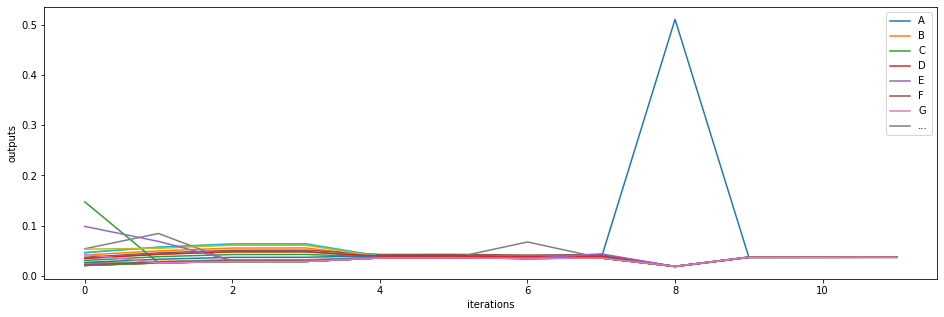

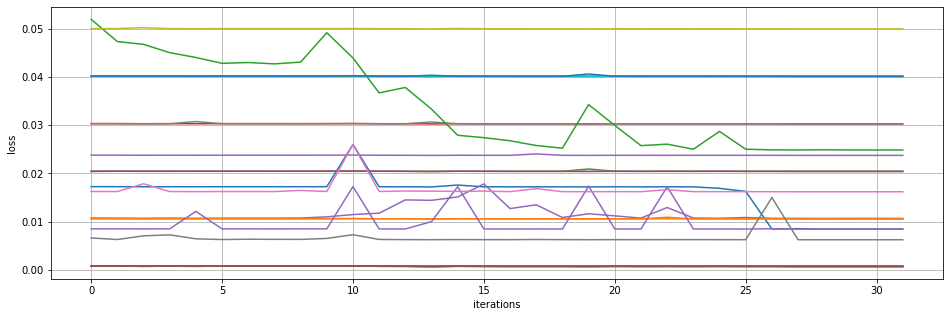

VOLE RQAOI ABW UIXFXOJYOVAL  XKY BOS CEA
---------------
epoch 140
---------------
epoch 145
---------------
epoch 150
-----------------
average loss: 
[[0.00847485]
 [0.0105872 ]
 [0.02043748]
 [0.03028776]
 [0.01068593]
 [0.00073693]
 [0.02043748]
 [0.03028776]
 [0.04013803]
 [0.00073693]
 [0.00073693]
 [0.01058721]
 [0.02485936]
 [0.04013803]
 [0.00847485]
 [0.0204373 ]
 [0.00073693]
 [0.00626402]
 [0.04998831]
 [0.04013803]
 [0.040138  ]
 [0.00073693]
 [0.00073693]
 [0.00073693]
 [0.02375373]
 [0.00073693]
 [0.01621277]]


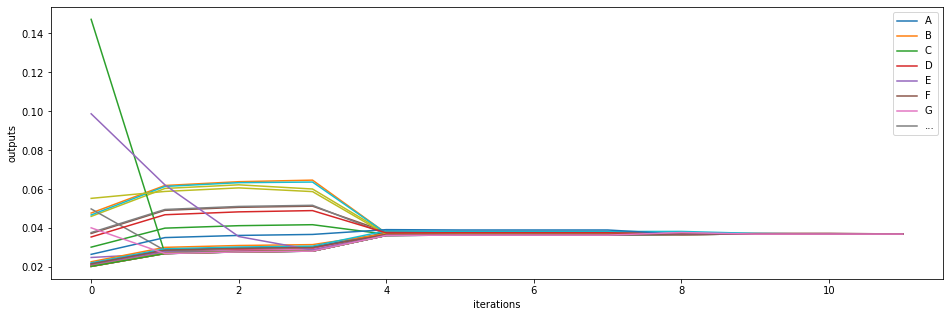

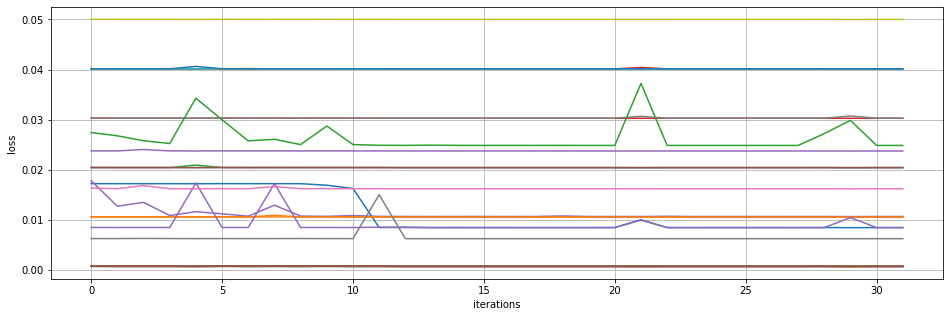

ZOME  OJRMEAMR EGY IAKE GZFKVLRLADIAAUFR
---------------
epoch 155
---------------
epoch 160
---------------
epoch 165
-----------------
average loss: 
[[0.00847485]
 [0.01058721]
 [0.02043748]
 [0.03028776]
 [0.01068568]
 [0.00073693]
 [0.02043748]
 [0.03028776]
 [0.04013803]
 [0.00073693]
 [0.00073693]
 [0.01058721]
 [0.02485915]
 [0.04013803]
 [0.00847484]
 [0.02043736]
 [0.00073693]
 [0.00626402]
 [0.04998831]
 [0.04013803]
 [0.04013802]
 [0.00073693]
 [0.00073693]
 [0.00073693]
 [0.02375373]
 [0.00073693]
 [0.01621276]]


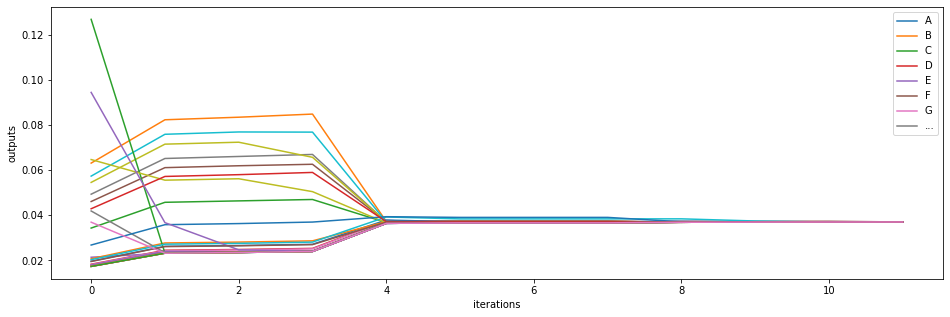

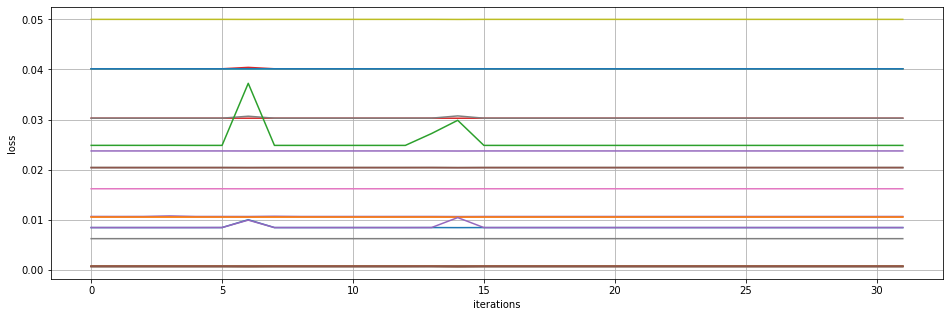

POME  CJWTEIEIT JOS KPUFHJHVERY EFWEVEZH
---------------
epoch 170
---------------
epoch 175
---------------
epoch 180
-----------------
average loss: 
[[0.00847485]
 [0.01058721]
 [0.02043748]
 [0.03028776]
 [0.01068568]
 [0.00073693]
 [0.02043748]
 [0.03028776]
 [0.04013803]
 [0.00073693]
 [0.00073693]
 [0.01058721]
 [0.02485915]
 [0.04013803]
 [0.00847484]
 [0.02043742]
 [0.00073693]
 [0.00626401]
 [0.0499883 ]
 [0.04013803]
 [0.04013802]
 [0.00073693]
 [0.00073693]
 [0.00073693]
 [0.02375373]
 [0.00073693]
 [0.01621276]]


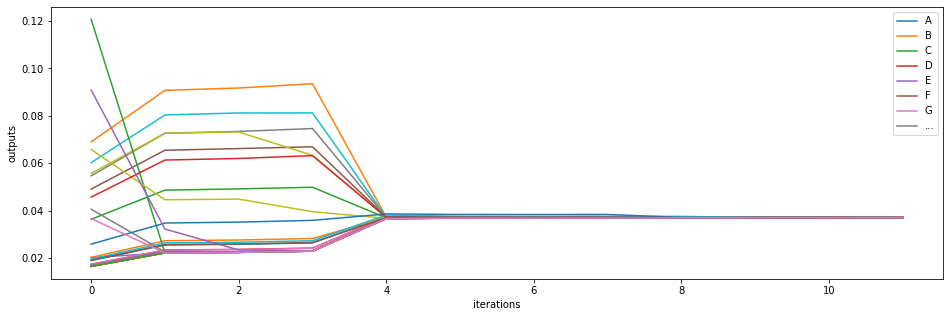

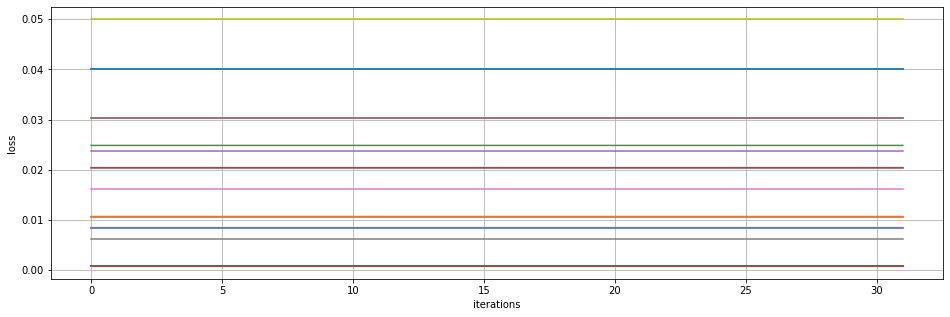

EOFEPYAEQRU CUANE M GXBJYDRQABEKY MZABEO
---------------
epoch 185
---------------
epoch 190
---------------
epoch 195
-----------------
average loss: 
[[0.00847484]
 [0.01058721]
 [0.02043748]
 [0.03028776]
 [0.01068568]
 [0.00073693]
 [0.02043748]
 [0.03028776]
 [0.04013803]
 [0.00073693]
 [0.00073693]
 [0.01058721]
 [0.02485915]
 [0.04013803]
 [0.00847484]
 [0.02043746]
 [0.00073693]
 [0.00626401]
 [0.04998829]
 [0.04013803]
 [0.04013801]
 [0.00073693]
 [0.00073693]
 [0.00073693]
 [0.02375373]
 [0.00073693]
 [0.01621276]]


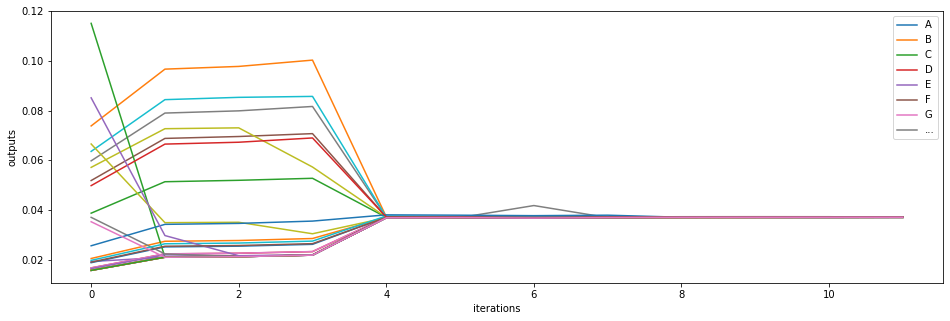

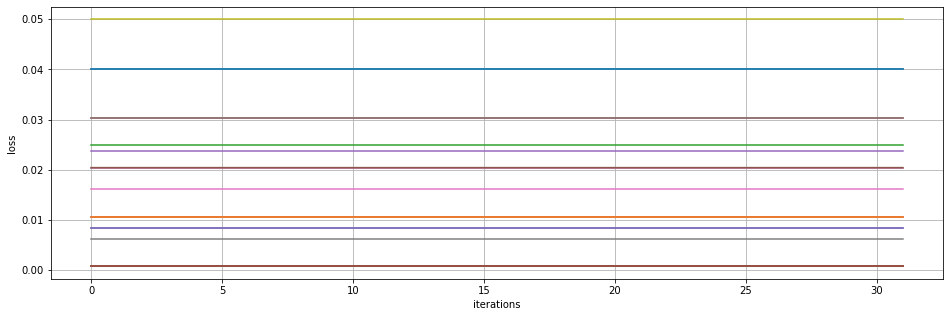

 ONE TW NVIOIQ KOFNNORERY MUHFUEERY PJBX
---------------
epoch 200
---------------
epoch 205
---------------
epoch 210
-----------------
average loss: 
[[0.00847484]
 [0.01058721]
 [0.02043748]
 [0.03028775]
 [0.01068568]
 [0.00073693]
 [0.02043748]
 [0.03028776]
 [0.04013803]
 [0.00073693]
 [0.00073693]
 [0.01058721]
 [0.02485915]
 [0.04013803]
 [0.00847484]
 [0.02043746]
 [0.00073693]
 [0.00626401]
 [0.0499883 ]
 [0.04013803]
 [0.04013801]
 [0.00073693]
 [0.00073693]
 [0.00073693]
 [0.02375373]
 [0.00073693]
 [0.01621276]]


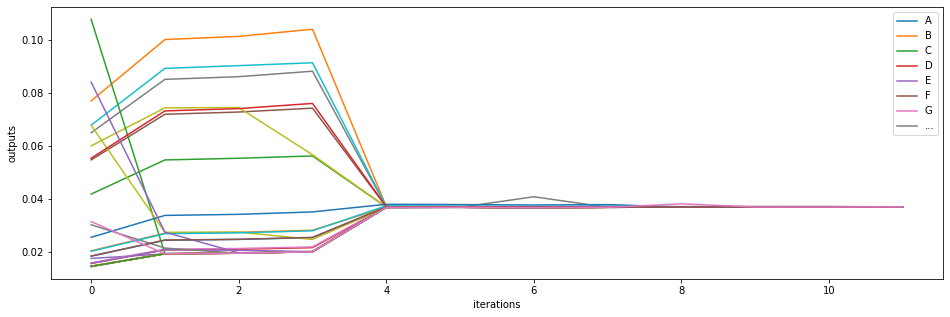

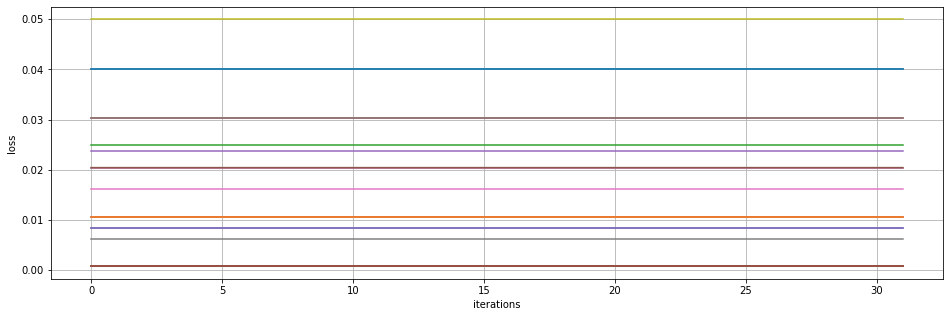

JOME QLY KBTDWY SOYEGPGEPGYGTSAAE NDAZEM
---------------
epoch 215
---------------
epoch 220
---------------
epoch 225
-----------------
average loss: 
[[0.00847484]
 [0.01058721]
 [0.02043748]
 [0.03028776]
 [0.01068568]
 [0.00073693]
 [0.02043748]
 [0.03028776]
 [0.04013803]
 [0.00073693]
 [0.00073693]
 [0.01058721]
 [0.02485915]
 [0.04013803]
 [0.00847484]
 [0.02043748]
 [0.00073693]
 [0.00626401]
 [0.04998829]
 [0.04013803]
 [0.040138  ]
 [0.00073693]
 [0.00073693]
 [0.00073693]
 [0.02375373]
 [0.00073693]
 [0.01621276]]


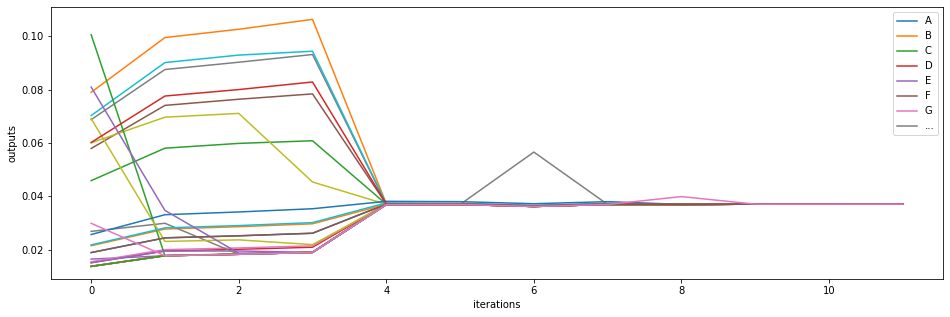

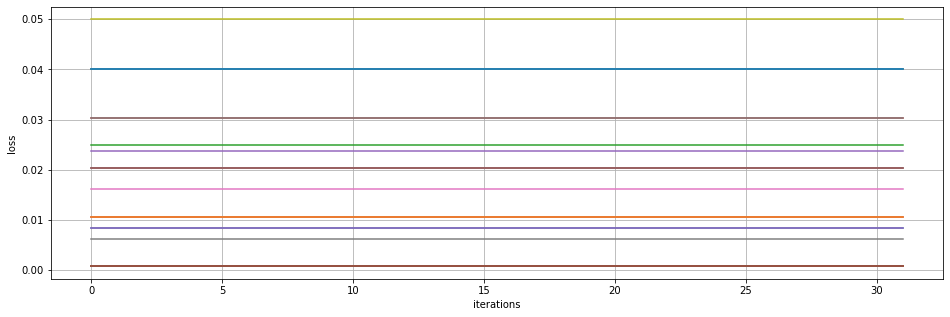

ROME EGJOKSAUE SAABKAOTEWFOASAAS XDCJAPE
---------------
epoch 230
---------------
epoch 235
---------------
epoch 240
-----------------
average loss: 
[[0.00847484]
 [0.01058721]
 [0.02043748]
 [0.03028775]
 [0.01068568]
 [0.00073693]
 [0.02043748]
 [0.03028776]
 [0.04013803]
 [0.00073693]
 [0.00073693]
 [0.01058721]
 [0.02485915]
 [0.04013803]
 [0.00847484]
 [0.02043748]
 [0.00073693]
 [0.00626401]
 [0.04998829]
 [0.04013803]
 [0.04013798]
 [0.00073693]
 [0.00073693]
 [0.00073693]
 [0.02375373]
 [0.00073693]
 [0.01621276]]


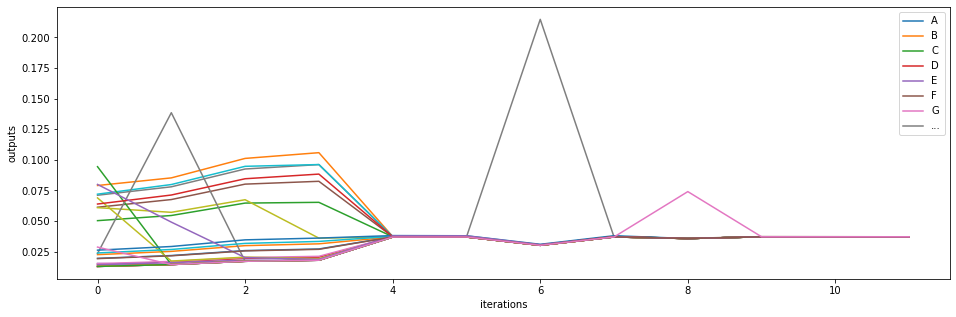

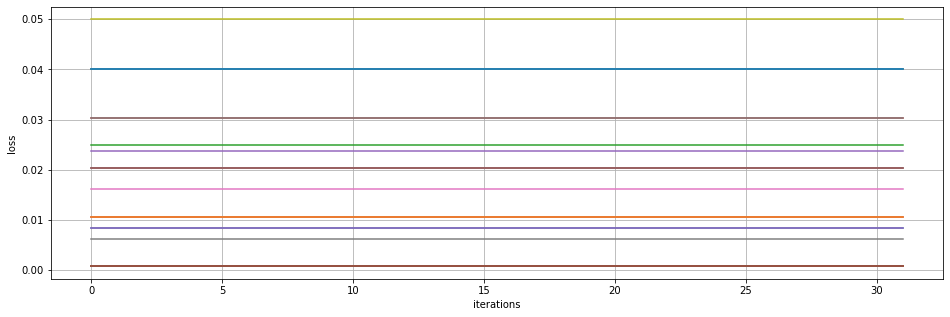

NOME KLGQWOLME ZOOME SOCE BOBORE ML FQVE
---------------
epoch 245
---------------
epoch 250
---------------
epoch 255
-----------------
average loss: 
[[0.00847485]
 [0.01058721]
 [0.02043748]
 [0.03028773]
 [0.01068568]
 [0.00073693]
 [0.02043748]
 [0.03028776]
 [0.04013803]
 [0.00073693]
 [0.00073693]
 [0.01058721]
 [0.02485915]
 [0.04013803]
 [0.00847484]
 [0.02043748]
 [0.00073693]
 [0.00626401]
 [0.04998829]
 [0.04013803]
 [0.04013796]
 [0.00073693]
 [0.00073693]
 [0.00073693]
 [0.02375373]
 [0.00073693]
 [0.01621276]]


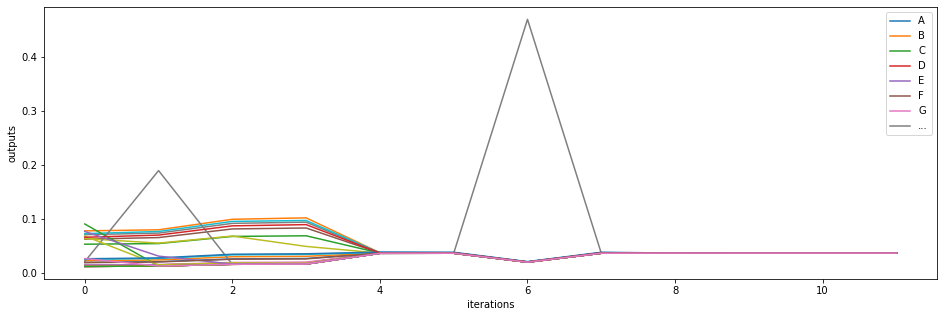

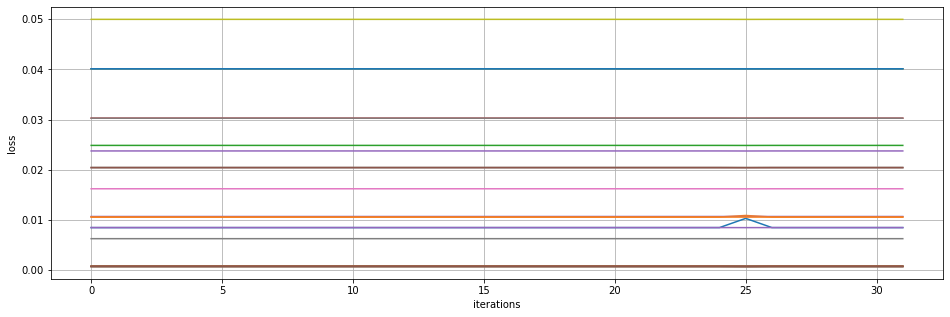

HOME ZAFQOD NALERY MMPEJE  EF PVELHALF A
---------------
epoch 260
---------------
epoch 265
---------------
epoch 270
-----------------
average loss: 
[[0.00847484]
 [0.01058721]
 [0.02043748]
 [0.03028776]
 [0.01068568]
 [0.00073693]
 [0.02043748]
 [0.03028776]
 [0.04013803]
 [0.00073693]
 [0.00073693]
 [0.01058721]
 [0.02485915]
 [0.04013803]
 [0.00847484]
 [0.02043748]
 [0.00073693]
 [0.00626401]
 [0.0499883 ]
 [0.04013803]
 [0.04013797]
 [0.00073693]
 [0.00073693]
 [0.00073693]
 [0.02375373]
 [0.00073693]
 [0.01621276]]


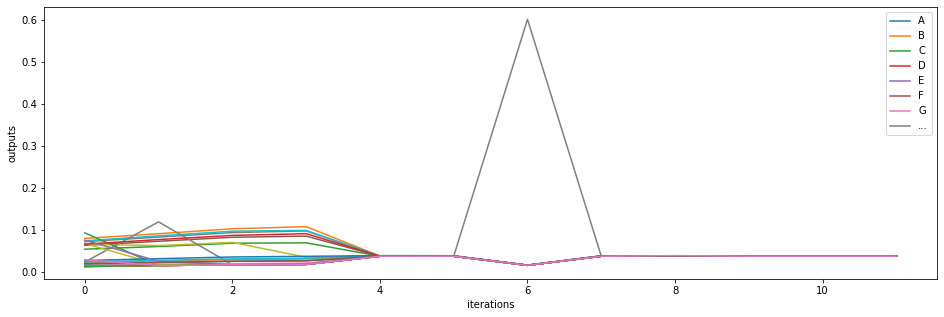

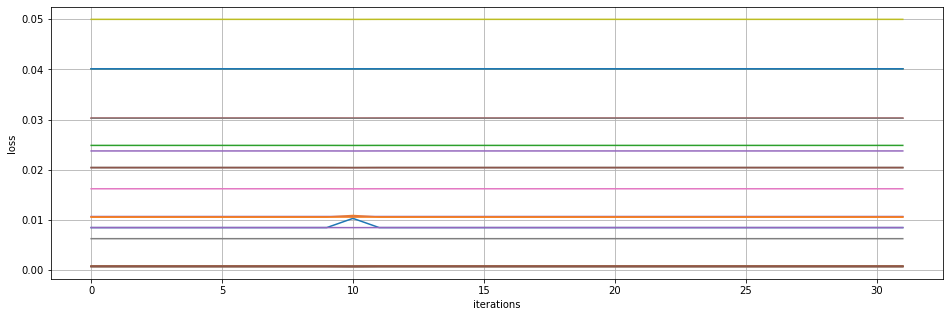

EOCE G OGMR BAVE ZPR AUDRMEAMY HASEVW BO
---------------
epoch 275
---------------
epoch 280
---------------
epoch 285
-----------------
average loss: 
[[0.00847484]
 [0.01058721]
 [0.02043748]
 [0.03028776]
 [0.01068568]
 [0.00073693]
 [0.02043748]
 [0.03028776]
 [0.04013803]
 [0.00073693]
 [0.00073693]
 [0.01058721]
 [0.02485915]
 [0.04013803]
 [0.00847484]
 [0.02043748]
 [0.00073693]
 [0.00626401]
 [0.0499883 ]
 [0.04013803]
 [0.04013799]
 [0.00073693]
 [0.00073693]
 [0.00073693]
 [0.02375373]
 [0.00073693]
 [0.01621276]]


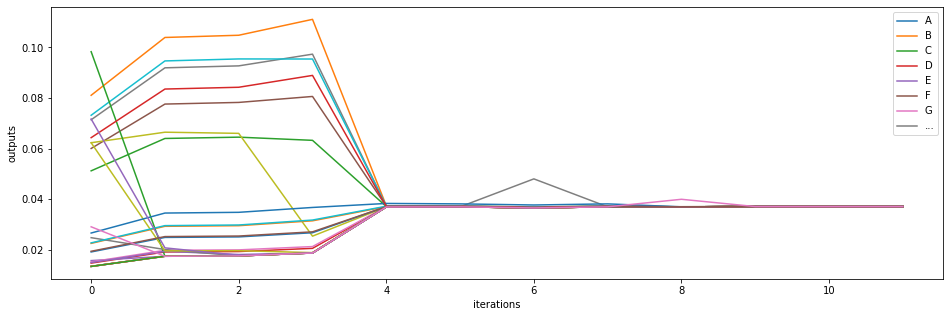

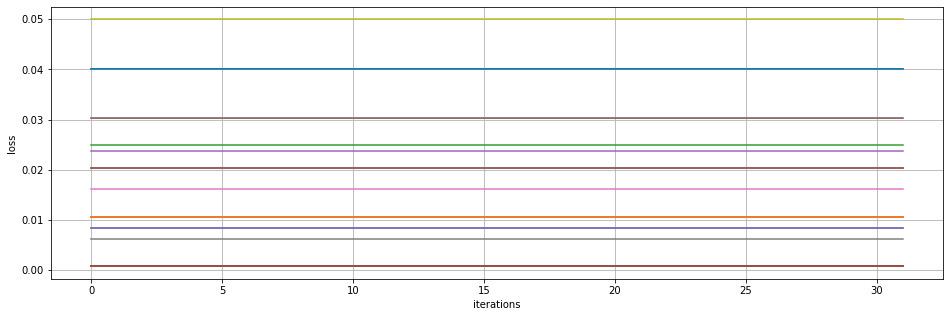

YOME A AJHCUSZEADSAVE ZYGWIGOSJHECVHQWAE
---------------
epoch 290
---------------
epoch 295
---------------
epoch 300
-----------------
average loss: 
[[0.00847484]
 [0.01058721]
 [0.02043748]
 [0.03028776]
 [0.01068568]
 [0.00073693]
 [0.02043748]
 [0.03028776]
 [0.04013803]
 [0.00073693]
 [0.00073693]
 [0.01058721]
 [0.02485915]
 [0.04013803]
 [0.00847484]
 [0.02043748]
 [0.00073693]
 [0.00626401]
 [0.04998831]
 [0.04013803]
 [0.040138  ]
 [0.00073693]
 [0.00073693]
 [0.00073693]
 [0.02375373]
 [0.00073693]
 [0.01621276]]


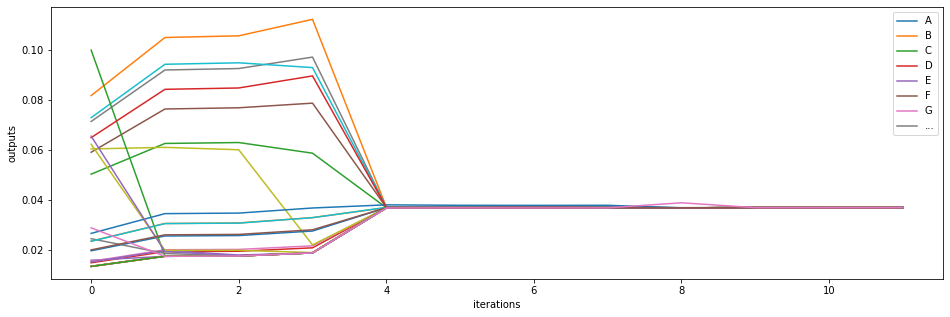

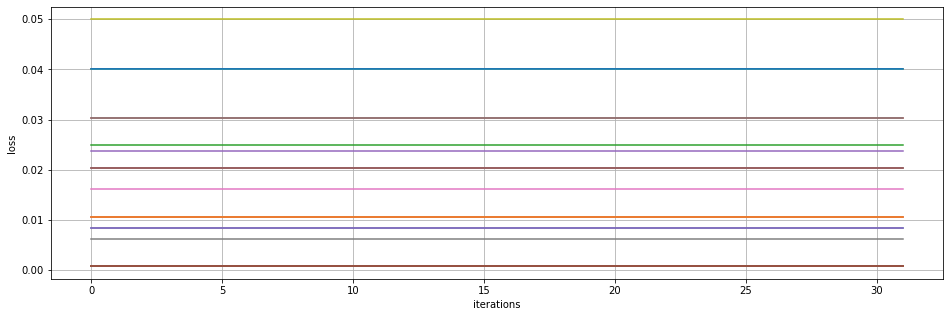

FOME  OXCTUAAVE RUK AKU LNP RZWWJINAPERY
---------------
epoch 305
---------------
epoch 310
---------------
epoch 315
-----------------
average loss: 
[[0.00847484]
 [0.01058721]
 [0.02043748]
 [0.03028776]
 [0.01068568]
 [0.00073693]
 [0.02043748]
 [0.03028776]
 [0.04013803]
 [0.00073693]
 [0.00073693]
 [0.01058721]
 [0.02485915]
 [0.04013803]
 [0.00847484]
 [0.02043748]
 [0.00073693]
 [0.00626401]
 [0.04998831]
 [0.04013803]
 [0.04013802]
 [0.00073693]
 [0.00073693]
 [0.00073693]
 [0.02375373]
 [0.00073693]
 [0.01621276]]


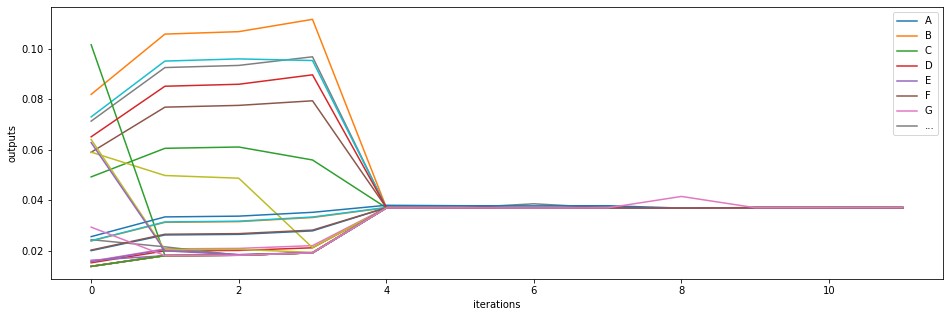

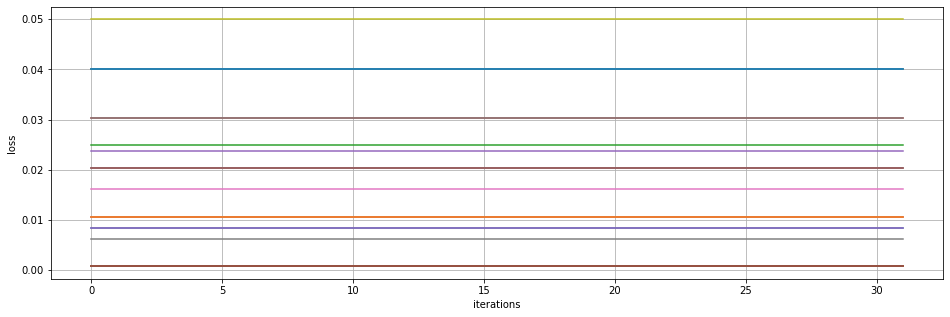

VOME MEMZF PTEKW AHT ABEUCFAXR ANC RFEUO
---------------
epoch 320
---------------
epoch 325
---------------
epoch 330
-----------------
average loss: 
[[0.00847484]
 [0.01058721]
 [0.02043748]
 [0.03028776]
 [0.01068568]
 [0.00073693]
 [0.02043748]
 [0.03028776]
 [0.04013802]
 [0.00073693]
 [0.00073693]
 [0.01058721]
 [0.02485915]
 [0.04013803]
 [0.00847484]
 [0.02043748]
 [0.00073693]
 [0.00626401]
 [0.04998831]
 [0.04013803]
 [0.04013802]
 [0.00073693]
 [0.00073693]
 [0.00073693]
 [0.02375373]
 [0.00073693]
 [0.01621276]]


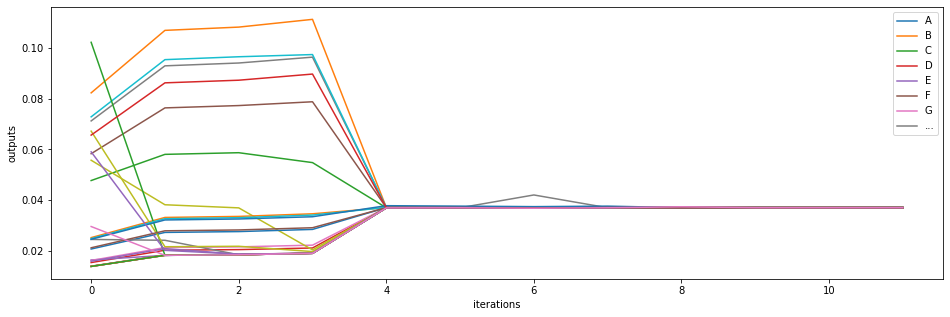

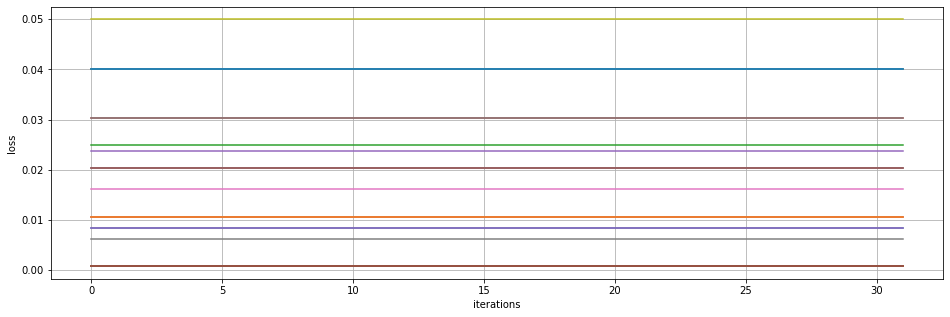

FOME VTBUYVE NAOETQAHCBEKY IAME MV HGPUP
---------------
epoch 335
---------------
epoch 340
---------------
epoch 345
-----------------
average loss: 
[[0.00847484]
 [0.01058721]
 [0.02043748]
 [0.03028776]
 [0.01068568]
 [0.00073693]
 [0.02043748]
 [0.03028776]
 [0.04013803]
 [0.00073693]
 [0.00073693]
 [0.01058721]
 [0.02485915]
 [0.04013803]
 [0.00847484]
 [0.02043748]
 [0.00073693]
 [0.00626401]
 [0.04998831]
 [0.04013803]
 [0.04013802]
 [0.00073693]
 [0.00073693]
 [0.00073693]
 [0.02375373]
 [0.00073693]
 [0.01621276]]


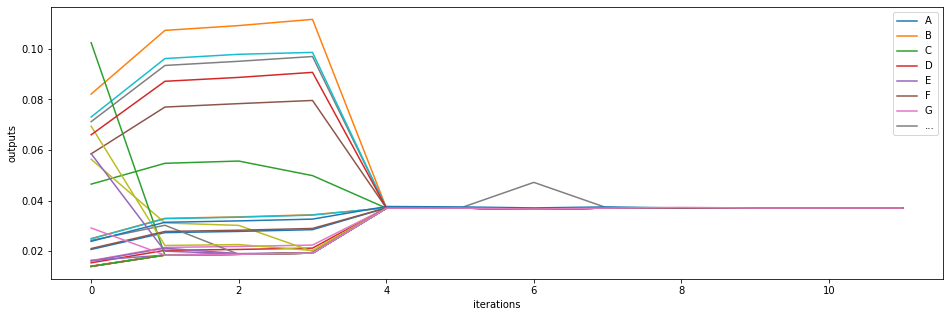

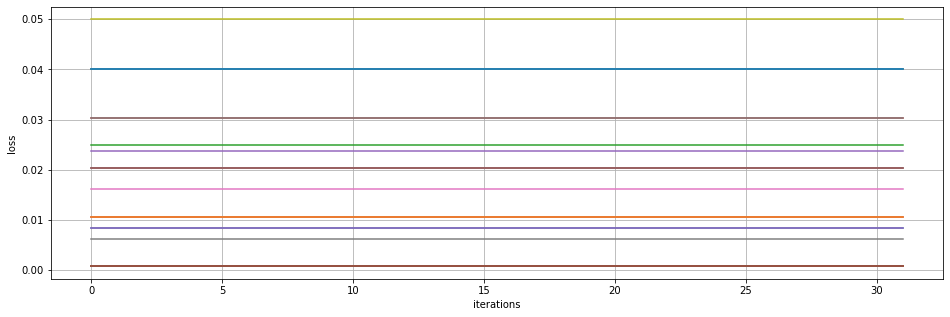

EOYKLAHNZ HOY FOWEOQETOAXG ASOIE MHJME K
---------------
epoch 350
---------------
epoch 355
---------------
epoch 360
-----------------
average loss: 
[[0.00847484]
 [0.01058721]
 [0.02043748]
 [0.03028776]
 [0.01068568]
 [0.00073693]
 [0.02043748]
 [0.03028776]
 [0.04013803]
 [0.00073693]
 [0.00073693]
 [0.01058721]
 [0.02485915]
 [0.04013803]
 [0.00847484]
 [0.02043748]
 [0.00073693]
 [0.00626401]
 [0.04998831]
 [0.04013803]
 [0.04013802]
 [0.00073693]
 [0.00073693]
 [0.00073693]
 [0.02375373]
 [0.00073693]
 [0.01621276]]


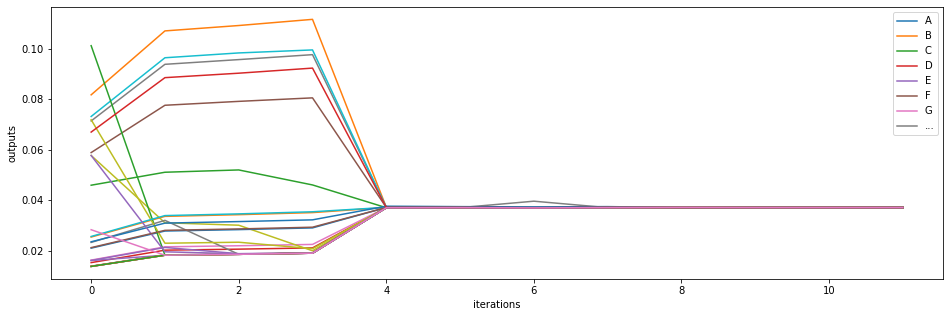

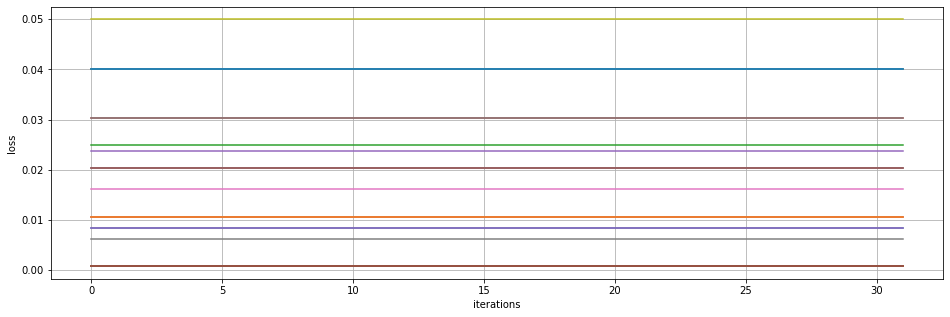

EOUWN AGVRJSA E VAI AKW GMY IADE CHAEFV 
---------------
epoch 365
---------------
epoch 370
---------------
epoch 375
-----------------
average loss: 
[[0.00847484]
 [0.01058721]
 [0.02043748]
 [0.03028776]
 [0.01068568]
 [0.00073693]
 [0.02043748]
 [0.03028776]
 [0.04013803]
 [0.00073693]
 [0.00073693]
 [0.01058721]
 [0.02485915]
 [0.04013803]
 [0.00847484]
 [0.02043748]
 [0.00073693]
 [0.00626401]
 [0.04998831]
 [0.04013803]
 [0.04013802]
 [0.00073693]
 [0.00073693]
 [0.00073693]
 [0.02375373]
 [0.00073693]
 [0.01621276]]


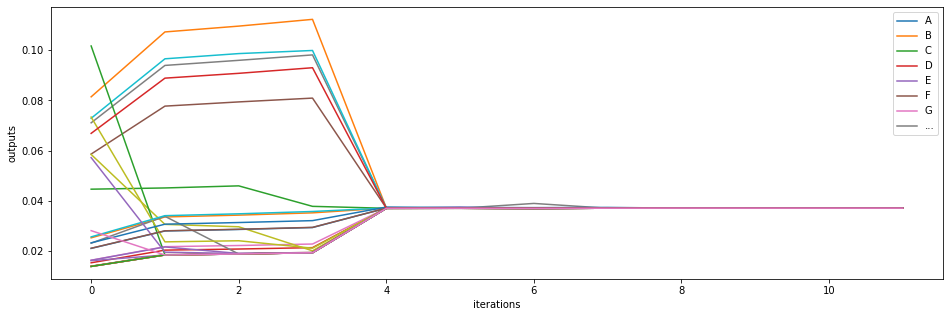

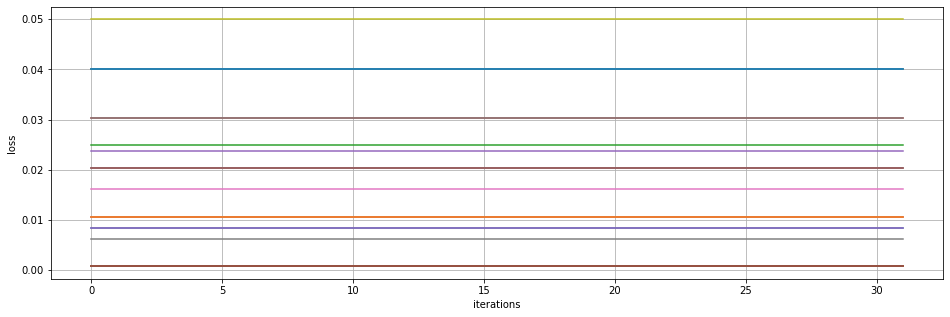

HOME TUCKOHKTQJWPXECLAELZ AIE MLJMSAEEDD
---------------
epoch 380
---------------
epoch 385
---------------
epoch 390
-----------------
average loss: 
[[0.00847484]
 [0.01058721]
 [0.02043748]
 [0.03028776]
 [0.01068568]
 [0.00073693]
 [0.02043748]
 [0.03028776]
 [0.04013803]
 [0.00073693]
 [0.00073693]
 [0.01058721]
 [0.02485915]
 [0.04013803]
 [0.00847484]
 [0.02043748]
 [0.00073693]
 [0.00626401]
 [0.04998831]
 [0.04013803]
 [0.04013802]
 [0.00073693]
 [0.00073693]
 [0.00073693]
 [0.02375373]
 [0.00073693]
 [0.01621276]]


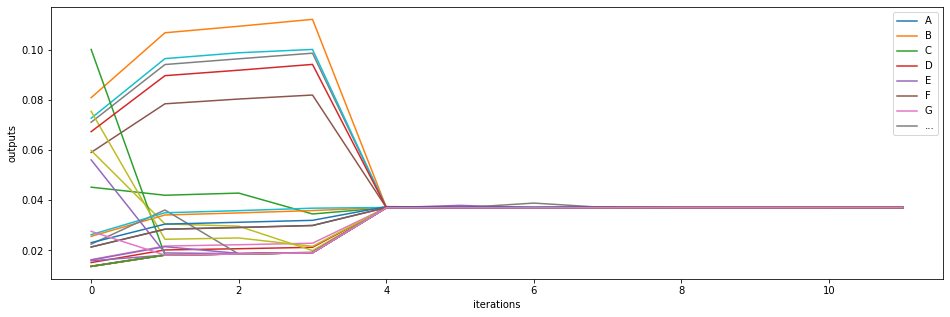

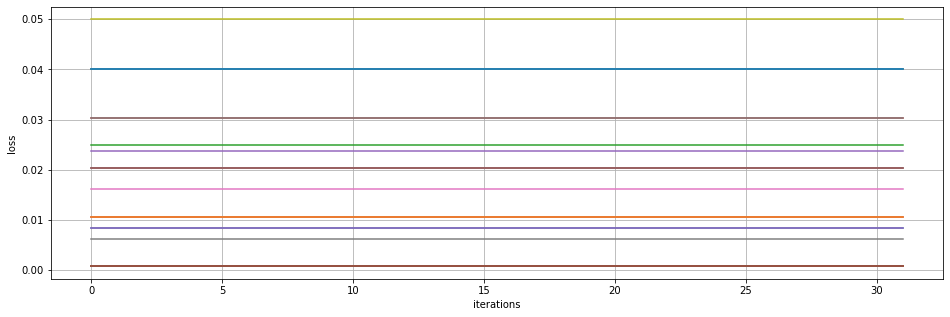

SOME REVSVJASACE HOGRCYAPCJSNKAOJE GJFNR
---------------
epoch 395
---------------
epoch 400
---------------
epoch 405
-----------------
average loss: 
[[0.00847484]
 [0.01058721]
 [0.02043748]
 [0.03028776]
 [0.01068568]
 [0.00073693]
 [0.02043748]
 [0.03028776]
 [0.04013803]
 [0.00073693]
 [0.00073693]
 [0.01058721]
 [0.02485915]
 [0.04013803]
 [0.00847484]
 [0.02043748]
 [0.00073693]
 [0.00626401]
 [0.0499883 ]
 [0.04013803]
 [0.04013802]
 [0.00073693]
 [0.00073693]
 [0.00073693]
 [0.02375373]
 [0.00073693]
 [0.01621276]]


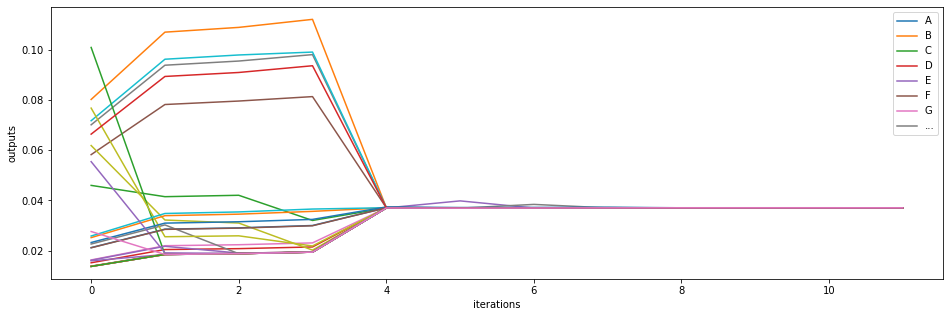

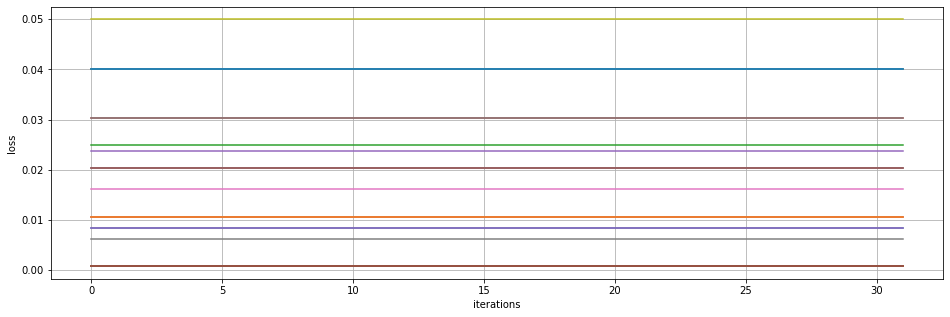

NOME OHPIEHOQHOPSYEKDAZY SOUEJAQLUWNAEXW
---------------
epoch 410
---------------
epoch 415
---------------
epoch 420
-----------------
average loss: 
[[0.00847484]
 [0.01058721]
 [0.02043748]
 [0.03028776]
 [0.01068568]
 [0.00073693]
 [0.02043748]
 [0.03028776]
 [0.04013803]
 [0.00073693]
 [0.00073693]
 [0.01058721]
 [0.02485915]
 [0.04013803]
 [0.00847484]
 [0.02043748]
 [0.00073693]
 [0.00626401]
 [0.0499883 ]
 [0.04013803]
 [0.04013802]
 [0.00073693]
 [0.00073693]
 [0.00073693]
 [0.02375373]
 [0.00073693]
 [0.01621276]]


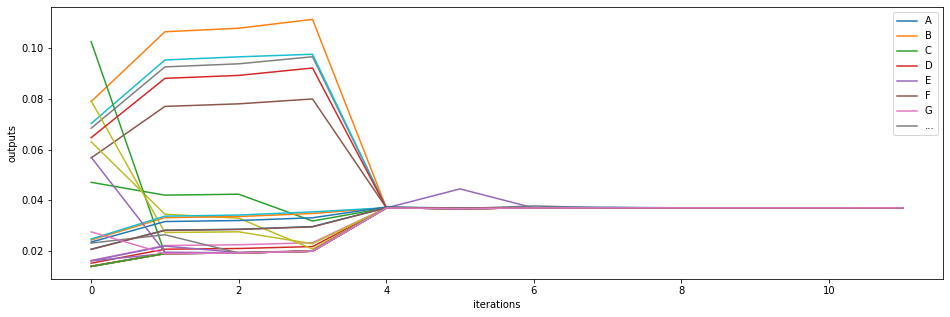

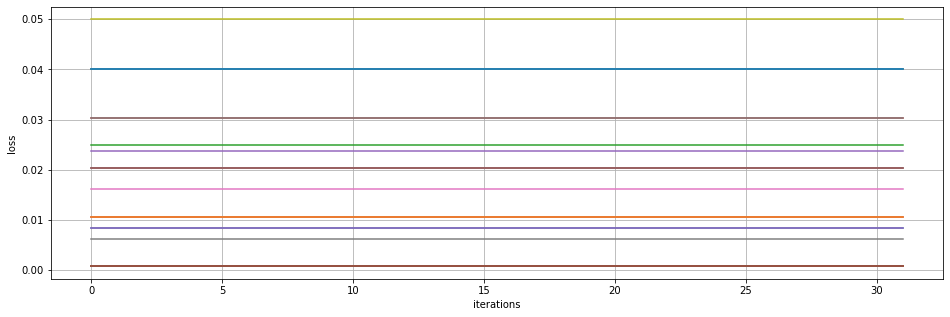

KOME RKISAPE FNVCJCEUOY XOS VJDNGCEYFH X
---------------
epoch 425
---------------
epoch 430
---------------
epoch 435
-----------------
average loss: 
[[0.00847484]
 [0.01058721]
 [0.02043748]
 [0.03028776]
 [0.01068568]
 [0.00073693]
 [0.02043748]
 [0.03028776]
 [0.04013803]
 [0.00073693]
 [0.00073693]
 [0.01058721]
 [0.02485915]
 [0.04013803]
 [0.00847484]
 [0.02043748]
 [0.00073693]
 [0.00626401]
 [0.0499883 ]
 [0.04013803]
 [0.04013802]
 [0.00073693]
 [0.00073693]
 [0.00073693]
 [0.02375373]
 [0.00073693]
 [0.01621276]]


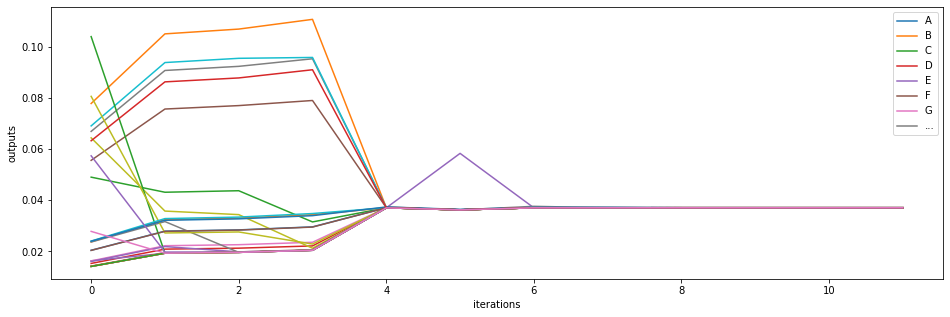

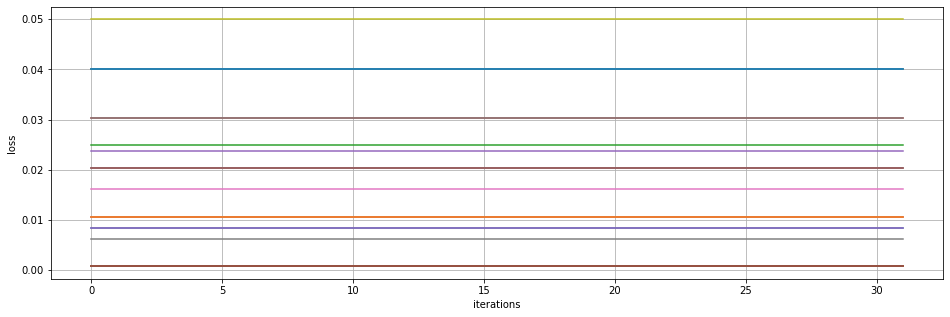

KOME FDLWFSASJNECUJTEAIMZ VWDDLQ TFOSJFE
---------------
epoch 440
---------------
epoch 445
---------------
epoch 450
-----------------
average loss: 
[[0.00847484]
 [0.01058721]
 [0.02043748]
 [0.03028776]
 [0.01068568]
 [0.00073693]
 [0.02043748]
 [0.03028776]
 [0.04013803]
 [0.00073693]
 [0.00073693]
 [0.01058721]
 [0.02485915]
 [0.04013803]
 [0.00847484]
 [0.02043748]
 [0.00073693]
 [0.00626401]
 [0.0499883 ]
 [0.04013803]
 [0.04013802]
 [0.00073693]
 [0.00073693]
 [0.00073693]
 [0.02375373]
 [0.00073693]
 [0.01621276]]


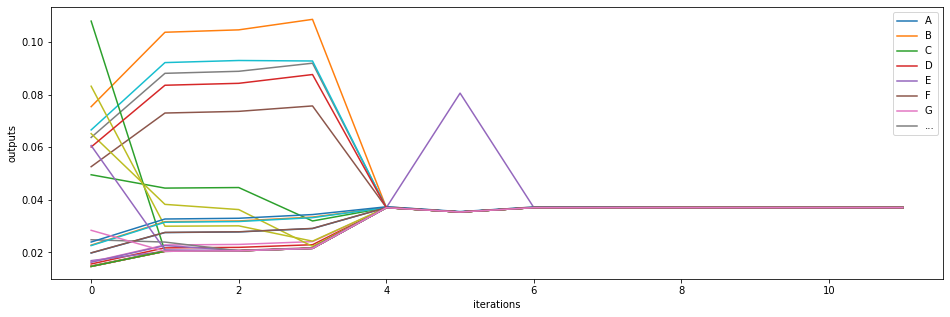

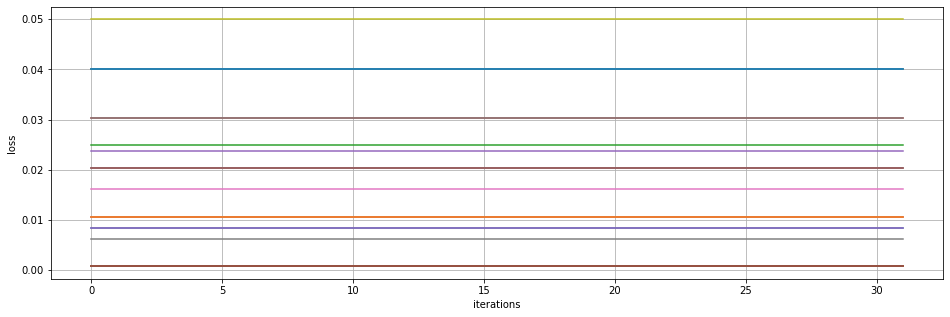

JOME  OBAOTCKKUOENH WOME MMKEQUME TBAJE 
---------------
epoch 455
---------------
epoch 460
---------------
epoch 465
-----------------
average loss: 
[[0.00847484]
 [0.01058721]
 [0.02043748]
 [0.03028776]
 [0.01068568]
 [0.00073693]
 [0.02043748]
 [0.03028776]
 [0.04013803]
 [0.00073693]
 [0.00073693]
 [0.01058721]
 [0.02485915]
 [0.04013803]
 [0.00847484]
 [0.02043748]
 [0.00073693]
 [0.00626401]
 [0.0499883 ]
 [0.04013803]
 [0.04013802]
 [0.00073693]
 [0.00073693]
 [0.00073693]
 [0.02375373]
 [0.00073693]
 [0.01621276]]


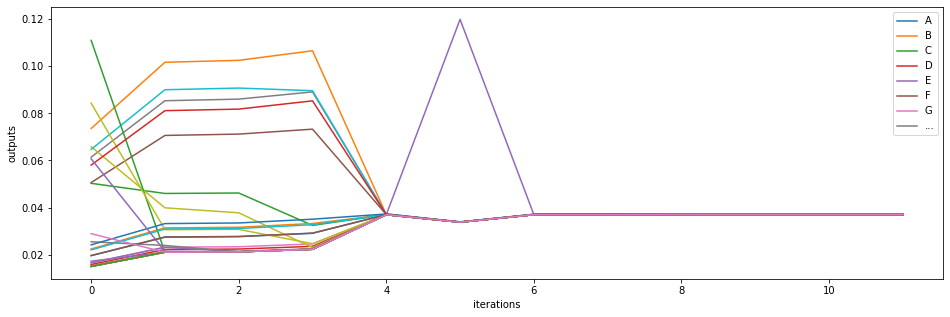

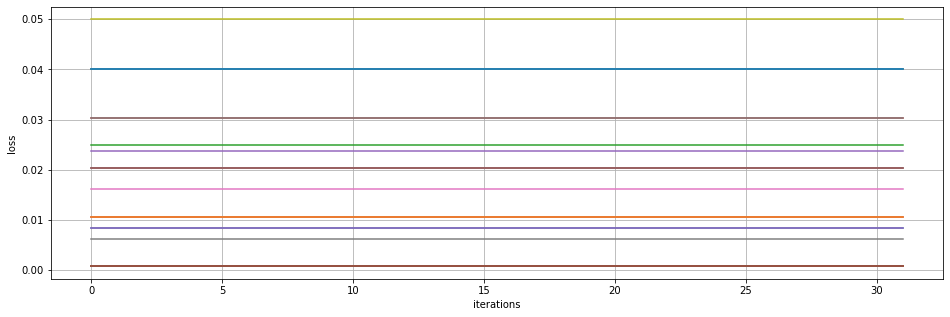

QOME PCEVWIAME QY AKK APQJEKVTNAXEEPY CK
---------------
epoch 470
---------------
epoch 475
---------------
epoch 480
-----------------
average loss: 
[[0.00847484]
 [0.01058721]
 [0.02043748]
 [0.03028776]
 [0.01068568]
 [0.00073693]
 [0.02043748]
 [0.03028776]
 [0.04013803]
 [0.00073693]
 [0.00073693]
 [0.01058721]
 [0.02485915]
 [0.04013803]
 [0.00847484]
 [0.02043748]
 [0.00073693]
 [0.00626401]
 [0.0499883 ]
 [0.04013803]
 [0.04013802]
 [0.00073693]
 [0.00073693]
 [0.00073693]
 [0.02375373]
 [0.00073693]
 [0.01621276]]


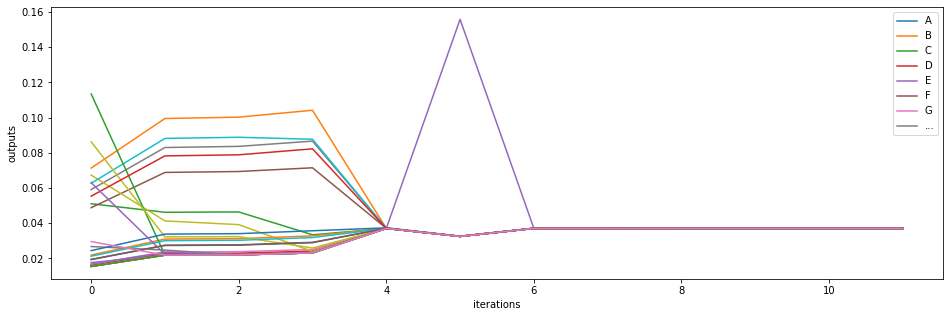

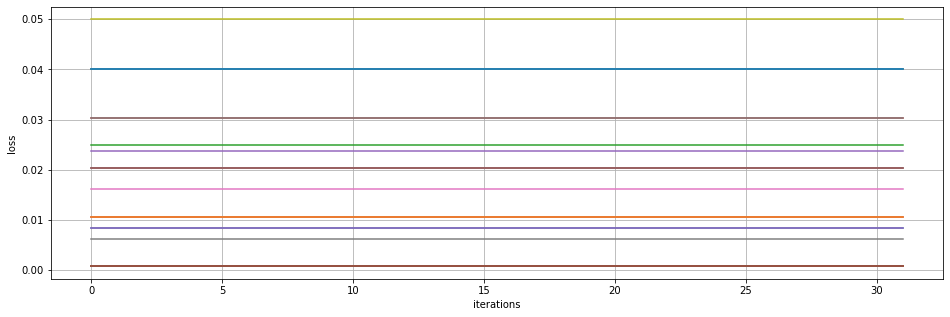

VOIE MWNYYTESTE POKSATE GFLYQBASNJ SOME 
---------------
epoch 485
---------------
epoch 490
---------------
epoch 495
-----------------
average loss: 
[[0.00847484]
 [0.01058721]
 [0.02043748]
 [0.03028776]
 [0.01068568]
 [0.00073693]
 [0.02043748]
 [0.03028776]
 [0.04013803]
 [0.00073693]
 [0.00073693]
 [0.01058721]
 [0.02485915]
 [0.04013803]
 [0.00847484]
 [0.02043748]
 [0.00073693]
 [0.00626401]
 [0.0499883 ]
 [0.04013803]
 [0.04013802]
 [0.00073693]
 [0.00073693]
 [0.00073693]
 [0.02375373]
 [0.00073693]
 [0.01621276]]


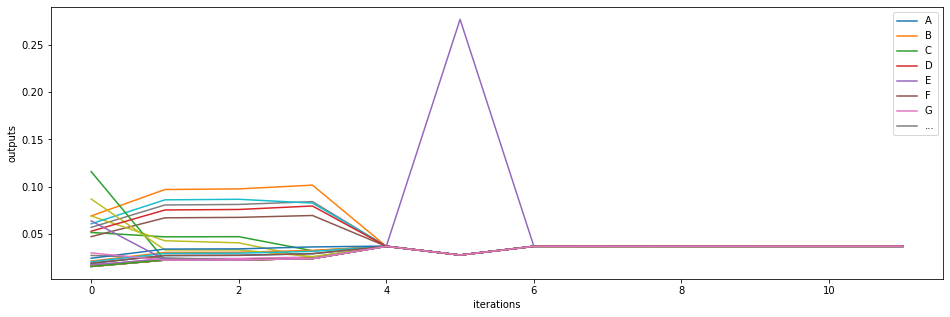

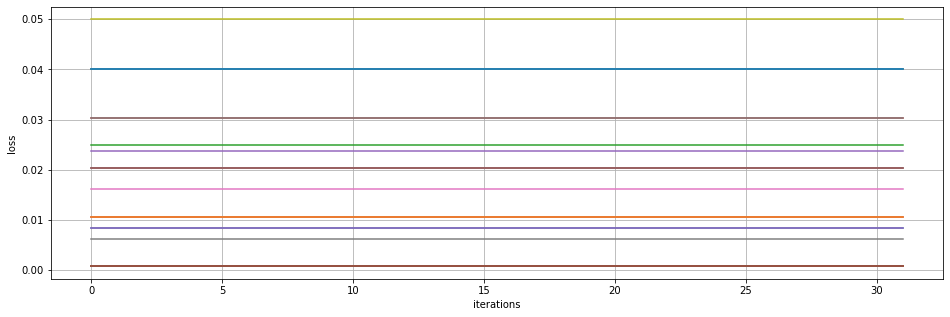

JOME WXOUCU AWX NIICEDS QS HZQEDKI ADULW
---------------
epoch 500
---------------
epoch 505
---------------
epoch 510
-----------------
average loss: 
[[0.00847484]
 [0.01058721]
 [0.02043748]
 [0.03028776]
 [0.01068568]
 [0.00073693]
 [0.02043748]
 [0.03028776]
 [0.04013803]
 [0.00073693]
 [0.00073693]
 [0.01058721]
 [0.02485915]
 [0.04013803]
 [0.00847484]
 [0.02043748]
 [0.00073693]
 [0.00626401]
 [0.0499883 ]
 [0.04013803]
 [0.04013802]
 [0.00073693]
 [0.00073693]
 [0.00073693]
 [0.02375373]
 [0.00073693]
 [0.01621276]]


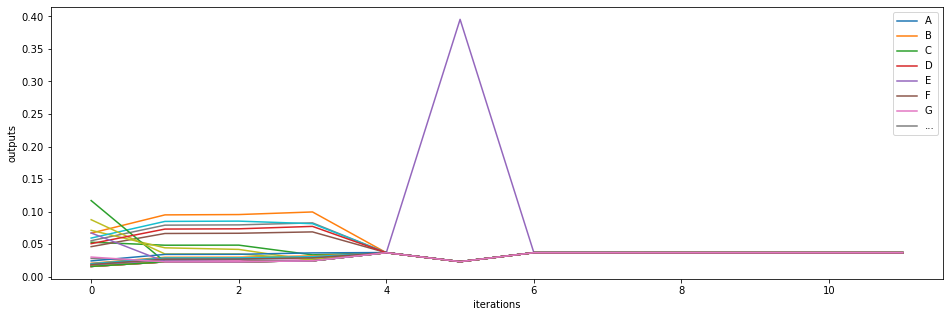

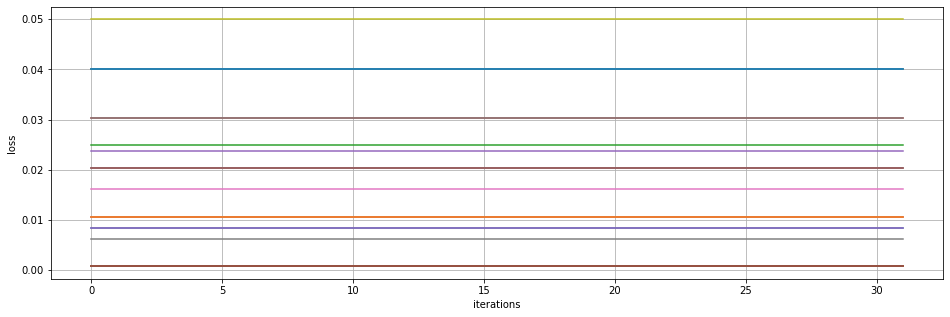

POME MFVHLPYEP VESAOW AZU  OOTECTAWL AAM
---------------
epoch 515
---------------
epoch 520
---------------
epoch 525
-----------------
average loss: 
[[0.00847484]
 [0.01058721]
 [0.02043748]
 [0.03028776]
 [0.01068568]
 [0.00073693]
 [0.02043748]
 [0.03028776]
 [0.04013803]
 [0.00073693]
 [0.00073693]
 [0.01058721]
 [0.02485915]
 [0.04013803]
 [0.00847484]
 [0.02043748]
 [0.00073693]
 [0.00626401]
 [0.04998829]
 [0.04013803]
 [0.04013802]
 [0.00073693]
 [0.00073693]
 [0.00073693]
 [0.02375373]
 [0.00073693]
 [0.01621276]]


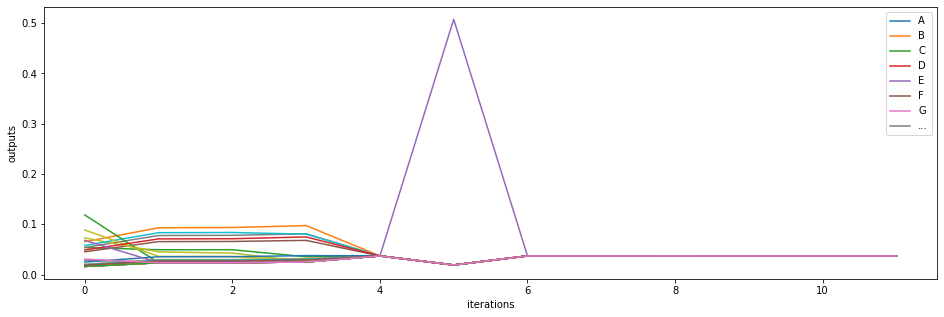

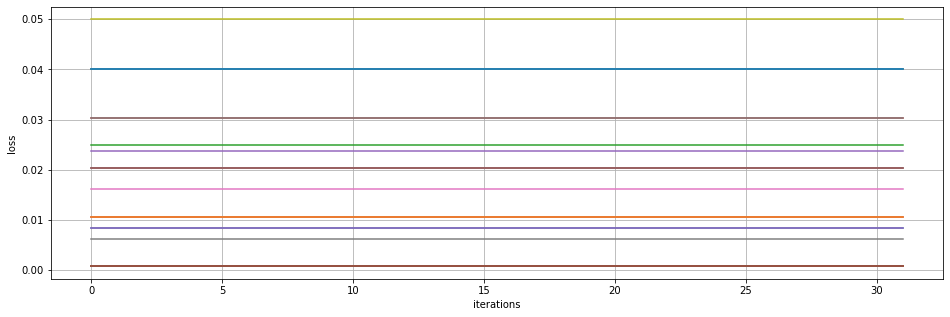

KOME MFWHSXESPAEB O FX GBOXGAHEZW KSALE 
---------------
epoch 530
---------------
epoch 535
---------------
epoch 540
-----------------
average loss: 
[[0.00847484]
 [0.01058721]
 [0.02043748]
 [0.03028776]
 [0.01068568]
 [0.00073693]
 [0.02043748]
 [0.03028776]
 [0.04013803]
 [0.00073693]
 [0.00073693]
 [0.01058721]
 [0.02485915]
 [0.04013803]
 [0.00847484]
 [0.02043748]
 [0.00073693]
 [0.00626401]
 [0.0499883 ]
 [0.04013803]
 [0.04013802]
 [0.00073693]
 [0.00073693]
 [0.00073693]
 [0.02375373]
 [0.00073693]
 [0.01621276]]


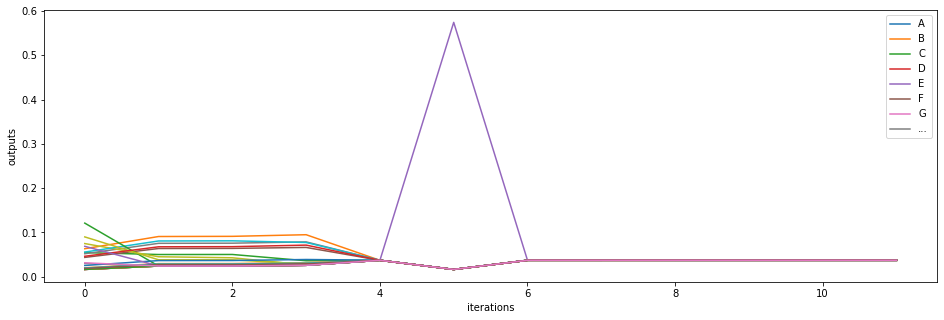

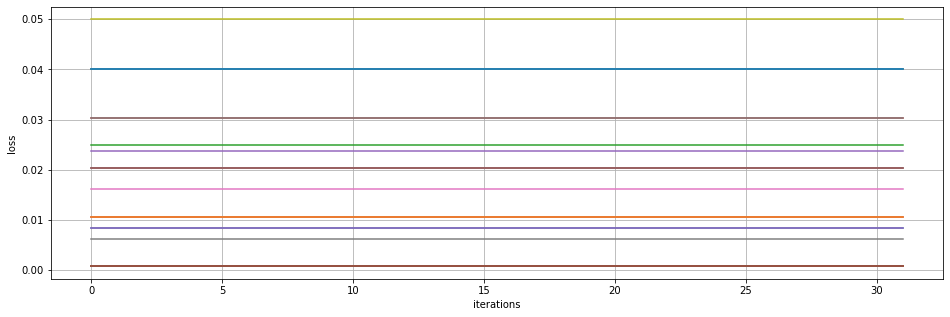

EOLE BOSMY TOVECM  MIAGEME XQAJJCXERS VJ
---------------
epoch 545
---------------
epoch 550
---------------
epoch 555
-----------------
average loss: 
[[0.00847484]
 [0.01058721]
 [0.02043748]
 [0.03028776]
 [0.01068568]
 [0.00073693]
 [0.02043748]
 [0.03028776]
 [0.04013803]
 [0.00073693]
 [0.00073693]
 [0.01058721]
 [0.02485914]
 [0.04013803]
 [0.00847484]
 [0.02043748]
 [0.00073693]
 [0.00626401]
 [0.04998829]
 [0.04013803]
 [0.04013803]
 [0.00073693]
 [0.00073693]
 [0.00073693]
 [0.02375373]
 [0.00073693]
 [0.01621276]]


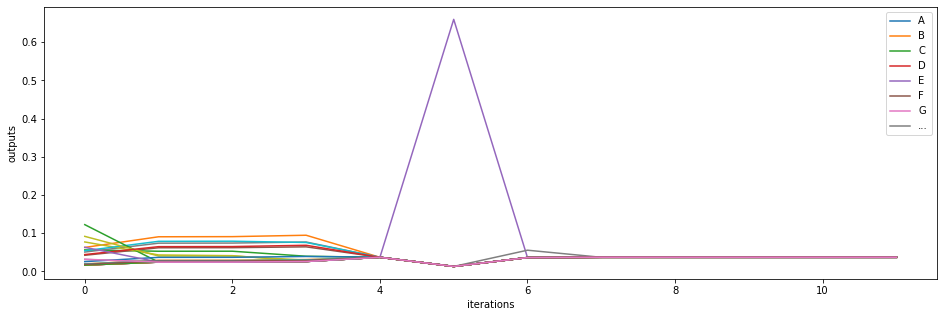

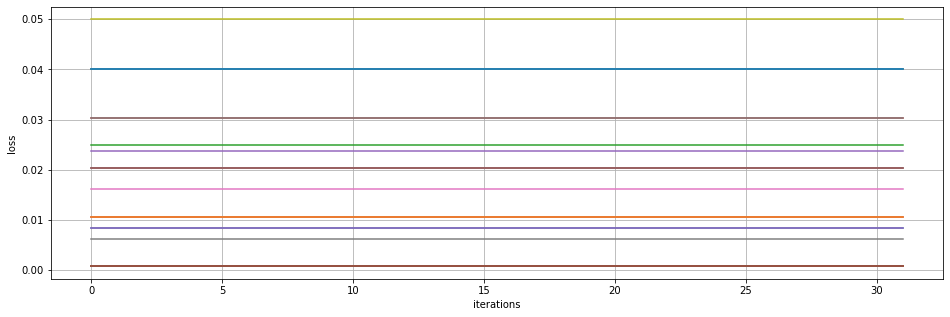

ROME MSXJE IRRBA SDJERY MBABEWNC KOLESK 
---------------
epoch 560
---------------
epoch 565
---------------
epoch 570
-----------------
average loss: 
[[0.00847484]
 [0.01058721]
 [0.02043748]
 [0.03028776]
 [0.01068568]
 [0.00073693]
 [0.02043748]
 [0.03028776]
 [0.04013803]
 [0.00073693]
 [0.00073693]
 [0.01058721]
 [0.02485915]
 [0.04013803]
 [0.00847484]
 [0.02043748]
 [0.00073693]
 [0.00626401]
 [0.04998828]
 [0.04013803]
 [0.04013803]
 [0.00073693]
 [0.00073693]
 [0.00073693]
 [0.02375373]
 [0.00073693]
 [0.01621276]]


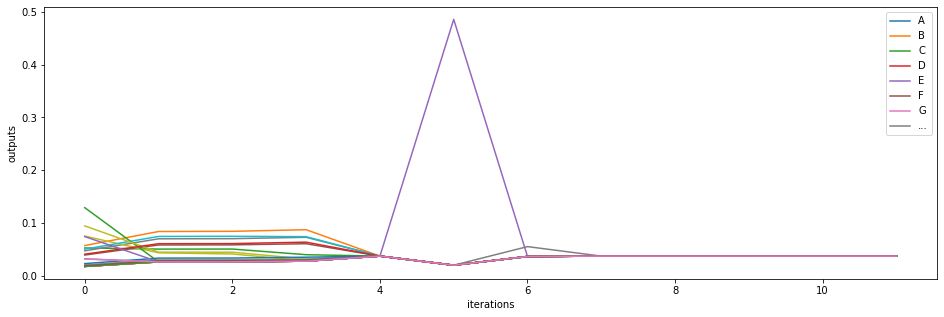

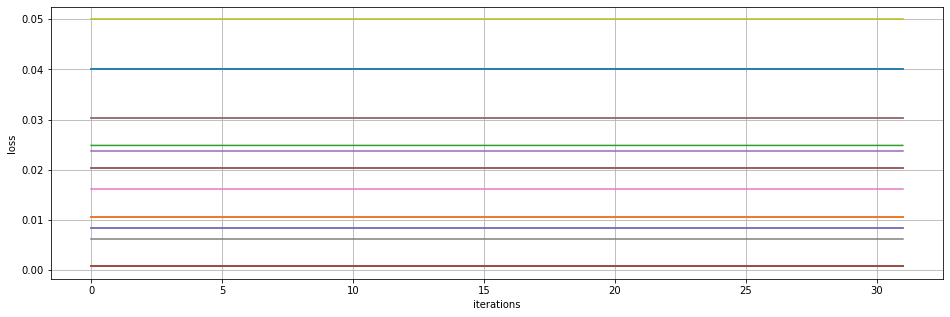

VOAECHN KCETY WAWE UB BMPATEXY MS SOBE M
---------------
epoch 575
---------------
epoch 580
---------------
epoch 585
-----------------
average loss: 
[[0.00847484]
 [0.01058721]
 [0.02043748]
 [0.03028776]
 [0.01068568]
 [0.00073693]
 [0.02043748]
 [0.03028776]
 [0.04013803]
 [0.00073693]
 [0.00073693]
 [0.01058721]
 [0.02485915]
 [0.04013803]
 [0.00847484]
 [0.02043748]
 [0.00073693]
 [0.00626401]
 [0.04998828]
 [0.04013803]
 [0.04013801]
 [0.00073693]
 [0.00073693]
 [0.00073693]
 [0.02375373]
 [0.00073693]
 [0.01621276]]


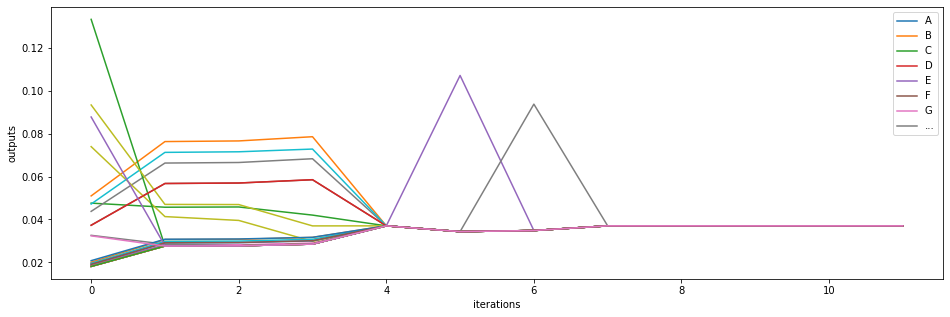

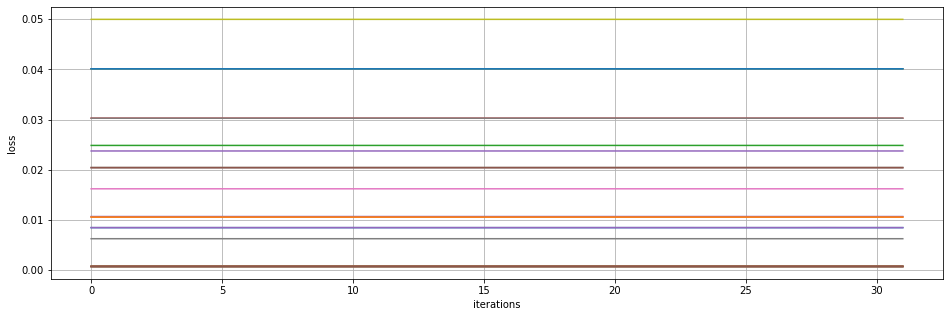

LOME MD FQRE MGFEJHTHLLRE CAOJEUWS AUUYF
---------------
epoch 590
---------------
epoch 595
---------------
epoch 600
-----------------
average loss: 
[[0.00847484]
 [0.01058721]
 [0.02043748]
 [0.03028776]
 [0.01068568]
 [0.00073693]
 [0.02043748]
 [0.03028776]
 [0.04013803]
 [0.00073693]
 [0.00073693]
 [0.01058721]
 [0.02485915]
 [0.04013803]
 [0.00847485]
 [0.02043747]
 [0.00073693]
 [0.00626401]
 [0.04998829]
 [0.04013803]
 [0.04013802]
 [0.00073693]
 [0.00073693]
 [0.00073693]
 [0.02375373]
 [0.00073693]
 [0.01621276]]


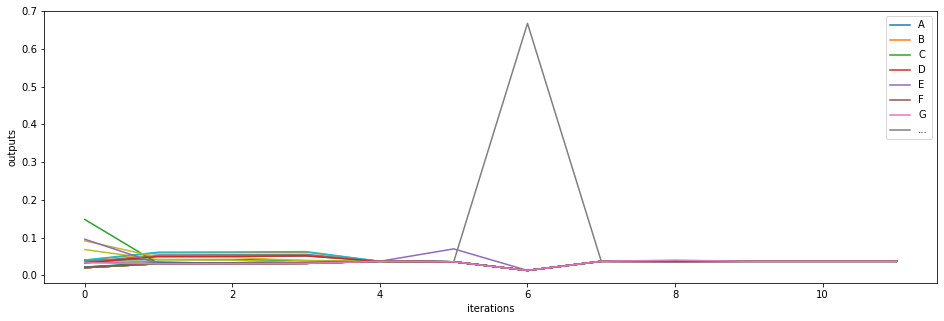

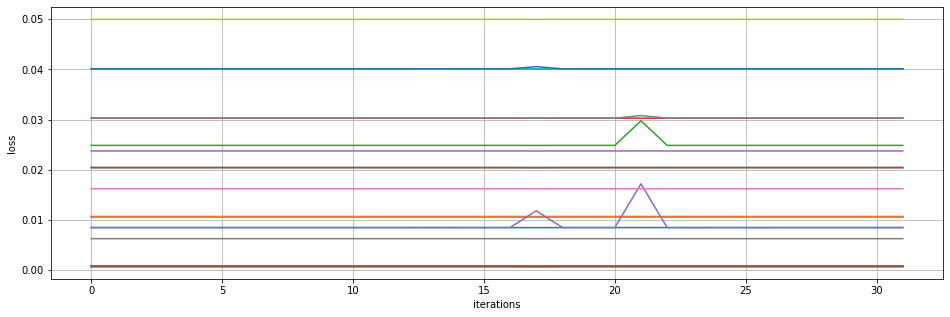

XOME RQRMQIAUEEPY JAQCLHYKARD SOME IODRJ
---------------
epoch 605
---------------
epoch 610
---------------
epoch 615
-----------------
average loss: 
[[0.00846355]
 [0.01057591]
 [0.02042618]
 [0.03027646]
 [0.01067483]
 [0.00072563]
 [0.02042619]
 [0.03027646]
 [0.04012673]
 [0.00072563]
 [0.00072563]
 [0.01057591]
 [0.02484785]
 [0.04012673]
 [0.01155669]
 [0.02042617]
 [0.00072563]
 [0.00625272]
 [0.04997722]
 [0.04012728]
 [0.04053218]
 [0.00072563]
 [0.00072563]
 [0.00072563]
 [0.02374243]
 [0.00072563]
 [0.01620146]]


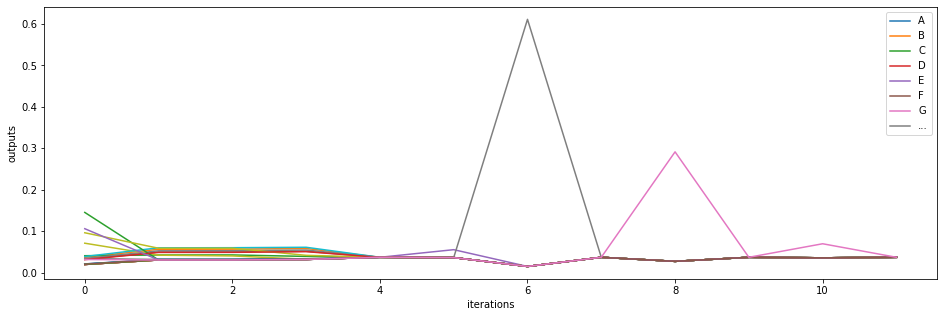

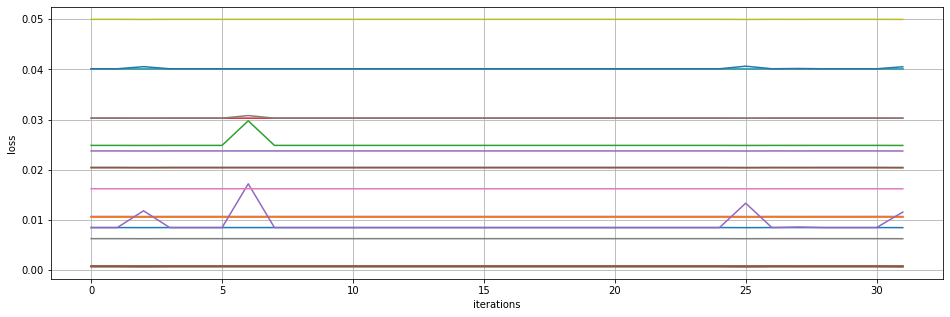

POME MIMEBFADOUUE ADI ATG WDJEPC AAJI AE
---------------
epoch 620
---------------
epoch 625
---------------
epoch 630
-----------------
average loss: 
[[0.00847425]
 [0.01058661]
 [0.02043689]
 [0.03028715]
 [0.01069981]
 [0.00073634]
 [0.02043689]
 [0.03028717]
 [0.04013744]
 [0.00073634]
 [0.00073634]
 [0.01058661]
 [0.02485898]
 [0.04013744]
 [0.00847425]
 [0.02043685]
 [0.00073634]
 [0.00626343]
 [0.04998764]
 [0.04013744]
 [0.04006632]
 [0.00073634]
 [0.00073634]
 [0.00073634]
 [0.02375314]
 [0.00073634]
 [0.01621217]]


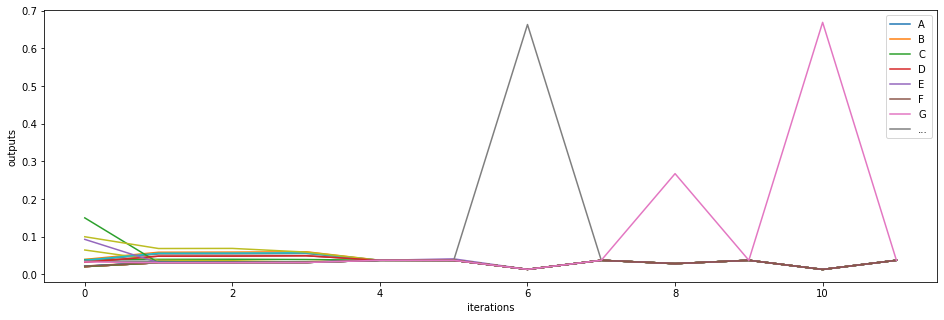

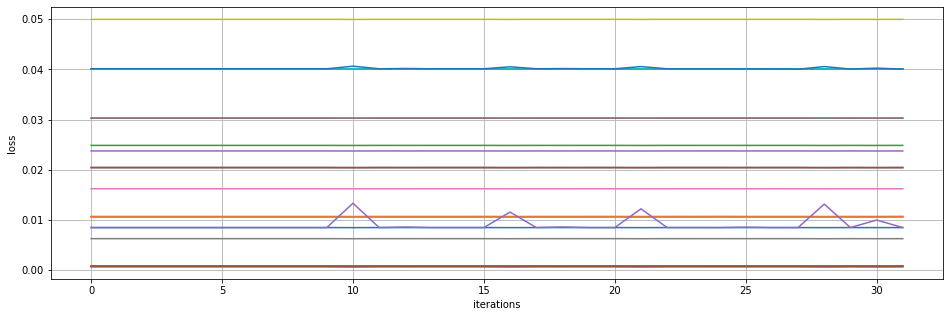

POME MEOHKAUUDU QRIABOUEB KBOLIRFAJUYWPA
---------------
epoch 635
---------------
epoch 640
---------------
epoch 645
-----------------
average loss: 
[[0.00846476]
 [0.01057712]
 [0.02042741]
 [0.03027767]
 [0.01067635]
 [0.00072685]
 [0.0204274 ]
 [0.03027767]
 [0.04012793]
 [0.00072685]
 [0.00072685]
 [0.01057712]
 [0.02484908]
 [0.04012795]
 [0.00856344]
 [0.02042739]
 [0.00072685]
 [0.00625393]
 [0.04997728]
 [0.04012798]
 [0.03435044]
 [0.00072685]
 [0.00072685]
 [0.00072685]
 [0.02374365]
 [0.00072685]
 [0.01620267]]


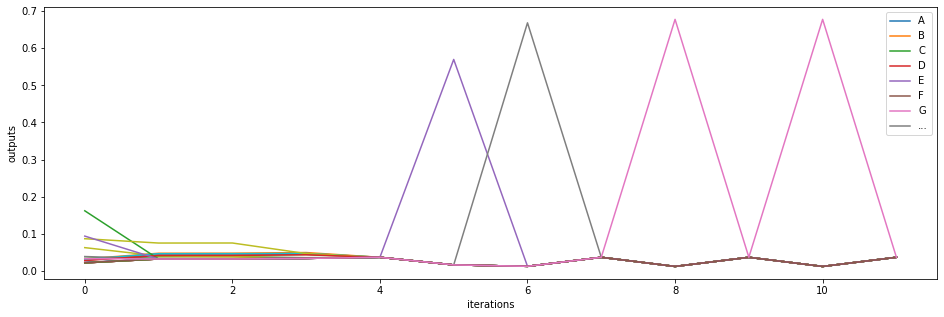

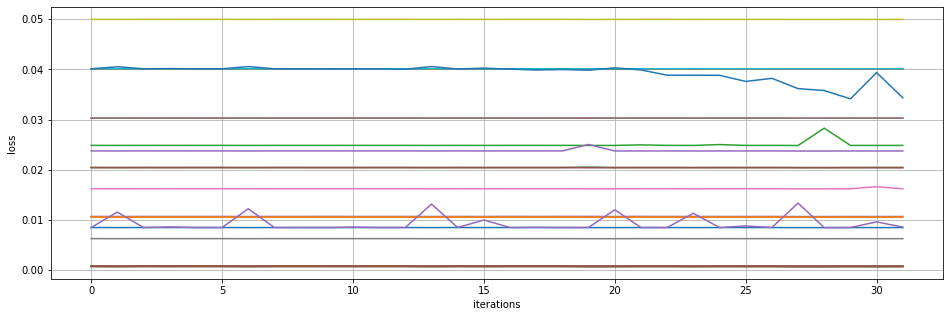

TTZY HOBHERY IOQME KQMZ MF IY ZOME MYN D
---------------
epoch 650
---------------
epoch 655
---------------
epoch 660
-----------------
average loss: 
[[0.00844977]
 [0.01056187]
 [0.02041216]
 [0.03026243]
 [0.01066169]
 [0.0007116 ]
 [0.02041215]
 [0.03026243]
 [0.04011269]
 [0.0007116 ]
 [0.0007116 ]
 [0.01056187]
 [0.02483383]
 [0.0401127 ]
 [0.00844962]
 [0.02041214]
 [0.0007116 ]
 [0.00623871]
 [0.04995034]
 [0.04011272]
 [0.02311952]
 [0.0007116 ]
 [0.0007116 ]
 [0.0007116 ]
 [0.0237284 ]
 [0.0007116 ]
 [0.01619152]]


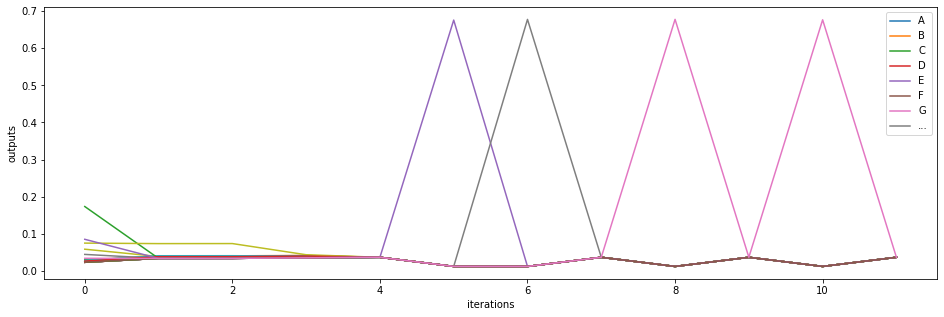

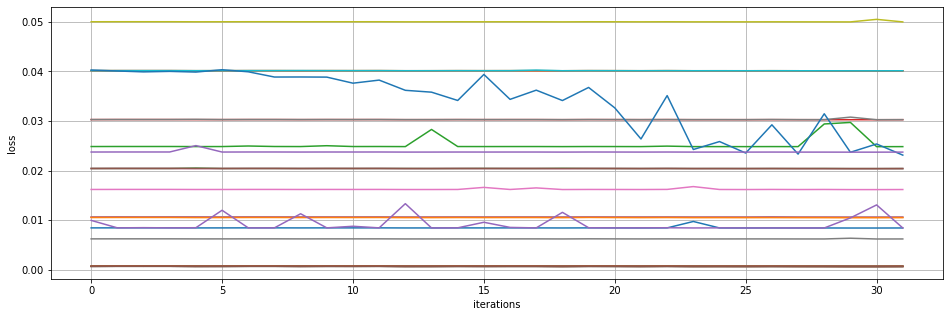

ZOWEXI ATABVW TKIAZK PWJECY LAWLPCEEY TA
---------------
epoch 665
---------------
epoch 670
---------------
epoch 675
-----------------
average loss: 
[[0.00843067]
 [0.01054837]
 [0.0203933 ]
 [0.03024358]
 [0.0106415 ]
 [0.00069275]
 [0.0203933 ]
 [0.03024358]
 [0.04009385]
 [0.00069275]
 [0.00069275]
 [0.01054303]
 [0.02536582]
 [0.04009387]
 [0.0084356 ]
 [0.02039328]
 [0.00069275]
 [0.01861127]
 [0.04994411]
 [0.04054403]
 [0.01399356]
 [0.00069275]
 [0.00069275]
 [0.00069275]
 [0.02370955]
 [0.00069275]
 [0.01616868]]


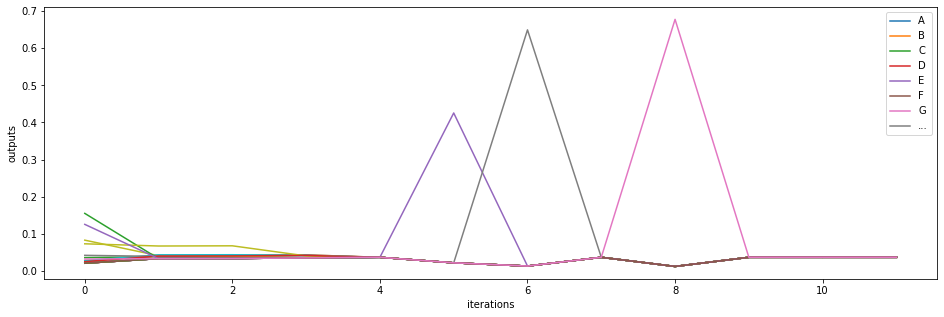

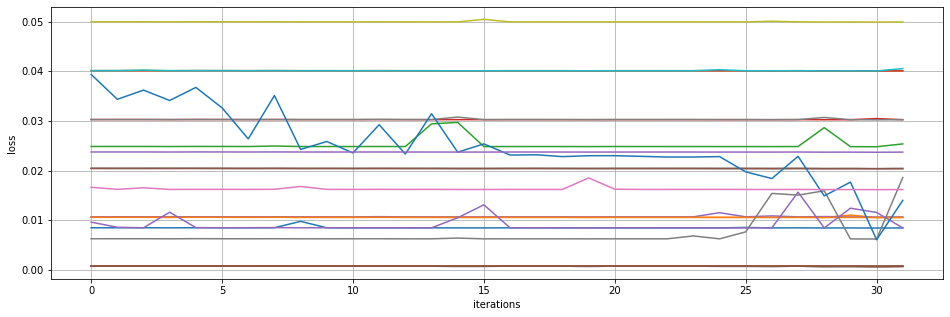

ERL APTXEHUWE LLVIARS AKN A LB HWOOEKF A
---------------
epoch 680
---------------
epoch 685
---------------
epoch 690
-----------------
average loss: 
[[0.00842304]
 [0.01053539]
 [0.02038567]
 [0.03023594]
 [0.01063386]
 [0.00068512]
 [0.02038567]
 [0.03023594]
 [0.0400862 ]
 [0.00068512]
 [0.00068512]
 [0.01053539]
 [0.0248074 ]
 [0.04008622]
 [0.00842311]
 [0.02038554]
 [0.00068512]
 [0.00621648]
 [0.04993647]
 [0.04008623]
 [0.00511097]
 [0.00068512]
 [0.00068512]
 [0.00068512]
 [0.02370192]
 [0.00068512]
 [0.01616095]]


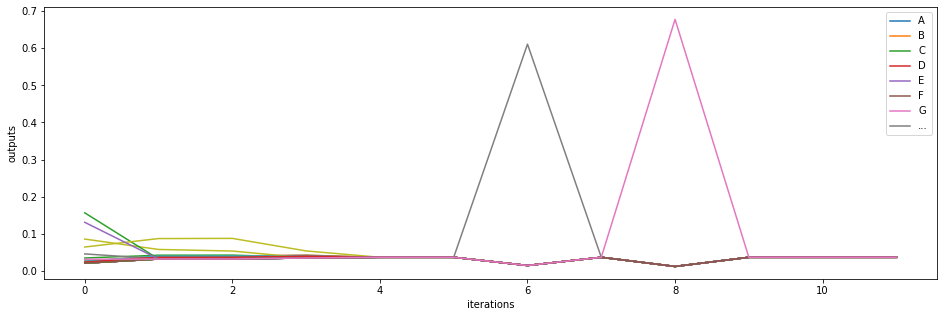

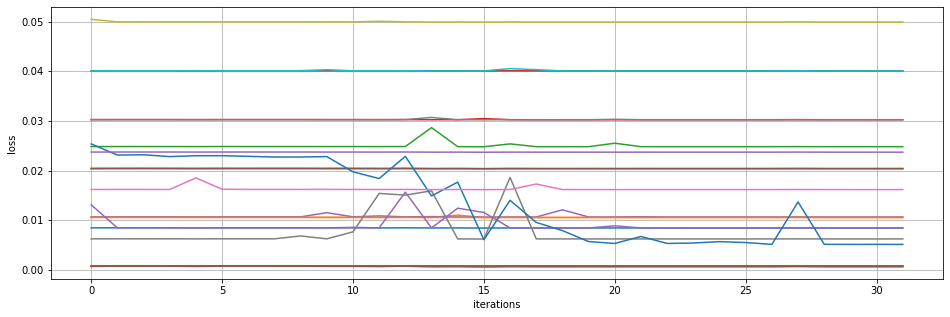

GON AARQ ANT KNAHLOSEPY ONBLOSPJYAQUKU I
---------------
epoch 695
---------------
epoch 700
---------------
epoch 705
-----------------
average loss: 
[[0.00842303]
 [0.01053538]
 [0.02038566]
 [0.03023593]
 [0.01063385]
 [0.00068511]
 [0.02038566]
 [0.03023594]
 [0.04008614]
 [0.00068511]
 [0.00068511]
 [0.01053538]
 [0.02480735]
 [0.04008621]
 [0.00842302]
 [0.0203855 ]
 [0.00068511]
 [0.0062122 ]
 [0.04993645]
 [0.04008621]
 [0.00510683]
 [0.00068511]
 [0.00068511]
 [0.00068511]
 [0.02370191]
 [0.00068511]
 [0.01616094]]


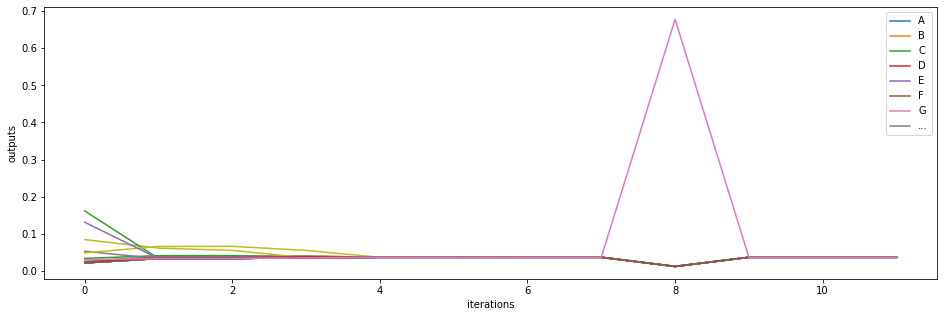

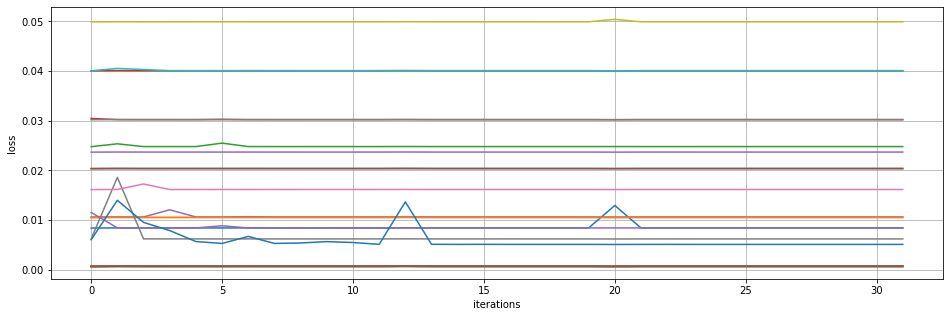

RKQVLY YYLCFY WOURC OAUODA GRNAKD NOSEIY
---------------
epoch 710
---------------
epoch 715
---------------
epoch 720
-----------------
average loss: 
[[0.00842302]
 [0.01053538]
 [0.02038566]
 [0.03023593]
 [0.01063385]
 [0.00068511]
 [0.02038566]
 [0.03023594]
 [0.04008619]
 [0.00068511]
 [0.00068511]
 [0.01053538]
 [0.02480733]
 [0.04008621]
 [0.00842302]
 [0.02038558]
 [0.00068511]
 [0.00621219]
 [0.04993646]
 [0.04008621]
 [0.00510678]
 [0.00068511]
 [0.00068511]
 [0.00068511]
 [0.02370191]
 [0.00068511]
 [0.01616094]]


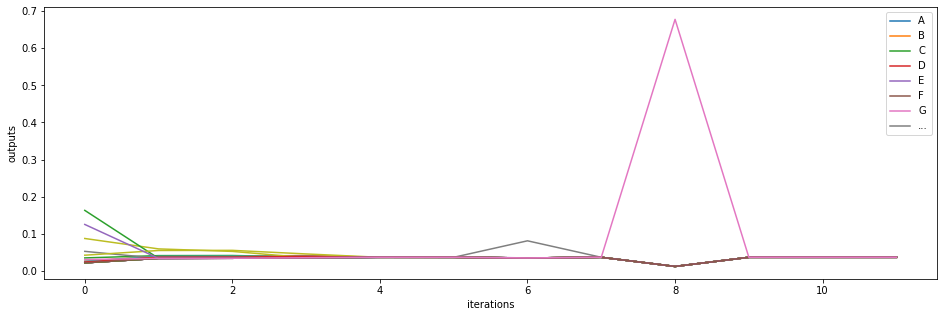

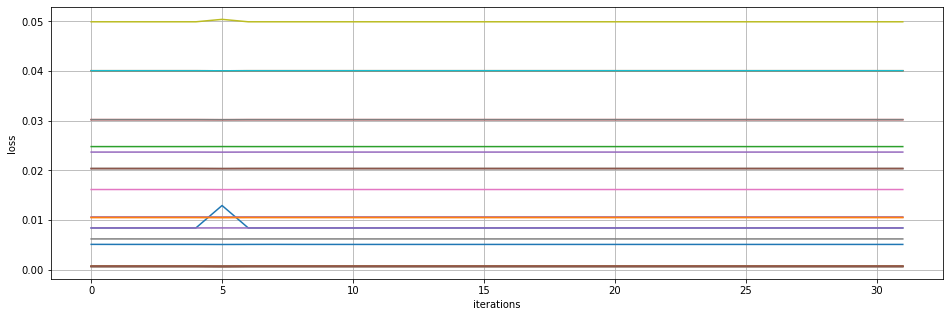

QOME AOUR  AML ARQ JTIAGME VZXME EIADTEV
---------------
epoch 725
---------------
epoch 730
---------------
epoch 735
-----------------
average loss: 
[[0.00842302]
 [0.01053538]
 [0.02038566]
 [0.03023593]
 [0.01063385]
 [0.00068511]
 [0.02038566]
 [0.03023594]
 [0.0400862 ]
 [0.00068511]
 [0.00068511]
 [0.01053538]
 [0.02480733]
 [0.04008621]
 [0.00842302]
 [0.02038561]
 [0.00068511]
 [0.00621219]
 [0.04993647]
 [0.04008621]
 [0.00510678]
 [0.00068511]
 [0.00068511]
 [0.00068511]
 [0.02370191]
 [0.00068511]
 [0.01616094]]


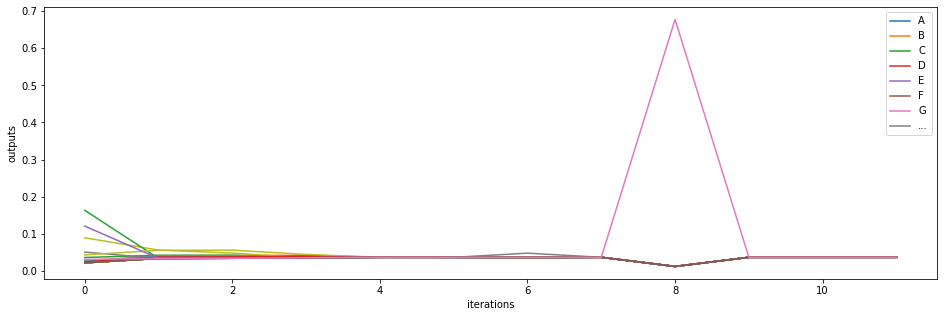

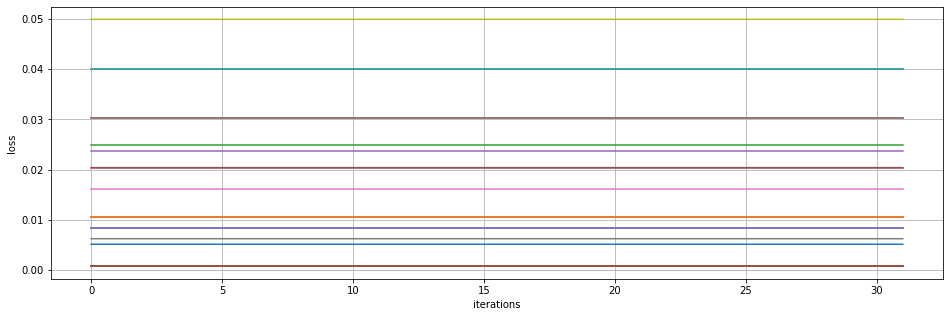

DOME BOURT ASC ERH ECCDNARE ES  NUPSUSE 
---------------
epoch 740
---------------
epoch 745
---------------
epoch 750
-----------------
average loss: 
[[0.00842302]
 [0.01053538]
 [0.02038566]
 [0.03023593]
 [0.01063386]
 [0.00068511]
 [0.02038566]
 [0.03023594]
 [0.04008621]
 [0.00068511]
 [0.00068511]
 [0.01053538]
 [0.02480732]
 [0.04008621]
 [0.00842302]
 [0.02038561]
 [0.00068511]
 [0.00621219]
 [0.04993646]
 [0.04008621]
 [0.00510677]
 [0.00068511]
 [0.00068511]
 [0.00068511]
 [0.02370191]
 [0.00068511]
 [0.01616094]]


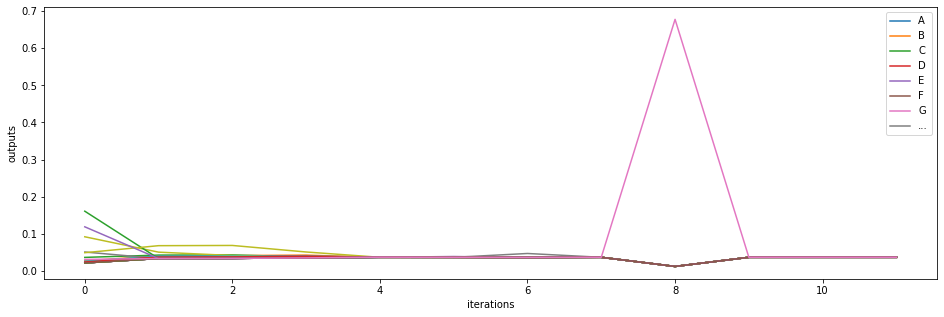

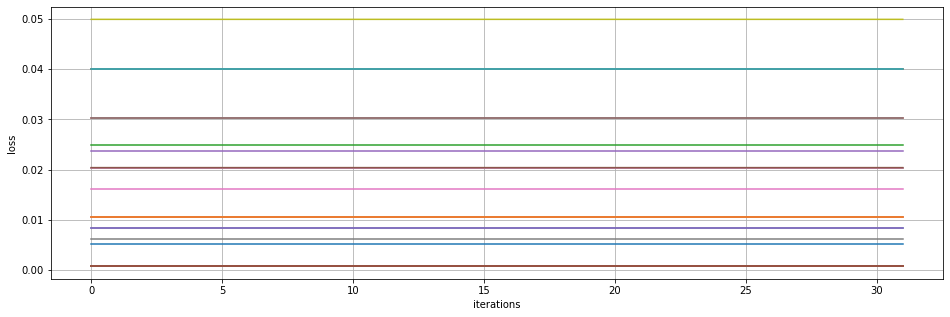

QOME GOURU AXK AVTFUUME VOZRLABABE IG TN
---------------
epoch 755
---------------
epoch 760
---------------
epoch 765
-----------------
average loss: 
[[0.00842302]
 [0.01053538]
 [0.02038566]
 [0.03023593]
 [0.01063386]
 [0.00068511]
 [0.02038566]
 [0.03023594]
 [0.04008621]
 [0.00068511]
 [0.00068511]
 [0.01053538]
 [0.02480733]
 [0.04008621]
 [0.00842302]
 [0.02038562]
 [0.00068511]
 [0.00621219]
 [0.04993639]
 [0.04008621]
 [0.00510677]
 [0.00068511]
 [0.00068511]
 [0.00068511]
 [0.02370191]
 [0.00068511]
 [0.01616094]]


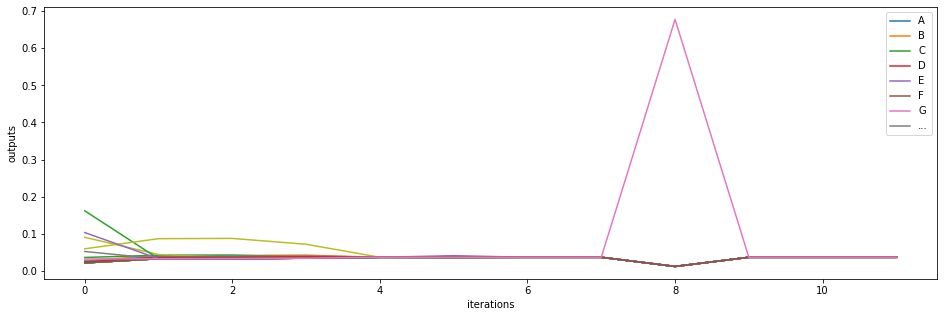

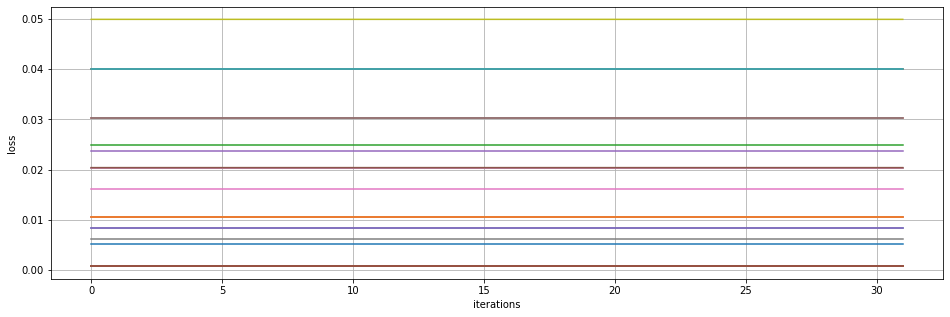

FOME HOURI AID UID RONE RHALKGEYRB AJXOE
---------------
epoch 770
---------------
epoch 775
---------------
epoch 780
-----------------
average loss: 
[[0.00842302]
 [0.01053538]
 [0.02038566]
 [0.03023594]
 [0.01063386]
 [0.00068511]
 [0.02038566]
 [0.03023594]
 [0.04008621]
 [0.00068511]
 [0.00068511]
 [0.01053538]
 [0.02480733]
 [0.04008621]
 [0.00842302]
 [0.02038561]
 [0.00068511]
 [0.00621219]
 [0.04993646]
 [0.04008621]
 [0.00510677]
 [0.00068511]
 [0.00068511]
 [0.00068511]
 [0.02370191]
 [0.00068511]
 [0.01616094]]


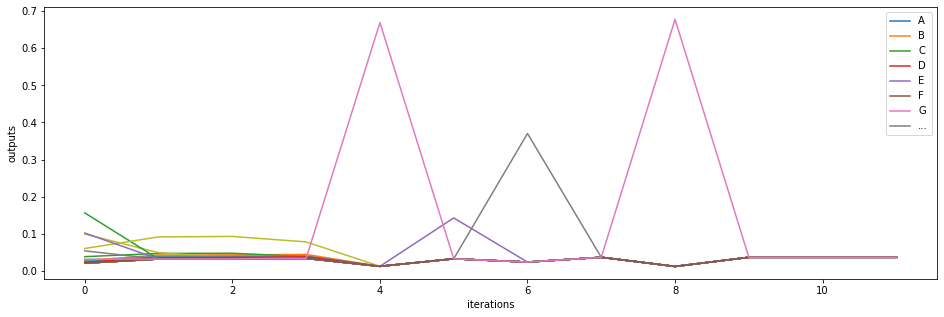

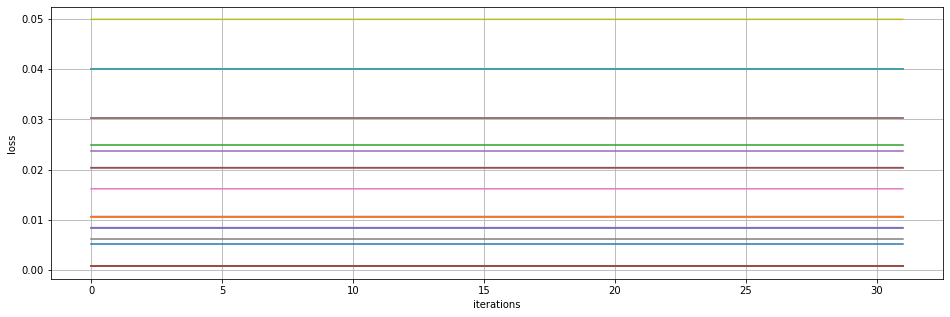

ZOME COURH AGJREPWHUNU IPABTXAIW KRK AED
---------------
epoch 785
---------------
epoch 790
---------------
epoch 795
-----------------
average loss: 
[[0.00842303]
 [0.01053538]
 [0.02038566]
 [0.03023593]
 [0.01063386]
 [0.00068511]
 [0.02038566]
 [0.03023594]
 [0.04008621]
 [0.00068511]
 [0.00068511]
 [0.01053538]
 [0.02480733]
 [0.04008621]
 [0.00842302]
 [0.02038555]
 [0.00068511]
 [0.00621219]
 [0.04993644]
 [0.04008621]
 [0.00510677]
 [0.00068511]
 [0.00068511]
 [0.00068511]
 [0.02370191]
 [0.00068511]
 [0.01616094]]


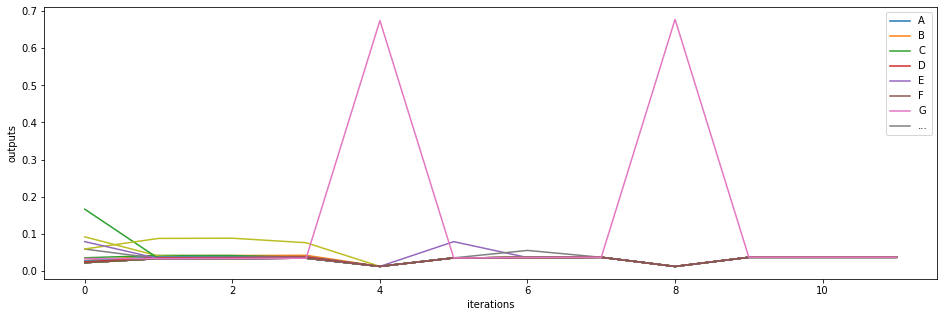

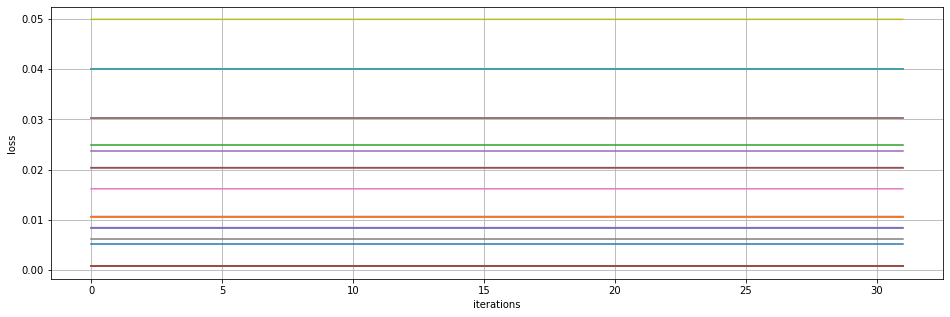

IOME SOURH AZRDLXPOCZAEEVVTM AOOEEMY TOR
---------------
epoch 800
---------------
epoch 805
---------------
epoch 810
-----------------
average loss: 
[[0.00842303]
 [0.01053538]
 [0.02038566]
 [0.03023593]
 [0.01063385]
 [0.00068511]
 [0.02038566]
 [0.03023594]
 [0.04008621]
 [0.00068511]
 [0.00068511]
 [0.01053538]
 [0.02480733]
 [0.04008621]
 [0.00842302]
 [0.02038553]
 [0.00068511]
 [0.00621219]
 [0.04993648]
 [0.04008621]
 [0.00510677]
 [0.00068511]
 [0.00068511]
 [0.00068511]
 [0.02370191]
 [0.00068511]
 [0.01616094]]


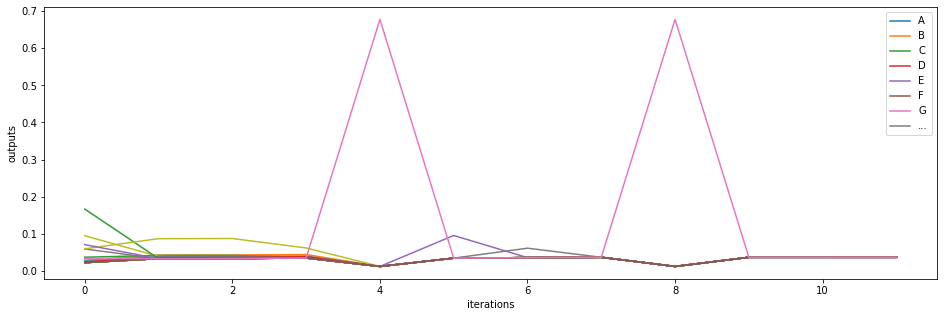

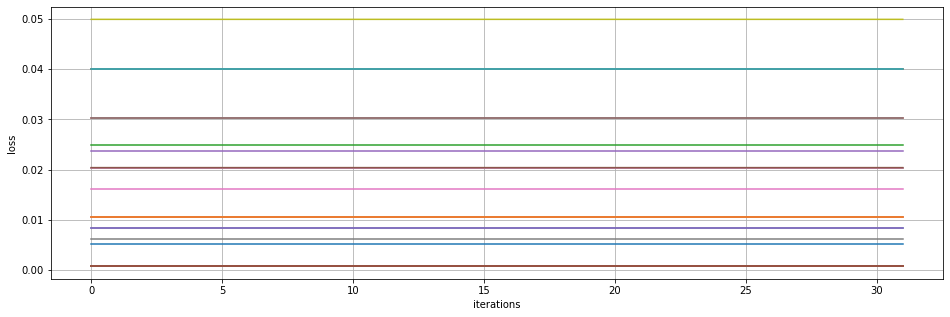

ARS AUGRE BMFY  VERJ WOULE SOME MNALEQEY
---------------
epoch 815
---------------
epoch 820
---------------
epoch 825
-----------------
average loss: 
[[0.00842303]
 [0.01053538]
 [0.02038566]
 [0.03023593]
 [0.01063385]
 [0.00068511]
 [0.02038566]
 [0.03023594]
 [0.04008621]
 [0.00068511]
 [0.00068511]
 [0.01053538]
 [0.02480732]
 [0.04008621]
 [0.00842302]
 [0.02038549]
 [0.00068511]
 [0.0062122 ]
 [0.04993648]
 [0.04008621]
 [0.00510677]
 [0.00068511]
 [0.00068511]
 [0.00068511]
 [0.02370191]
 [0.00068511]
 [0.01616094]]


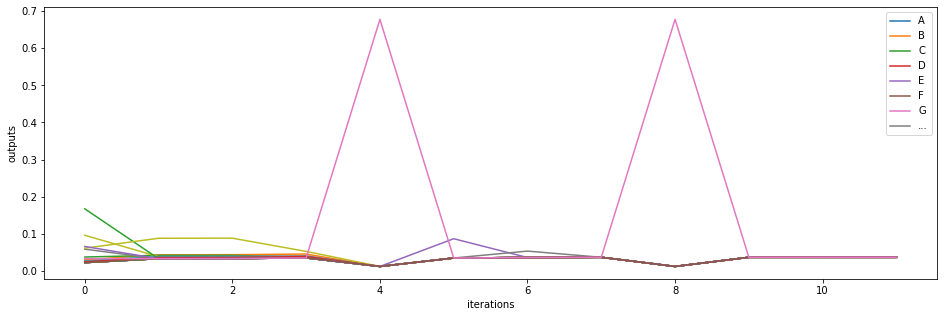

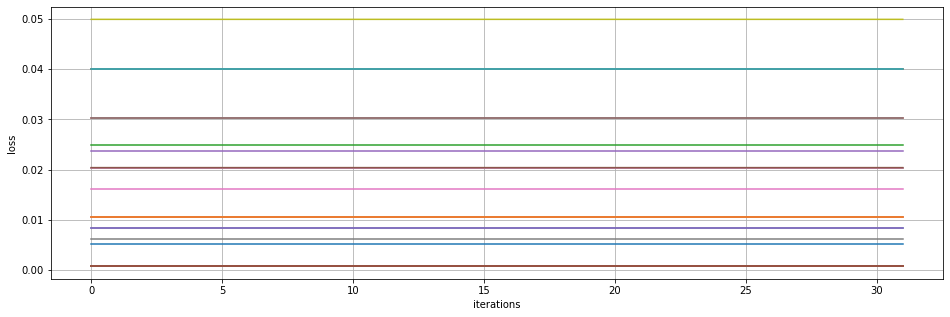

POME NOURW AGY RKXAZRX AII ALUIZMBADKA M
---------------
epoch 830
---------------
epoch 835
---------------
epoch 840
-----------------
average loss: 
[[0.00842303]
 [0.01053538]
 [0.02038566]
 [0.03023593]
 [0.01063385]
 [0.00068511]
 [0.02038566]
 [0.03023594]
 [0.04008621]
 [0.00068511]
 [0.00068511]
 [0.01053538]
 [0.02480732]
 [0.04008621]
 [0.00842302]
 [0.02038545]
 [0.00068511]
 [0.0062122 ]
 [0.04993648]
 [0.04008621]
 [0.00510677]
 [0.00068511]
 [0.00068511]
 [0.00068511]
 [0.02370191]
 [0.00068511]
 [0.01616094]]


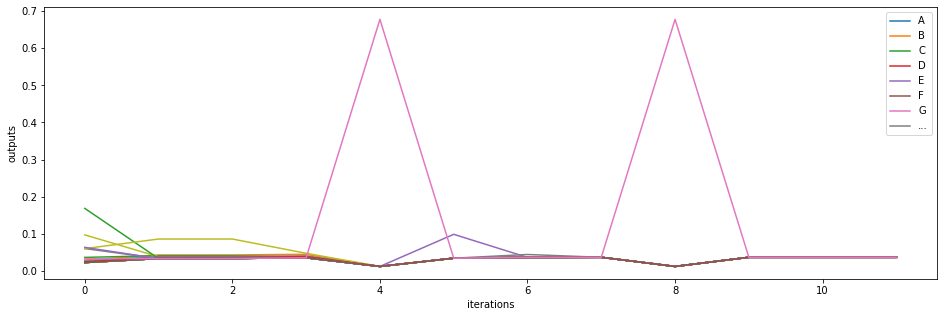

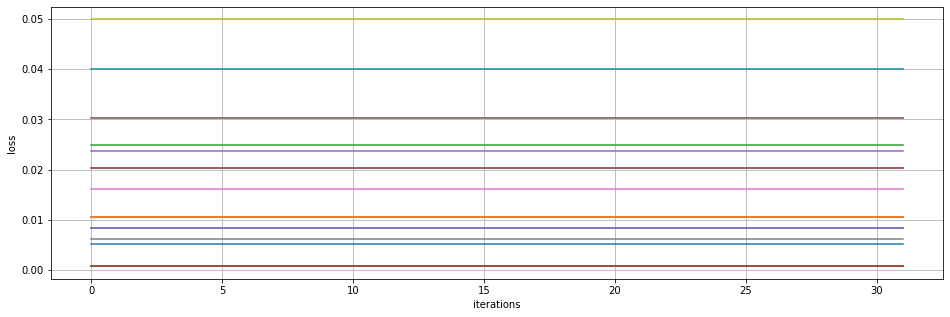

WOME LOURM AHF NIWEUNI AIO WMH OKS RX AH
---------------
epoch 845
---------------
epoch 850
---------------
epoch 855
-----------------
average loss: 
[[0.00842303]
 [0.01053538]
 [0.02038566]
 [0.03023593]
 [0.01063385]
 [0.00068511]
 [0.02038566]
 [0.03023594]
 [0.04008621]
 [0.00068511]
 [0.00068511]
 [0.01053538]
 [0.02480733]
 [0.04008621]
 [0.00842302]
 [0.02038543]
 [0.00068511]
 [0.0062122 ]
 [0.04993648]
 [0.04008621]
 [0.00510677]
 [0.00068511]
 [0.00068511]
 [0.00068511]
 [0.02370191]
 [0.00068511]
 [0.01616094]]


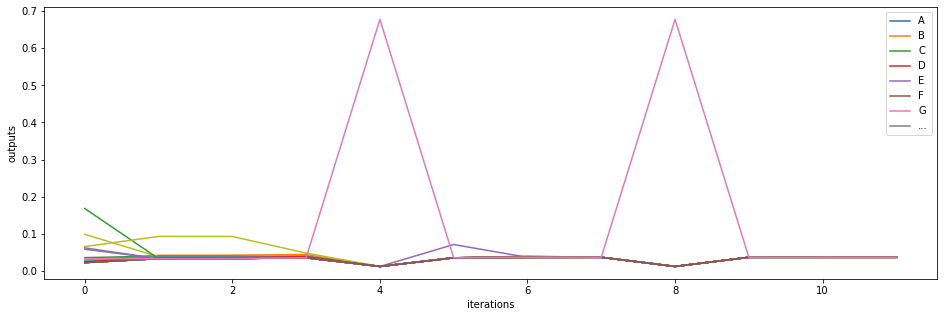

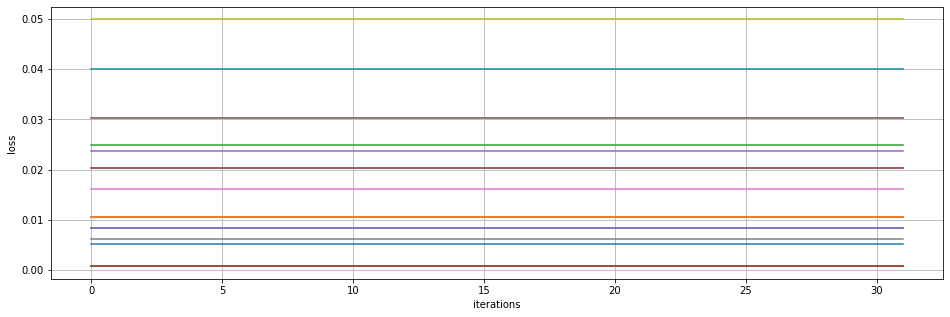

UOME FOURT AOB  KGRQOOCE ALGRESOOE SOME 
---------------
epoch 860
---------------
epoch 865
---------------
epoch 870
-----------------
average loss: 
[[0.00842303]
 [0.01053538]
 [0.02038566]
 [0.03023593]
 [0.01063385]
 [0.00068511]
 [0.02038566]
 [0.03023594]
 [0.04008621]
 [0.00068511]
 [0.00068511]
 [0.01053538]
 [0.02480732]
 [0.04008621]
 [0.00842302]
 [0.0203854 ]
 [0.00068511]
 [0.0062122 ]
 [0.04993648]
 [0.04008621]
 [0.00510677]
 [0.00068511]
 [0.00068511]
 [0.00068511]
 [0.02370191]
 [0.00068511]
 [0.01616094]]


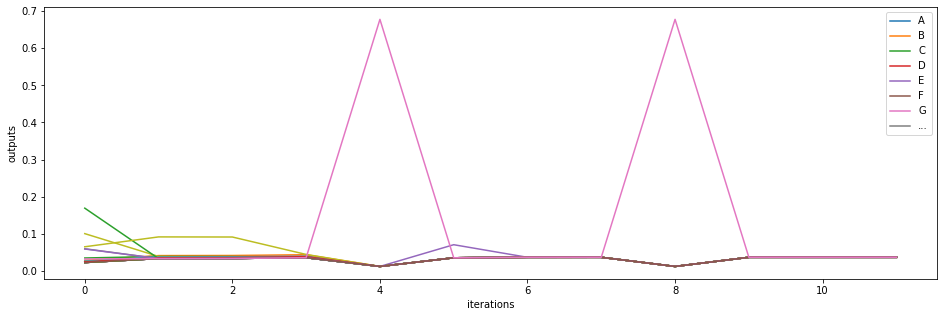

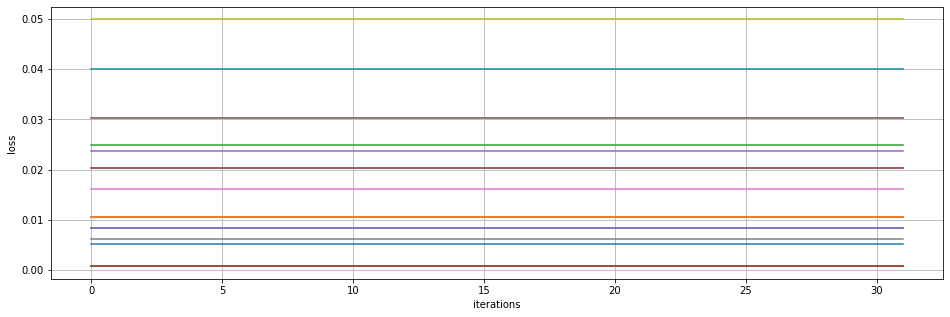

QOME COURH AEQREUXJVAGEHIASKBEEY EOUJB A
---------------
epoch 875
---------------
epoch 880
---------------
epoch 885
-----------------
average loss: 
[[0.00842303]
 [0.01053538]
 [0.02038566]
 [0.03023593]
 [0.01063385]
 [0.00068511]
 [0.02038566]
 [0.03023594]
 [0.04008621]
 [0.00068511]
 [0.00068511]
 [0.01053538]
 [0.02480732]
 [0.04008621]
 [0.00842302]
 [0.02038537]
 [0.00068511]
 [0.0062122 ]
 [0.04993648]
 [0.04008621]
 [0.00510677]
 [0.00068511]
 [0.00068511]
 [0.00068511]
 [0.02370191]
 [0.00068511]
 [0.01616094]]


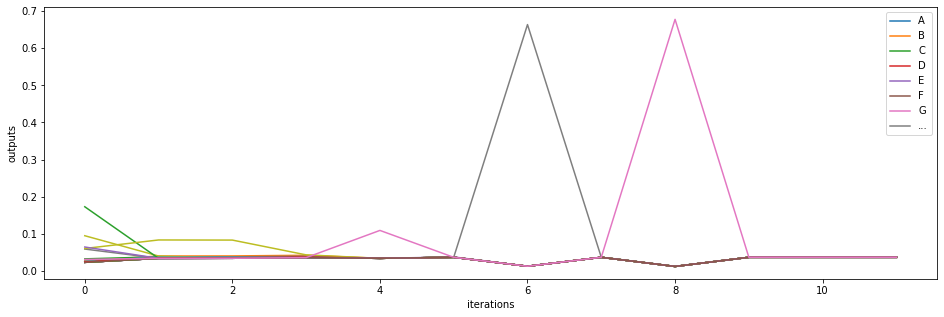

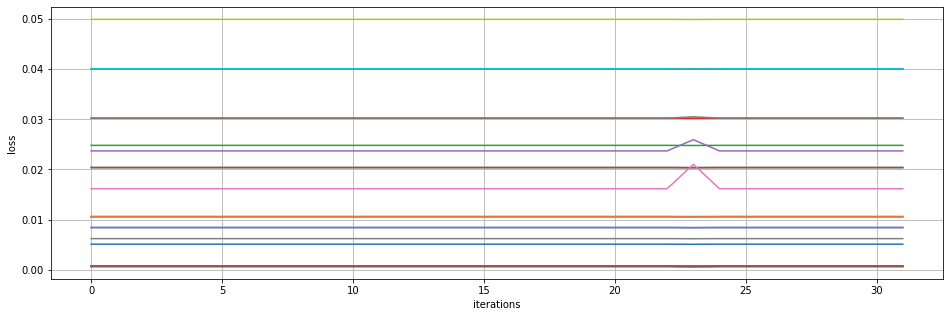

MGQJLF AHCTESXNPAJOME BOURL AZ  GLUQAQJ 
---------------
epoch 890
---------------
epoch 895
---------------
epoch 900
-----------------
average loss: 
[[0.00842302]
 [0.01053538]
 [0.02038566]
 [0.03023594]
 [0.01063385]
 [0.00068511]
 [0.02038566]
 [0.03023594]
 [0.04008621]
 [0.00068511]
 [0.00068511]
 [0.01053538]
 [0.02480733]
 [0.04008621]
 [0.00842302]
 [0.02038563]
 [0.00068511]
 [0.00621219]
 [0.04993648]
 [0.04008621]
 [0.00510677]
 [0.00068511]
 [0.00068511]
 [0.00068511]
 [0.02370191]
 [0.00068511]
 [0.01616094]]


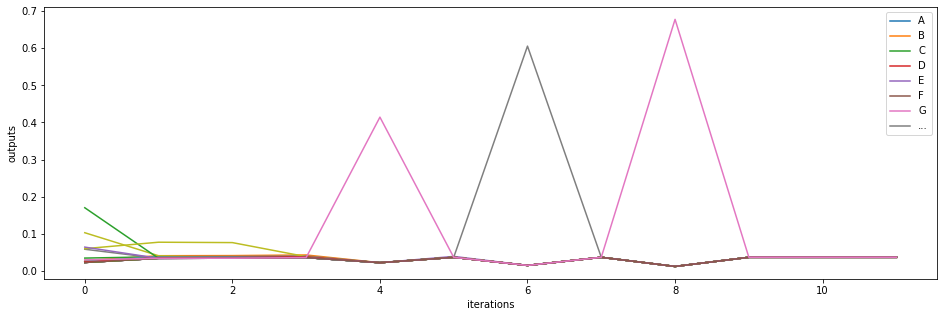

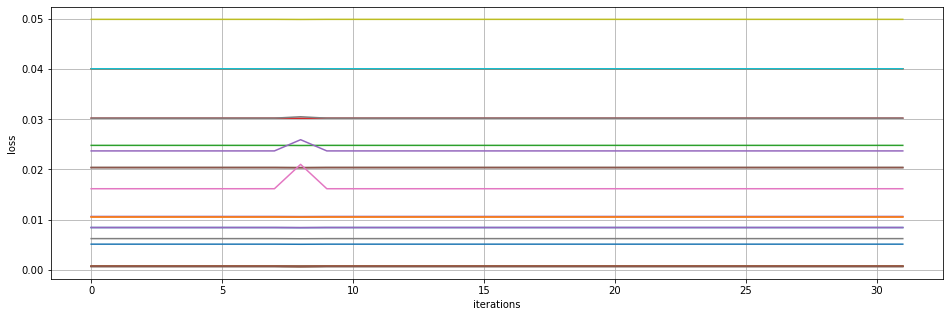

LO E ERUKWAYTE SS ERT WUNA SOME MJZUZEKV
---------------
epoch 905
---------------
epoch 910
---------------
epoch 915
-----------------
average loss: 
[[0.00842302]
 [0.01053538]
 [0.02038566]
 [0.03023593]
 [0.01063385]
 [0.00068511]
 [0.02038566]
 [0.03023594]
 [0.04008621]
 [0.00068511]
 [0.00068511]
 [0.01053538]
 [0.02480732]
 [0.04008621]
 [0.00842302]
 [0.02038562]
 [0.00068511]
 [0.00621219]
 [0.04993648]
 [0.04008621]
 [0.00510677]
 [0.00068511]
 [0.00068511]
 [0.00068511]
 [0.02370191]
 [0.00068511]
 [0.01616094]]


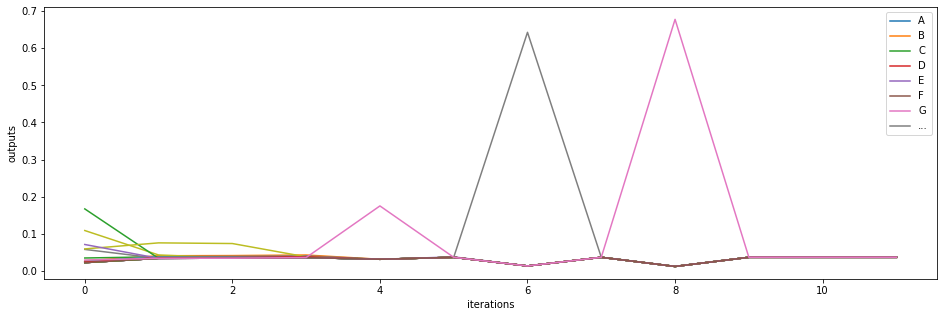

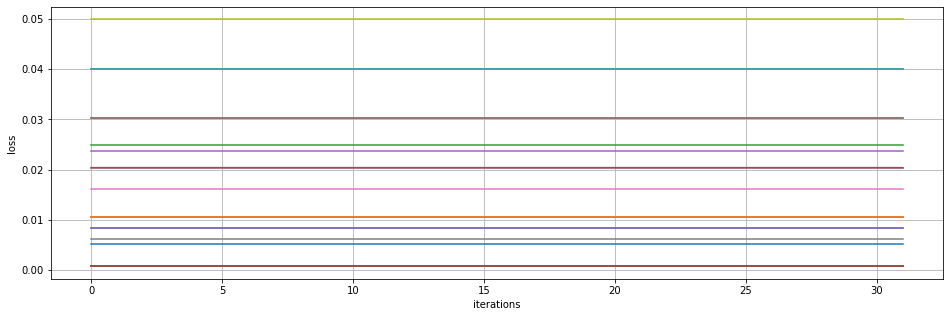

DOXE DOURB ASASELTTXAEYYEOUIY VOS WFXHV 
---------------
epoch 920
---------------
epoch 925
---------------
epoch 930
-----------------
average loss: 
[[0.00842302]
 [0.01053538]
 [0.02038566]
 [0.03023594]
 [0.01063385]
 [0.00068511]
 [0.02038566]
 [0.03023594]
 [0.04008621]
 [0.00068511]
 [0.00068511]
 [0.01053538]
 [0.02480732]
 [0.04008621]
 [0.00842302]
 [0.0203856 ]
 [0.00068511]
 [0.00621219]
 [0.04993648]
 [0.04008621]
 [0.00510677]
 [0.00068511]
 [0.00068511]
 [0.00068511]
 [0.02370191]
 [0.00068511]
 [0.01616094]]


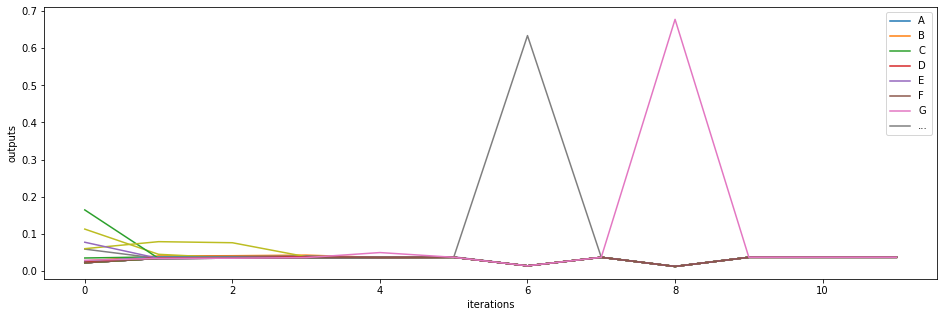

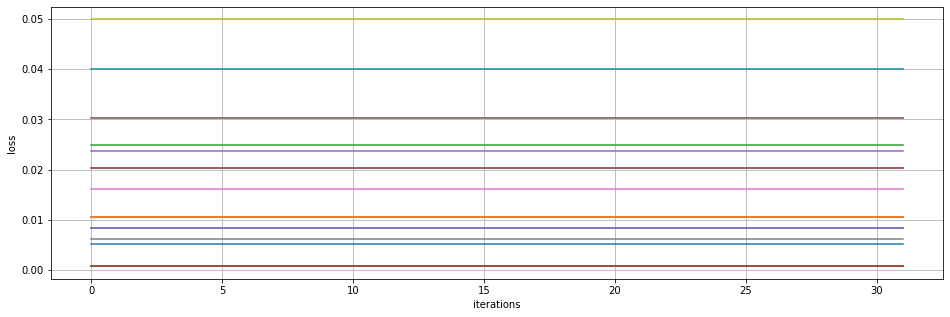

EYIX ALTZEDVQNAYGEWQNRC NFAERP MTUCBGFER
---------------
epoch 935
---------------
epoch 940
---------------
epoch 945
-----------------
average loss: 
[[0.00842302]
 [0.01053538]
 [0.02038566]
 [0.03023594]
 [0.01063385]
 [0.00068511]
 [0.02038566]
 [0.03023594]
 [0.04008621]
 [0.00068511]
 [0.00068511]
 [0.01053538]
 [0.02480732]
 [0.04008621]
 [0.00842302]
 [0.02038559]
 [0.00068511]
 [0.00621219]
 [0.04993648]
 [0.04008621]
 [0.00510677]
 [0.00068511]
 [0.00068511]
 [0.00068511]
 [0.02370191]
 [0.00068511]
 [0.01616094]]


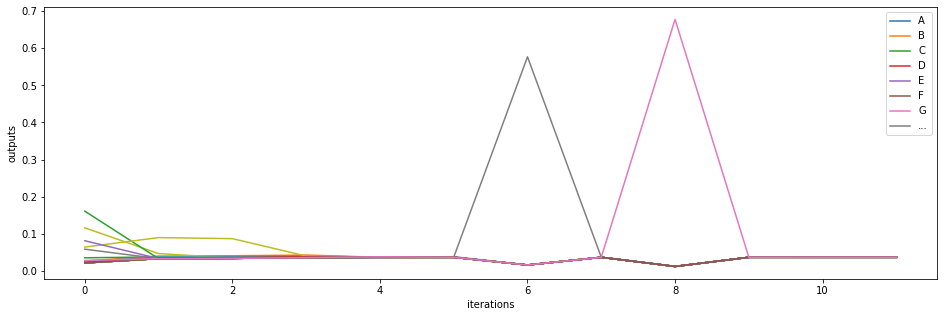

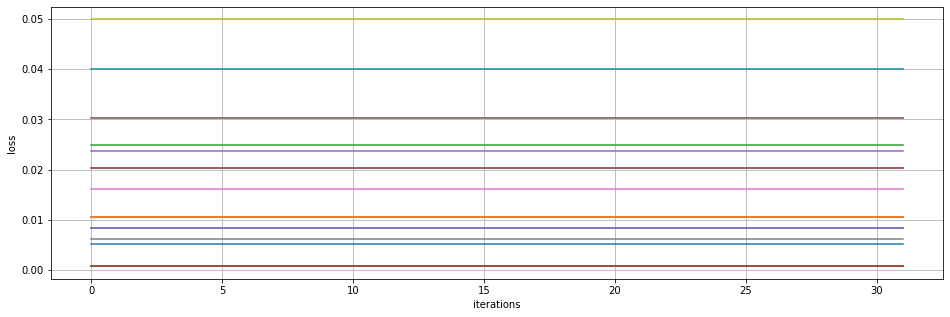

OPGEHXJDID HOUSBHUKDAUQU APAREFPOWYKAUH 
---------------
epoch 950
---------------
epoch 955
---------------
epoch 960
-----------------
average loss: 
[[0.00842303]
 [0.01053538]
 [0.02038566]
 [0.03023594]
 [0.01063385]
 [0.00068511]
 [0.02038566]
 [0.03023594]
 [0.04008621]
 [0.00068511]
 [0.00068511]
 [0.01053538]
 [0.02480732]
 [0.04008621]
 [0.00842302]
 [0.02038555]
 [0.00068511]
 [0.00621219]
 [0.04993648]
 [0.04008621]
 [0.00510677]
 [0.00068511]
 [0.00068511]
 [0.00068511]
 [0.02370191]
 [0.00068511]
 [0.01616094]]


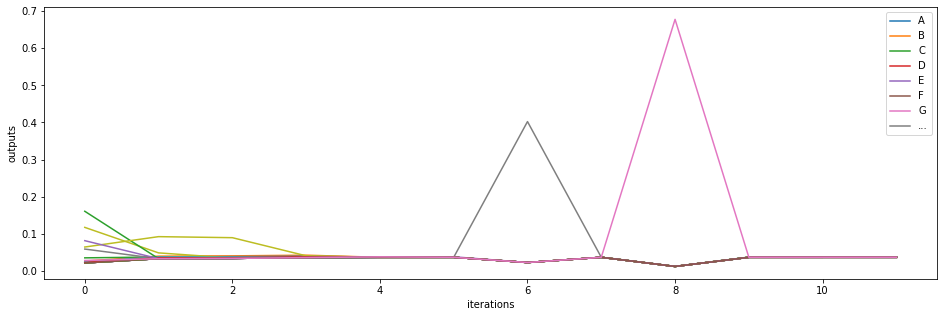

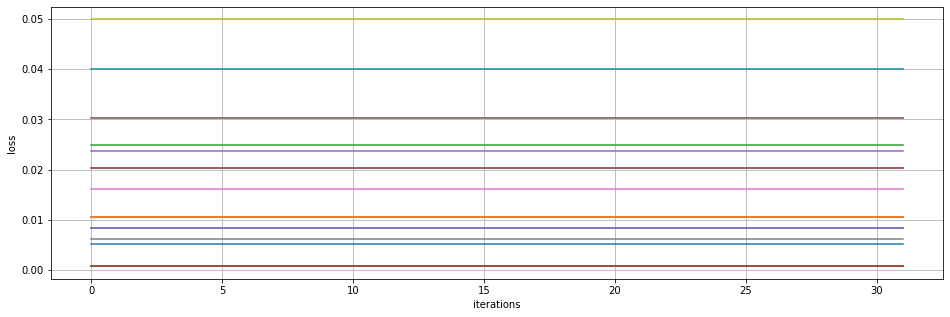

POME ROURQ AHLQTLNAFERY CORY UXY COQPCFQ
---------------
epoch 965
---------------
epoch 970
---------------
epoch 975
-----------------
average loss: 
[[0.00842303]
 [0.01053538]
 [0.02038566]
 [0.03023593]
 [0.01063385]
 [0.00068511]
 [0.02038566]
 [0.03023594]
 [0.04008621]
 [0.00068511]
 [0.00068511]
 [0.01053538]
 [0.02480732]
 [0.04008621]
 [0.00842302]
 [0.02038551]
 [0.00068511]
 [0.0062122 ]
 [0.04993648]
 [0.04008621]
 [0.00510677]
 [0.00068511]
 [0.00068511]
 [0.00068511]
 [0.02370191]
 [0.00068511]
 [0.01616094]]


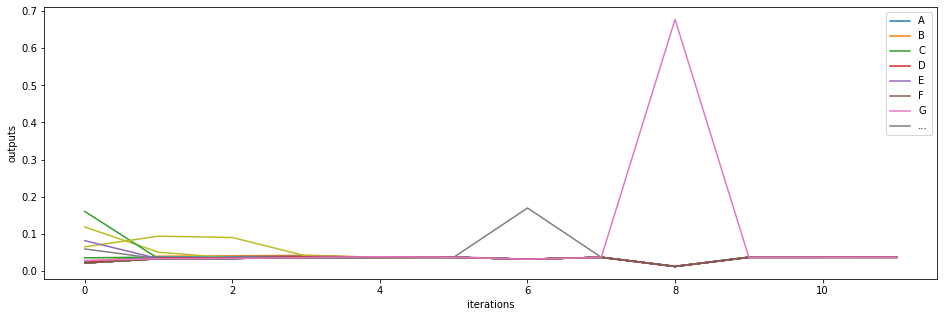

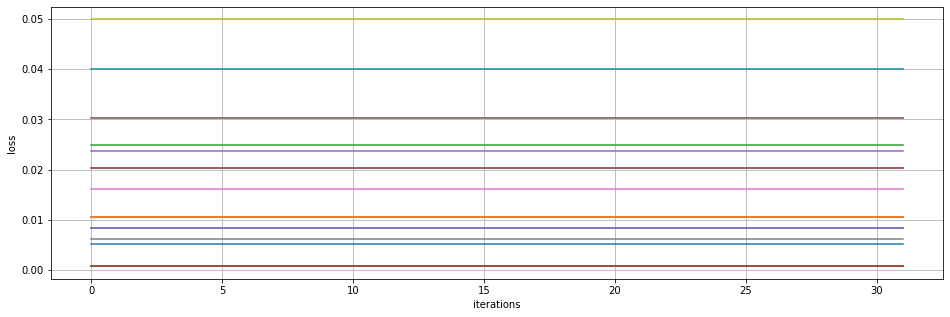

YOME RO RFAOJB ANW NOGETHANI E  RBAGEHEW
---------------
epoch 980
---------------
epoch 985
---------------
epoch 990
-----------------
average loss: 
[[0.00842303]
 [0.01053538]
 [0.02038566]
 [0.03023593]
 [0.01063385]
 [0.00068511]
 [0.02038566]
 [0.03023594]
 [0.04008621]
 [0.00068511]
 [0.00068511]
 [0.01053538]
 [0.02480732]
 [0.04008621]
 [0.00842302]
 [0.02038546]
 [0.00068511]
 [0.0062122 ]
 [0.04993648]
 [0.04008621]
 [0.00510677]
 [0.00068511]
 [0.00068511]
 [0.00068511]
 [0.02370191]
 [0.00068511]
 [0.01616094]]


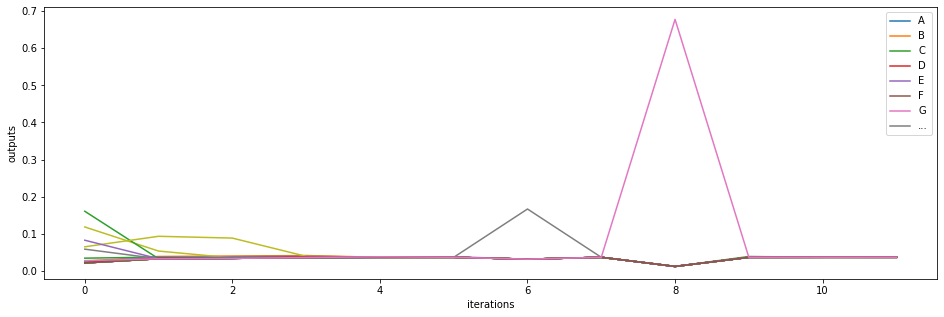

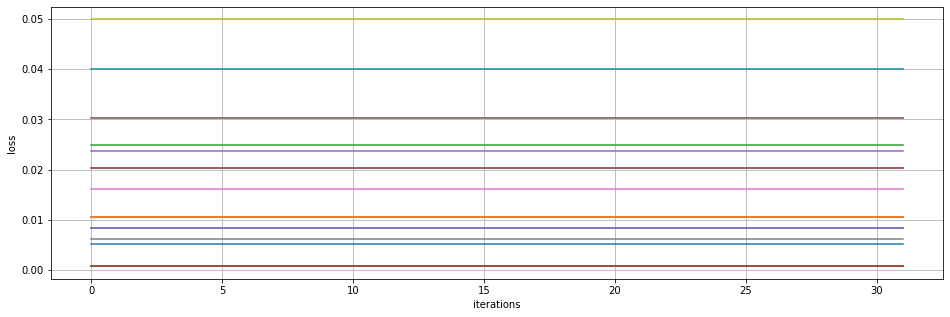

TWMP VOPR AFWEWCVHAXKLEPY KOAYDPQRWAUDF 
---------------
epoch 995
---------------
epoch 1000
---------------
epoch 1005
-----------------
average loss: 
[[0.00842303]
 [0.01053538]
 [0.02038566]
 [0.03023593]
 [0.01063385]
 [0.00068511]
 [0.02038566]
 [0.03023594]
 [0.04008621]
 [0.00068511]
 [0.00068511]
 [0.01053538]
 [0.02480732]
 [0.04008621]
 [0.00842302]
 [0.02038542]
 [0.00068511]
 [0.0062122 ]
 [0.04993648]
 [0.04008621]
 [0.00510677]
 [0.00068511]
 [0.00068511]
 [0.00068511]
 [0.02370191]
 [0.00068511]
 [0.01616094]]


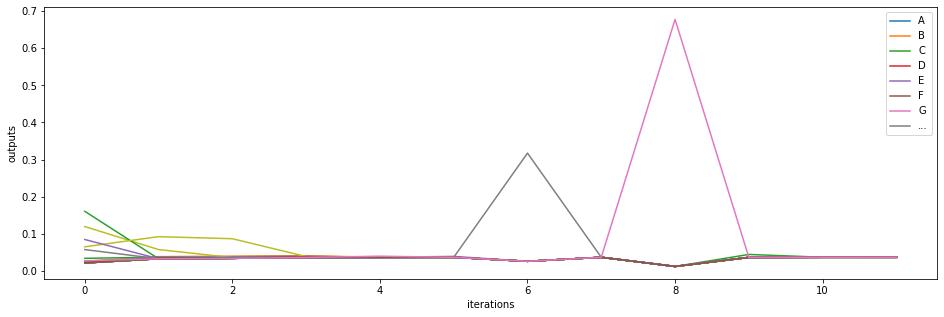

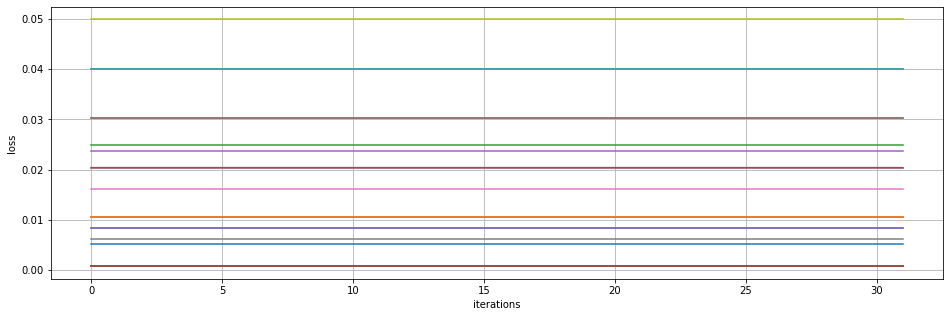

MHNHALREFQOKAHUOERY PORKJAVN AXY AMM ANS
---------------
epoch 1010
---------------
epoch 1015
---------------
epoch 1020
-----------------
average loss: 
[[0.00842303]
 [0.01053538]
 [0.02038566]
 [0.03023593]
 [0.01063385]
 [0.00068511]
 [0.02038566]
 [0.03023594]
 [0.04008621]
 [0.00068511]
 [0.00068511]
 [0.01053538]
 [0.02480732]
 [0.04008621]
 [0.00842302]
 [0.02038534]
 [0.00068511]
 [0.0062122 ]
 [0.04993648]
 [0.04008621]
 [0.00510677]
 [0.00068511]
 [0.00068511]
 [0.00068511]
 [0.02370191]
 [0.00068511]
 [0.01616095]]


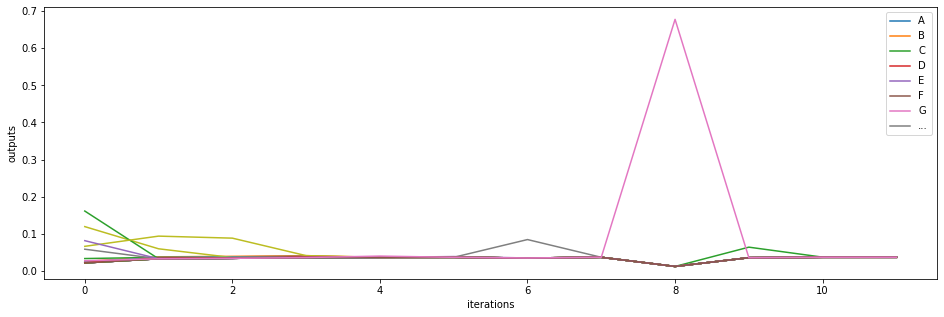

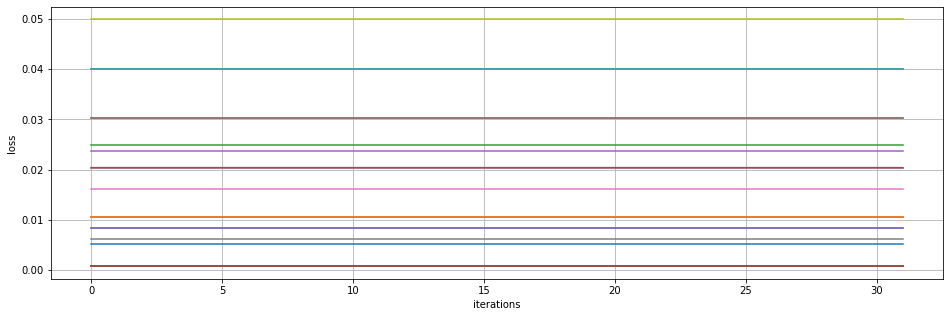

QOME UOHRQRZAIN AQFDUHQ ABZEYPNABERELMXA
---------------
epoch 1025
---------------
epoch 1030
---------------
epoch 1035
-----------------
average loss: 
[[0.00842522]
 [0.0105353 ]
 [0.02038776]
 [0.03023585]
 [0.01063379]
 [0.00068503]
 [0.02038558]
 [0.03023585]
 [0.04008613]
 [0.00068503]
 [0.00068503]
 [0.0105353 ]
 [0.02480724]
 [0.04008613]
 [0.00842294]
 [0.02038507]
 [0.00068503]
 [0.00621213]
 [0.04993613]
 [0.04008613]
 [0.00510669]
 [0.00068503]
 [0.00068503]
 [0.00068503]
 [0.02370183]
 [0.00068503]
 [0.01616087]]


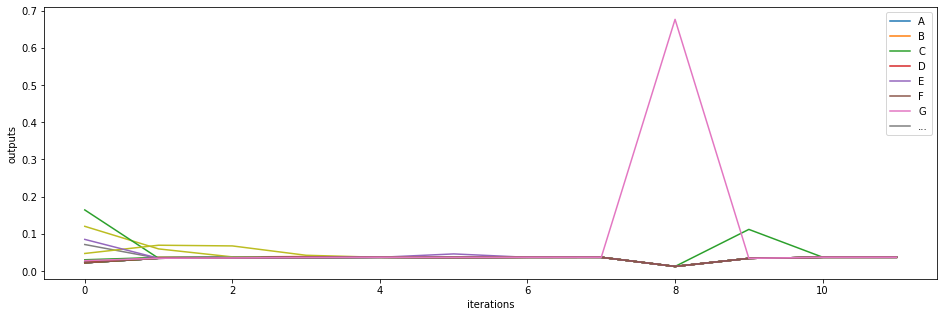

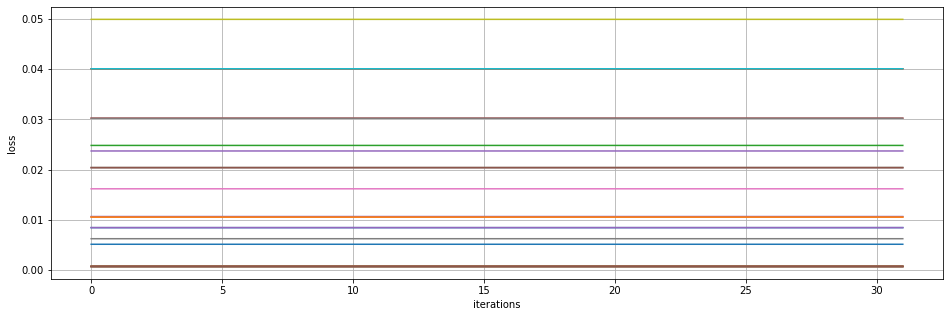

VZZUFLD VBCEQVQCIA U ERY IOEXME MEWUDCOB
---------------
epoch 1040
---------------
epoch 1045
---------------
epoch 1050
-----------------
average loss: 
[[0.00842304]
 [0.01053538]
 [0.02038566]
 [0.03023593]
 [0.01063385]
 [0.00068511]
 [0.02038566]
 [0.03023594]
 [0.04008621]
 [0.00068511]
 [0.00068511]
 [0.01053538]
 [0.02480732]
 [0.04008621]
 [0.00842302]
 [0.02038527]
 [0.00068511]
 [0.0062122 ]
 [0.04993648]
 [0.04008621]
 [0.00510677]
 [0.00068511]
 [0.00068511]
 [0.00068511]
 [0.02370191]
 [0.00068511]
 [0.01616095]]


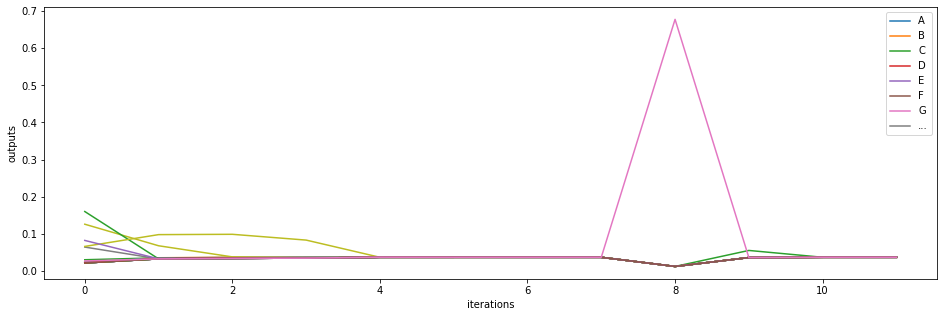

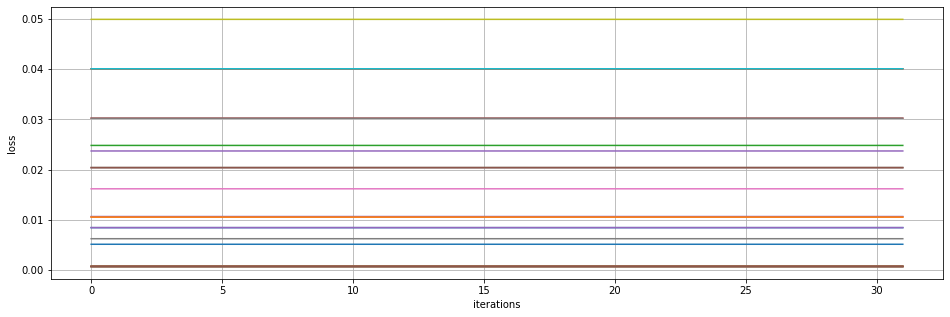

JOME VOURJ ANI AAZAZLJ DJUFLAX ARI AOY L
---------------
epoch 1055
---------------
epoch 1060
---------------
epoch 1065
-----------------
average loss: 
[[0.00842304]
 [0.01053538]
 [0.02038566]
 [0.03023593]
 [0.01063386]
 [0.00068511]
 [0.02038566]
 [0.03023594]
 [0.04008621]
 [0.00068511]
 [0.00068511]
 [0.01053538]
 [0.02480732]
 [0.04008621]
 [0.00842302]
 [0.02038512]
 [0.00068511]
 [0.00621221]
 [0.0499364 ]
 [0.04008621]
 [0.00510677]
 [0.00068511]
 [0.00068511]
 [0.00068511]
 [0.02370191]
 [0.00068511]
 [0.01616095]]


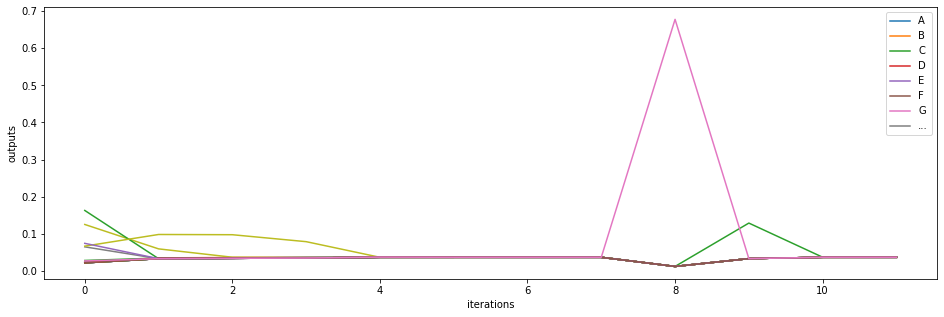

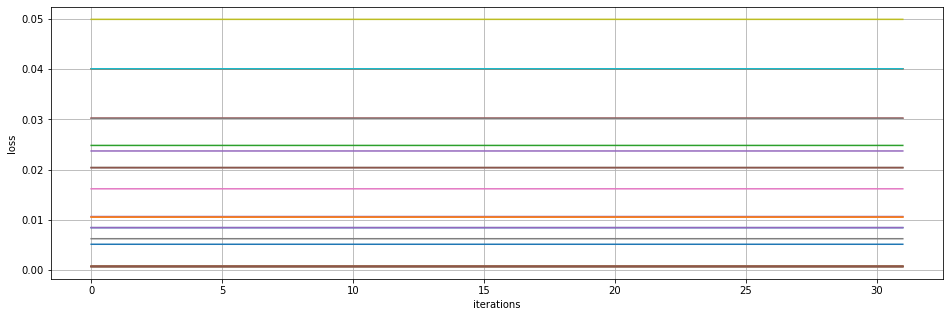

ALT RLOMFAVELW A Y FOBUTTZAKY YODXURX AA
---------------
epoch 1070
---------------
epoch 1075
---------------
epoch 1080
-----------------
average loss: 
[[0.00842304]
 [0.01053538]
 [0.02038566]
 [0.03023593]
 [0.01063385]
 [0.00068511]
 [0.02038566]
 [0.03023594]
 [0.04008621]
 [0.00068511]
 [0.00068511]
 [0.01053538]
 [0.02480732]
 [0.04008621]
 [0.00842302]
 [0.02038523]
 [0.00068511]
 [0.00621221]
 [0.04993646]
 [0.04008621]
 [0.00510677]
 [0.00068511]
 [0.00068511]
 [0.00068511]
 [0.02370191]
 [0.00068511]
 [0.01616095]]


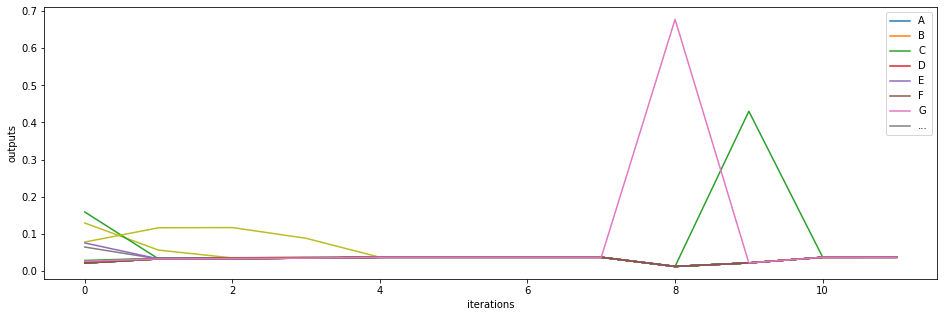

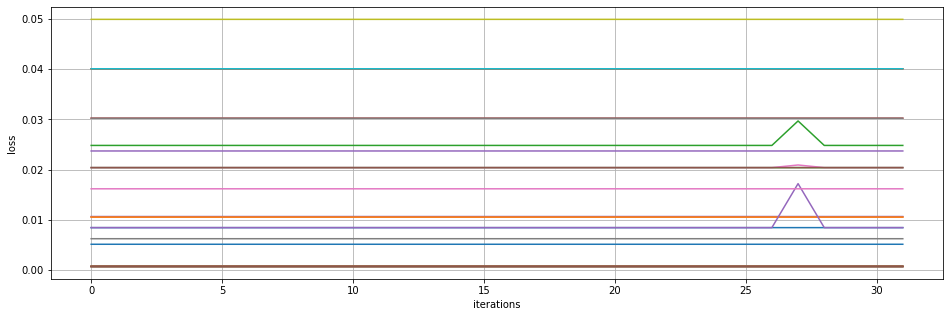

BOME IOURY TOVENX TOM UEFVEVEYUZAHQEEIE 
---------------
epoch 1085
---------------
epoch 1090
---------------
epoch 1095
-----------------
average loss: 
[[0.00842304]
 [0.01053538]
 [0.02038566]
 [0.03023593]
 [0.01063385]
 [0.00068511]
 [0.02038566]
 [0.03023594]
 [0.04008621]
 [0.00068511]
 [0.00068511]
 [0.01053538]
 [0.02480732]
 [0.04008621]
 [0.00842302]
 [0.0203852 ]
 [0.00068511]
 [0.00621221]
 [0.04993646]
 [0.04008621]
 [0.00510677]
 [0.00068511]
 [0.00068511]
 [0.00068511]
 [0.02370191]
 [0.00068511]
 [0.01616095]]


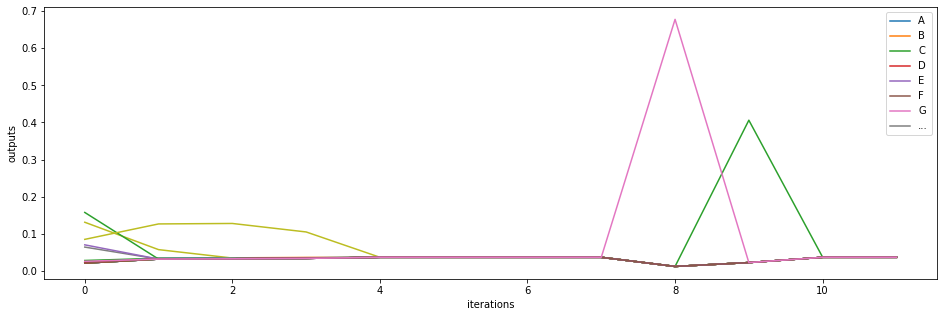

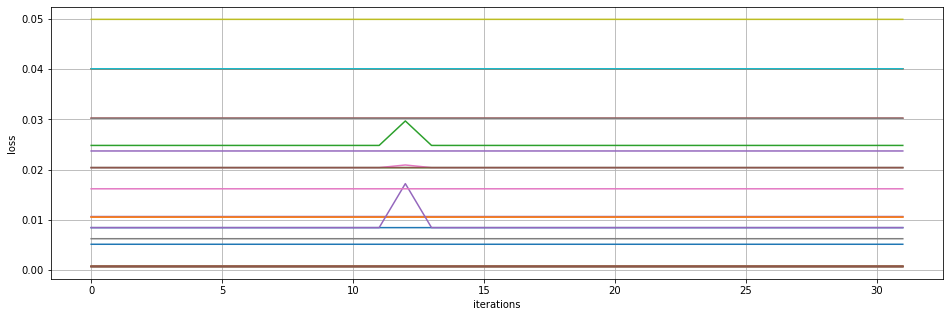

OOLE COCVPDQARW AVBTEFGPXEATG ALT AUEHCA
---------------
epoch 1100
---------------
epoch 1105
---------------
epoch 1110
-----------------
average loss: 
[[0.00842304]
 [0.01053538]
 [0.02038566]
 [0.03023593]
 [0.01063385]
 [0.00068511]
 [0.02038566]
 [0.03023594]
 [0.04008621]
 [0.00068511]
 [0.00068511]
 [0.01053538]
 [0.02480732]
 [0.04008621]
 [0.00842302]
 [0.02038505]
 [0.00068511]
 [0.00621221]
 [0.04993648]
 [0.04008621]
 [0.00510677]
 [0.00068511]
 [0.00068511]
 [0.00068511]
 [0.02370191]
 [0.00068511]
 [0.01616096]]


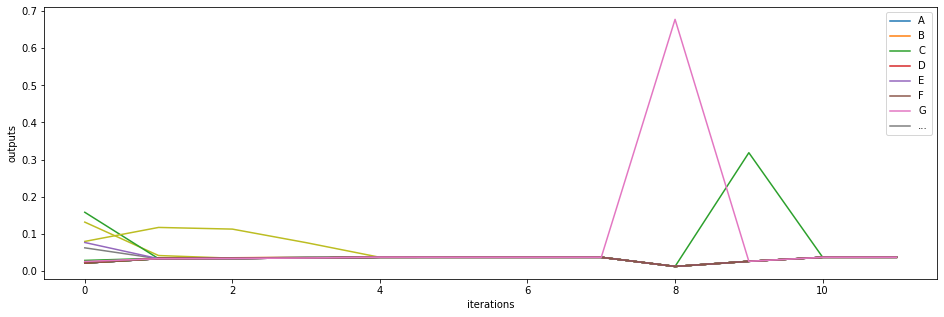

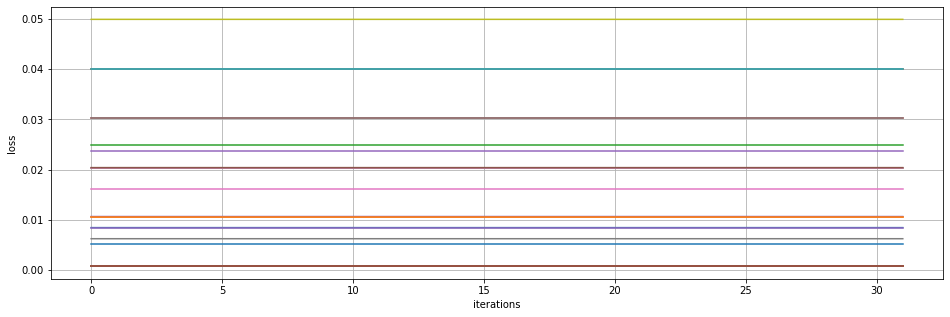

KOSDBARZ MAPONPEERY VOUUMG MMS  WREJCXWA
---------------
epoch 1115
---------------
epoch 1120
---------------
epoch 1125
-----------------
average loss: 
[[0.00842304]
 [0.01053538]
 [0.02038566]
 [0.03023593]
 [0.01063385]
 [0.00068511]
 [0.02038566]
 [0.03023594]
 [0.04008621]
 [0.00068511]
 [0.00068511]
 [0.01053538]
 [0.02480732]
 [0.04008621]
 [0.00842302]
 [0.02038521]
 [0.00068511]
 [0.00621221]
 [0.04993648]
 [0.04008621]
 [0.00510677]
 [0.00068511]
 [0.00068511]
 [0.00068511]
 [0.02370191]
 [0.00068511]
 [0.01616095]]


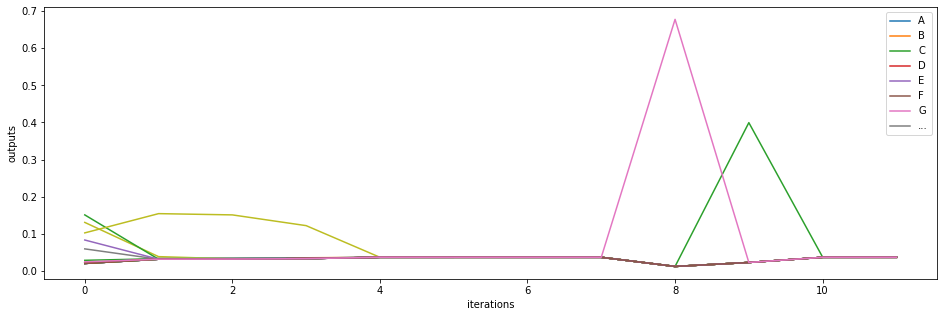

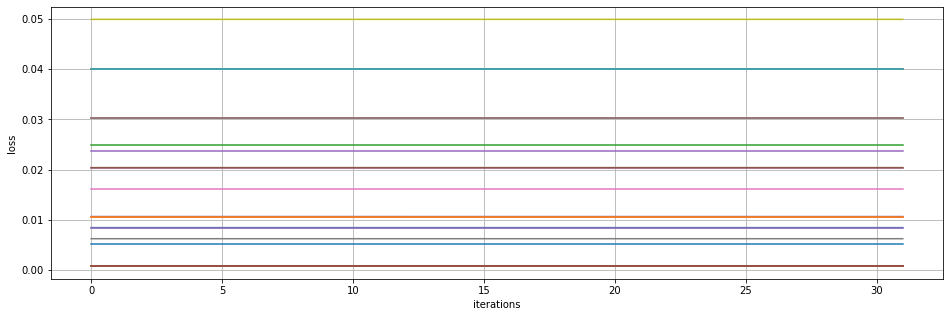

SOME  OURE CNR AVME M HUNTEFOLAVFASZRE D
---------------
epoch 1130
---------------
epoch 1135
---------------
epoch 1140
-----------------
average loss: 
[[0.00842304]
 [0.01053538]
 [0.02038566]
 [0.03023593]
 [0.01063385]
 [0.00068511]
 [0.02038566]
 [0.03023594]
 [0.04008621]
 [0.00068511]
 [0.00068511]
 [0.01053538]
 [0.02480732]
 [0.04008621]
 [0.00842302]
 [0.02038526]
 [0.00068511]
 [0.00621221]
 [0.04993648]
 [0.04008621]
 [0.00510677]
 [0.00068511]
 [0.00068511]
 [0.00068511]
 [0.02370191]
 [0.00068511]
 [0.01616095]]


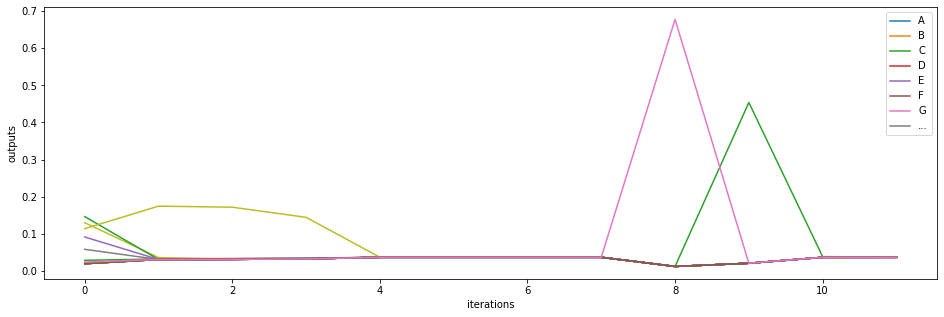

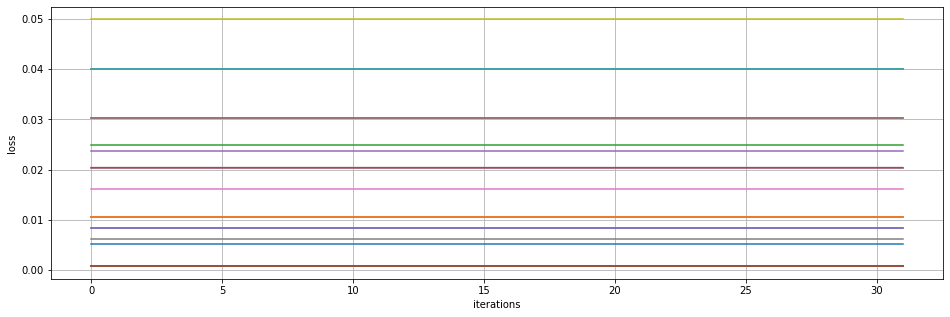

VREFHOSJGETMTAIAKERQ YODHGUES ZPOAPK ACV
---------------
epoch 1145
---------------
epoch 1150
---------------
epoch 1155
-----------------
average loss: 
[[0.00842305]
 [0.01053538]
 [0.02038566]
 [0.03023593]
 [0.01063385]
 [0.00068511]
 [0.02038566]
 [0.03023594]
 [0.04008621]
 [0.00068511]
 [0.00068511]
 [0.01053538]
 [0.02480732]
 [0.04008621]
 [0.00842302]
 [0.02038502]
 [0.00068511]
 [0.00621221]
 [0.04993648]
 [0.04008621]
 [0.00510677]
 [0.00068511]
 [0.00068511]
 [0.00068511]
 [0.02370191]
 [0.00068511]
 [0.01616096]]


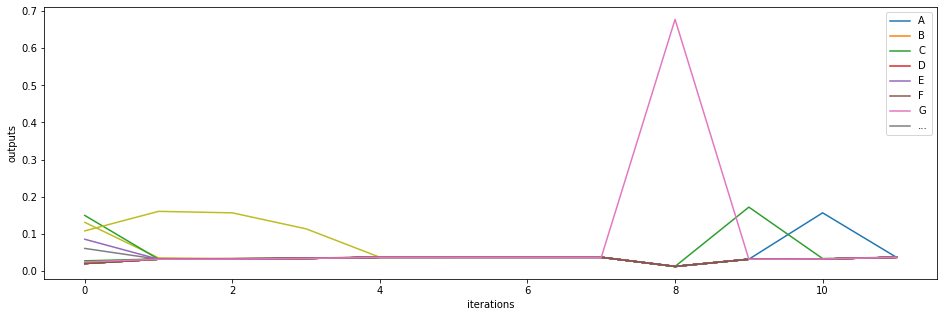

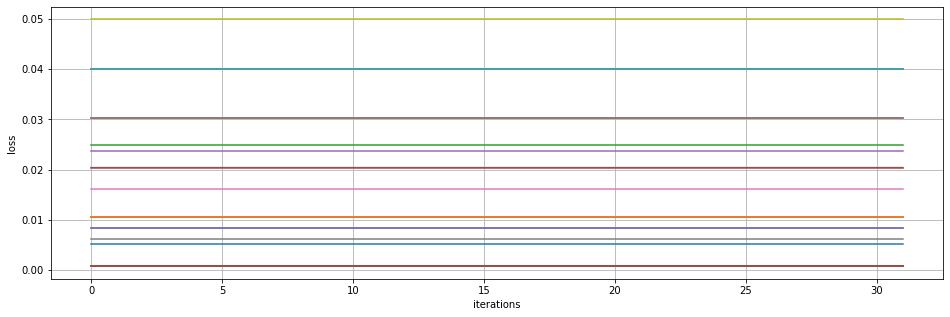

GORVXAEOCEVW AKN ANM EIX TOXNACE SORE ZO
---------------
epoch 1160
---------------
epoch 1165
---------------
epoch 1170
-----------------
average loss: 
[[0.00842304]
 [0.01053538]
 [0.02038566]
 [0.03023593]
 [0.01063385]
 [0.00068511]
 [0.02038566]
 [0.03023594]
 [0.0400862 ]
 [0.00068511]
 [0.00068511]
 [0.01053538]
 [0.02480733]
 [0.04008621]
 [0.00842302]
 [0.02038521]
 [0.00068511]
 [0.00621221]
 [0.04993648]
 [0.04008621]
 [0.00510677]
 [0.00068511]
 [0.00068511]
 [0.00068511]
 [0.02370191]
 [0.00068511]
 [0.01616095]]


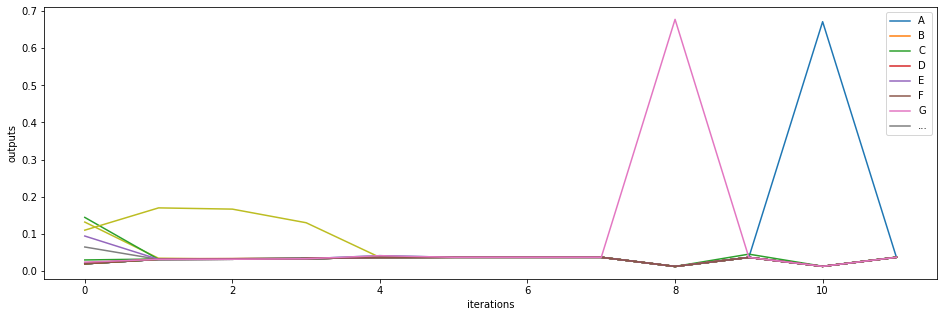

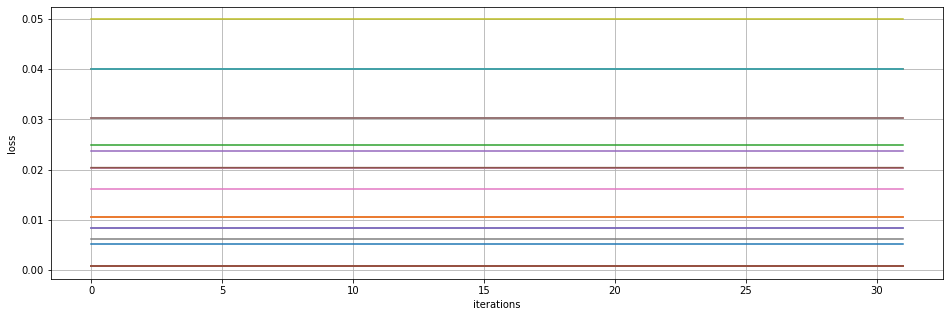

MLFMY WAODEANE WOGETJAIV QG JQWLI ATZ DD
---------------
epoch 1175
---------------
epoch 1180
---------------
epoch 1185
-----------------
average loss: 
[[0.00842303]
 [0.01053537]
 [0.02038565]
 [0.03023592]
 [0.01063385]
 [0.0006851 ]
 [0.02038565]
 [0.03023592]
 [0.04008623]
 [0.0006851 ]
 [0.0006851 ]
 [0.01053537]
 [0.0248076 ]
 [0.0400862 ]
 [0.00842301]
 [0.02038543]
 [0.0006851 ]
 [0.00621219]
 [0.04993646]
 [0.0400862 ]
 [0.00510676]
 [0.0006851 ]
 [0.0006851 ]
 [0.0006851 ]
 [0.0237019 ]
 [0.0006851 ]
 [0.01616093]]


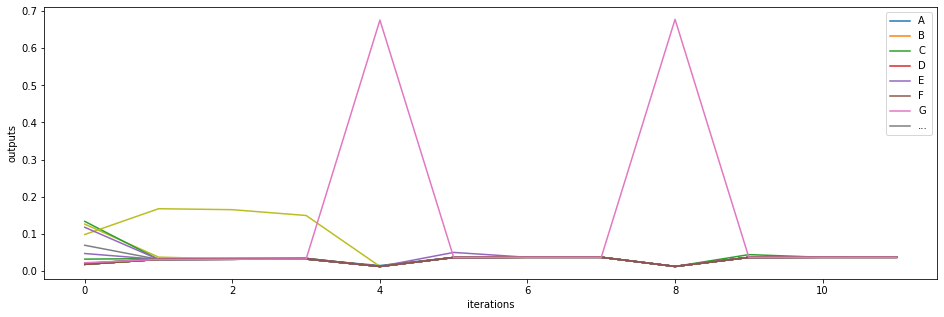

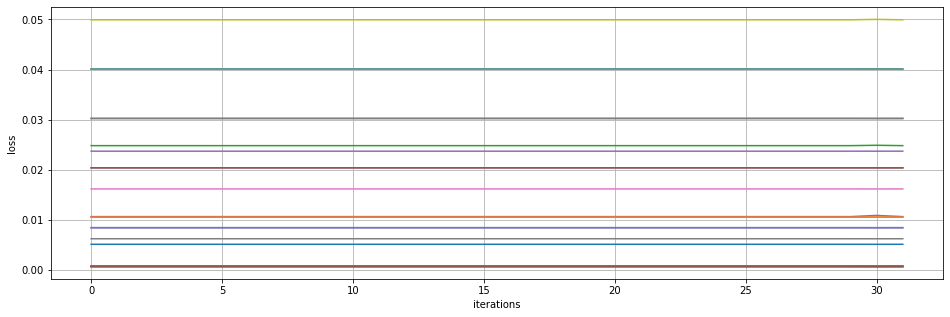

BOME NOAE ECOAQW AOWIELQAU RZAFFAEZY DOP
---------------
epoch 1190
---------------
epoch 1195
---------------
epoch 1200
-----------------
average loss: 
[[0.00839589]
 [0.01050825]
 [0.02035853]
 [0.0302088 ]
 [0.01060673]
 [0.00065797]
 [0.02035852]
 [0.0302088 ]
 [0.02809844]
 [0.00065797]
 [0.00065797]
 [0.01050825]
 [0.02478019]
 [0.04005907]
 [0.00839697]
 [0.0203585 ]
 [0.00065797]
 [0.00618505]
 [0.0499094 ]
 [0.04005907]
 [0.00507974]
 [0.00065797]
 [0.00065797]
 [0.00065797]
 [0.02367477]
 [0.00065797]
 [0.01894702]]


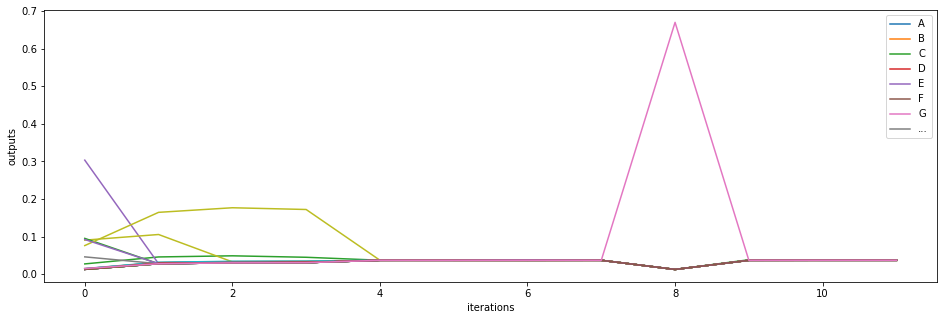

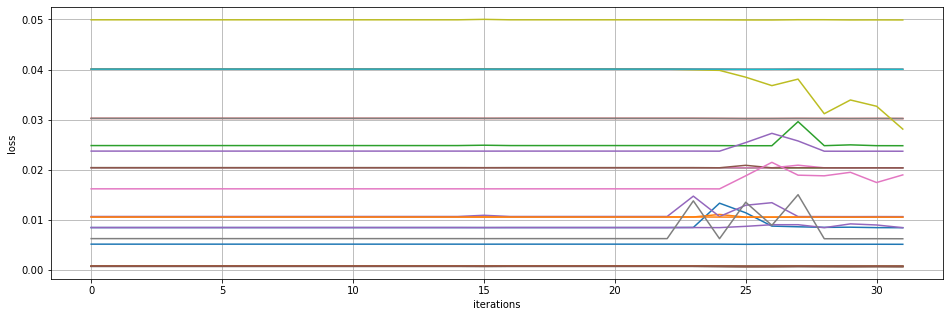

FOME DOURZ ATB  MADHIPEYYSADX AWTKEEQHV 
---------------
epoch 1205
---------------
epoch 1210
---------------
epoch 1215
-----------------
average loss: 
[[0.00839558]
 [0.01050794]
 [0.02035823]
 [0.03020849]
 [0.01060874]
 [0.00065766]
 [0.02035823]
 [0.03020849]
 [0.0260896 ]
 [0.00065766]
 [0.00065766]
 [0.01050793]
 [0.02481478]
 [0.04005877]
 [0.00839705]
 [0.02035816]
 [0.00065766]
 [0.00618708]
 [0.0499113 ]
 [0.04005876]
 [0.00508211]
 [0.00065766]
 [0.00065766]
 [0.00065766]
 [0.02367446]
 [0.00065766]
 [0.01768231]]


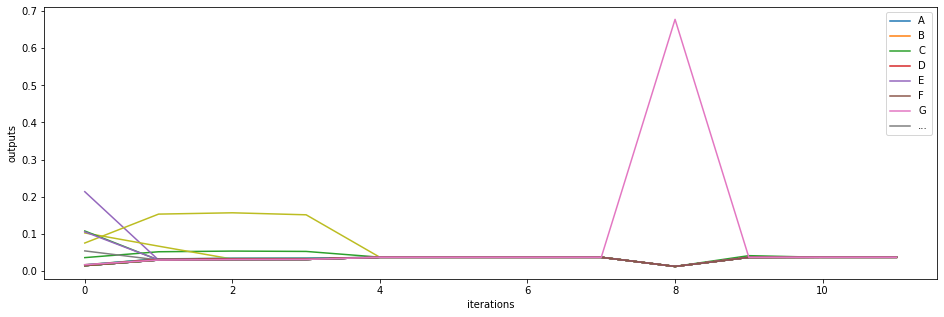

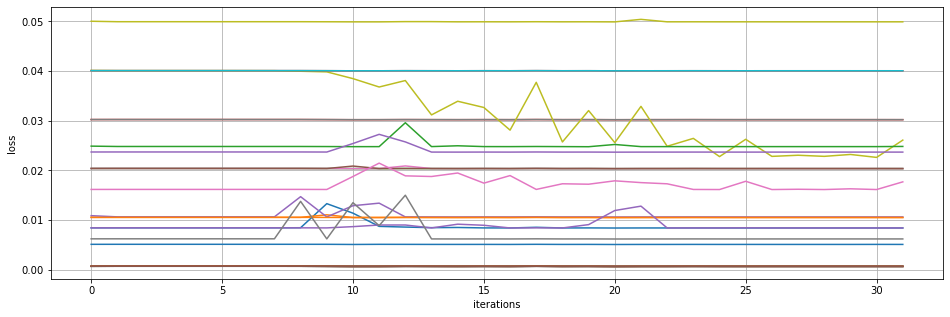

UOME GOURX AFH T EDASTHALWAERU QOJMW VFR
---------------
epoch 1220
---------------
epoch 1225
---------------
epoch 1230
-----------------
average loss: 
[[0.00839702]
 [0.01050937]
 [0.02035964]
 [0.03020993]
 [0.01061064]
 [0.00065909]
 [0.02035965]
 [0.03020992]
 [0.0226547 ]
 [0.00065909]
 [0.00065909]
 [0.01050937]
 [0.02478132]
 [0.0400602 ]
 [0.0083971 ]
 [0.02035961]
 [0.00065909]
 [0.00618618]
 [0.04987552]
 [0.0400602 ]
 [0.00508081]
 [0.00065909]
 [0.00065909]
 [0.00065909]
 [0.02367589]
 [0.00065909]
 [0.01614215]]


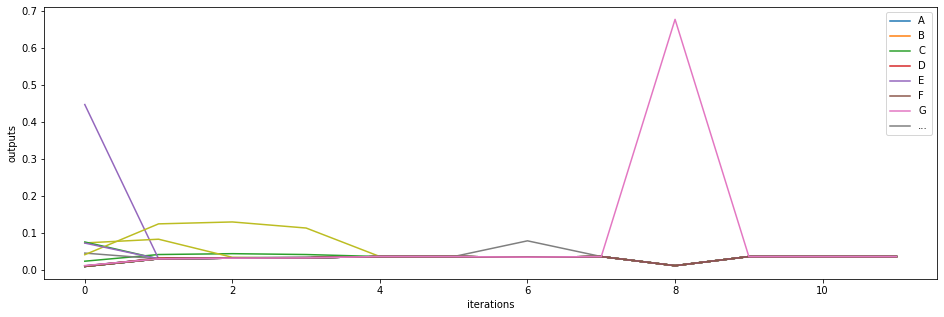

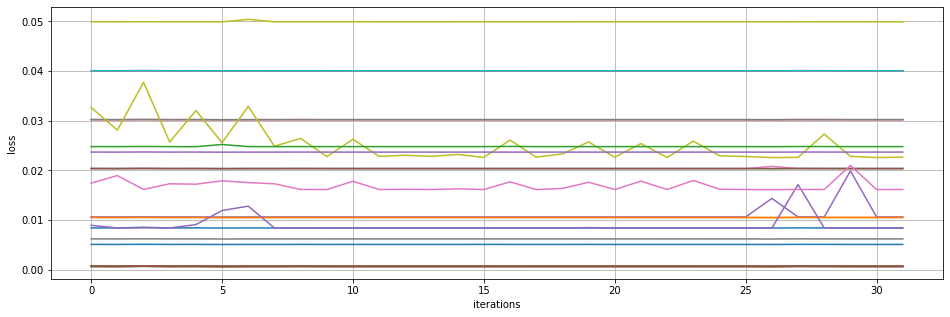

NOME NOURE RBNFIRUTEBKPAGUJY GOOXB AHKRR
---------------
epoch 1235
---------------
epoch 1240
---------------
epoch 1245
-----------------
average loss: 
[[0.00839711]
 [0.01050947]
 [0.02035975]
 [0.03021002]
 [0.01060795]
 [0.0006592 ]
 [0.02035975]
 [0.03021003]
 [0.02257075]
 [0.0006592 ]
 [0.0006592 ]
 [0.01050947]
 [0.02478141]
 [0.0400603 ]
 [0.00839711]
 [0.02035972]
 [0.0006592 ]
 [0.00618628]
 [0.04991053]
 [0.0400603 ]
 [0.00508087]
 [0.0006592 ]
 [0.0006592 ]
 [0.0006592 ]
 [0.023676  ]
 [0.0006592 ]
 [0.01613503]]


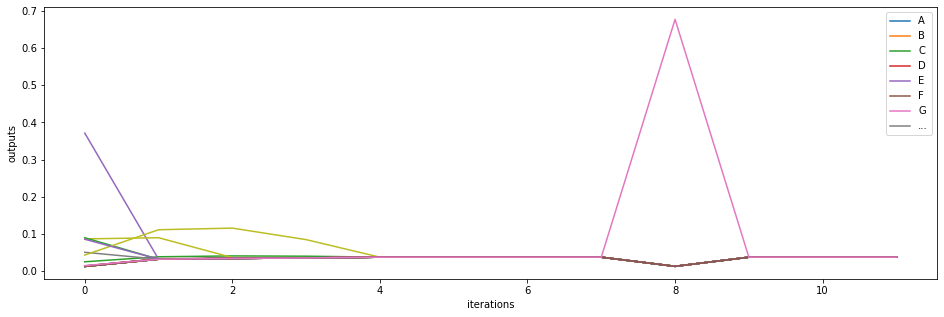

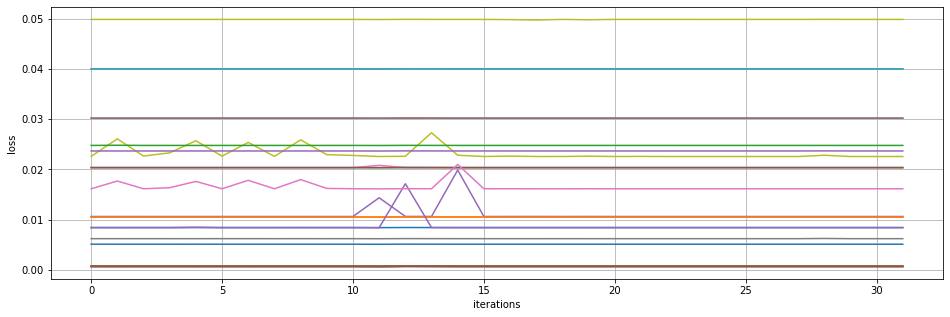

PITQAZWGUAIAOERY PNUBERN APCE XUBX AJME 
---------------
epoch 1250
---------------
epoch 1255
---------------
epoch 1260
-----------------
average loss: 
[[0.00839711]
 [0.01050947]
 [0.02035975]
 [0.03021002]
 [0.01060795]
 [0.0006592 ]
 [0.02035975]
 [0.03021003]
 [0.02257057]
 [0.0006592 ]
 [0.0006592 ]
 [0.01050947]
 [0.02478141]
 [0.0400603 ]
 [0.00839711]
 [0.02035971]
 [0.0006592 ]
 [0.00618628]
 [0.04991055]
 [0.0400603 ]
 [0.00508086]
 [0.0006592 ]
 [0.0006592 ]
 [0.0006592 ]
 [0.023676  ]
 [0.0006592 ]
 [0.01613503]]


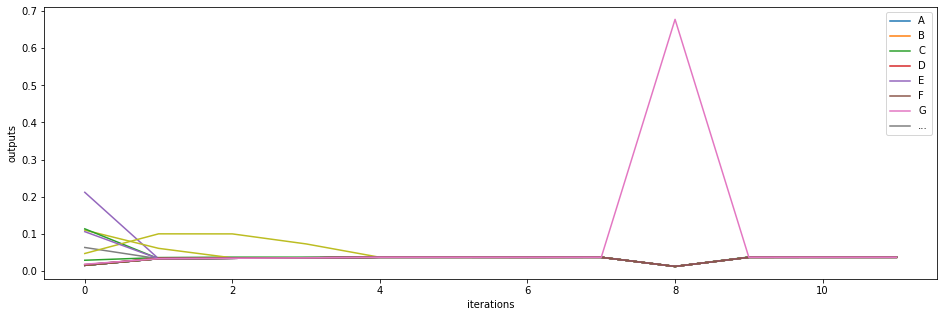

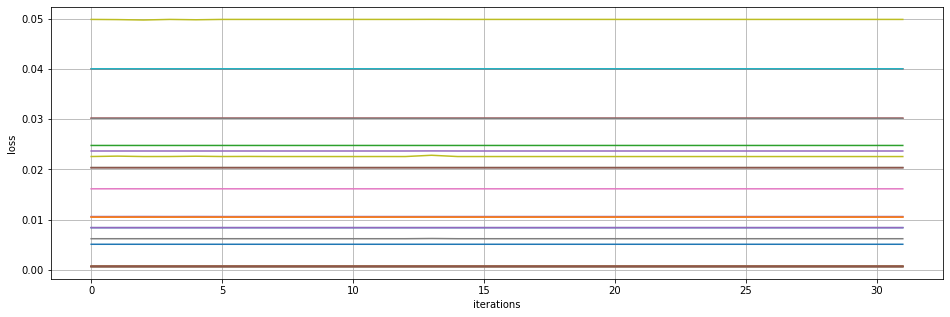

BOME DOURE SOME SOURP AYPWWSOME KOURL AD
---------------
epoch 1265
---------------
epoch 1270
---------------
epoch 1275
-----------------
average loss: 
[[0.01265127]
 [0.01049173]
 [0.02034201]
 [0.03019227]
 [0.01059048]
 [0.00064146]
 [0.02034201]
 [0.03019228]
 [0.02250451]
 [0.00064146]
 [0.00064146]
 [0.01049173]
 [0.02476367]
 [0.04053094]
 [0.00837937]
 [0.02034198]
 [0.00064146]
 [0.00616859]
 [0.04989159]
 [0.04004256]
 [0.0055655 ]
 [0.00064146]
 [0.00064146]
 [0.00064146]
 [0.02365826]
 [0.00064146]
 [0.01611728]]


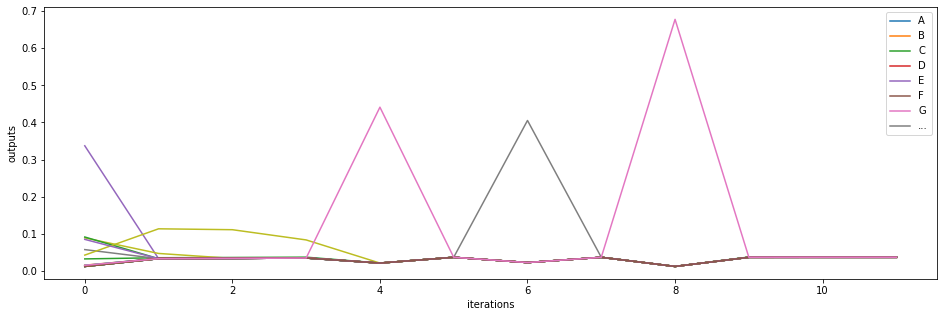

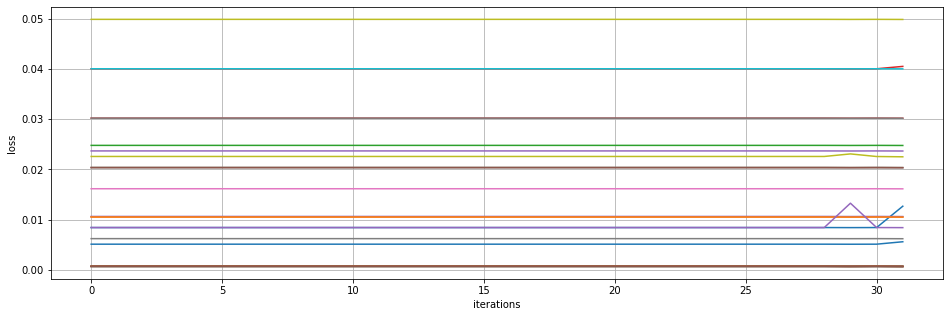

PQYWZAIUDSRI AVGRENIE GRUADNME CPNDAGAUE
---------------
epoch 1280
---------------
epoch 1285
---------------
epoch 1290
-----------------
average loss: 
[[0.00837069]
 [0.01048304]
 [0.02033331]
 [0.03018359]
 [0.01060971]
 [0.00063276]
 [0.02033331]
 [0.03018359]
 [0.00505558]
 [0.00063276]
 [0.00063276]
 [0.01048304]
 [0.02475499]
 [0.04003386]
 [0.00837068]
 [0.02033331]
 [0.00063276]
 [0.00615985]
 [0.04954434]
 [0.04003387]
 [0.00505445]
 [0.00063276]
 [0.00063276]
 [0.00063276]
 [0.02364956]
 [0.00063276]
 [0.0161086 ]]


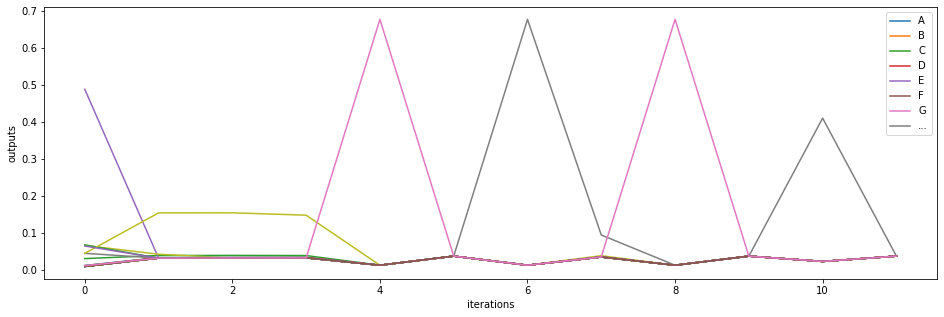

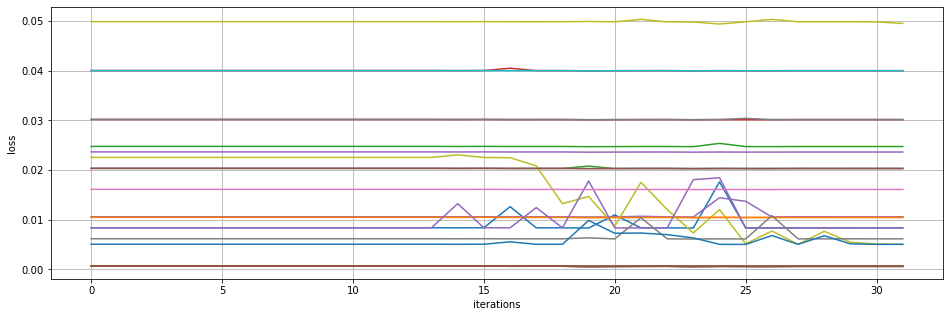

AVPREB C NR AXK ALG RPO SOME MDFCRT A ME
---------------
epoch 1295
---------------
epoch 1300
---------------
epoch 1305
-----------------
average loss: 
[[0.0083712 ]
 [0.01048356]
 [0.02033384]
 [0.0301841 ]
 [0.01058208]
 [0.00063329]
 [0.02033384]
 [0.03018411]
 [0.005055  ]
 [0.00063329]
 [0.00063329]
 [0.01048356]
 [0.02475551]
 [0.04003438]
 [0.0083712 ]
 [0.02033383]
 [0.00063329]
 [0.00616037]
 [0.04988418]
 [0.04003439]
 [0.00505495]
 [0.00063329]
 [0.00063329]
 [0.00063329]
 [0.02365009]
 [0.00063329]
 [0.01610911]]


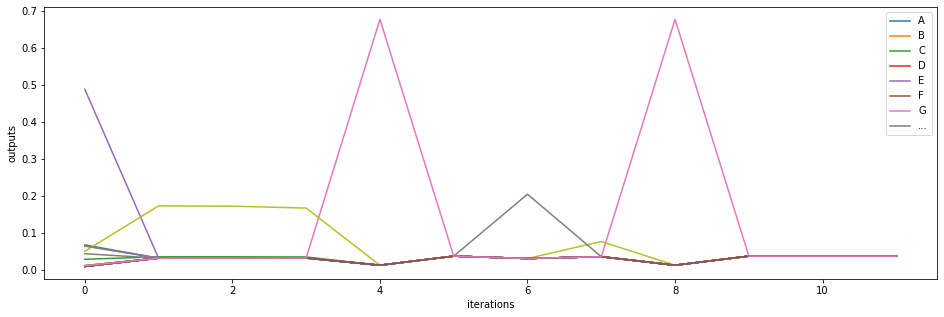

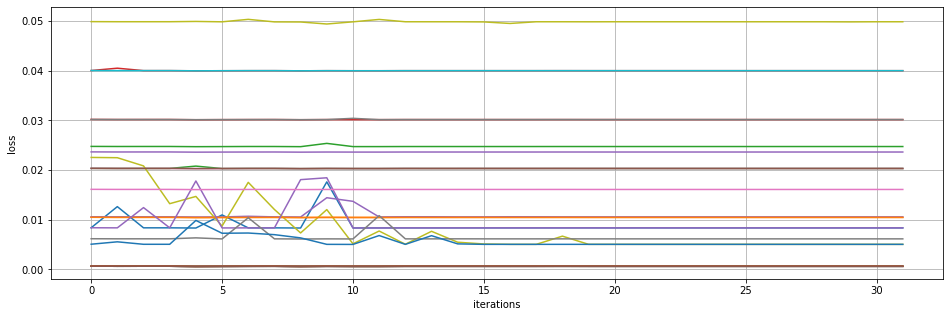

ZOVERY MUYCY RAOERB O BMG NADECBMF QOSEQ
---------------
epoch 1310
---------------
epoch 1315
---------------
epoch 1320
-----------------
average loss: 
[[0.0083712 ]
 [0.01048356]
 [0.02033384]
 [0.03018411]
 [0.01058203]
 [0.00063329]
 [0.02033384]
 [0.03018411]
 [0.00505496]
 [0.00063329]
 [0.00063329]
 [0.01048356]
 [0.0247555 ]
 [0.04003436]
 [0.0083712 ]
 [0.02033383]
 [0.00063329]
 [0.00616037]
 [0.04988466]
 [0.04003439]
 [0.00505495]
 [0.00063329]
 [0.00063329]
 [0.00063329]
 [0.02365009]
 [0.00063329]
 [0.01610911]]


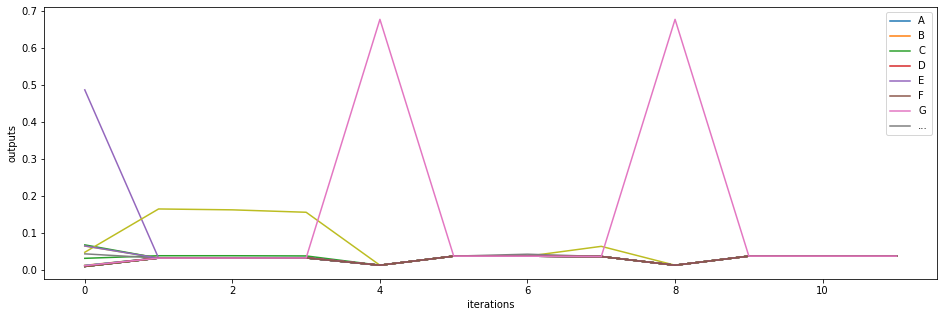

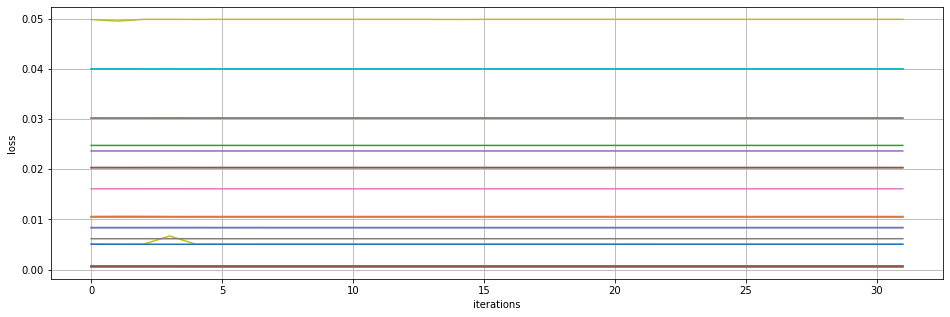

QOKE QODDOOZEFMY PAAEDEY GOOOZME HOJRN A
---------------
epoch 1325
---------------
epoch 1330
---------------
epoch 1335
-----------------
average loss: 
[[0.0083453 ]
 [0.01045766]
 [0.02030794]
 [0.03015821]
 [0.01542471]
 [0.00060738]
 [0.02030794]
 [0.03015821]
 [0.00502906]
 [0.00060738]
 [0.00060738]
 [0.01045766]
 [0.01598474]
 [0.04000845]
 [0.0083453 ]
 [0.02030793]
 [0.00060738]
 [0.00613447]
 [0.04985875]
 [0.04000849]
 [0.00502905]
 [0.00060738]
 [0.00060738]
 [0.00060738]
 [0.02362418]
 [0.00060738]
 [0.01608321]]


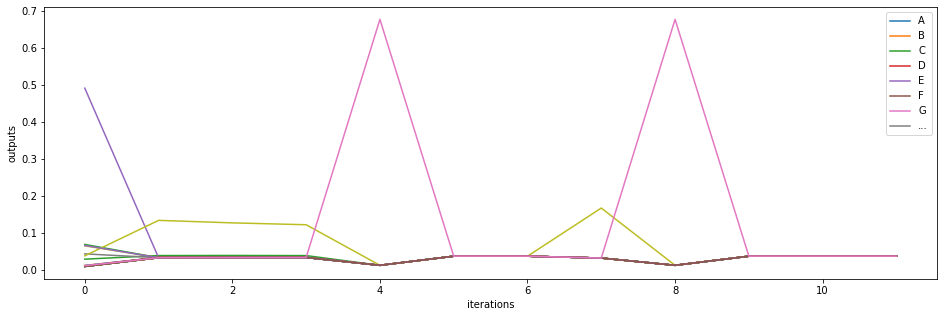

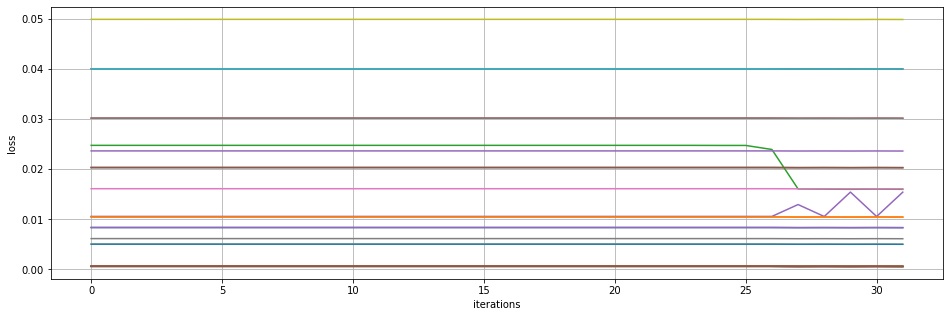

XOME AOPRB  EYES I A F AECFGMVJUPEKI EOM
---------------
epoch 1340
---------------
epoch 1345
---------------
epoch 1350
-----------------
average loss: 
[[0.00835825]
 [0.01047061]
 [0.02032088]
 [0.03017116]
 [0.01056908]
 [0.00062033]
 [0.02032088]
 [0.03017116]
 [0.005042  ]
 [0.00062033]
 [0.00062033]
 [0.01047061]
 [0.01599769]
 [0.04002142]
 [0.00835824]
 [0.02032087]
 [0.00062033]
 [0.00614741]
 [0.04987171]
 [0.04002144]
 [0.005042  ]
 [0.00062033]
 [0.00062033]
 [0.00062033]
 [0.02363713]
 [0.00062033]
 [0.01609616]]


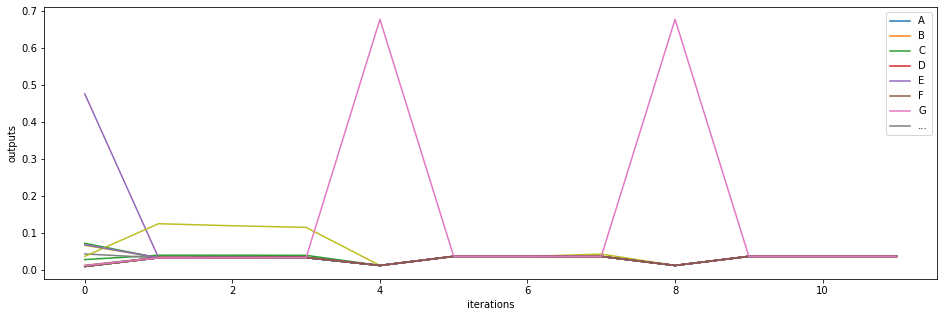

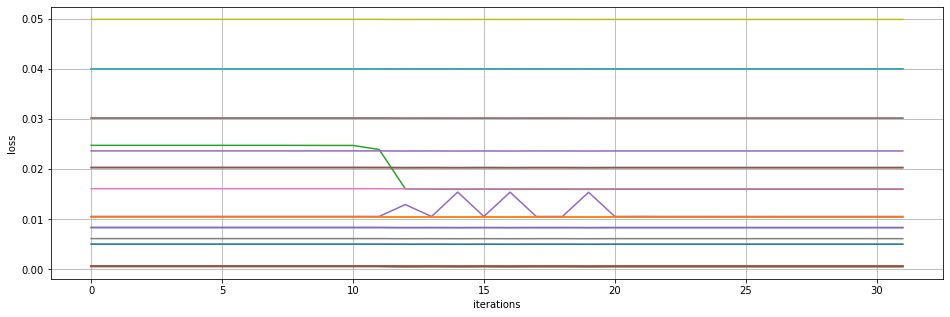

NOME WOURO AZGREYIAOJ PZK TNIA JRENIAERE
---------------
epoch 1355
---------------
epoch 1360
---------------
epoch 1365
-----------------
average loss: 
[[0.00835825]
 [0.01047061]
 [0.02032088]
 [0.03017116]
 [0.01056908]
 [0.00062033]
 [0.02032088]
 [0.03017116]
 [0.005042  ]
 [0.00062033]
 [0.00062033]
 [0.01047061]
 [0.01599769]
 [0.04002143]
 [0.00835824]
 [0.02032088]
 [0.00062033]
 [0.00614741]
 [0.0498717 ]
 [0.04002144]
 [0.005042  ]
 [0.00062033]
 [0.00062033]
 [0.00062033]
 [0.02363713]
 [0.00062033]
 [0.01609616]]


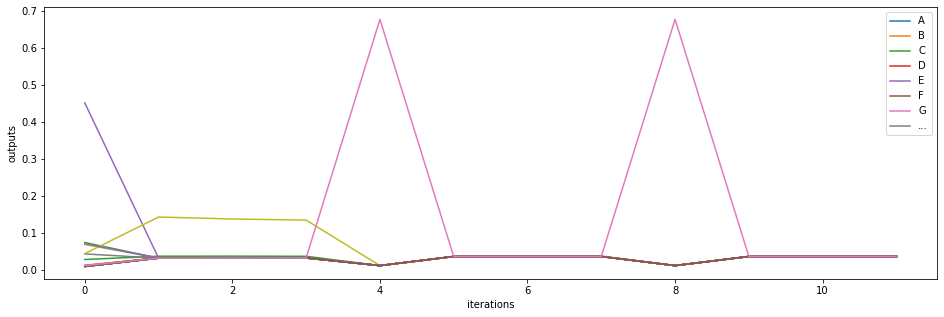

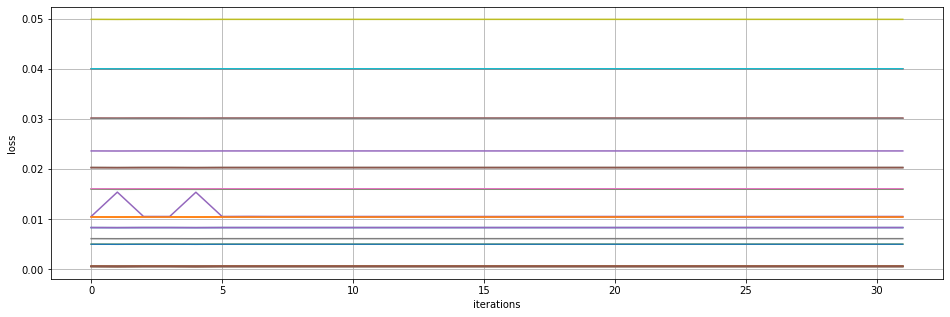

RYBVQWOZEUOAFPARHAVERY KOOKE MY MUKLGETY
---------------
epoch 1370
---------------
epoch 1375
---------------
epoch 1380
-----------------
average loss: 
[[0.00835825]
 [0.01047061]
 [0.02032088]
 [0.03017116]
 [0.01056908]
 [0.00062033]
 [0.02032088]
 [0.03017116]
 [0.005042  ]
 [0.00062033]
 [0.00062033]
 [0.01047061]
 [0.01599769]
 [0.04002142]
 [0.00835824]
 [0.02032088]
 [0.00062033]
 [0.00614741]
 [0.0498717 ]
 [0.04002144]
 [0.005042  ]
 [0.00062033]
 [0.00062033]
 [0.00062033]
 [0.02363713]
 [0.00062033]
 [0.01609616]]


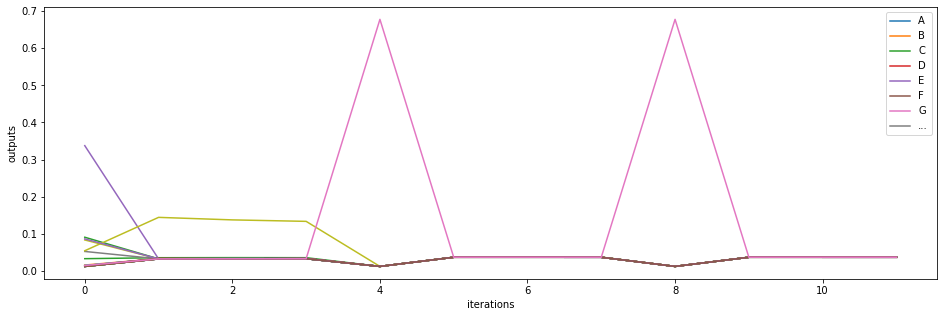

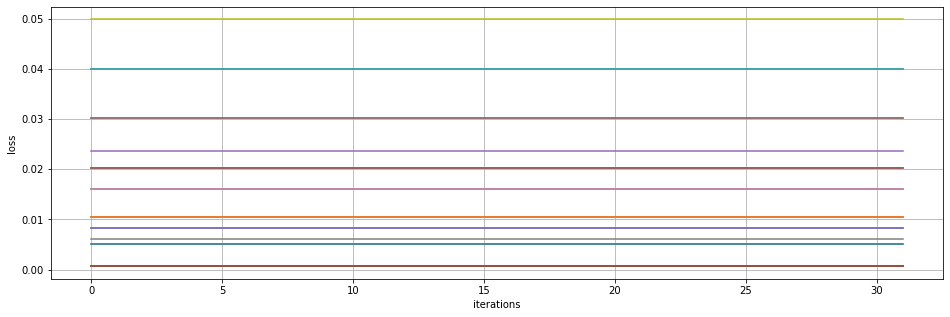

VOJQOW ENCOCEZ AGME OD IONWJKEVLAOKW ALS
---------------
epoch 1385
---------------
epoch 1390
---------------
epoch 1395
-----------------
average loss: 
[[0.00835825]
 [0.01047061]
 [0.02032088]
 [0.03017116]
 [0.01056908]
 [0.00062033]
 [0.02032088]
 [0.03017116]
 [0.005042  ]
 [0.00062033]
 [0.00062033]
 [0.01047061]
 [0.01599769]
 [0.04002142]
 [0.00835824]
 [0.02032088]
 [0.00062033]
 [0.00614741]
 [0.0498717 ]
 [0.04002144]
 [0.005042  ]
 [0.00062033]
 [0.00062033]
 [0.00062033]
 [0.02363713]
 [0.00062033]
 [0.01609616]]


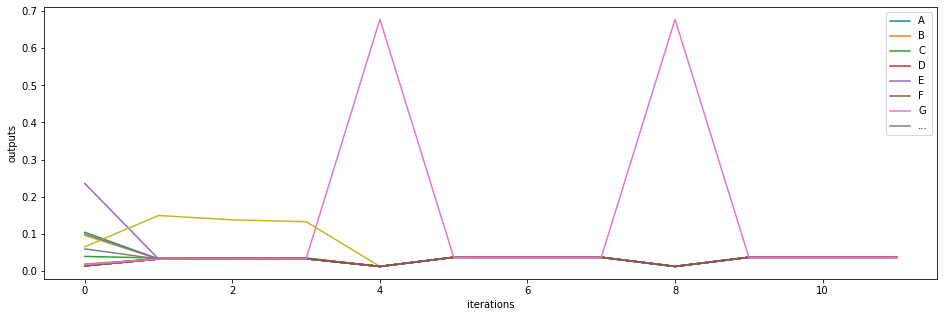

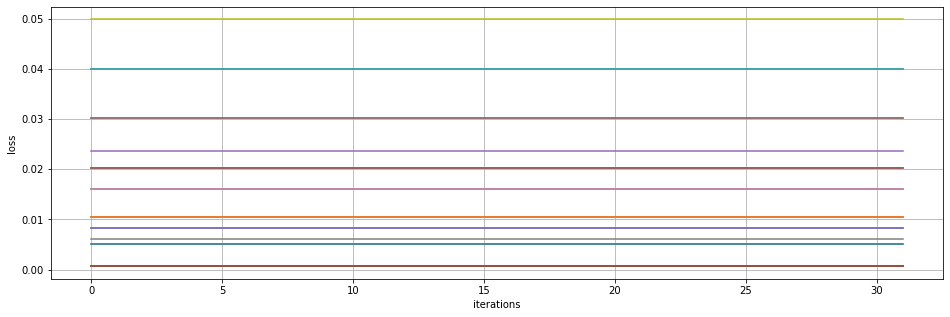

RKVXKLAQTEATB JIAN AAR  QEMS MTYEERE JOU
---------------
epoch 1400
---------------
epoch 1405
---------------
epoch 1410
-----------------
average loss: 
[[0.00835825]
 [0.01047061]
 [0.02032088]
 [0.03017116]
 [0.01056908]
 [0.00062033]
 [0.02032088]
 [0.03017116]
 [0.005042  ]
 [0.00062033]
 [0.00062033]
 [0.01047061]
 [0.01599769]
 [0.04002143]
 [0.00835824]
 [0.02032088]
 [0.00062033]
 [0.00614741]
 [0.0498717 ]
 [0.04002144]
 [0.005042  ]
 [0.00062033]
 [0.00062033]
 [0.00062033]
 [0.02363713]
 [0.00062033]
 [0.01609616]]


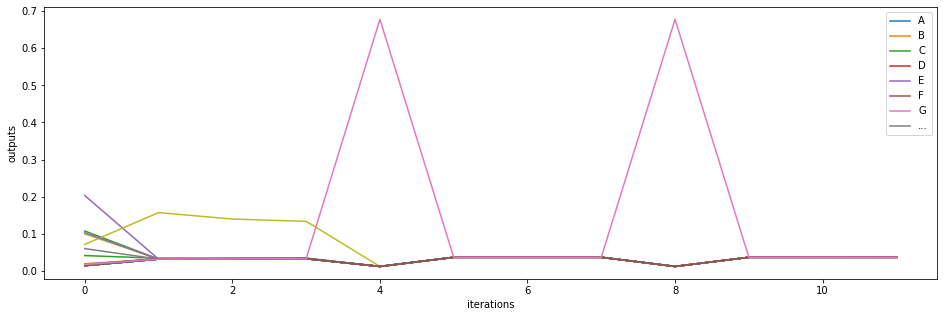

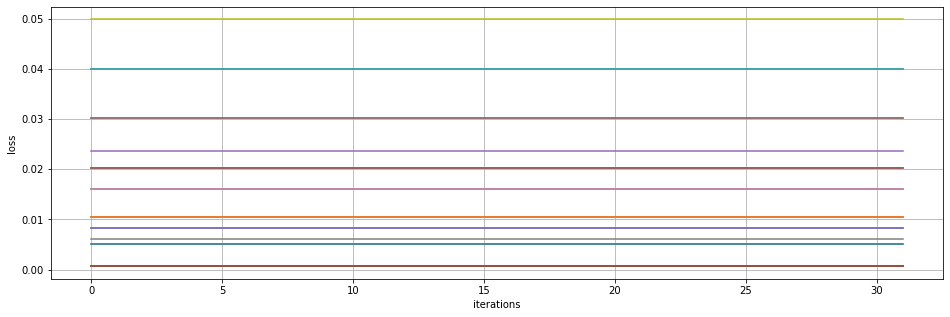

SOME JOU MI AXZ A K ANJ YTAJLJ EVME MVZH
---------------
epoch 1415
---------------
epoch 1420
---------------
epoch 1425
-----------------
average loss: 
[[0.00835824]
 [0.01047061]
 [0.02032088]
 [0.03017116]
 [0.01056908]
 [0.00062033]
 [0.02032088]
 [0.03017116]
 [0.005042  ]
 [0.00062033]
 [0.00062033]
 [0.01047061]
 [0.01599769]
 [0.04002143]
 [0.00835824]
 [0.02032088]
 [0.00062033]
 [0.00614741]
 [0.0498717 ]
 [0.04002144]
 [0.005042  ]
 [0.00062033]
 [0.00062033]
 [0.00062033]
 [0.02363713]
 [0.00062033]
 [0.01609616]]


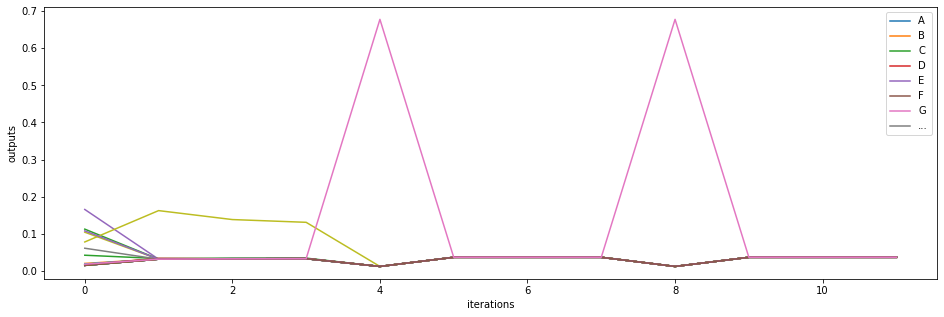

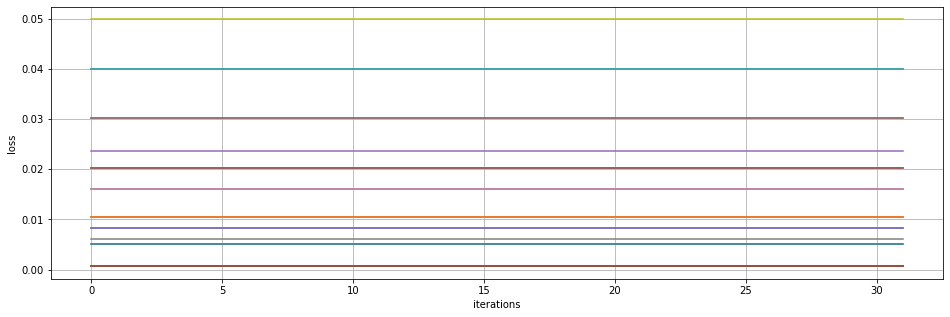

TUII AZZRMJAVE HOXMP AGT XJ ANI AQCUKDAQ
---------------
epoch 1430
---------------
epoch 1435
---------------
epoch 1440
-----------------
average loss: 
[[0.00835824]
 [0.01047061]
 [0.02032088]
 [0.03017116]
 [0.01056908]
 [0.00062033]
 [0.02032088]
 [0.03017116]
 [0.005042  ]
 [0.00062033]
 [0.00062033]
 [0.01047061]
 [0.01599769]
 [0.04002143]
 [0.00835824]
 [0.02032088]
 [0.00062033]
 [0.00614741]
 [0.0498717 ]
 [0.04002144]
 [0.005042  ]
 [0.00062033]
 [0.00062033]
 [0.00062033]
 [0.02363713]
 [0.00062033]
 [0.01609616]]


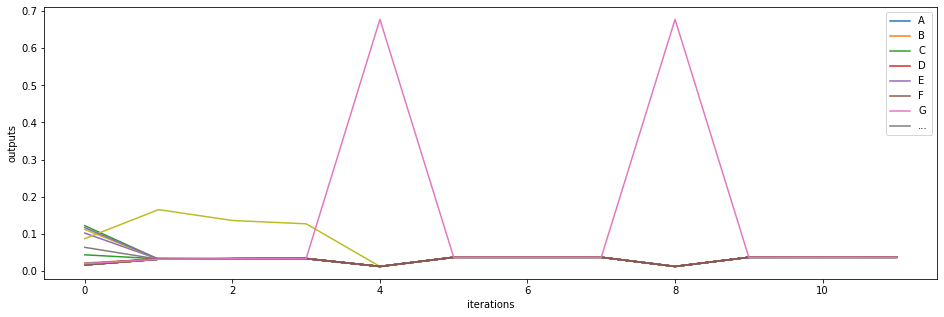

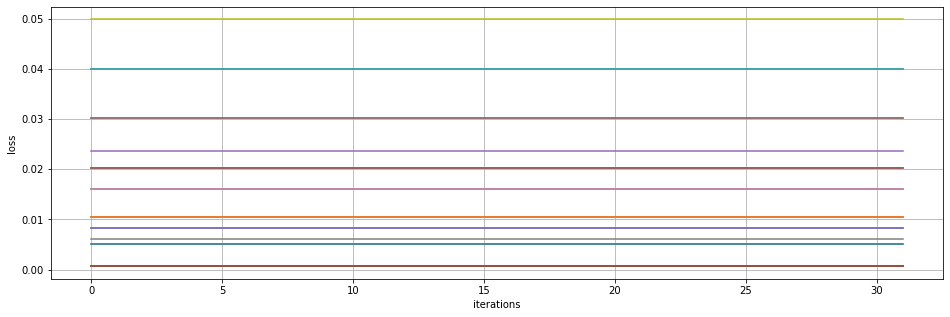

OOTE ULHHMZOQEEVW ACZ IODFNARE OPBVWMB Y
---------------
epoch 1445
---------------
epoch 1450
---------------
epoch 1455
-----------------
average loss: 
[[0.00835824]
 [0.01047061]
 [0.02032088]
 [0.03017116]
 [0.01056908]
 [0.00062033]
 [0.02032088]
 [0.03017116]
 [0.005042  ]
 [0.00062033]
 [0.00062033]
 [0.01047061]
 [0.01599769]
 [0.04002143]
 [0.00835824]
 [0.02032088]
 [0.00062033]
 [0.00614741]
 [0.04987169]
 [0.04002144]
 [0.005042  ]
 [0.00062033]
 [0.00062033]
 [0.00062033]
 [0.02363713]
 [0.00062033]
 [0.01609616]]


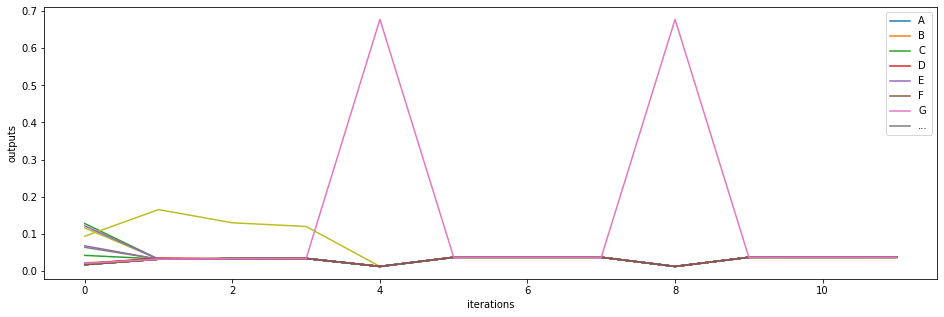

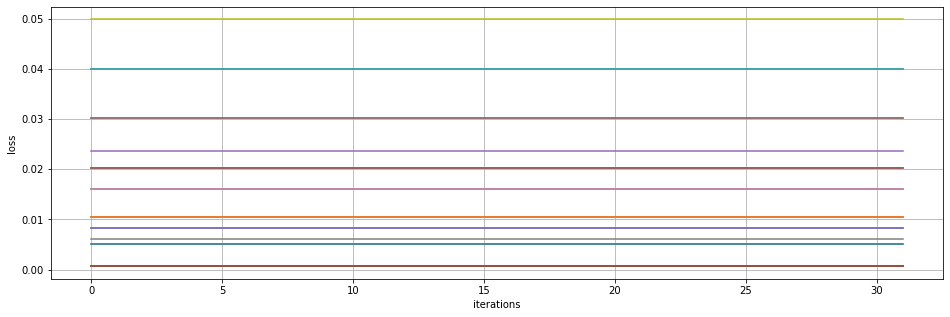

APJAZHAME MY QARE IL JOLGKTGCZKLTCTERMQ 
---------------
epoch 1460
---------------
epoch 1465
---------------
epoch 1470
-----------------
average loss: 
[[0.00835825]
 [0.01047061]
 [0.02032088]
 [0.03017116]
 [0.01056908]
 [0.00062033]
 [0.02032088]
 [0.03017116]
 [0.005042  ]
 [0.00062033]
 [0.00062033]
 [0.01047061]
 [0.01599769]
 [0.04002143]
 [0.00835824]
 [0.02032088]
 [0.00062033]
 [0.00614741]
 [0.04987169]
 [0.04002144]
 [0.005042  ]
 [0.00062033]
 [0.00062033]
 [0.00062033]
 [0.02363713]
 [0.00062033]
 [0.01609616]]


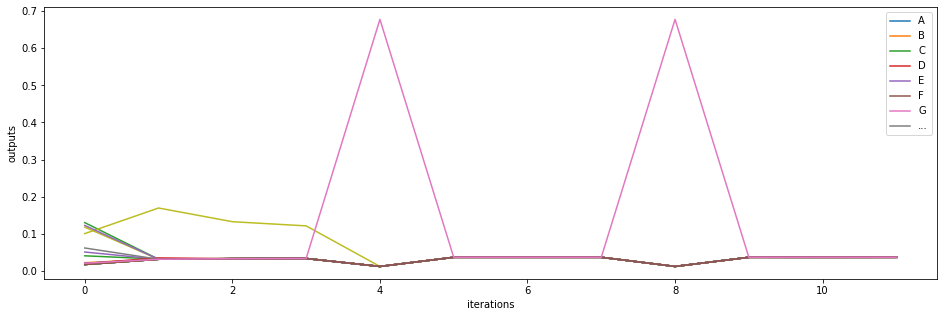

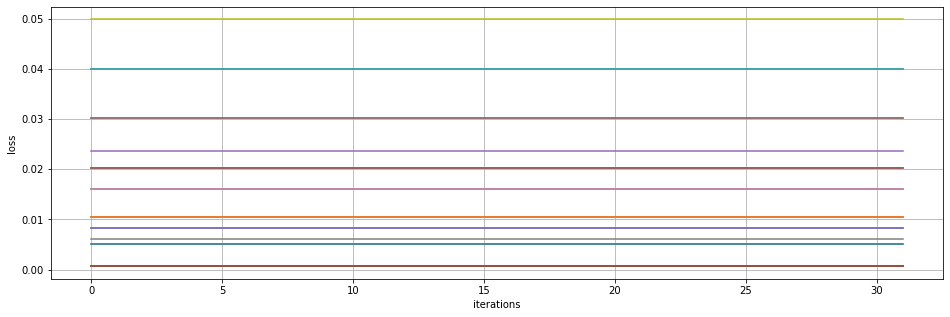

DO QAIZABIFRT PLI AWN AI  PJBCRAGB ACS Y
---------------
epoch 1475
---------------
epoch 1480
---------------
epoch 1485
-----------------
average loss: 
[[0.00835825]
 [0.01047061]
 [0.02032088]
 [0.03017116]
 [0.01056908]
 [0.00062033]
 [0.02032088]
 [0.03017116]
 [0.005042  ]
 [0.00062033]
 [0.00062033]
 [0.01047061]
 [0.01599769]
 [0.04002143]
 [0.00835824]
 [0.02032088]
 [0.00062033]
 [0.00614741]
 [0.04987168]
 [0.04002144]
 [0.005042  ]
 [0.00062033]
 [0.00062033]
 [0.00062033]
 [0.02363713]
 [0.00062033]
 [0.01609616]]


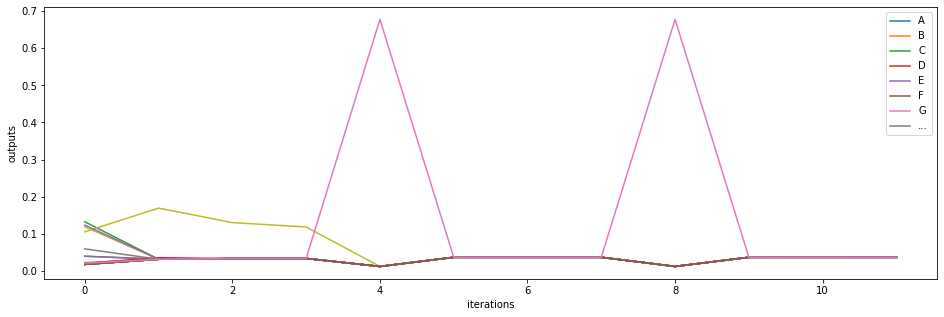

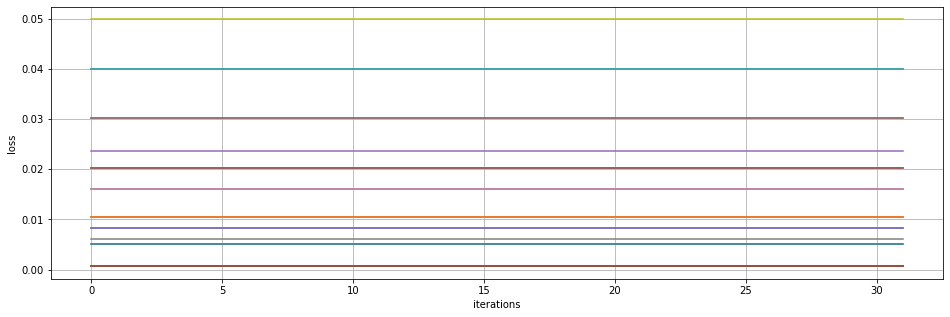

RWS WKZAFO  RB ADTBAIY ROXJJUNQ CXZ PTXA
---------------
epoch 1490
---------------
epoch 1495
---------------
epoch 1500
-----------------
average loss: 
[[0.00835825]
 [0.01047061]
 [0.02032088]
 [0.03017115]
 [0.01056908]
 [0.00062033]
 [0.02032088]
 [0.03017116]
 [0.005042  ]
 [0.00062033]
 [0.00062033]
 [0.01047061]
 [0.01599769]
 [0.04002143]
 [0.00835824]
 [0.02032088]
 [0.00062033]
 [0.00614741]
 [0.04987168]
 [0.04002144]
 [0.005042  ]
 [0.00062033]
 [0.00062033]
 [0.00062033]
 [0.02363713]
 [0.00062033]
 [0.01609616]]


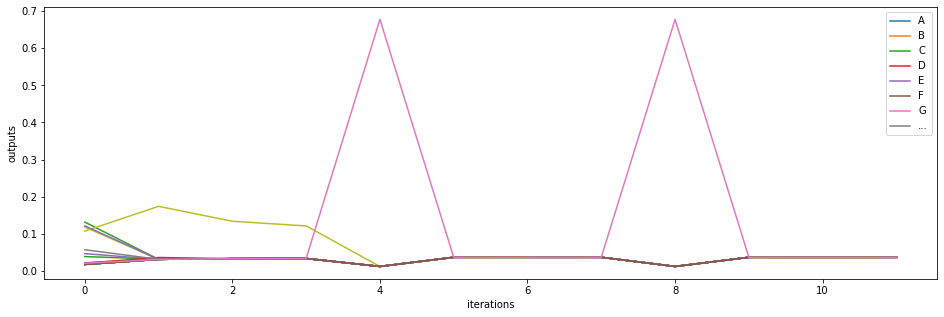

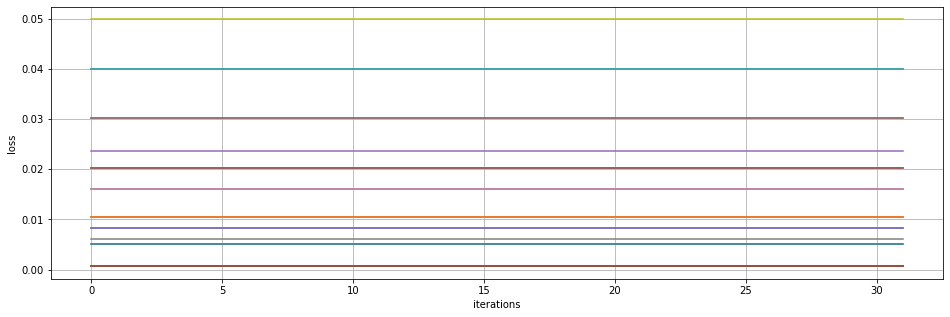

YOME SOPBETUAZRY HOGRP APK ABIAJFME ME M
---------------
epoch 1505
---------------
epoch 1510
---------------
epoch 1515
-----------------
average loss: 
[[0.00835825]
 [0.01047061]
 [0.02032088]
 [0.03017115]
 [0.01056908]
 [0.00062033]
 [0.02032088]
 [0.03017116]
 [0.005042  ]
 [0.00062033]
 [0.00062033]
 [0.01047061]
 [0.01599769]
 [0.04002142]
 [0.00835824]
 [0.02032088]
 [0.00062033]
 [0.00614741]
 [0.04987167]
 [0.04002144]
 [0.005042  ]
 [0.00062033]
 [0.00062033]
 [0.00062033]
 [0.02363713]
 [0.00062033]
 [0.01609616]]


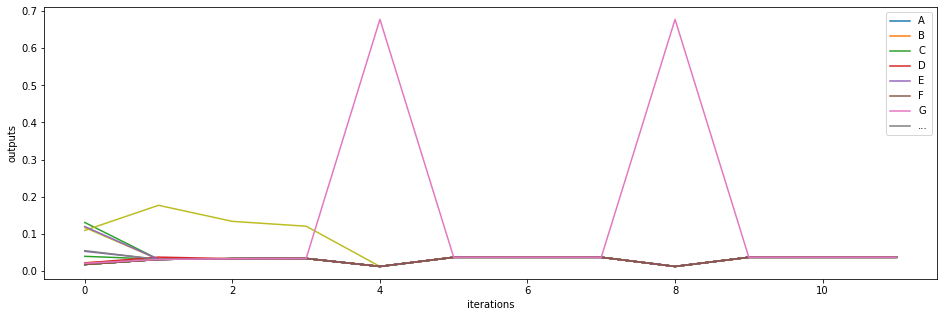

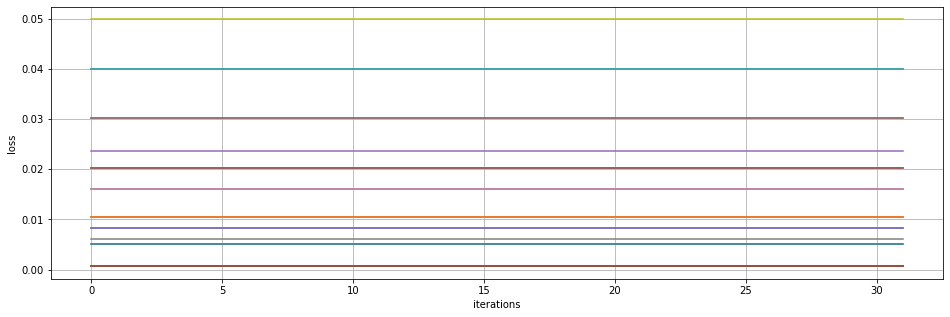

NOME HOURJ ASK DYIAT  MQ API AAXDCQXVXB 
---------------
epoch 1520
---------------
epoch 1525
---------------
epoch 1530
-----------------
average loss: 
[[0.00835825]
 [0.01047061]
 [0.02032088]
 [0.03017116]
 [0.01056908]
 [0.00062033]
 [0.02032088]
 [0.03017116]
 [0.005042  ]
 [0.00062033]
 [0.00062033]
 [0.01047061]
 [0.01599769]
 [0.04002142]
 [0.00835824]
 [0.02032088]
 [0.00062033]
 [0.00614741]
 [0.04987166]
 [0.04002144]
 [0.005042  ]
 [0.00062033]
 [0.00062033]
 [0.00062033]
 [0.02363713]
 [0.00062033]
 [0.01609616]]


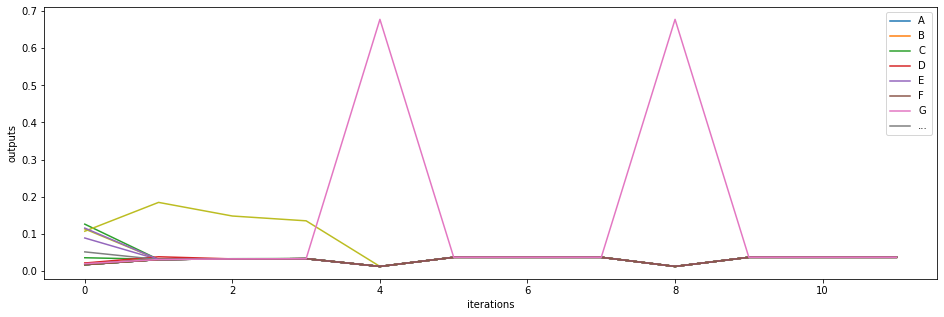

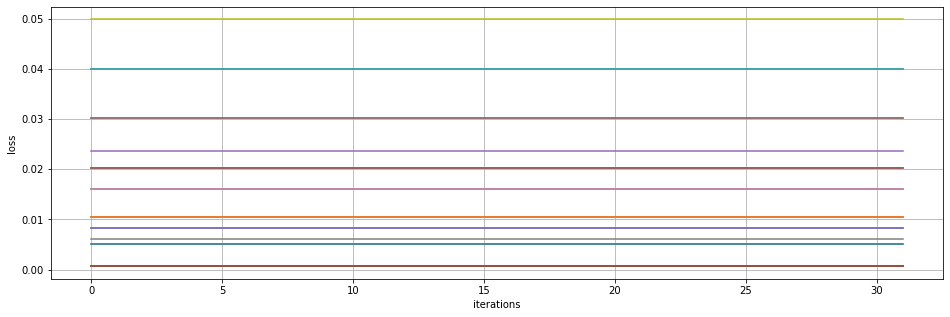

AK  EIGRL AII ALK AXI AJI AUH AJY PONWNY
---------------
epoch 1535
---------------
epoch 1540
---------------
epoch 1545
-----------------
average loss: 
[[0.00835824]
 [0.01047061]
 [0.02032088]
 [0.03017116]
 [0.01056908]
 [0.00062033]
 [0.02032088]
 [0.03017116]
 [0.005042  ]
 [0.00062033]
 [0.00062033]
 [0.01047061]
 [0.01599769]
 [0.04002141]
 [0.00835824]
 [0.02032088]
 [0.00062033]
 [0.00614741]
 [0.04987167]
 [0.04002144]
 [0.005042  ]
 [0.00062033]
 [0.00062033]
 [0.00062033]
 [0.02363713]
 [0.00062033]
 [0.01609616]]


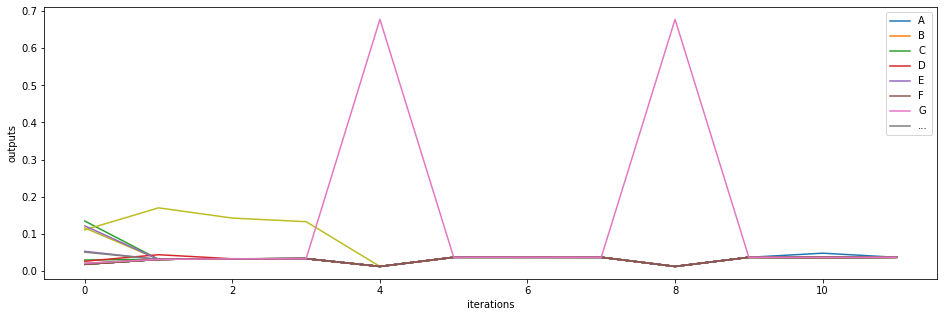

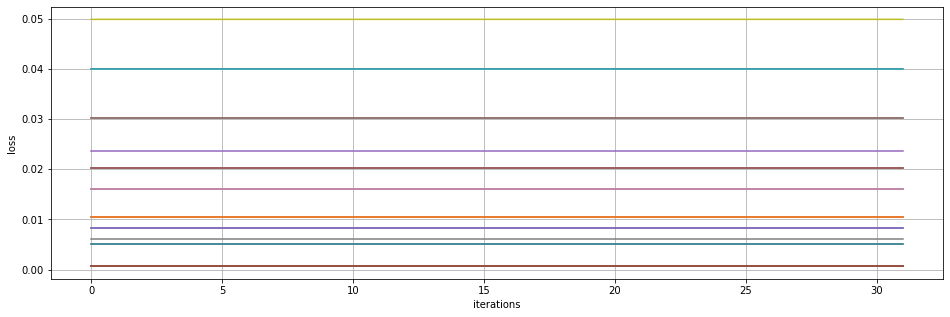

UOME BOYRS AVH A Q HOTEKGEXY MW QDASERI 
---------------
epoch 1550
---------------
epoch 1555
---------------
epoch 1560
-----------------
average loss: 
[[0.00835824]
 [0.01047061]
 [0.02032088]
 [0.03017116]
 [0.01056908]
 [0.00062033]
 [0.02032088]
 [0.03017116]
 [0.005042  ]
 [0.00062033]
 [0.00062033]
 [0.01047061]
 [0.01599769]
 [0.04002141]
 [0.00835824]
 [0.02032088]
 [0.00062033]
 [0.00614741]
 [0.04987166]
 [0.04002144]
 [0.005042  ]
 [0.00062033]
 [0.00062033]
 [0.00062033]
 [0.02363713]
 [0.00062033]
 [0.01609616]]


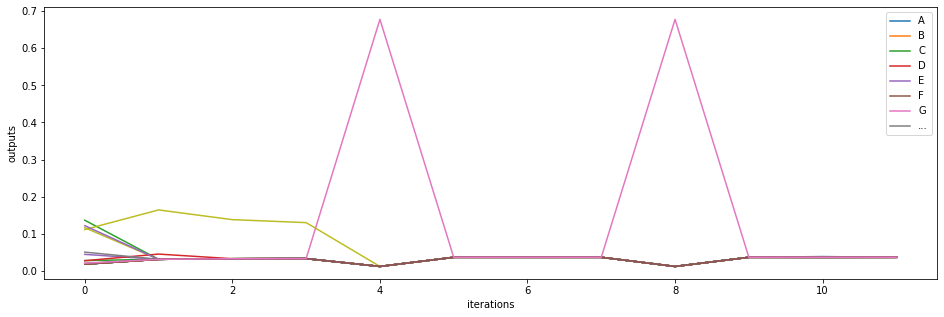

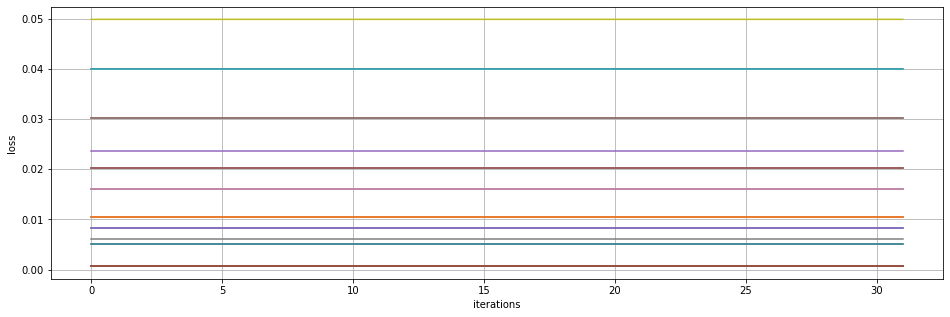

IOME OOLRL AQH AYTEBMZ FCME PATEHFS YCFA
---------------
epoch 1565
---------------
epoch 1570
---------------
epoch 1575
-----------------
average loss: 
[[0.00835825]
 [0.01047061]
 [0.02032088]
 [0.03017116]
 [0.01056908]
 [0.00062033]
 [0.02032088]
 [0.03017116]
 [0.005042  ]
 [0.00062033]
 [0.00062033]
 [0.01047061]
 [0.01599769]
 [0.04002143]
 [0.00835824]
 [0.02032088]
 [0.00062033]
 [0.00614748]
 [0.0498717 ]
 [0.04002144]
 [0.005042  ]
 [0.00062033]
 [0.00062033]
 [0.00062033]
 [0.02363714]
 [0.00062033]
 [0.01609616]]


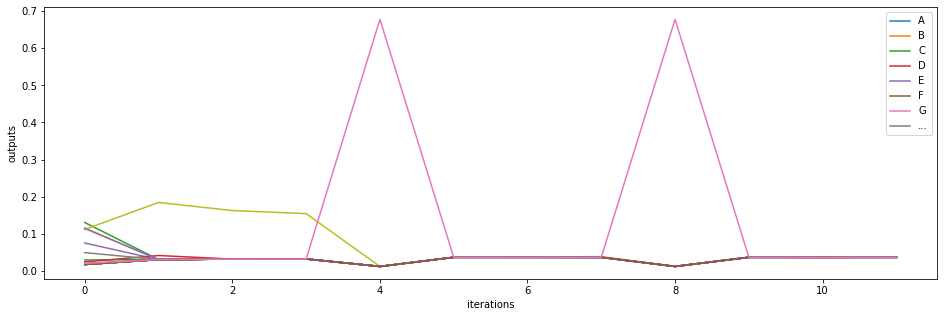

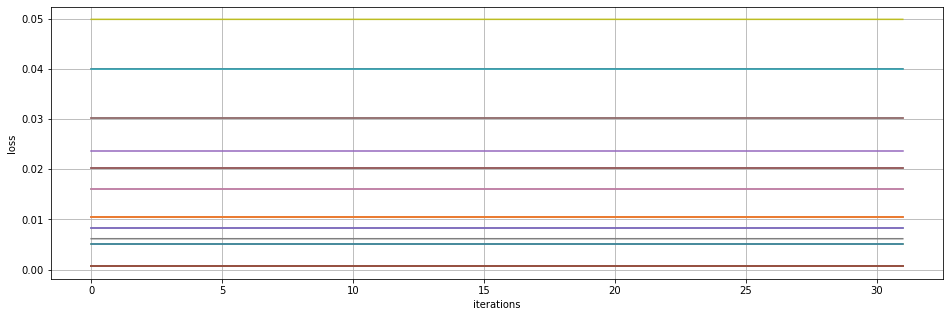

ROME  OIRVSACN AKPGEIAX  ABD NOWERY YONG
---------------
epoch 1580
---------------
epoch 1585
---------------
epoch 1590
-----------------
average loss: 
[[0.00835825]
 [0.01047061]
 [0.02032088]
 [0.03017116]
 [0.01056908]
 [0.00062033]
 [0.02032088]
 [0.03017116]
 [0.005042  ]
 [0.00062033]
 [0.00062033]
 [0.01047061]
 [0.01599769]
 [0.04002143]
 [0.00835824]
 [0.02032088]
 [0.00062033]
 [0.00614741]
 [0.04987167]
 [0.04002144]
 [0.005042  ]
 [0.00062033]
 [0.00062033]
 [0.00062033]
 [0.02363713]
 [0.00062033]
 [0.01609616]]


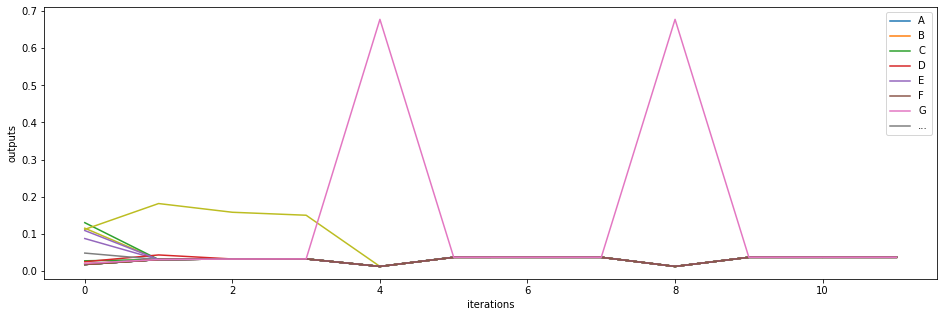

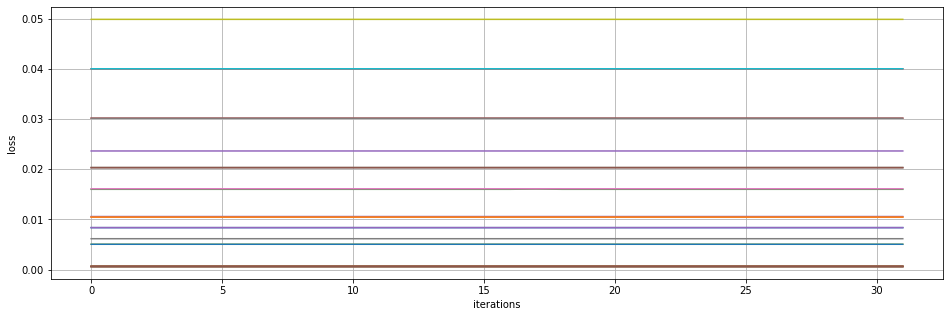

YOME JOFSAVE K H TGSOME DOURF ATF AOE SO
---------------
epoch 1595
---------------
epoch 1600
---------------
epoch 1605
-----------------
average loss: 
[[0.00835824]
 [0.01047061]
 [0.02032088]
 [0.03017116]
 [0.01056908]
 [0.00062033]
 [0.02032088]
 [0.03017116]
 [0.005042  ]
 [0.00062033]
 [0.00062033]
 [0.01047061]
 [0.01599769]
 [0.04002143]
 [0.00835824]
 [0.02032088]
 [0.00062033]
 [0.00614741]
 [0.04987167]
 [0.04002144]
 [0.005042  ]
 [0.00062033]
 [0.00062033]
 [0.00062033]
 [0.02363713]
 [0.00062033]
 [0.01609616]]


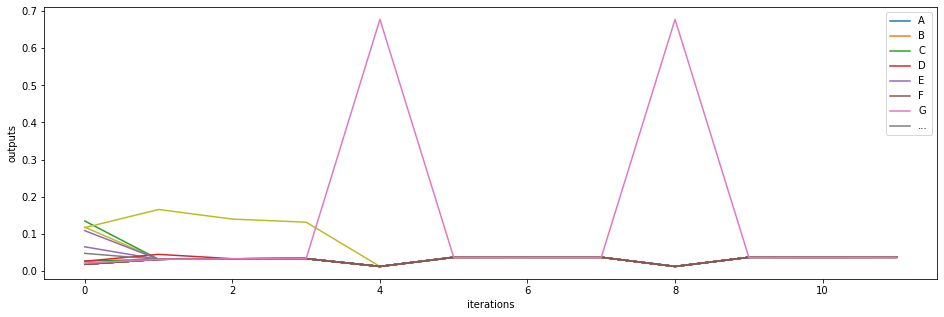

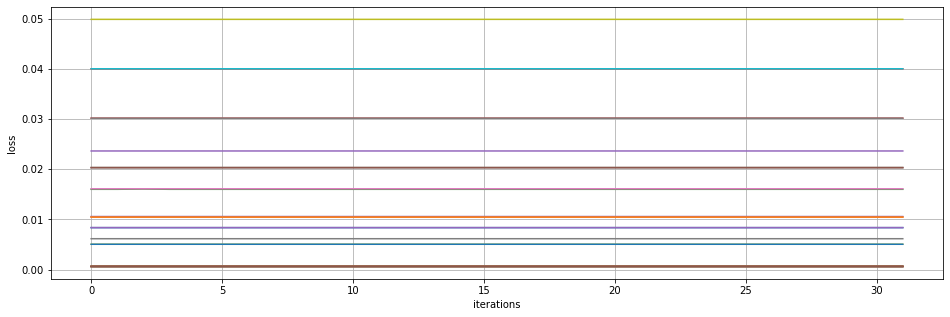

WOME YOUXG AQB WOI AWP ASB WOIXAGV AHI A
---------------
epoch 1610
---------------
epoch 1615
---------------
epoch 1620
-----------------
average loss: 
[[0.00835824]
 [0.01047061]
 [0.02032088]
 [0.03017116]
 [0.01056908]
 [0.00062033]
 [0.02032088]
 [0.03017116]
 [0.005042  ]
 [0.00062033]
 [0.00062033]
 [0.01047061]
 [0.01599769]
 [0.04002143]
 [0.00835824]
 [0.02032088]
 [0.00062033]
 [0.00614741]
 [0.04987167]
 [0.04002144]
 [0.005042  ]
 [0.00062033]
 [0.00062033]
 [0.00062033]
 [0.02363713]
 [0.00062033]
 [0.01609616]]


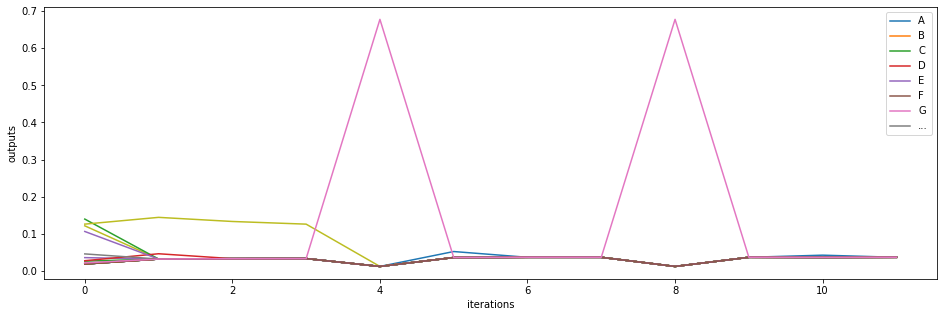

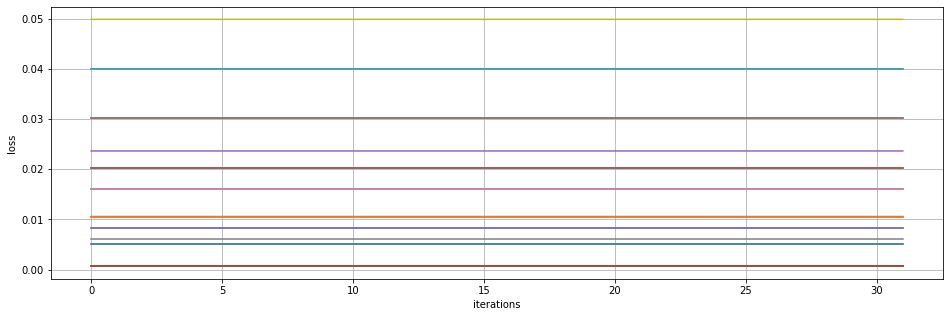

FOME QOTEPLR ASQHPC QGIAELX AUUCT BOVERY
---------------
epoch 1625
---------------
epoch 1630
---------------
epoch 1635
-----------------
average loss: 
[[0.00835804]
 [0.0104704 ]
 [0.02032068]
 [0.03017095]
 [0.01057438]
 [0.00062013]
 [0.02032068]
 [0.03017095]
 [0.00504206]
 [0.00062013]
 [0.00062013]
 [0.0104704 ]
 [0.01599759]
 [0.04002123]
 [0.00835804]
 [0.02032068]
 [0.00062013]
 [0.00614721]
 [0.0498745 ]
 [0.04002123]
 [0.00504179]
 [0.00062013]
 [0.00062013]
 [0.00062013]
 [0.02363693]
 [0.00062013]
 [0.01609595]]


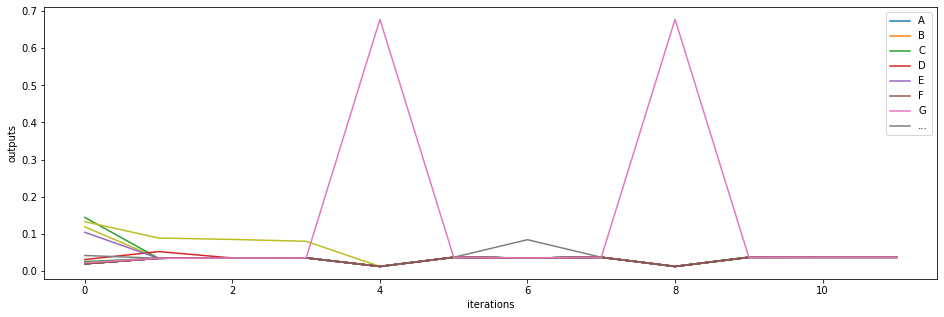

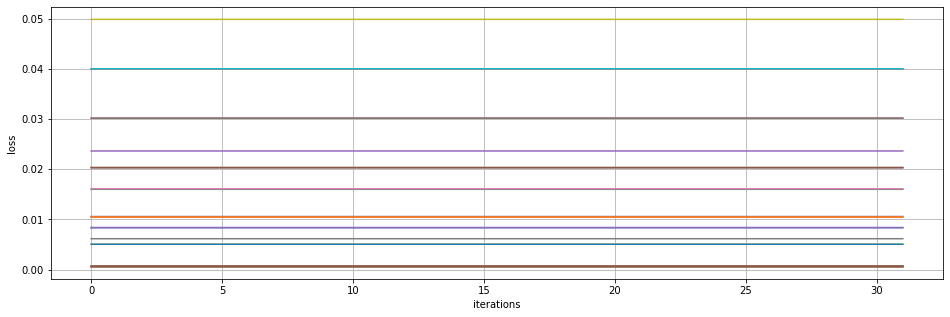

POME DOURA JWRPAW FUBME KIARH AWLRLDAG X
---------------
epoch 1640
---------------
epoch 1645
---------------
epoch 1650
-----------------
average loss: 
[[0.0083465 ]
 [0.01045886]
 [0.02030913]
 [0.03015941]
 [0.01402295]
 [0.00060858]
 [0.02030914]
 [0.03015941]
 [0.0050303 ]
 [0.00060858]
 [0.00060858]
 [0.01045886]
 [0.01598594]
 [0.04000968]
 [0.0083465 ]
 [0.02030914]
 [0.00060858]
 [0.00613566]
 [0.0502228 ]
 [0.04000969]
 [0.00503025]
 [0.00060858]
 [0.00060858]
 [0.00060858]
 [0.02362538]
 [0.00060858]
 [0.01608441]]


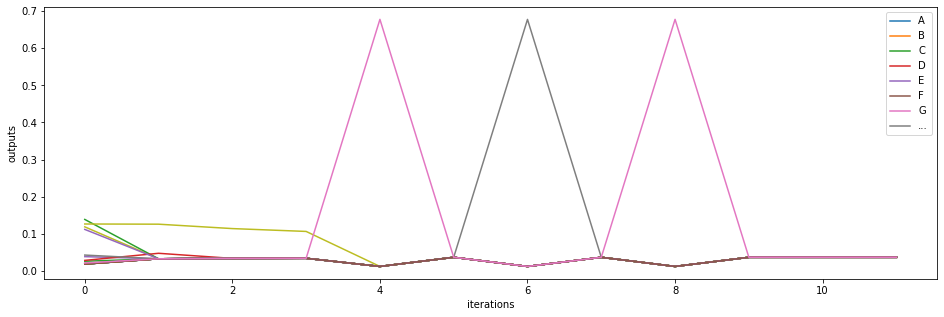

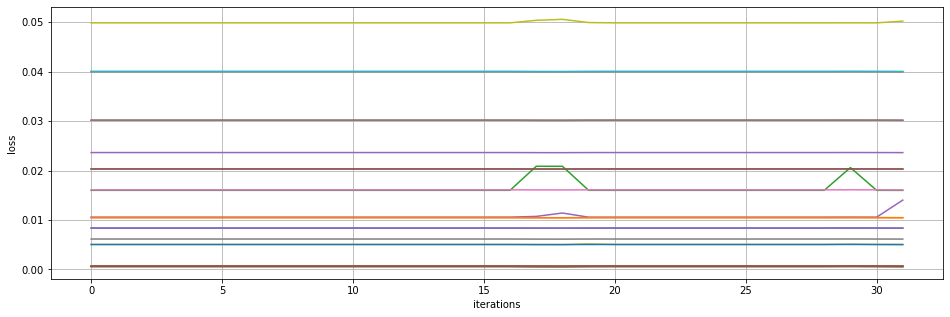

SOME NOURA AUURNKDANL AUXRME IANS XW ZQY
---------------
epoch 1655
---------------
epoch 1660
---------------
epoch 1665
-----------------
average loss: 
[[0.00834489]
 [0.01045725]
 [0.02030752]
 [0.0301578 ]
 [0.01055641]
 [0.00060697]
 [0.02030753]
 [0.0301578 ]
 [0.00502865]
 [0.00060697]
 [0.00060697]
 [0.01045725]
 [0.01598433]
 [0.04000774]
 [0.00834489]
 [0.02030753]
 [0.00060697]
 [0.00968196]
 [0.04763853]
 [0.04000808]
 [0.00502864]
 [0.00060697]
 [0.00060697]
 [0.00060697]
 [0.02362382]
 [0.00060697]
 [0.01608283]]


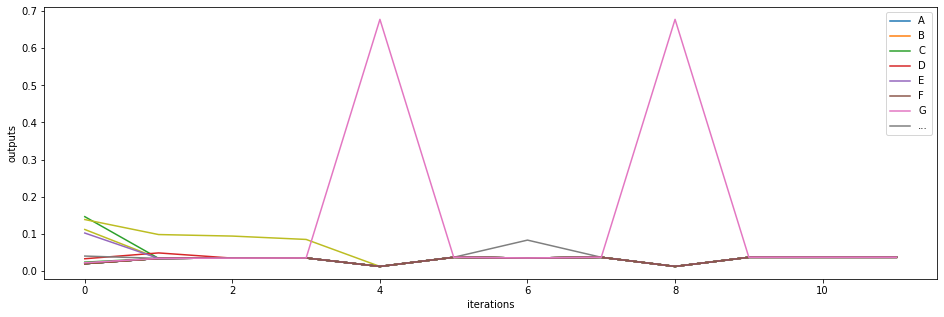

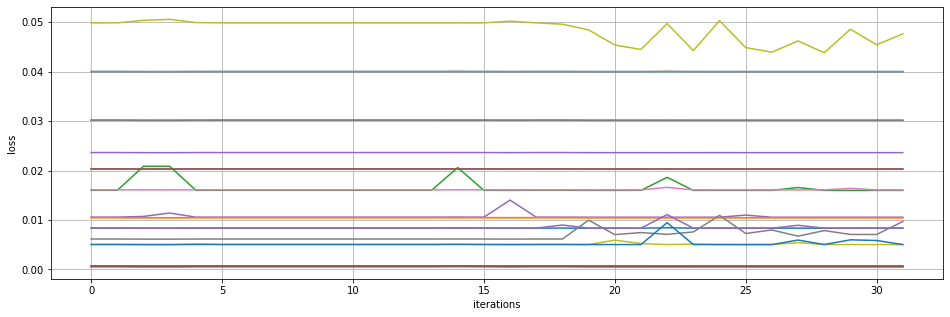

JOME VOZRX AUONUDZAGME RJXERT YOME WONJA
---------------
epoch 1670
---------------
epoch 1675
---------------
epoch 1680
-----------------
average loss: 
[[0.00834439]
 [0.01045659]
 [0.02030687]
 [0.03015714]
 [0.01055536]
 [0.00060632]
 [0.02030687]
 [0.03015715]
 [0.00502803]
 [0.00060632]
 [0.00060632]
 [0.01045659]
 [0.01598368]
 [0.04000737]
 [0.00834423]
 [0.02030687]
 [0.00060632]
 [0.0078936 ]
 [0.04374904]
 [0.04000742]
 [0.00502798]
 [0.00060632]
 [0.00060632]
 [0.00060632]
 [0.02362313]
 [0.00060632]
 [0.01608215]]


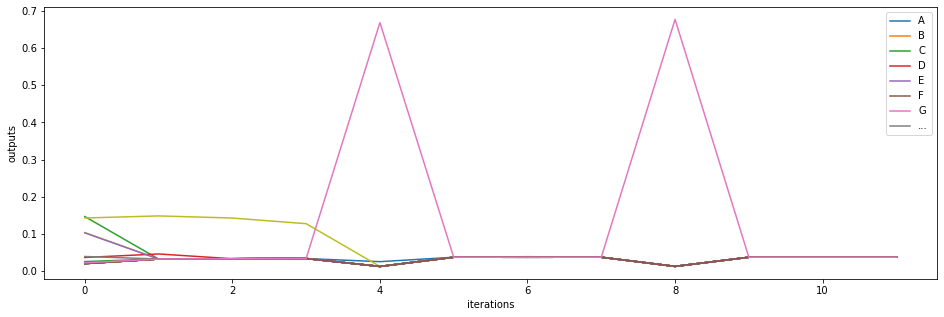

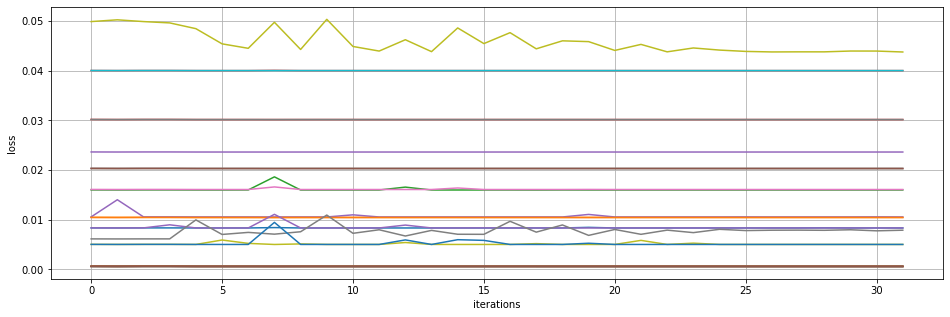

AZQM AR APJJEZV OOZCT A NAERC O RALOCFPB
---------------
epoch 1685
---------------
epoch 1690
---------------
epoch 1695
-----------------
average loss: 
[[0.00835021]
 [0.01045658]
 [0.02030686]
 [0.03015713]
 [0.01055521]
 [0.00060631]
 [0.02030686]
 [0.03015713]
 [0.00502798]
 [0.00060631]
 [0.00060631]
 [0.01045658]
 [0.01598366]
 [0.04000738]
 [0.00834429]
 [0.02030686]
 [0.00060631]
 [0.00783662]
 [0.04384679]
 [0.04000741]
 [0.00502797]
 [0.00060631]
 [0.00060631]
 [0.00060631]
 [0.02362311]
 [0.00060631]
 [0.01608213]]


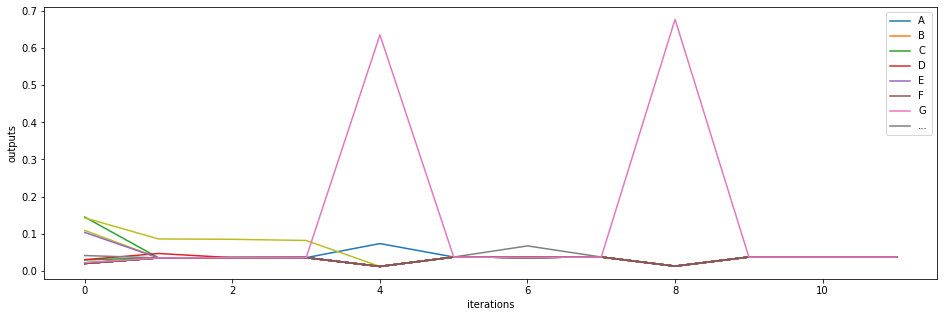

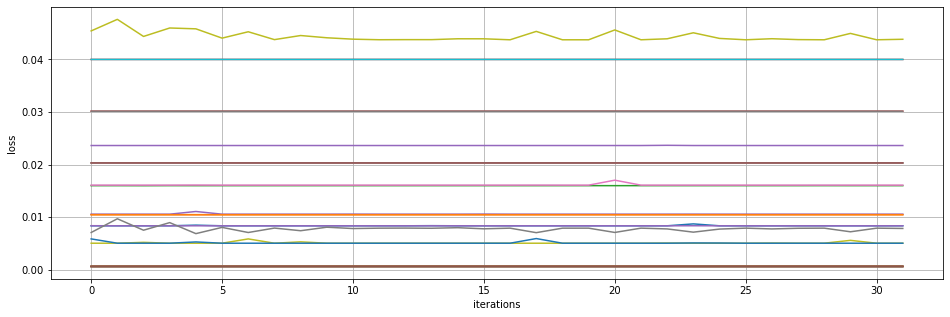

AMK LGYISALE YLMY ZOLLAESAMI NOUERD POME
---------------
epoch 1700
---------------
epoch 1705
---------------
epoch 1710
-----------------
average loss: 
[[0.00834424]
 [0.01045659]
 [0.02030687]
 [0.03015714]
 [0.01055593]
 [0.00060632]
 [0.02030687]
 [0.03015714]
 [0.00502948]
 [0.00060632]
 [0.00060632]
 [0.01045659]
 [0.01598367]
 [0.04000741]
 [0.00834423]
 [0.02030687]
 [0.00060632]
 [0.00787064]
 [0.04378012]
 [0.04000742]
 [0.00502798]
 [0.00060632]
 [0.00060632]
 [0.00060632]
 [0.02362312]
 [0.00060632]
 [0.01608218]]


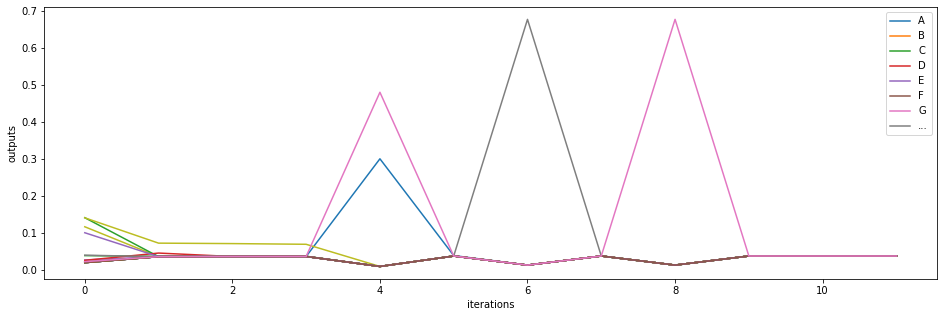

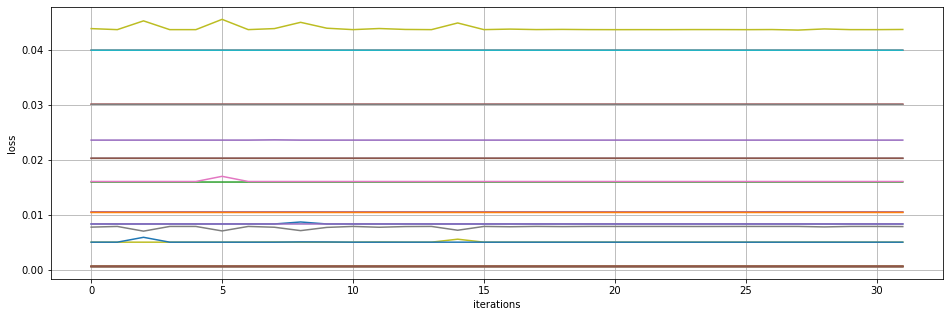

AAUXG ATVZ PHUQONY POPRROA QPDEY XAJGEAN
---------------
epoch 1715
---------------
epoch 1720
---------------
epoch 1725
-----------------
average loss: 
[[0.00834424]
 [0.01045661]
 [0.02030688]
 [0.03015716]
 [0.01055508]
 [0.00060633]
 [0.02030688]
 [0.03015716]
 [0.005028  ]
 [0.00060633]
 [0.00060633]
 [0.01045661]
 [0.01598369]
 [0.04000742]
 [0.00834424]
 [0.02030688]
 [0.00060633]
 [0.00789405]
 [0.04375053]
 [0.04000743]
 [0.005028  ]
 [0.00060633]
 [0.00060633]
 [0.00060633]
 [0.02362313]
 [0.00060633]
 [0.01608216]]


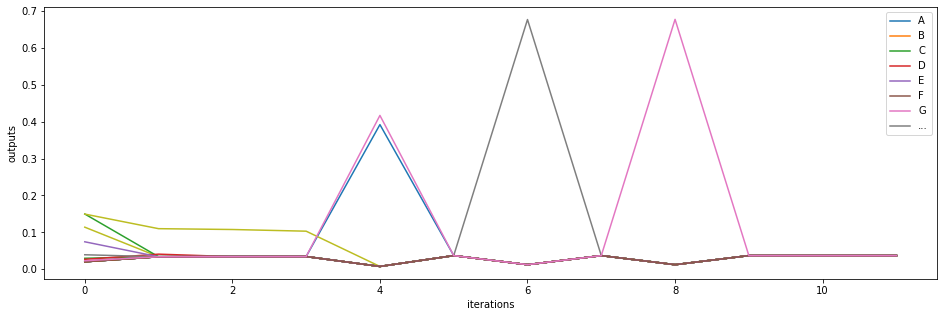

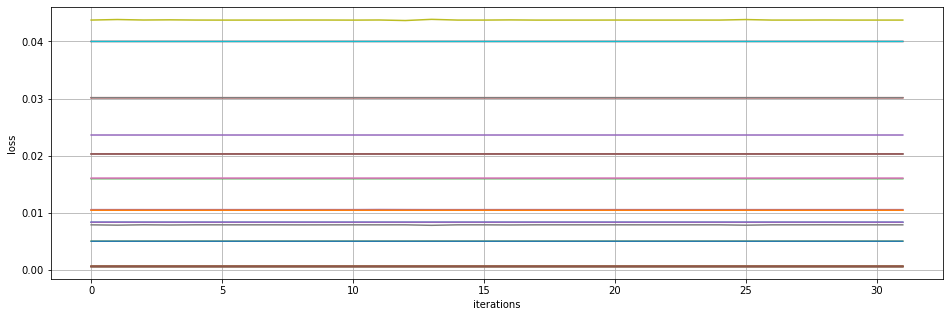

AXKNPAME GY TBAWJ AMK QO XD YOERH ABCG P
---------------
epoch 1730
---------------
epoch 1735
---------------
epoch 1740
-----------------
average loss: 
[[0.00834424]
 [0.01045661]
 [0.02030688]
 [0.03015716]
 [0.01055507]
 [0.00060633]
 [0.02030688]
 [0.03015716]
 [0.005028  ]
 [0.00060633]
 [0.00060633]
 [0.01045661]
 [0.01598369]
 [0.04000742]
 [0.00834424]
 [0.02030688]
 [0.00060633]
 [0.00789375]
 [0.04374967]
 [0.04000743]
 [0.005028  ]
 [0.00060633]
 [0.00060633]
 [0.00060633]
 [0.02362313]
 [0.00060633]
 [0.01608216]]


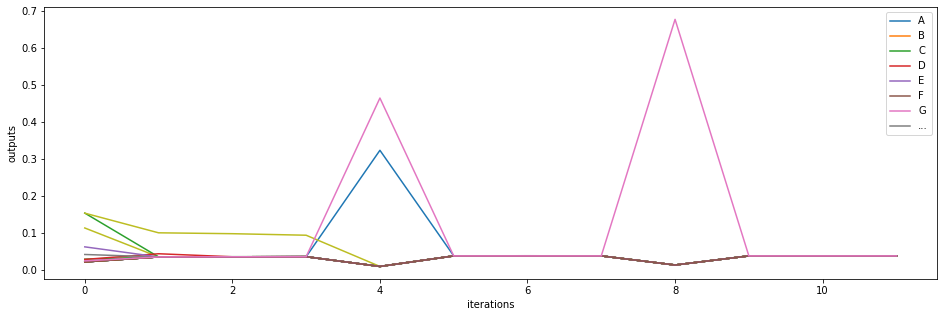

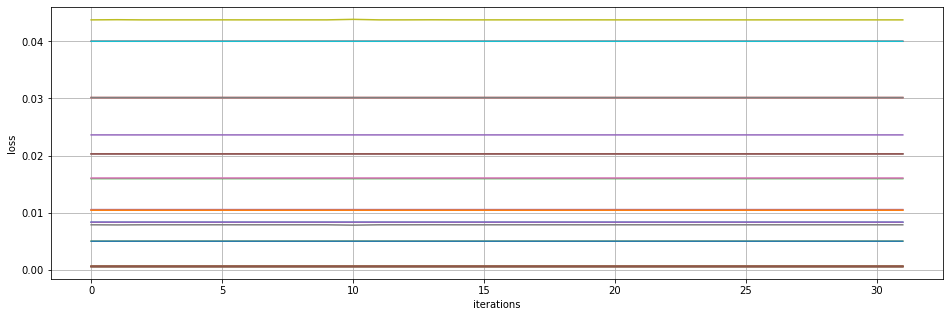

LOME HOYZZ AVOG UNAAAEPME MCARJ OS ERY M
---------------
epoch 1745
---------------
epoch 1750
---------------
epoch 1755
-----------------
average loss: 
[[0.00834424]
 [0.01045661]
 [0.02030688]
 [0.03015716]
 [0.01055508]
 [0.00060633]
 [0.02030688]
 [0.03015716]
 [0.005028  ]
 [0.00060633]
 [0.00060633]
 [0.01045661]
 [0.01598369]
 [0.04000742]
 [0.00834424]
 [0.02030688]
 [0.00060633]
 [0.00789377]
 [0.04374962]
 [0.04000743]
 [0.00502799]
 [0.00060633]
 [0.00060633]
 [0.00060633]
 [0.02362313]
 [0.00060633]
 [0.01608215]]


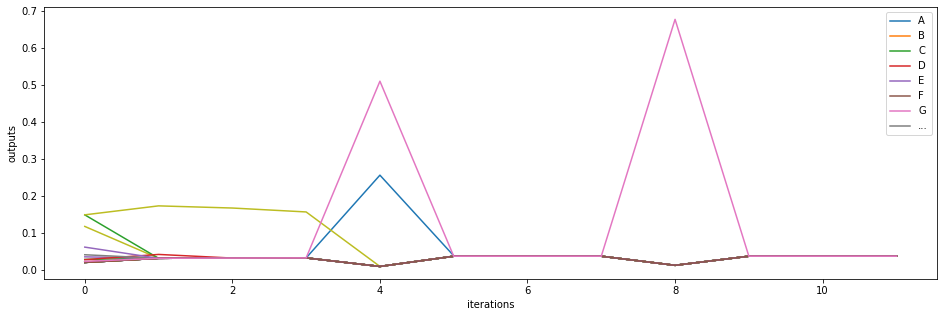

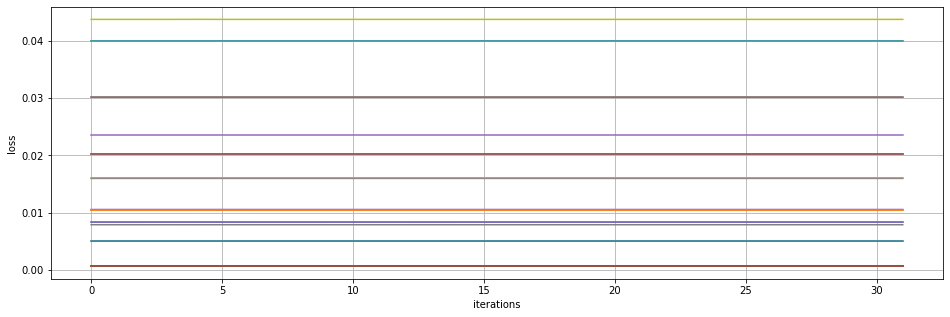

JOME ZOME ZOAHB AGPREOHAN  DK ADAHRB AHG
---------------
epoch 1760
---------------
epoch 1765
---------------
epoch 1770
-----------------
average loss: 
[[0.00834424]
 [0.01045661]
 [0.02030688]
 [0.03015716]
 [0.01055508]
 [0.00060633]
 [0.02030688]
 [0.03015716]
 [0.005028  ]
 [0.00060633]
 [0.00060633]
 [0.01045661]
 [0.01598369]
 [0.04000742]
 [0.00834424]
 [0.02030688]
 [0.00060633]
 [0.00789377]
 [0.04374962]
 [0.04000743]
 [0.00502799]
 [0.00060633]
 [0.00060633]
 [0.00060633]
 [0.02362313]
 [0.00060633]
 [0.01608215]]


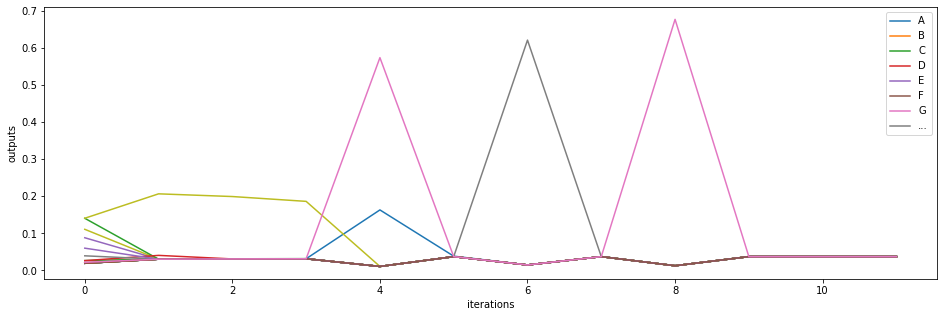

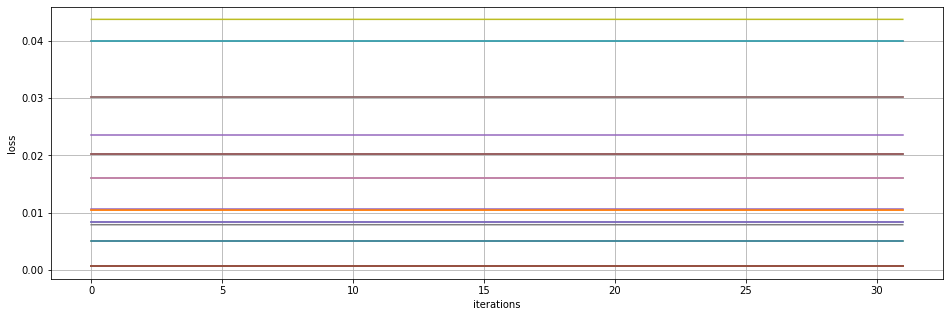

TOBEMG AXZ DRW AXPRJLVKJBAKE YJQ EHPKFCC
---------------
epoch 1775
---------------
epoch 1780
---------------
epoch 1785
-----------------
average loss: 
[[0.00834424]
 [0.01045661]
 [0.02030688]
 [0.03015715]
 [0.01055509]
 [0.00060633]
 [0.02030688]
 [0.03015716]
 [0.005028  ]
 [0.00060633]
 [0.00060633]
 [0.01045661]
 [0.01598369]
 [0.04000742]
 [0.00834424]
 [0.02030688]
 [0.00060633]
 [0.00789377]
 [0.04374942]
 [0.04000743]
 [0.00502799]
 [0.00060633]
 [0.00060633]
 [0.00060633]
 [0.02362313]
 [0.00060633]
 [0.01608215]]


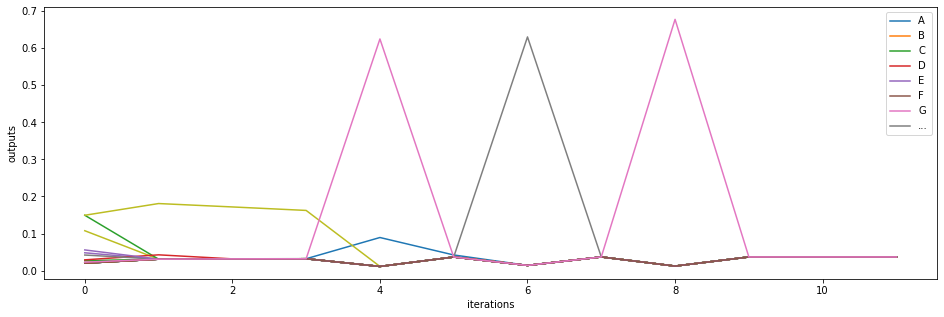

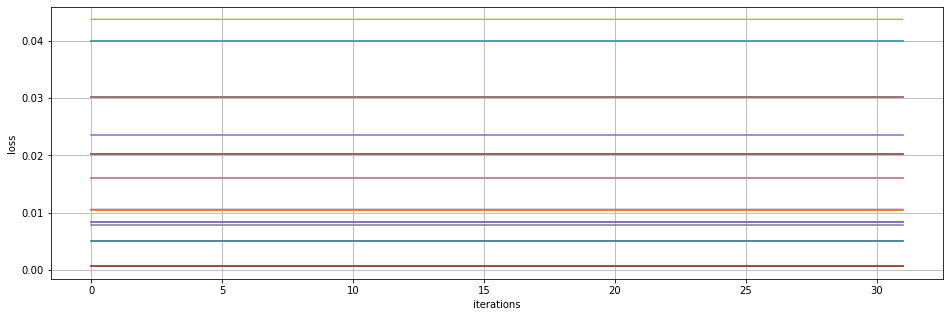

MMQAGY ZAVERY LOJBY TOOGJPHAII ARN AVNRE
---------------
epoch 1790
---------------
epoch 1795
---------------
epoch 1800
-----------------
average loss: 
[[0.00834424]
 [0.01045661]
 [0.02030688]
 [0.03015716]
 [0.01055509]
 [0.00060633]
 [0.02030688]
 [0.03015716]
 [0.005028  ]
 [0.00060633]
 [0.00060633]
 [0.01045661]
 [0.01598369]
 [0.04000741]
 [0.00834424]
 [0.02030688]
 [0.00060633]
 [0.00789377]
 [0.04374955]
 [0.04000743]
 [0.00502799]
 [0.00060633]
 [0.00060633]
 [0.00060633]
 [0.02362313]
 [0.00060633]
 [0.01608216]]


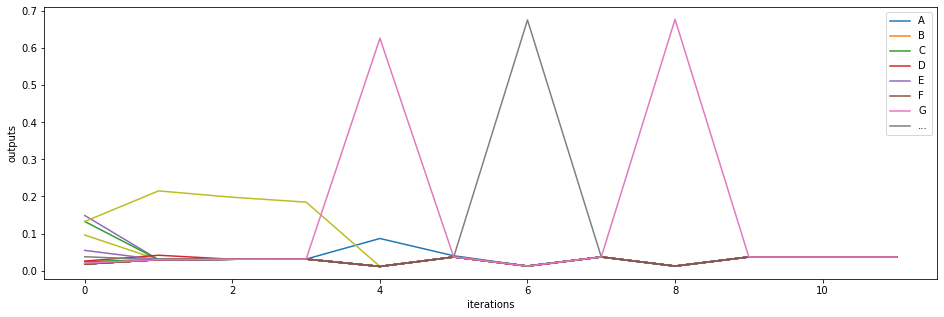

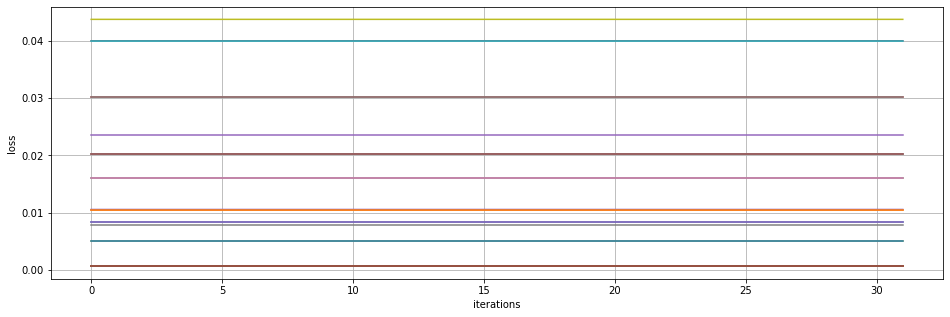

WOME JOTEGEVTE DADVZYAEVR  AMA QAKEOY VA
---------------
epoch 1805
---------------
epoch 1810
---------------
epoch 1815
-----------------
average loss: 
[[0.00834424]
 [0.01045661]
 [0.02030688]
 [0.03015715]
 [0.01055508]
 [0.00060633]
 [0.02030688]
 [0.03015716]
 [0.005028  ]
 [0.00060633]
 [0.00060633]
 [0.01045661]
 [0.01598369]
 [0.04000741]
 [0.00834424]
 [0.02030688]
 [0.00060633]
 [0.00789377]
 [0.04374959]
 [0.04000743]
 [0.00502799]
 [0.00060633]
 [0.00060633]
 [0.00060633]
 [0.02362313]
 [0.00060633]
 [0.01608216]]


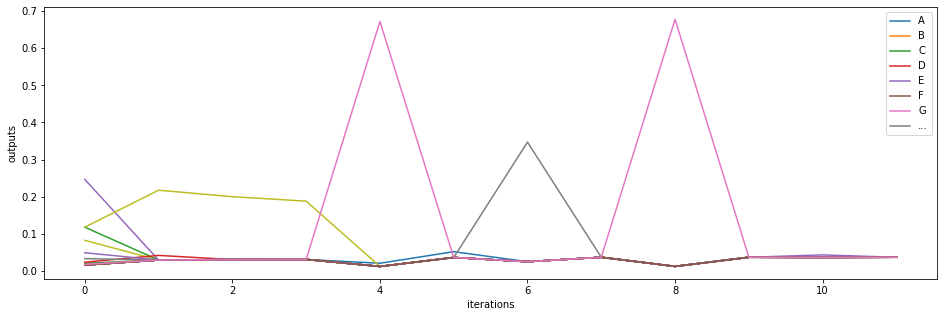

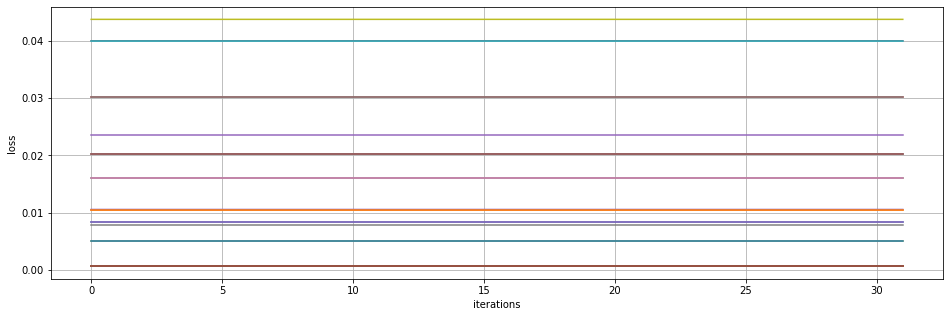

VO WP AAXT AMR HNX ELY JOBMT OOHZJAJCDAQ
---------------
epoch 1820
---------------
epoch 1825
---------------
epoch 1830
-----------------
average loss: 
[[0.00834424]
 [0.0104566 ]
 [0.02030688]
 [0.03015715]
 [0.01055507]
 [0.00060633]
 [0.02030688]
 [0.03015716]
 [0.005028  ]
 [0.00060633]
 [0.00060633]
 [0.0104566 ]
 [0.01598381]
 [0.0400073 ]
 [0.00834424]
 [0.02030688]
 [0.00060633]
 [0.00789377]
 [0.04374963]
 [0.04000743]
 [0.00502799]
 [0.00060633]
 [0.00060633]
 [0.00060633]
 [0.02362314]
 [0.00060633]
 [0.01608215]]


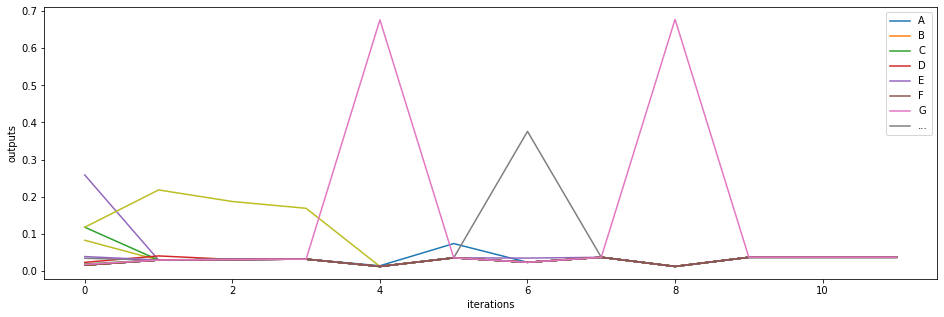

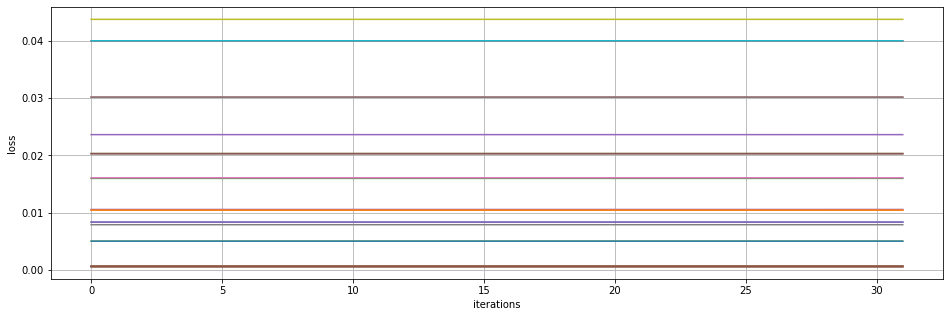

NOME TJUBQ ATRGAFYAUGT DSEDBAFOAUBVNAZVE
---------------
epoch 1835
---------------
epoch 1840
---------------
epoch 1845
-----------------
average loss: 
[[0.00833419]
 [0.01044245]
 [0.02029272]
 [0.03014851]
 [0.01054112]
 [0.00059217]
 [0.02029272]
 [0.030143  ]
 [0.00502239]
 [0.00059217]
 [0.00059217]
 [0.01044245]
 [0.01597371]
 [0.03393265]
 [0.00833008]
 [0.02029272]
 [0.00059217]
 [0.00805568]
 [0.04413424]
 [0.03999327]
 [0.00501384]
 [0.00059217]
 [0.00059217]
 [0.00059217]
 [0.0253694 ]
 [0.00059217]
 [0.01606802]]


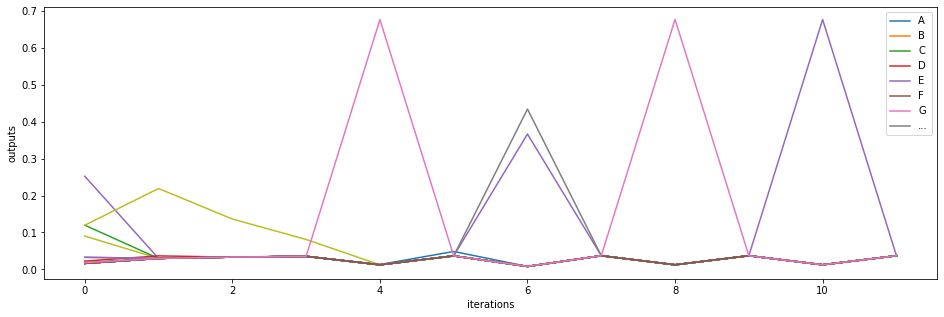

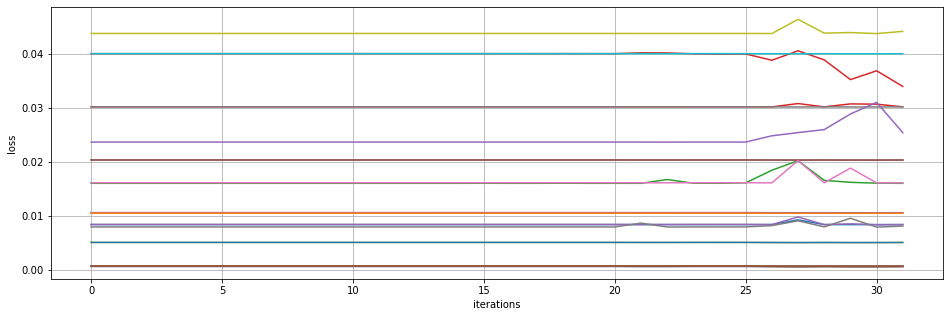

UOABVMB ANU OOBFAD UCCKD ZOBCRME ATERY B
---------------
epoch 1850
---------------
epoch 1855
---------------
epoch 1860
-----------------
average loss: 
[[0.0083432 ]
 [0.01045556]
 [0.02030583]
 [0.03015607]
 [0.01055403]
 [0.00060528]
 [0.02030583]
 [0.03015611]
 [0.00502695]
 [0.00060528]
 [0.00060528]
 [0.01045556]
 [0.01598265]
 [0.0338994 ]
 [0.0083432 ]
 [0.02030583]
 [0.00060528]
 [0.00789272]
 [0.04374857]
 [0.04000639]
 [0.01377181]
 [0.00060528]
 [0.00060528]
 [0.00060528]
 [0.02538248]
 [0.00060528]
 [0.01608111]]


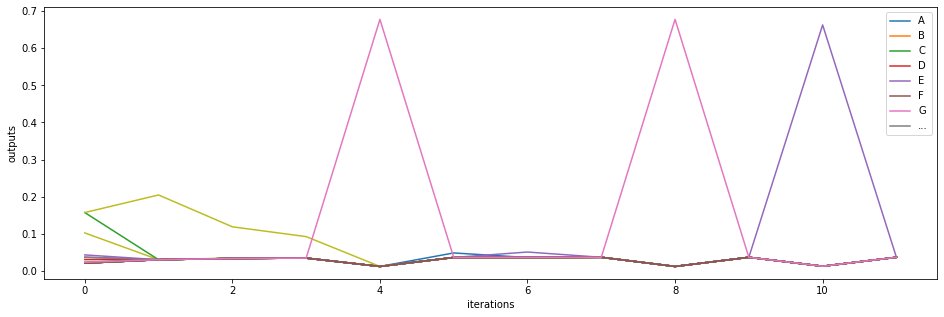

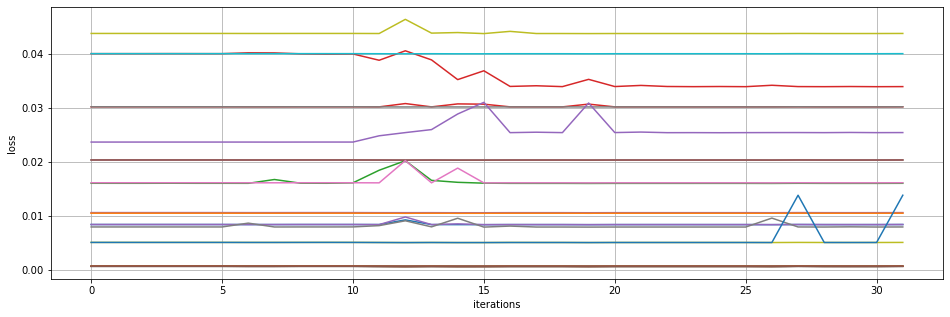

OOME YOURL ANK SOME MISU TBS SOME VONXAE
---------------
epoch 1865
---------------
epoch 1870
---------------
epoch 1875
-----------------
average loss: 
[[0.00831723]
 [0.01042959]
 [0.02027987]
 [0.03013013]
 [0.01053643]
 [0.00057932]
 [0.02027987]
 [0.03013014]
 [0.00500098]
 [0.00057932]
 [0.00057932]
 [0.01042959]
 [0.01595667]
 [0.02547308]
 [0.00831723]
 [0.02027987]
 [0.00057932]
 [0.00786695]
 [0.04372262]
 [0.03998042]
 [0.00500368]
 [0.00057932]
 [0.00057932]
 [0.00057932]
 [0.02539997]
 [0.00057932]
 [0.01605514]]


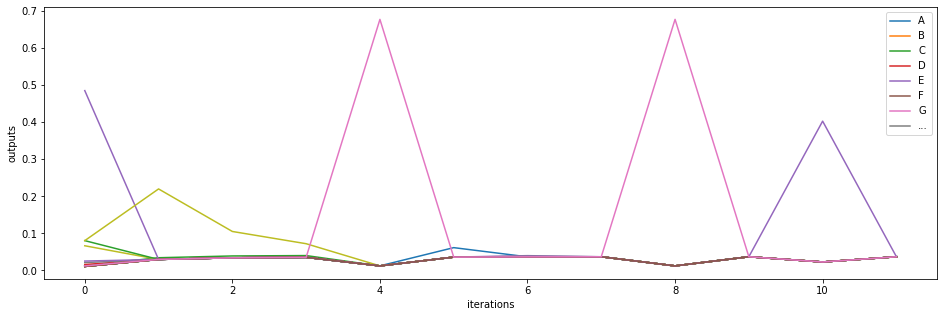

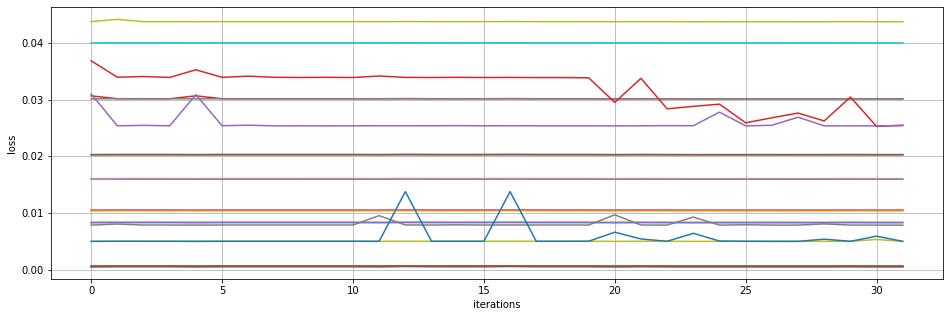

VLPFPDAAQC AYWRFDARK AIURGOHANJVERY IO J
---------------
epoch 1880
---------------
epoch 1885
---------------
epoch 1890
-----------------
average loss: 
[[0.00831772]
 [0.01043009]
 [0.02028036]
 [0.03013063]
 [0.01052856]
 [0.00057981]
 [0.02028036]
 [0.03013064]
 [0.00500148]
 [0.00057981]
 [0.00057981]
 [0.01043009]
 [0.01595717]
 [0.02542424]
 [0.00831772]
 [0.02028036]
 [0.00057981]
 [0.00786725]
 [0.04372312]
 [0.03998091]
 [0.00500156]
 [0.00057981]
 [0.00057981]
 [0.00057981]
 [0.02535697]
 [0.00057981]
 [0.01605564]]


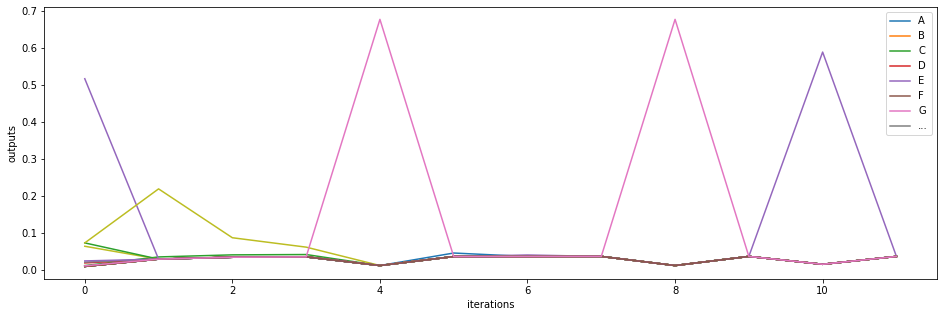

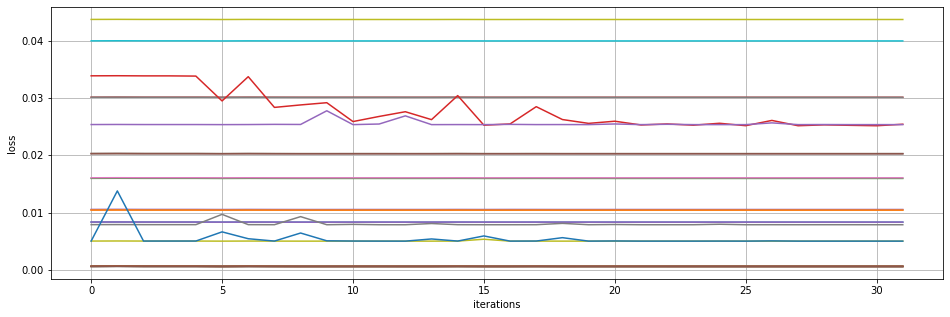

XOME BOURI AN  SOME MINUZEBNI AUVERY MUF
---------------
epoch 1895
---------------
epoch 1900
---------------
epoch 1905
-----------------
average loss: 
[[0.00831729]
 [0.01042965]
 [0.02027993]
 [0.0301302 ]
 [0.01052812]
 [0.00057937]
 [0.02027993]
 [0.0301302 ]
 [0.00500104]
 [0.00057937]
 [0.00057937]
 [0.01042965]
 [0.01595672]
 [0.02513055]
 [0.00831729]
 [0.02027993]
 [0.00057937]
 [0.00786682]
 [0.04372268]
 [0.03998048]
 [0.00500105]
 [0.00057937]
 [0.00057937]
 [0.00057937]
 [0.02535659]
 [0.00057937]
 [0.0160552 ]]


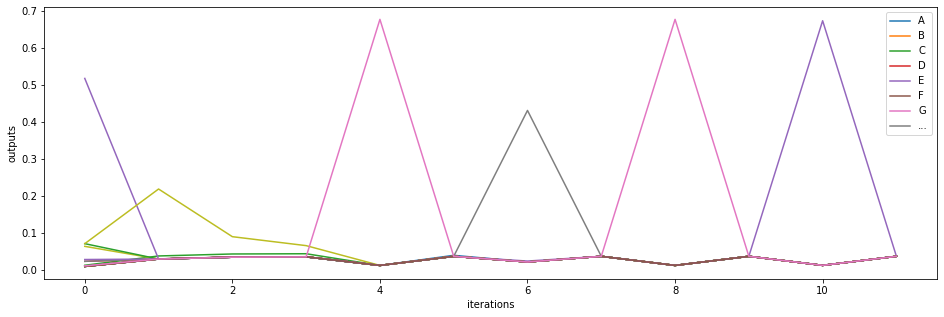

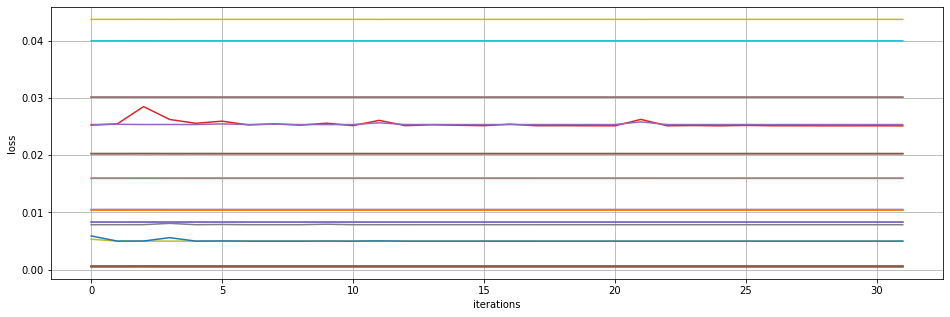

KOME AWQRN AENTEUT A URTXADLA PON AHY XO
---------------
epoch 1910
---------------
epoch 1915
---------------
epoch 1920
-----------------
average loss: 
[[0.00831729]
 [0.01042965]
 [0.02027992]
 [0.03013019]
 [0.01052812]
 [0.00057937]
 [0.02027992]
 [0.0301302 ]
 [0.00500104]
 [0.00057937]
 [0.00057937]
 [0.01042965]
 [0.01595672]
 [0.02512844]
 [0.00831728]
 [0.02027992]
 [0.00057937]
 [0.00786681]
 [0.04372268]
 [0.03998047]
 [0.00500104]
 [0.00057937]
 [0.00057937]
 [0.00057937]
 [0.02535657]
 [0.00057937]
 [0.0160552 ]]


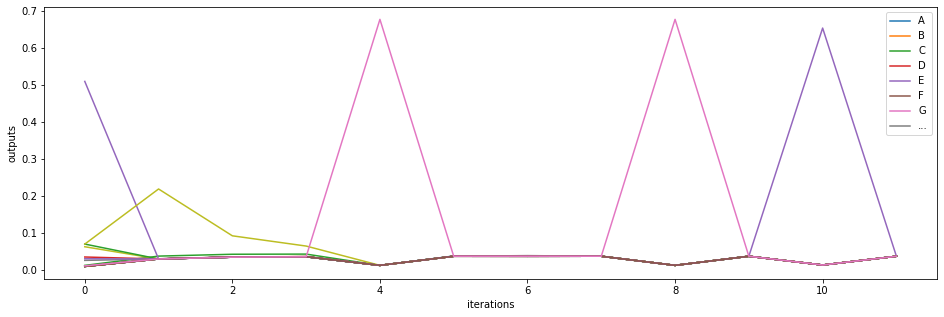

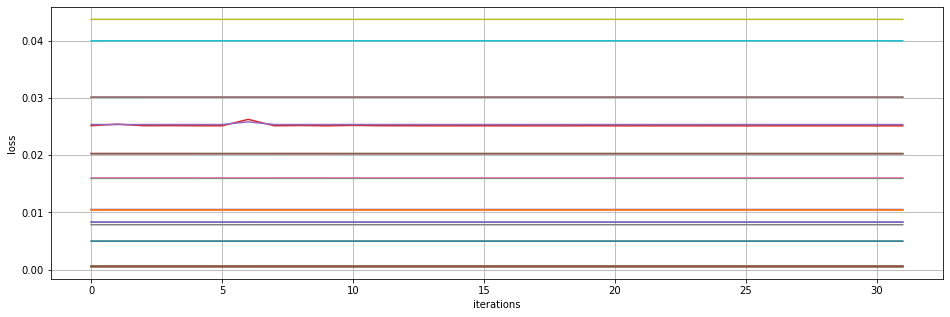

 OME GEXKL AKQ APH AGFQQXABXJQLLELP VRD 
---------------
epoch 1925
---------------
epoch 1930
---------------
epoch 1935
-----------------
average loss: 
[[0.00831847]
 [0.01043084]
 [0.02028111]
 [0.03013137]
 [0.01052931]
 [0.00058056]
 [0.02028111]
 [0.03013139]
 [0.00500223]
 [0.00058056]
 [0.00058056]
 [0.01043084]
 [0.01595792]
 [0.02512908]
 [0.00831847]
 [0.02028111]
 [0.00058056]
 [0.00610764]
 [0.04118246]
 [0.03998166]
 [0.00500223]
 [0.00058056]
 [0.00058056]
 [0.00058056]
 [0.02535773]
 [0.00058056]
 [0.01605639]]


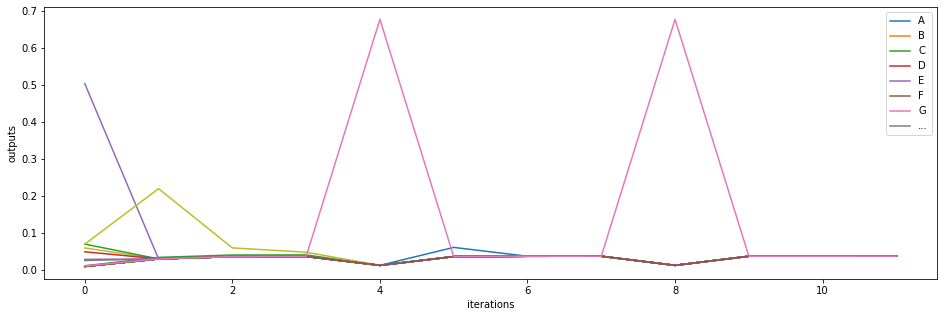

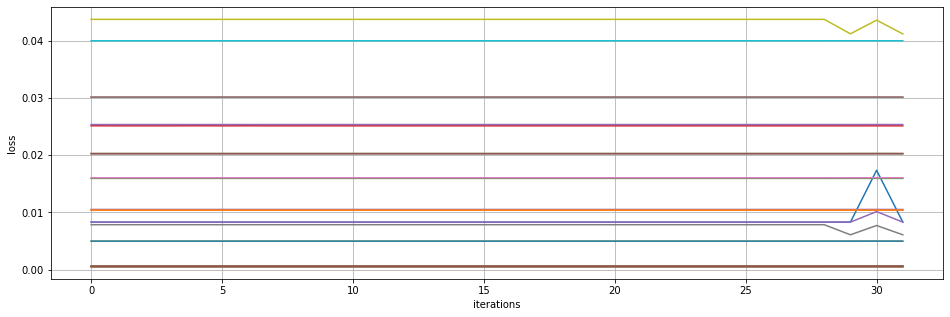

AOKUTHGY D P ERI AEH  TTWAIF AFH ALK AKL
---------------
epoch 1940
---------------
epoch 1945
---------------
epoch 1950
-----------------
average loss: 
[[0.00831833]
 [0.01043079]
 [0.02028097]
 [0.03013123]
 [0.01052916]
 [0.00058042]
 [0.02028097]
 [0.03013124]
 [0.00500208]
 [0.00058042]
 [0.00058042]
 [0.01043069]
 [0.01595777]
 [0.02512867]
 [0.00831833]
 [0.02028097]
 [0.00058042]
 [0.00610759]
 [0.04108696]
 [0.03998152]
 [0.00500208]
 [0.00058042]
 [0.00058042]
 [0.00058042]
 [0.02535758]
 [0.00058042]
 [0.01605624]]


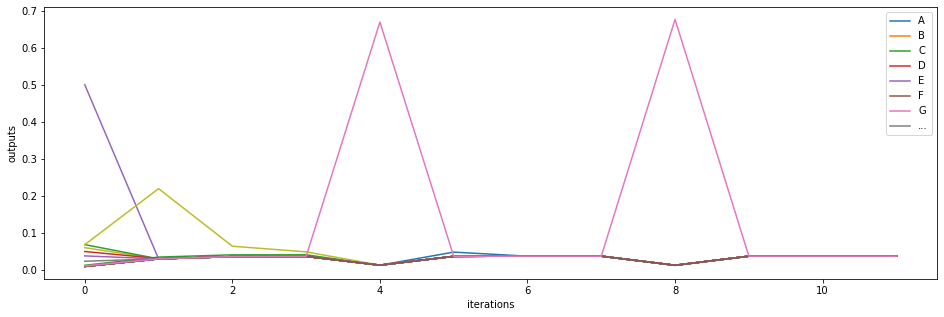

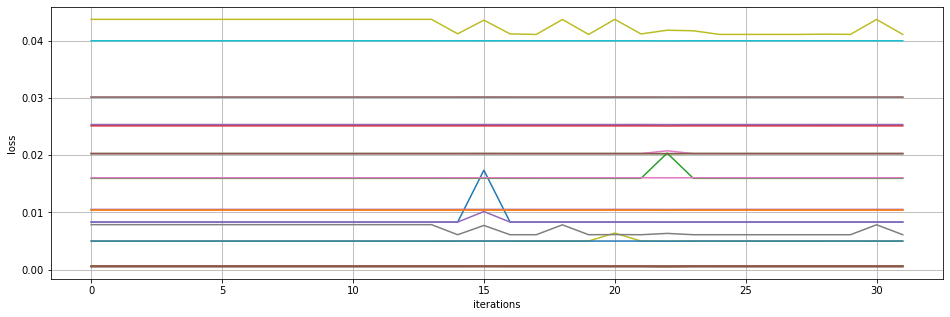

RHLBAXD ZGLQSAAN  BOME MINUPEBRKAWOQXMX 
---------------
epoch 1955
---------------
epoch 1960
---------------
epoch 1965
-----------------
average loss: 
[[0.00831833]
 [0.01043069]
 [0.02028097]
 [0.03013124]
 [0.01052916]
 [0.00058042]
 [0.02028097]
 [0.03013125]
 [0.00500209]
 [0.00058042]
 [0.00058042]
 [0.01043069]
 [0.01595777]
 [0.0251286 ]
 [0.00831833]
 [0.02028097]
 [0.00058042]
 [0.0061075 ]
 [0.04108789]
 [0.03998152]
 [0.00500209]
 [0.00058042]
 [0.00058042]
 [0.00058042]
 [0.02535763]
 [0.00058042]
 [0.01605624]]


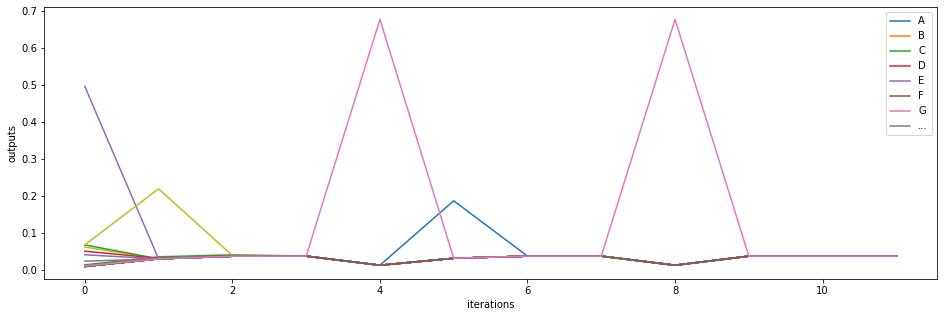

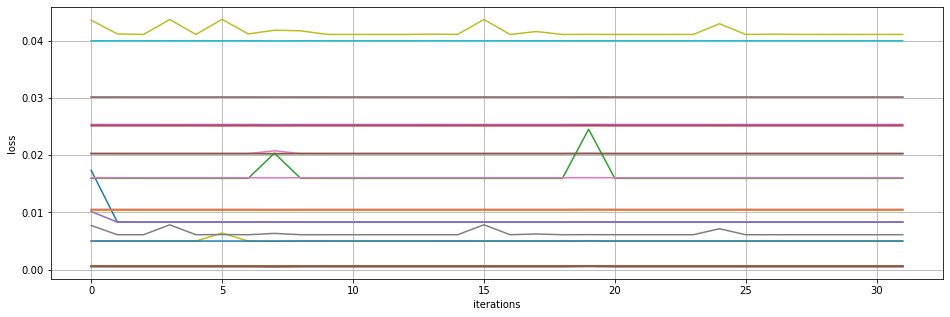

SOME QOURY AYANCEXERY RIQIPHERY MUEEJETW
---------------
epoch 1970
---------------
epoch 1975
---------------
epoch 1980
-----------------
average loss: 
[[0.00831833]
 [0.01043069]
 [0.02028097]
 [0.03013124]
 [0.01052916]
 [0.00058042]
 [0.02028097]
 [0.03013125]
 [0.00500208]
 [0.00058042]
 [0.00058042]
 [0.01043069]
 [0.01595777]
 [0.02512857]
 [0.00831833]
 [0.02028097]
 [0.00058042]
 [0.0061075 ]
 [0.04108693]
 [0.03998152]
 [0.00500208]
 [0.00058042]
 [0.00058042]
 [0.00058042]
 [0.02535758]
 [0.00058042]
 [0.01605625]]


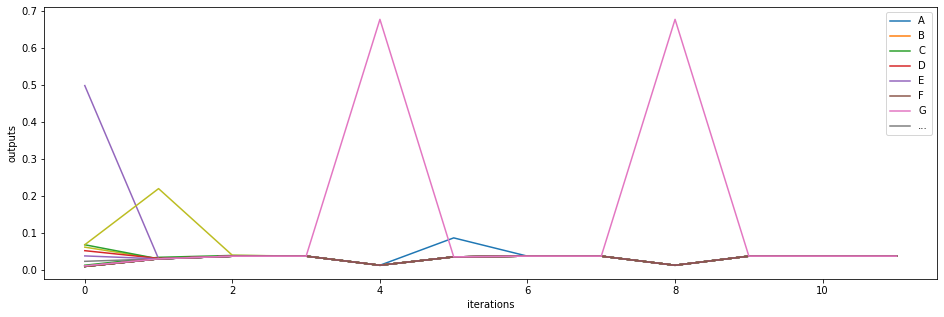

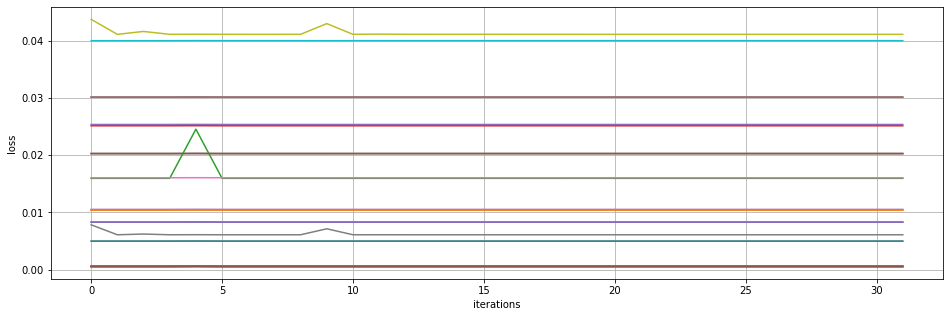

POXE D MU HBO BXMH HFTEFI  O APAG IQ FGA
---------------
epoch 1985
---------------
epoch 1990
---------------
epoch 1995
-----------------
average loss: 
[[0.00831833]
 [0.01043069]
 [0.02028097]
 [0.03013124]
 [0.01052916]
 [0.00058042]
 [0.02028097]
 [0.03013125]
 [0.00500208]
 [0.00058042]
 [0.00058042]
 [0.01043069]
 [0.01595777]
 [0.0251286 ]
 [0.00831833]
 [0.02028097]
 [0.00058042]
 [0.0061075 ]
 [0.04108693]
 [0.03998152]
 [0.00500208]
 [0.00058042]
 [0.00058042]
 [0.00058042]
 [0.02535758]
 [0.00058042]
 [0.01605624]]


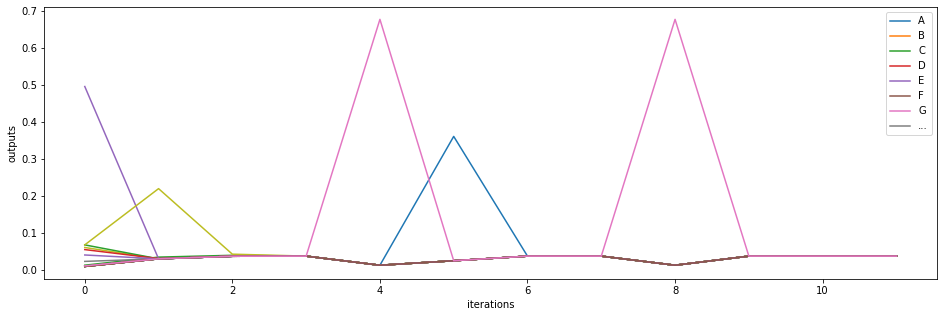

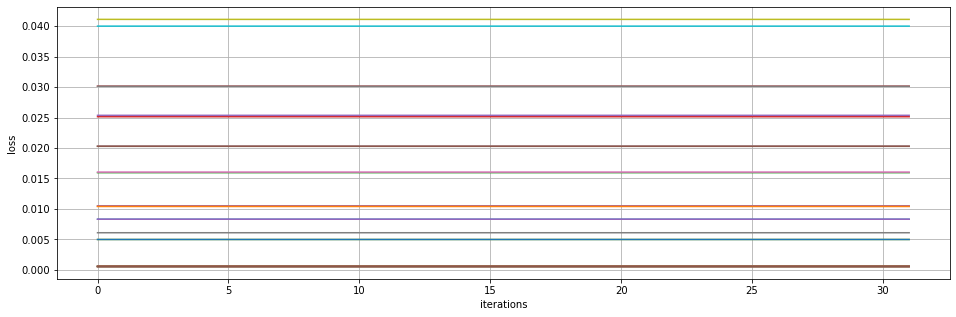

KC FRY IATE DZW APRDAIFME BA BS ANZ SOME
---------------
epoch 2000
---------------
epoch 2005
---------------
epoch 2010
-----------------
average loss: 
[[0.00831833]
 [0.01043069]
 [0.02028097]
 [0.03013124]
 [0.01052916]
 [0.00058042]
 [0.02028097]
 [0.03013125]
 [0.00500208]
 [0.00058042]
 [0.00058042]
 [0.01043069]
 [0.01595778]
 [0.02512859]
 [0.00831833]
 [0.02028097]
 [0.00058042]
 [0.0061075 ]
 [0.04108693]
 [0.03998152]
 [0.00500208]
 [0.00058042]
 [0.00058042]
 [0.00058042]
 [0.02535758]
 [0.00058042]
 [0.01605624]]


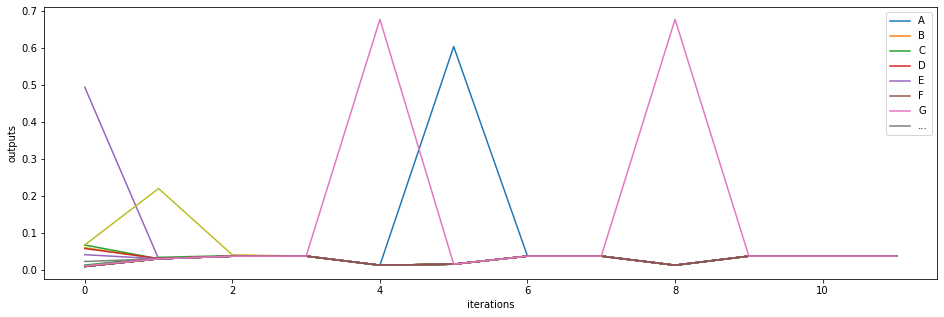

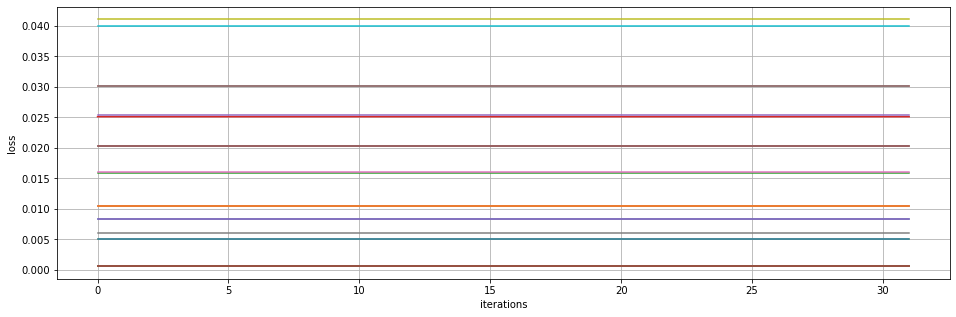

AARD AZORGKUMOYEOCEIQ EYLCM AGHEHHEHYAUG
---------------
epoch 2015
---------------
epoch 2020
---------------
epoch 2025
-----------------
average loss: 
[[0.00831833]
 [0.01043069]
 [0.02028097]
 [0.03013124]
 [0.01052916]
 [0.00058042]
 [0.02028097]
 [0.03013125]
 [0.00500208]
 [0.00058042]
 [0.00058042]
 [0.01043069]
 [0.01595778]
 [0.0251286 ]
 [0.00831833]
 [0.02028097]
 [0.00058042]
 [0.0061075 ]
 [0.04108693]
 [0.03998152]
 [0.00500208]
 [0.00058042]
 [0.00058042]
 [0.00058042]
 [0.02535758]
 [0.00058042]
 [0.01605624]]


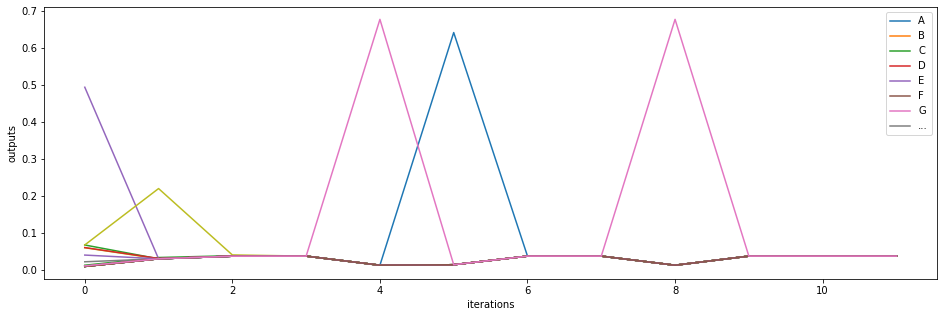

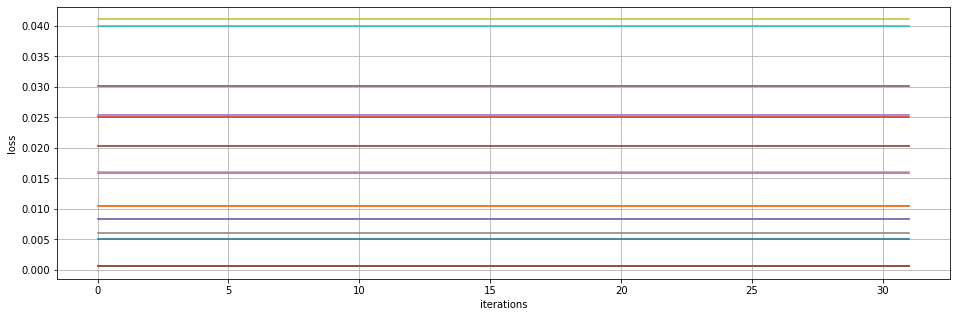

AONV GOSRPSASAME BOURR ANI SOME MINUWENP
---------------
epoch 2030
---------------
epoch 2035
---------------
epoch 2040
-----------------
average loss: 
[[0.00831833]
 [0.01043069]
 [0.02028097]
 [0.03013124]
 [0.01052916]
 [0.00058042]
 [0.02028097]
 [0.03013125]
 [0.00500208]
 [0.00058042]
 [0.00058042]
 [0.01043069]
 [0.01595778]
 [0.02512859]
 [0.00831833]
 [0.02028097]
 [0.00058042]
 [0.0061075 ]
 [0.04108693]
 [0.03998152]
 [0.00500208]
 [0.00058042]
 [0.00058042]
 [0.00058042]
 [0.02535758]
 [0.00058042]
 [0.01605624]]


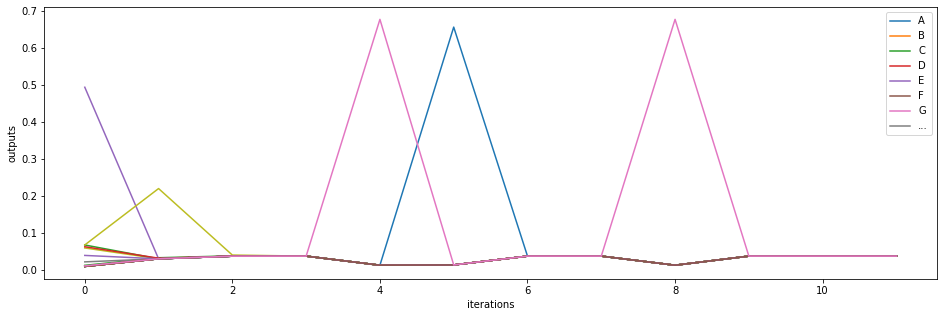

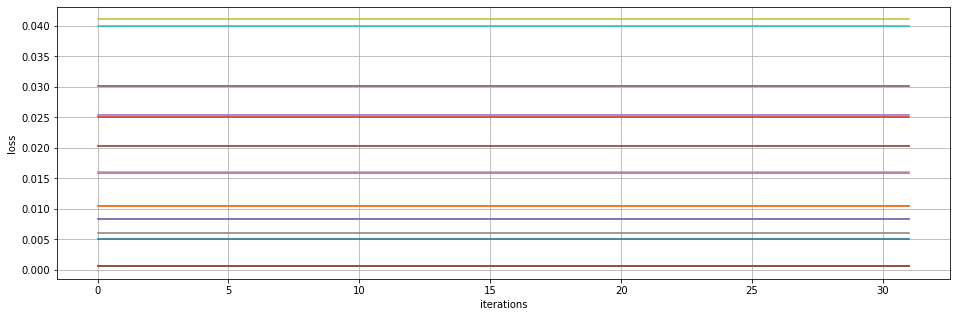

ATOQSAVERY ZVJZ KWDAZNX RJTETS ZAY QPYNJ
---------------
epoch 2045
---------------
epoch 2050
---------------
epoch 2055
-----------------
average loss: 
[[0.00831833]
 [0.01043069]
 [0.02028097]
 [0.03013124]
 [0.01052916]
 [0.00058042]
 [0.02028097]
 [0.03013125]
 [0.00500208]
 [0.00058042]
 [0.00058042]
 [0.01043069]
 [0.01595778]
 [0.02512859]
 [0.00831833]
 [0.02028097]
 [0.00058042]
 [0.0061075 ]
 [0.04108692]
 [0.03998152]
 [0.00500208]
 [0.00058042]
 [0.00058042]
 [0.00058042]
 [0.02535758]
 [0.00058042]
 [0.01605624]]


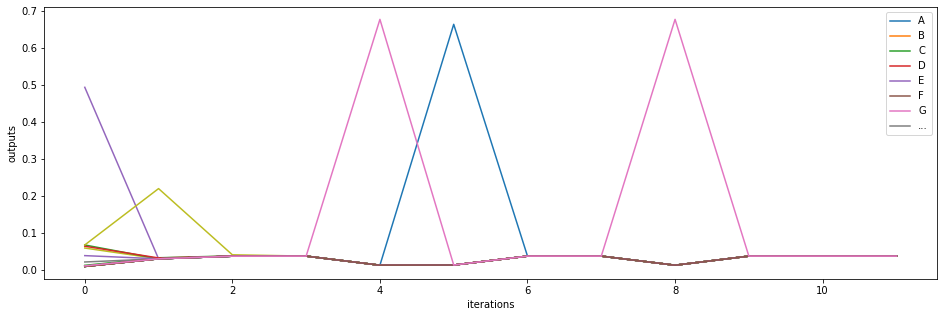

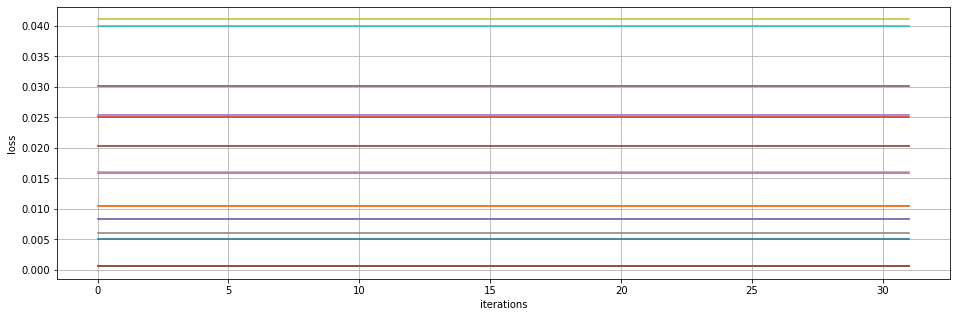

AIKVZ MI AURAFZAWSHTBASGVERY AOZHORX AYF
---------------
epoch 2060
---------------
epoch 2065
---------------
epoch 2070
-----------------
average loss: 
[[0.00831833]
 [0.01043069]
 [0.02028097]
 [0.03013124]
 [0.01052917]
 [0.00058042]
 [0.02028097]
 [0.03013125]
 [0.00500208]
 [0.00058042]
 [0.00058042]
 [0.01043069]
 [0.01595778]
 [0.02512859]
 [0.00831833]
 [0.02028097]
 [0.00058042]
 [0.0061075 ]
 [0.04108691]
 [0.03998152]
 [0.00500208]
 [0.00058042]
 [0.00058042]
 [0.00058042]
 [0.02535758]
 [0.00058042]
 [0.01605624]]


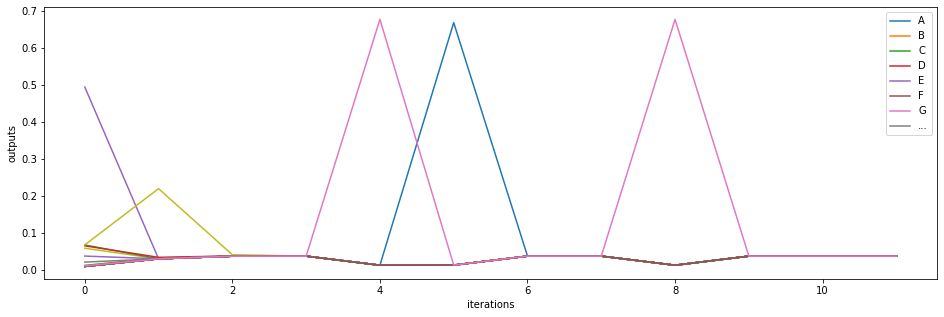

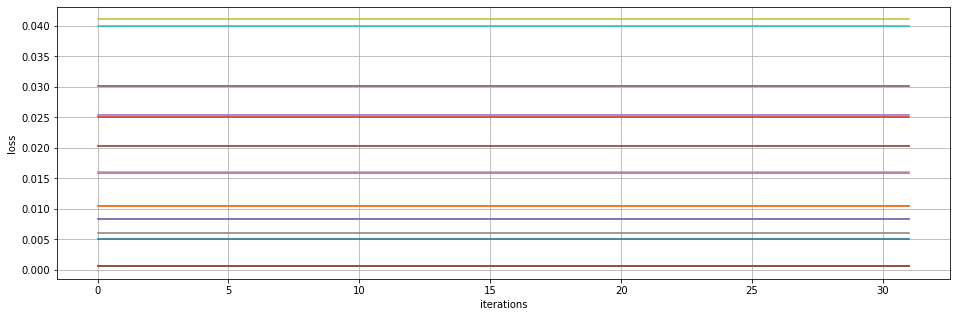

AAZQ AQNQRIAPERY  IS VB USVRVYADNU  OD T
---------------
epoch 2075
---------------
epoch 2080
---------------
epoch 2085
-----------------
average loss: 
[[0.00831833]
 [0.01043069]
 [0.02028097]
 [0.03013124]
 [0.01052917]
 [0.00058042]
 [0.02028097]
 [0.03013125]
 [0.00500208]
 [0.00058042]
 [0.00058042]
 [0.01043069]
 [0.01595778]
 [0.02512859]
 [0.00831833]
 [0.02028097]
 [0.00058042]
 [0.0061075 ]
 [0.04108688]
 [0.03998152]
 [0.00500208]
 [0.00058042]
 [0.00058042]
 [0.00058042]
 [0.02535758]
 [0.00058042]
 [0.01605624]]


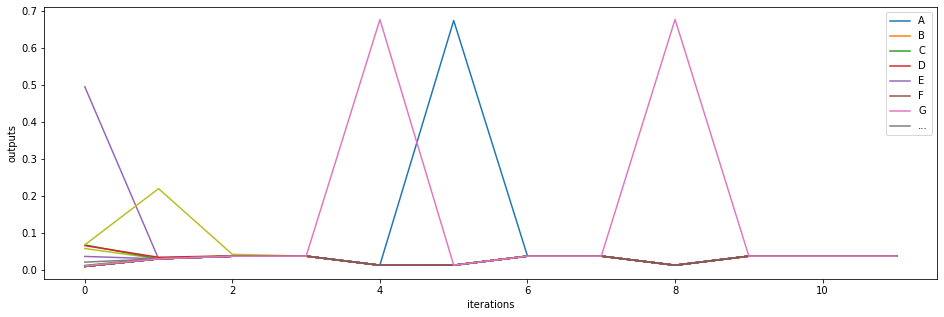

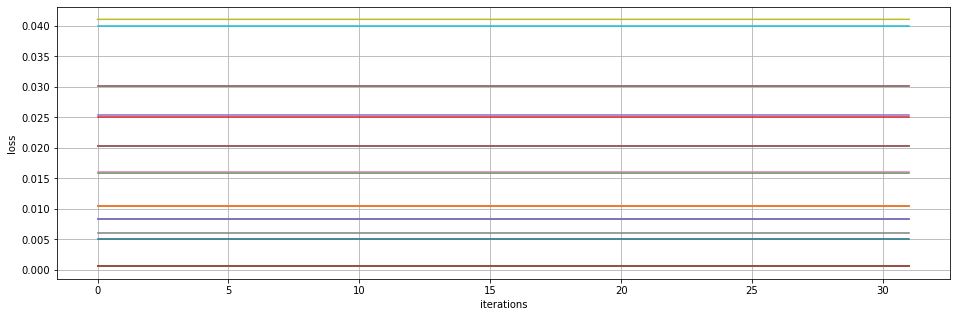

ALVRCANB BOME MINUQEJBWSARU AJPRELIAWHFU
---------------
epoch 2090
---------------
epoch 2095
---------------
epoch 2100
-----------------
average loss: 
[[0.00831833]
 [0.01043069]
 [0.02028097]
 [0.03013124]
 [0.01052917]
 [0.00058042]
 [0.02028097]
 [0.03013125]
 [0.00500208]
 [0.00058042]
 [0.00058042]
 [0.01043069]
 [0.01595777]
 [0.02512857]
 [0.00831833]
 [0.02028097]
 [0.00058042]
 [0.0061075 ]
 [0.04108691]
 [0.03998152]
 [0.00500208]
 [0.00058042]
 [0.00058042]
 [0.00058042]
 [0.02535758]
 [0.00058042]
 [0.01605625]]


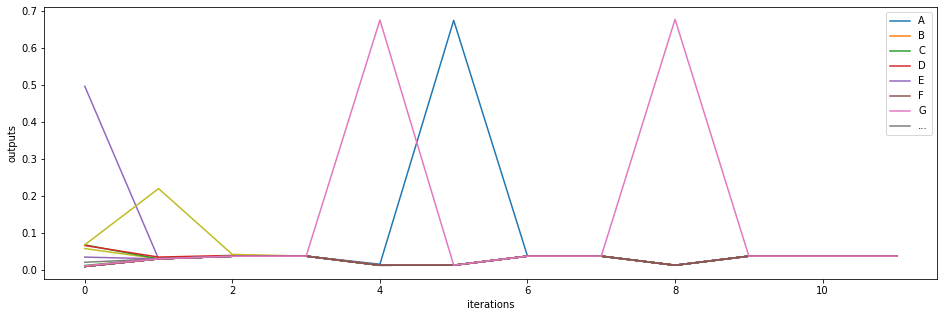

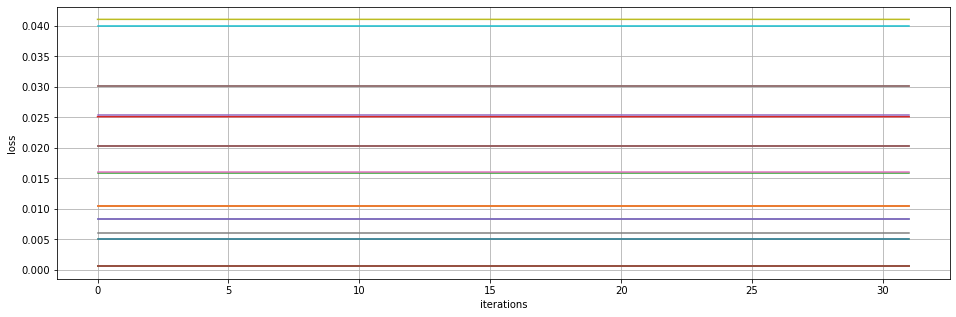

AYRJ ALXPLCBALBGEOGTEIU COD QYJ IU WRPAF
---------------
epoch 2105
---------------
epoch 2110
---------------
epoch 2115
-----------------
average loss: 
[[0.00830539]
 [0.01041775]
 [0.02026803]
 [0.0301183 ]
 [0.01051623]
 [0.00056748]
 [0.02026803]
 [0.0301183 ]
 [0.00498914]
 [0.00056748]
 [0.00056748]
 [0.01041775]
 [0.01594483]
 [0.02511566]
 [0.00830539]
 [0.02026803]
 [0.00056748]
 [0.00609456]
 [0.04107393]
 [0.03996858]
 [0.00498914]
 [0.00056748]
 [0.00056748]
 [0.00056748]
 [0.01660876]
 [0.00056748]
 [0.0160433 ]]


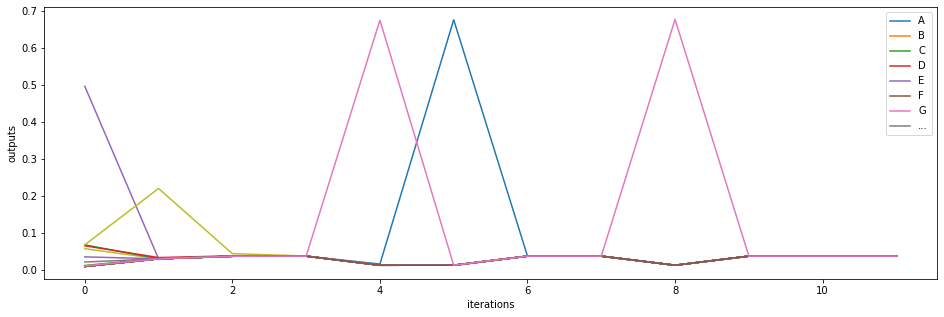

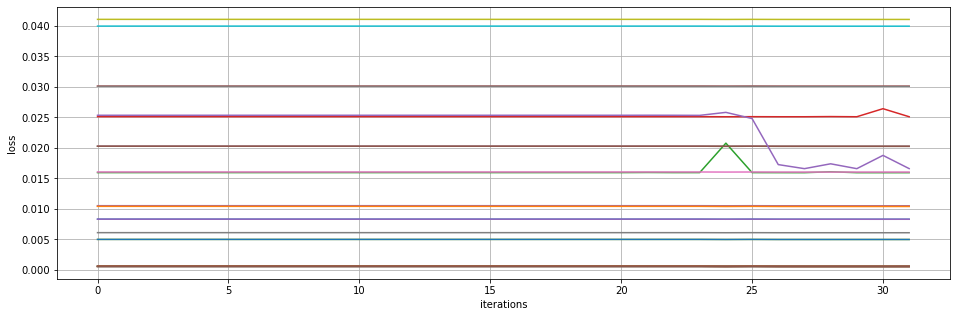

AOAFQ AVB AIH SOME MINUJY LONOAERY DOJAU
---------------
epoch 2120
---------------
epoch 2125
---------------
epoch 2130
-----------------
average loss: 
[[0.00830537]
 [0.01041774]
 [0.02026801]
 [0.03011828]
 [0.01051621]
 [0.00056746]
 [0.02026801]
 [0.03011829]
 [0.00498912]
 [0.00056746]
 [0.00056746]
 [0.01041774]
 [0.01594482]
 [0.02511599]
 [0.00830537]
 [0.02026801]
 [0.00056746]
 [0.00609454]
 [0.04107391]
 [0.03996856]
 [0.00498912]
 [0.00056746]
 [0.00056746]
 [0.00056746]
 [0.01660571]
 [0.00056746]
 [0.01604328]]


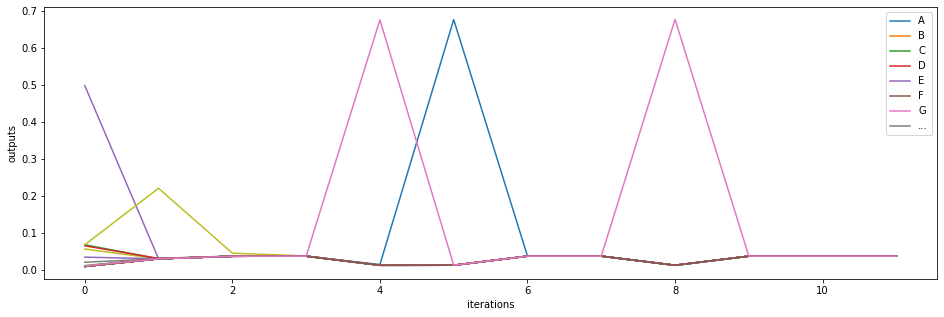

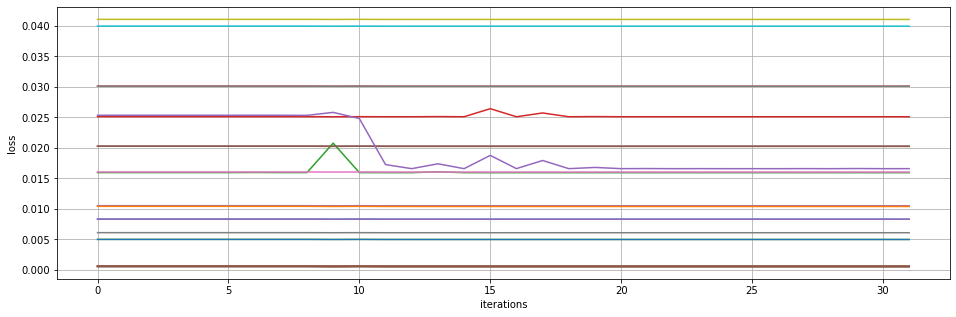

AQB U PRSGZKUHBY SPME RXZ XNZ RNQ VMN AE
---------------
epoch 2135
---------------
epoch 2140
---------------
epoch 2145
-----------------
average loss: 
[[0.00830538]
 [0.01041774]
 [0.02026802]
 [0.03011829]
 [0.01051621]
 [0.00056746]
 [0.02026802]
 [0.03011829]
 [0.00498913]
 [0.00056746]
 [0.00056746]
 [0.01041774]
 [0.01594482]
 [0.02511562]
 [0.00830538]
 [0.02026801]
 [0.00056746]
 [0.00609454]
 [0.04107395]
 [0.03996857]
 [0.00498913]
 [0.00056746]
 [0.00056746]
 [0.00056746]
 [0.01659986]
 [0.00056746]
 [0.01604329]]


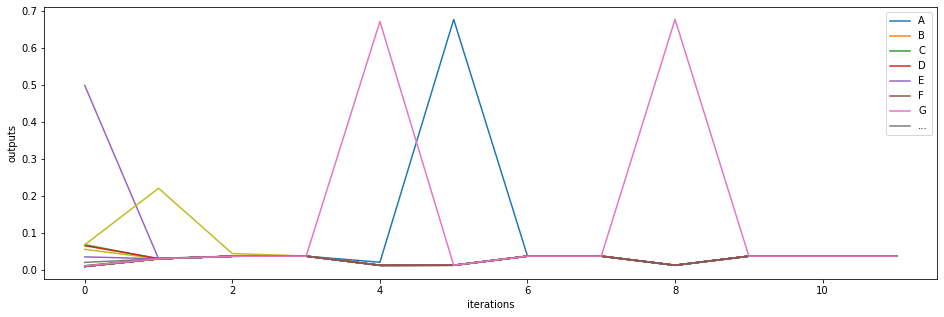

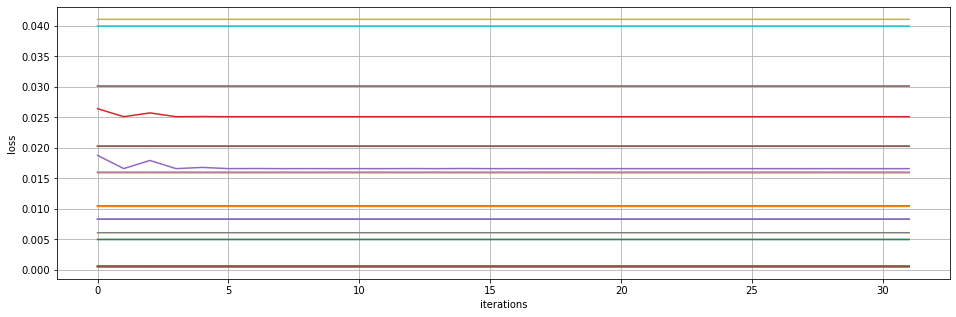

AOKLABGJVZFASCLAACCKY LOURT AHS ROJWAHER
---------------
epoch 2150
---------------
epoch 2155
---------------
epoch 2160
-----------------
average loss: 
[[0.00830538]
 [0.01041774]
 [0.02026802]
 [0.03011828]
 [0.01051621]
 [0.00056746]
 [0.02026802]
 [0.03011829]
 [0.00498913]
 [0.00056746]
 [0.00056746]
 [0.01041774]
 [0.01594482]
 [0.02511564]
 [0.00830538]
 [0.02026801]
 [0.00056746]
 [0.00609454]
 [0.04107397]
 [0.03996857]
 [0.00498913]
 [0.00056746]
 [0.00056746]
 [0.00056746]
 [0.01659978]
 [0.00056746]
 [0.01604329]]


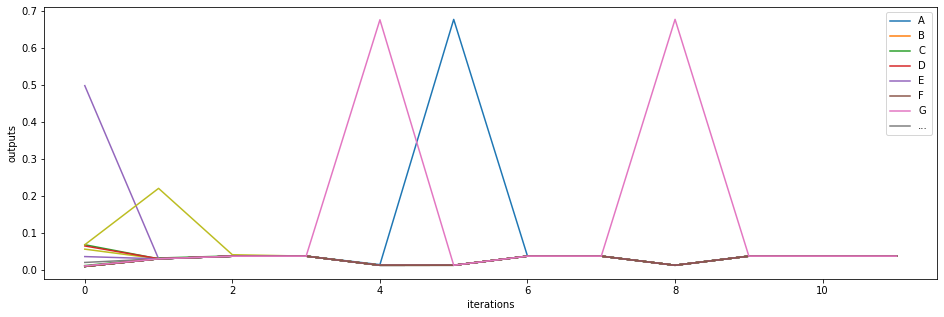

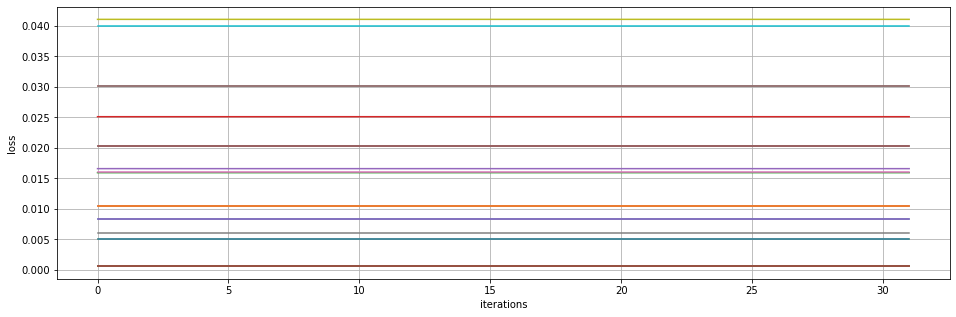

ATXCAGK AHNB NCEVY VOERP AYMY GJRBRI AIE
---------------
epoch 2165
---------------
epoch 2170
---------------
epoch 2175
-----------------
average loss: 
[[0.00830538]
 [0.01041774]
 [0.02026802]
 [0.03011829]
 [0.01051621]
 [0.00056746]
 [0.02026802]
 [0.03011829]
 [0.00498913]
 [0.00056746]
 [0.00056746]
 [0.01041774]
 [0.01594482]
 [0.02511563]
 [0.00830538]
 [0.02026801]
 [0.00056746]
 [0.00609454]
 [0.04107398]
 [0.03996857]
 [0.00498913]
 [0.00056746]
 [0.00056746]
 [0.00056746]
 [0.01659979]
 [0.00056746]
 [0.01604329]]


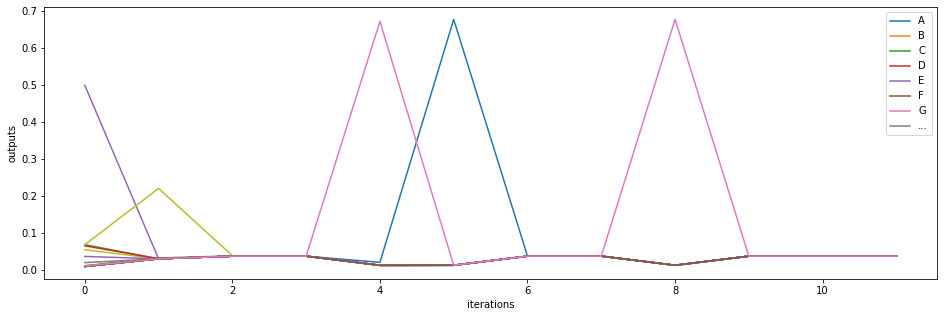

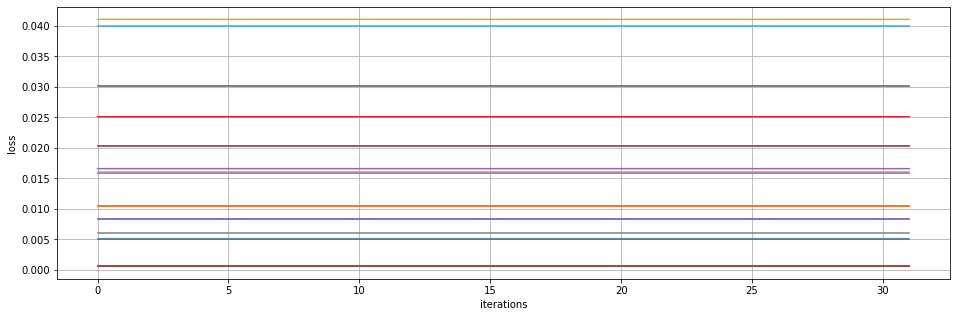

ATKTAJW ZCLAADMM AG  TYAXMM ASIFAPERY BV
---------------
epoch 2180
---------------
epoch 2185
---------------
epoch 2190
-----------------
average loss: 
[[0.00830538]
 [0.01041774]
 [0.02026802]
 [0.03011828]
 [0.01051621]
 [0.00056746]
 [0.02026802]
 [0.03011829]
 [0.00498913]
 [0.00056746]
 [0.00056746]
 [0.01041774]
 [0.01594482]
 [0.02511564]
 [0.00830538]
 [0.02026801]
 [0.00056746]
 [0.00609454]
 [0.04107398]
 [0.03996857]
 [0.00498913]
 [0.00056746]
 [0.00056746]
 [0.00056746]
 [0.01659977]
 [0.00056746]
 [0.01604329]]


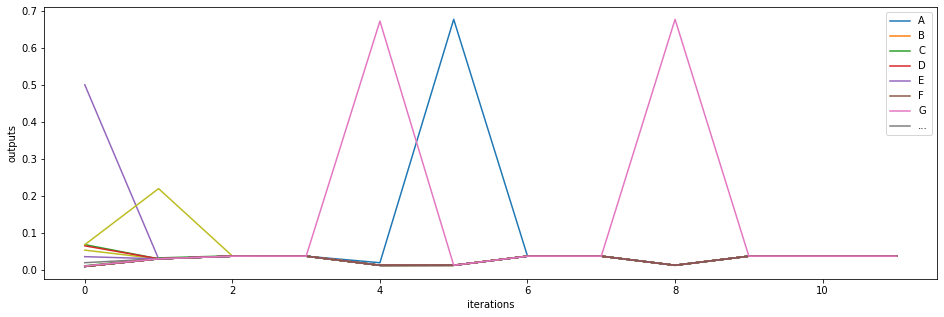

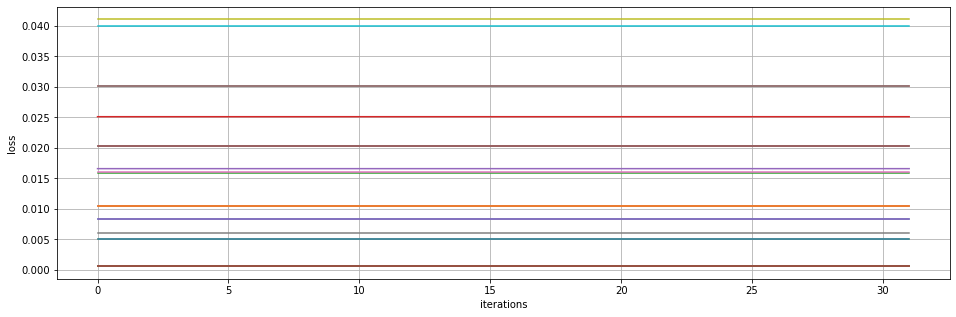

AUZRAAIP AMJ ARL ADUPFXPAWBAOKJADOOZZXAO
---------------
epoch 2195
---------------
epoch 2200
---------------
epoch 2205
-----------------
average loss: 
[[0.00830538]
 [0.01041774]
 [0.02026802]
 [0.03011828]
 [0.01051621]
 [0.00056746]
 [0.02026802]
 [0.03011829]
 [0.00498913]
 [0.00056746]
 [0.00056746]
 [0.01041774]
 [0.01594482]
 [0.02511564]
 [0.00830538]
 [0.02026801]
 [0.00056746]
 [0.00609454]
 [0.04107397]
 [0.03996857]
 [0.00498913]
 [0.00056746]
 [0.00056746]
 [0.00056746]
 [0.01659976]
 [0.00056746]
 [0.01604329]]


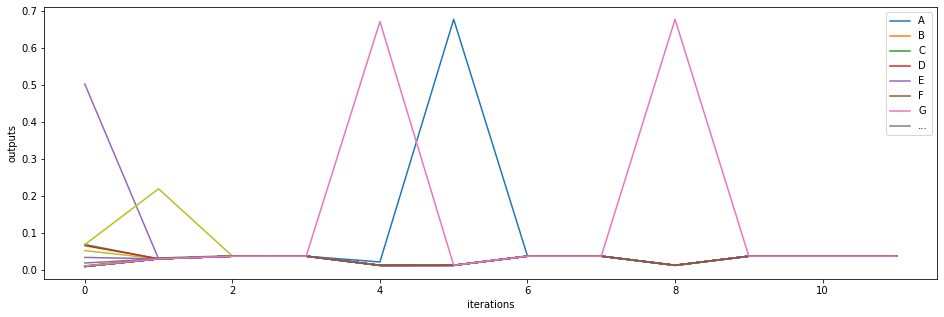

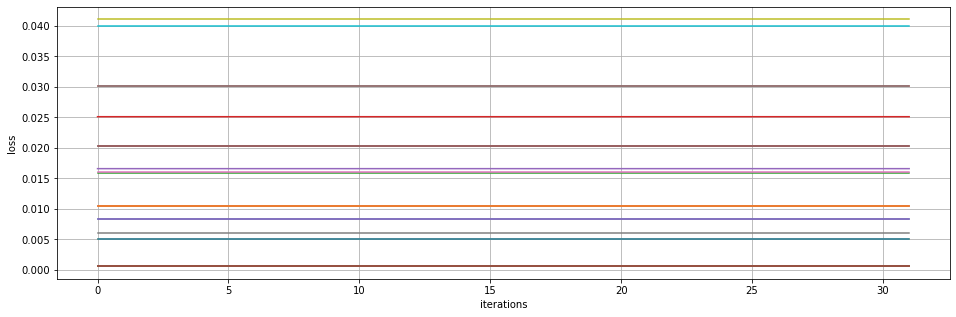

ANC AIJ AYX IRSFCO AOBSAYXFAWB ZXERW AE 
---------------
epoch 2210
---------------
epoch 2215
---------------
epoch 2220
-----------------
average loss: 
[[0.00830538]
 [0.01041774]
 [0.02026802]
 [0.03011828]
 [0.01051621]
 [0.00056746]
 [0.02026802]
 [0.03011829]
 [0.00498913]
 [0.00056746]
 [0.00056746]
 [0.01041774]
 [0.01594482]
 [0.0251156 ]
 [0.00830538]
 [0.02026801]
 [0.00056746]
 [0.00609454]
 [0.04107398]
 [0.03996857]
 [0.00498913]
 [0.00056746]
 [0.00056746]
 [0.00056746]
 [0.01659977]
 [0.00056746]
 [0.01604329]]


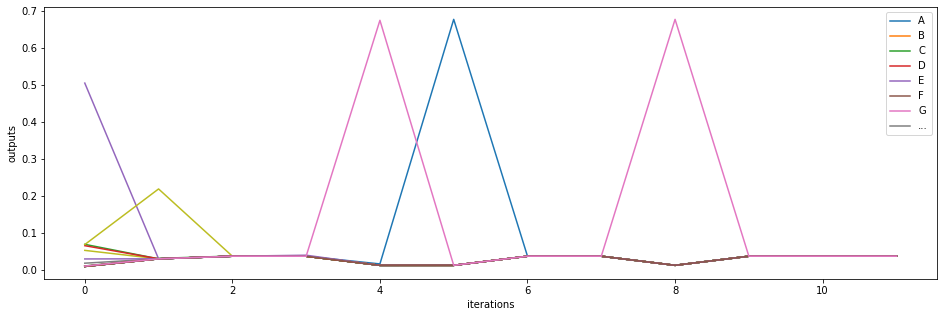

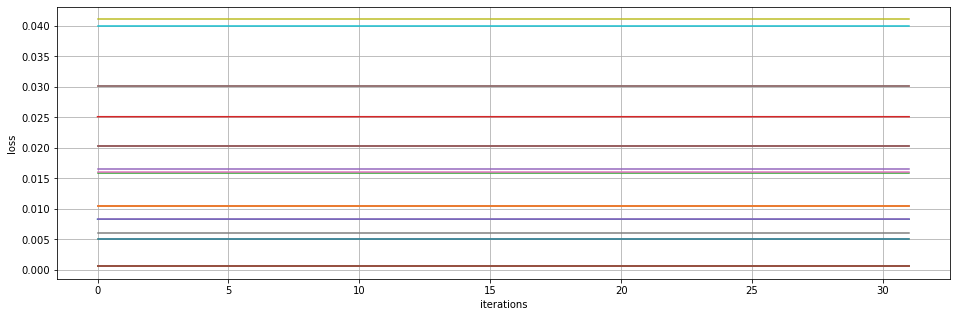

AGK AOK AED AOX ANN SOME MINUUIZ ARZ ABE
---------------
epoch 2225
---------------
epoch 2230
---------------
epoch 2235
-----------------
average loss: 
[[0.00830538]
 [0.01041774]
 [0.02026802]
 [0.03011828]
 [0.01051621]
 [0.00056746]
 [0.02026802]
 [0.03011829]
 [0.00498913]
 [0.00056746]
 [0.00056746]
 [0.01041774]
 [0.01594482]
 [0.02511564]
 [0.00830538]
 [0.02026801]
 [0.00056746]
 [0.00609454]
 [0.04107398]
 [0.03996857]
 [0.00498913]
 [0.00056746]
 [0.00056746]
 [0.00056746]
 [0.01659976]
 [0.00056746]
 [0.01604329]]


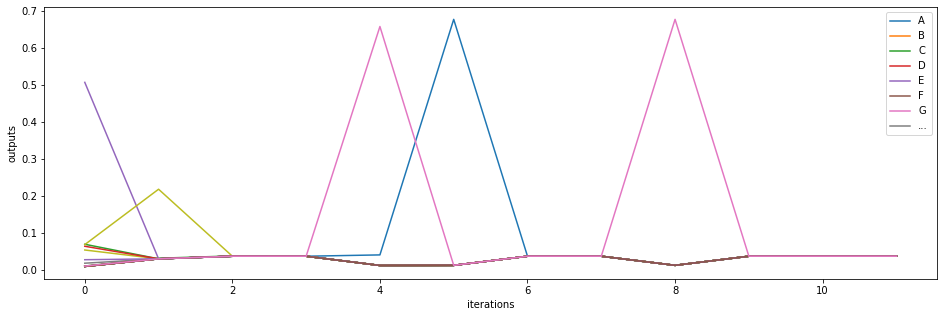

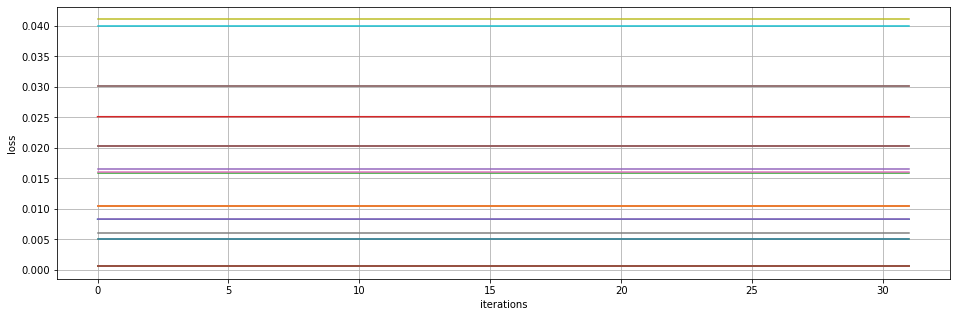

AAFF AQGRVYAXME IEPBZJLTE BKTWACDSAYE ZE
---------------
epoch 2240
---------------
epoch 2245
---------------
epoch 2250
-----------------
average loss: 
[[0.00830538]
 [0.01041774]
 [0.02026801]
 [0.03011828]
 [0.01051621]
 [0.00056746]
 [0.02026802]
 [0.03011829]
 [0.00498913]
 [0.00056746]
 [0.00056746]
 [0.01041774]
 [0.01594482]
 [0.02511559]
 [0.00830538]
 [0.02026801]
 [0.00056746]
 [0.00609454]
 [0.04107398]
 [0.03996857]
 [0.00498913]
 [0.00056746]
 [0.00056746]
 [0.00056746]
 [0.01659977]
 [0.00056746]
 [0.01604329]]


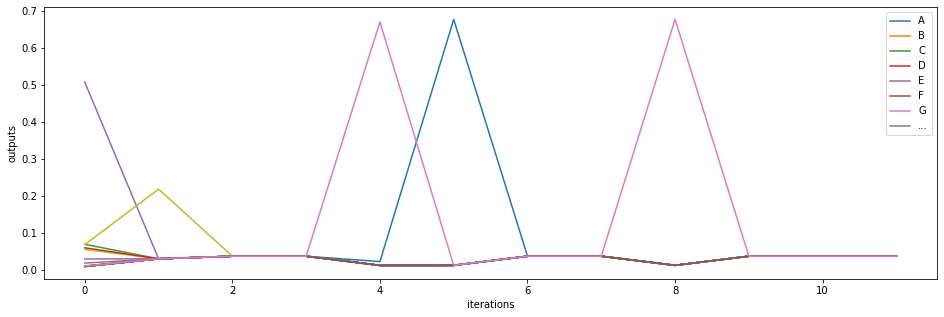

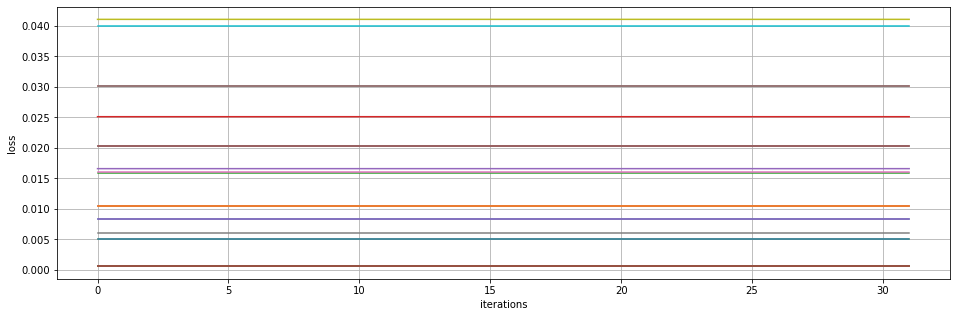

NOME BAURW AYS HOB AYB ASQVKRMY WARE PY 
---------------
epoch 2255
---------------
epoch 2260
---------------
epoch 2265
-----------------
average loss: 
[[0.00830538]
 [0.01041774]
 [0.02026802]
 [0.03011829]
 [0.01051621]
 [0.00056746]
 [0.02026802]
 [0.03011829]
 [0.00498913]
 [0.00056746]
 [0.00056746]
 [0.01041774]
 [0.01594482]
 [0.02511563]
 [0.00830538]
 [0.02026801]
 [0.00056746]
 [0.00609454]
 [0.04107398]
 [0.03996857]
 [0.00498913]
 [0.00056746]
 [0.00056746]
 [0.00056746]
 [0.01659976]
 [0.00056746]
 [0.01604329]]


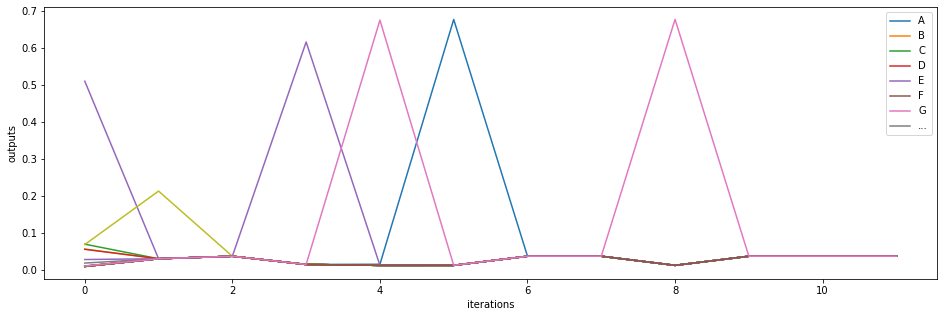

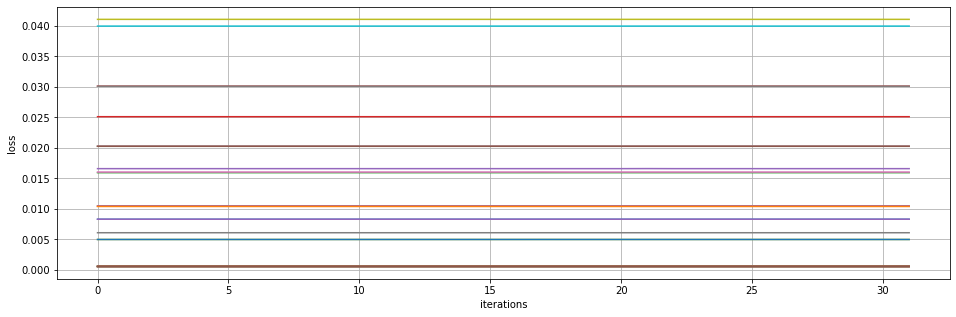

IOME LOURS ANB SOME MINUML K IWZATE MY H
---------------
epoch 2270
---------------
epoch 2275
---------------
epoch 2280
-----------------
average loss: 
[[0.00830538]
 [0.01041774]
 [0.02026802]
 [0.03011828]
 [0.01051621]
 [0.00056746]
 [0.02026802]
 [0.03011829]
 [0.00498913]
 [0.00056746]
 [0.00056746]
 [0.01041774]
 [0.01594482]
 [0.02511564]
 [0.00830538]
 [0.02026801]
 [0.00056746]
 [0.00609454]
 [0.04107398]
 [0.03996857]
 [0.00498913]
 [0.00056746]
 [0.00056746]
 [0.00056746]
 [0.01659977]
 [0.00056746]
 [0.01604329]]


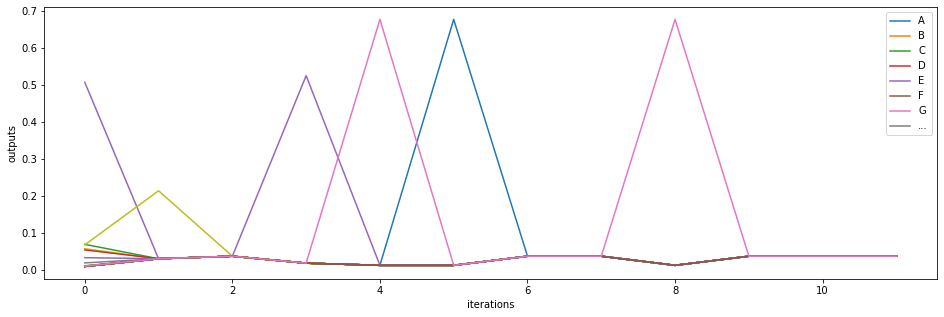

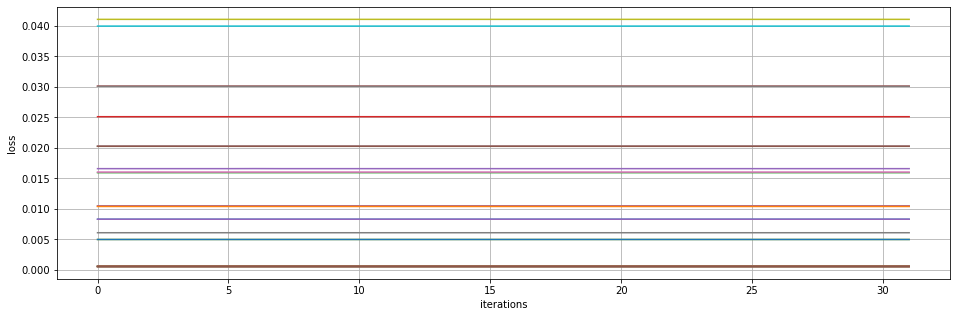

AYPE HLMB IAJERY AOE FVY MAJPZTGACVUQY B
---------------
epoch 2285
---------------
epoch 2290
---------------
epoch 2295
-----------------
average loss: 
[[0.00830538]
 [0.01041774]
 [0.02026802]
 [0.03011828]
 [0.01051621]
 [0.00056746]
 [0.02026802]
 [0.03011829]
 [0.00498913]
 [0.00056746]
 [0.00056746]
 [0.01041774]
 [0.01594482]
 [0.0251156 ]
 [0.00830538]
 [0.02026801]
 [0.00056746]
 [0.00609454]
 [0.04107398]
 [0.03996857]
 [0.00498913]
 [0.00056746]
 [0.00056746]
 [0.00056746]
 [0.01659977]
 [0.00056746]
 [0.01604329]]


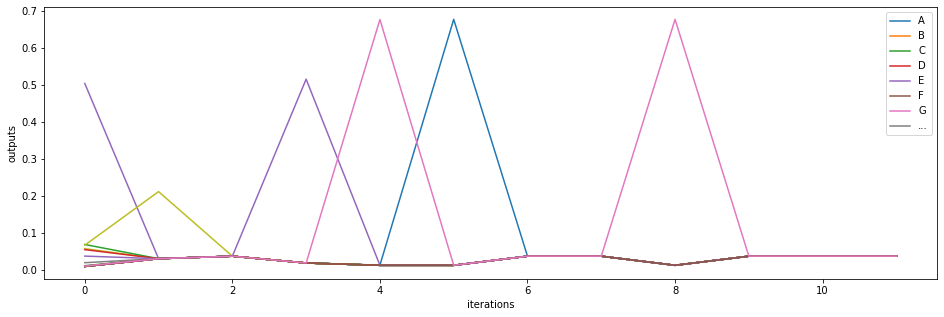

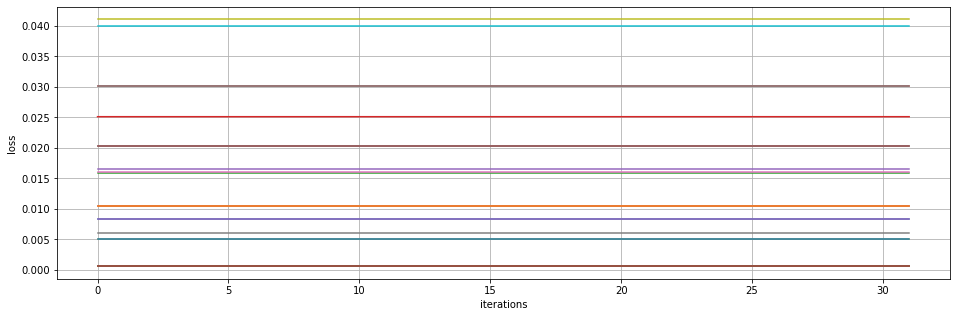

EOJSAOB AVJLOCENW AOU FRK AAHAHYKOAWQ AK
---------------
epoch 2300
---------------
epoch 2305
---------------
epoch 2310
-----------------
average loss: 
[[0.00830538]
 [0.01041774]
 [0.02026802]
 [0.03011828]
 [0.01051621]
 [0.00056746]
 [0.02026802]
 [0.03011829]
 [0.00498913]
 [0.00056746]
 [0.00056746]
 [0.01041774]
 [0.01594482]
 [0.02511564]
 [0.00830538]
 [0.02026801]
 [0.00056746]
 [0.00609454]
 [0.04107398]
 [0.03996857]
 [0.00498913]
 [0.00056746]
 [0.00056746]
 [0.00056746]
 [0.01659976]
 [0.00056746]
 [0.01604329]]


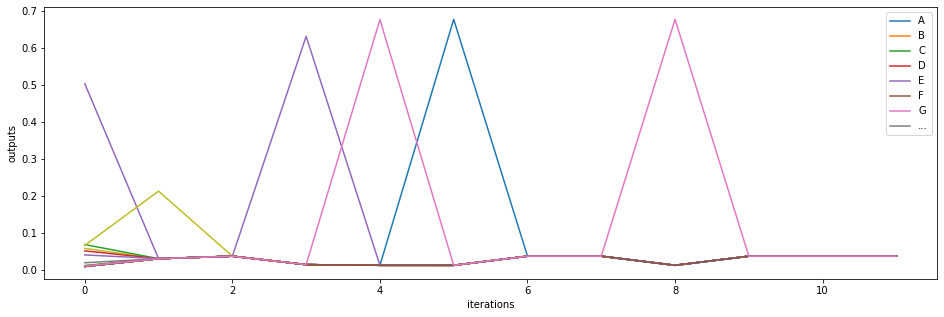

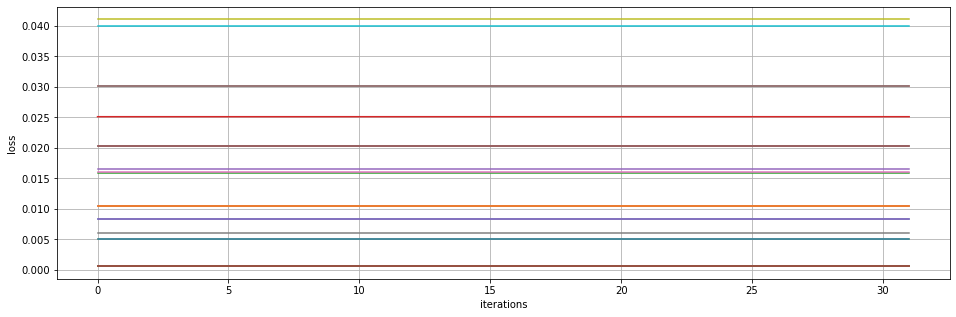

NOME D MC AKQ AFH AJL AZZ AGH ABS AYH AO
---------------
epoch 2315
---------------
epoch 2320
---------------
epoch 2325
-----------------
average loss: 
[[0.00830538]
 [0.01041774]
 [0.02026802]
 [0.03011828]
 [0.01051621]
 [0.00056746]
 [0.02026802]
 [0.03011829]
 [0.00498913]
 [0.00056746]
 [0.00056746]
 [0.01041774]
 [0.01594482]
 [0.02511561]
 [0.00830538]
 [0.02026801]
 [0.00056746]
 [0.00609454]
 [0.04107398]
 [0.03996857]
 [0.00498913]
 [0.00056746]
 [0.00056746]
 [0.00056746]
 [0.01659977]
 [0.00056746]
 [0.01604329]]


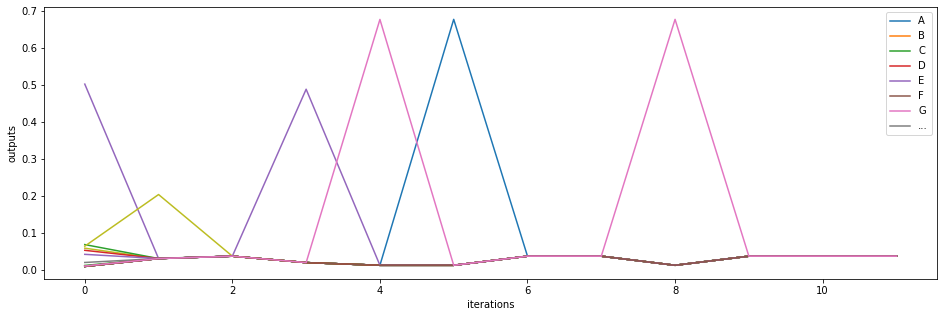

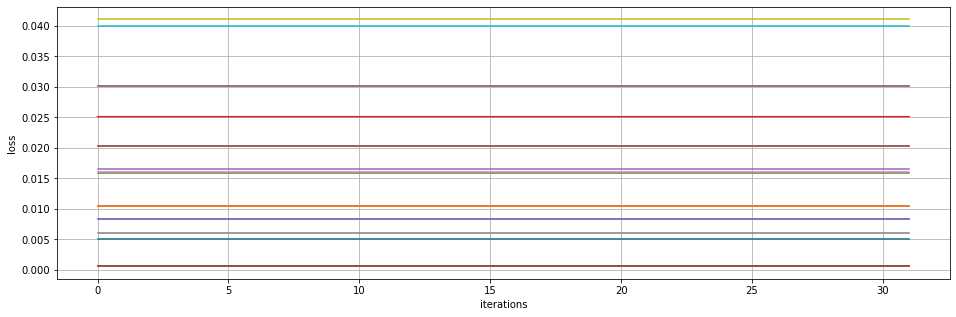

KOME RIN ZYEKAIOP FETQYAWASEOFAYAXAGY IB
---------------
epoch 2330
---------------
epoch 2335
---------------
epoch 2340
-----------------
average loss: 
[[0.00830538]
 [0.01041774]
 [0.02026802]
 [0.03011828]
 [0.01051621]
 [0.00056746]
 [0.02026802]
 [0.03011829]
 [0.00498913]
 [0.00056746]
 [0.00056746]
 [0.01041774]
 [0.01594482]
 [0.02511564]
 [0.00830538]
 [0.02026801]
 [0.00056746]
 [0.00609454]
 [0.04107397]
 [0.03996857]
 [0.00498913]
 [0.00056746]
 [0.00056746]
 [0.00056746]
 [0.01659976]
 [0.00056746]
 [0.01604329]]


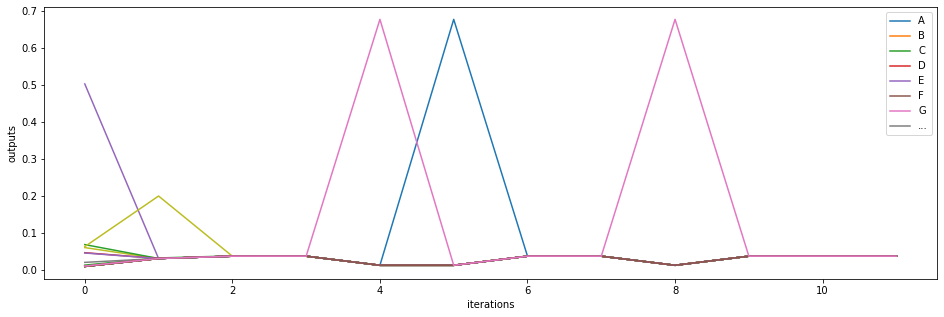

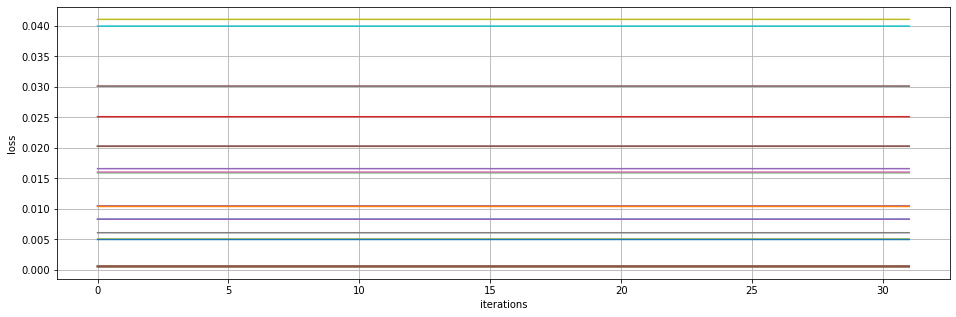

LOME ETURT AMV ALT DOPY SOME UFR AYZ AGR
---------------
epoch 2345
---------------
epoch 2350
---------------
epoch 2355
-----------------
average loss: 
[[0.00830532]
 [0.01041768]
 [0.02026796]
 [0.03011822]
 [0.0105176 ]
 [0.00056741]
 [0.02026796]
 [0.03011824]
 [0.00498909]
 [0.00056741]
 [0.00056741]
 [0.01041768]
 [0.01594483]
 [0.02511558]
 [0.00830532]
 [0.02026796]
 [0.00056741]
 [0.00609449]
 [0.04107365]
 [0.03996851]
 [0.00498907]
 [0.00056741]
 [0.00056741]
 [0.00056741]
 [0.01659971]
 [0.00056741]
 [0.01604325]]


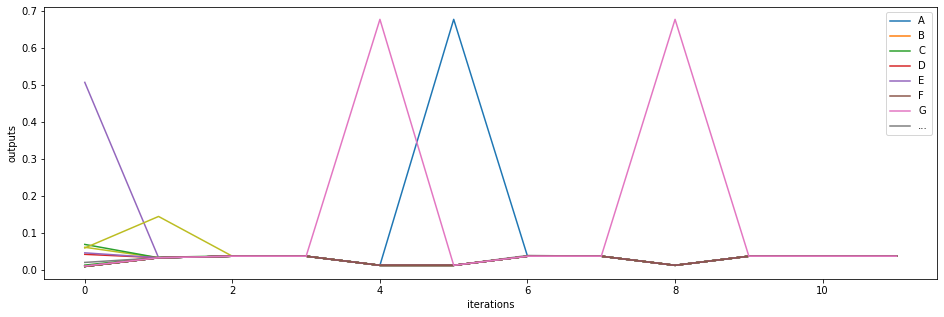

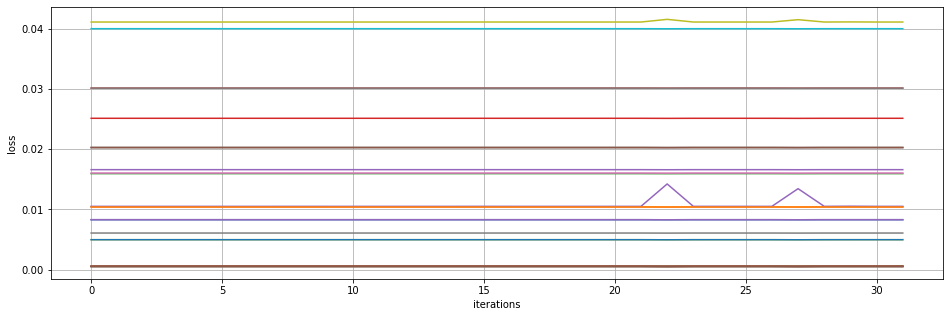

LOME PYF JW AQE AYG AYYTAPQRB AVRRQAUHAB
---------------
epoch 2360
---------------
epoch 2365
---------------
epoch 2370
-----------------
average loss: 
[[0.00830528]
 [0.01041765]
 [0.02026792]
 [0.03011819]
 [0.01051806]
 [0.00056737]
 [0.02026792]
 [0.0301182 ]
 [0.00498904]
 [0.00056737]
 [0.00056737]
 [0.01041765]
 [0.01594473]
 [0.02511554]
 [0.00830528]
 [0.02026792]
 [0.00056737]
 [0.00609445]
 [0.04106018]
 [0.03996847]
 [0.00498903]
 [0.00056737]
 [0.00056737]
 [0.00056737]
 [0.01659967]
 [0.00056737]
 [0.0160432 ]]


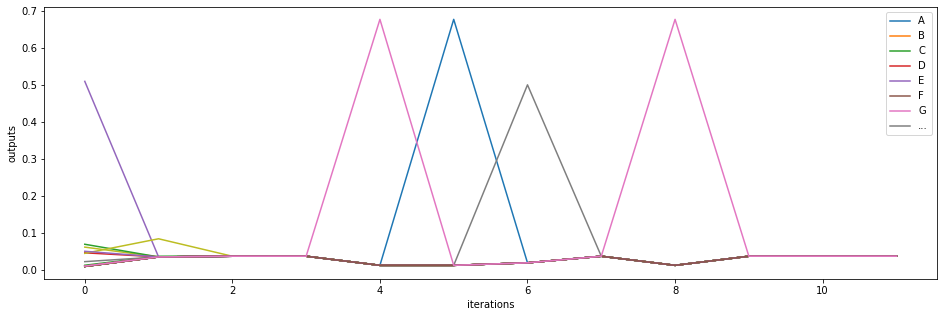

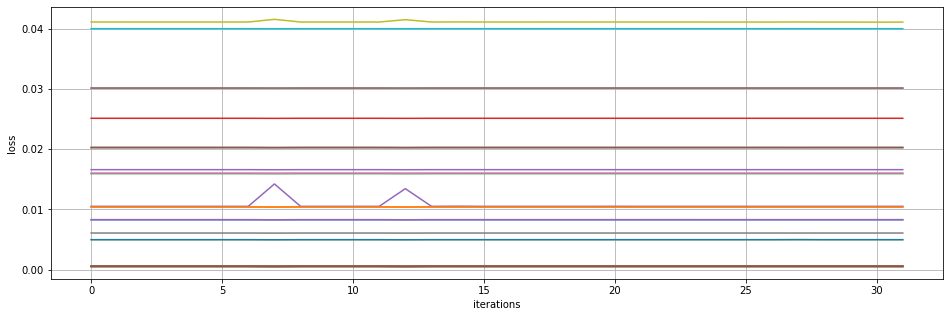

SOME XOUR  AYZ SOME NUKUEFA PWREHIAERK C
---------------
epoch 2375
---------------
epoch 2380
---------------
epoch 2385
-----------------
average loss: 
[[0.0082784 ]
 [0.01039076]
 [0.02024103]
 [0.03009129]
 [0.01048924]
 [0.00054048]
 [0.02024103]
 [0.03009131]
 [0.00672573]
 [0.00054048]
 [0.00054048]
 [0.01039076]
 [0.01591787]
 [0.02508859]
 [0.00827839]
 [0.02024103]
 [0.00054048]
 [0.00606756]
 [0.02623959]
 [0.03994158]
 [0.00496215]
 [0.00054048]
 [0.00054048]
 [0.00054048]
 [0.01657277]
 [0.00054048]
 [0.01601631]]


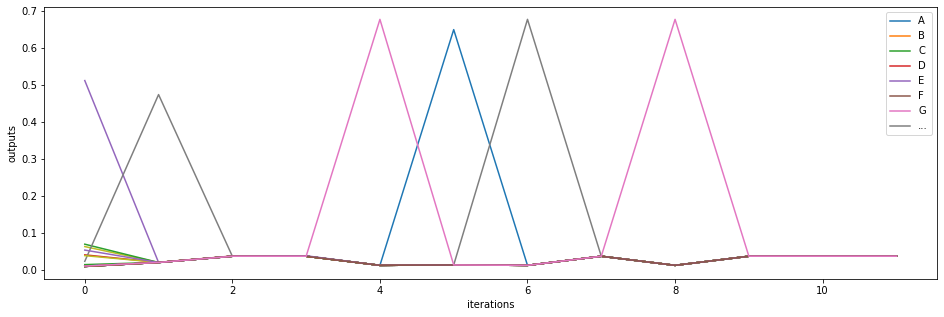

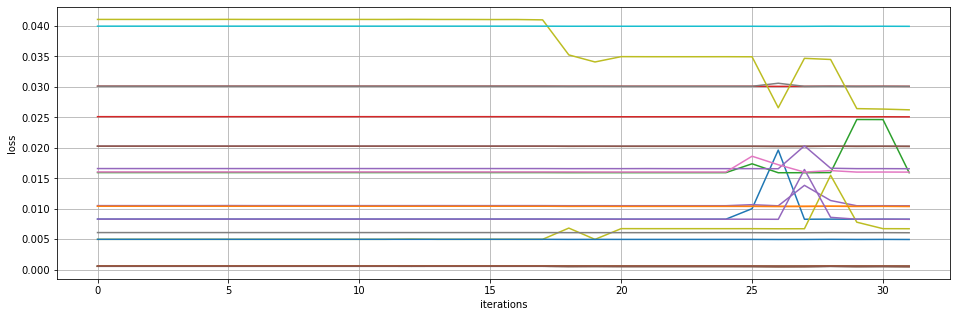

POFEJY EOQSYWNY KOQWGRRRAGIDLF WOME EDUR
---------------
epoch 2390
---------------
epoch 2395
---------------
epoch 2400
-----------------
average loss: 
[[0.00825251]
 [0.01036487]
 [0.02021515]
 [0.03006541]
 [0.01046344]
 [0.00051459]
 [0.02021515]
 [0.03006542]
 [0.00669662]
 [0.00051459]
 [0.00051459]
 [0.01036487]
 [0.01589195]
 [0.0250624 ]
 [0.00825251]
 [0.02021515]
 [0.00051459]
 [0.00604168]
 [0.01742334]
 [0.0399157 ]
 [0.00493626]
 [0.00051459]
 [0.00051459]
 [0.00051459]
 [0.00780206]
 [0.00051459]
 [0.01599045]]


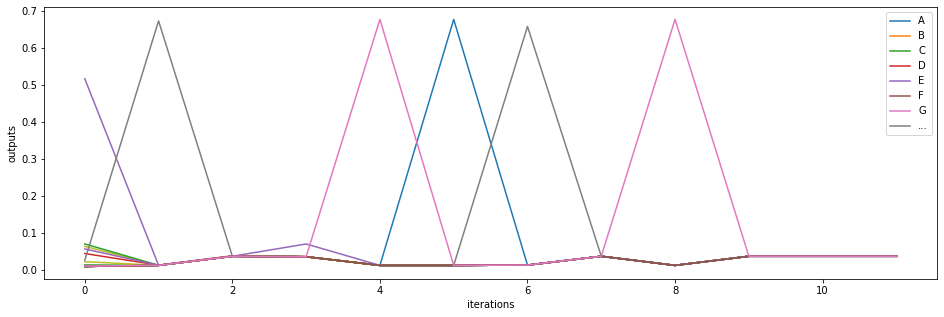

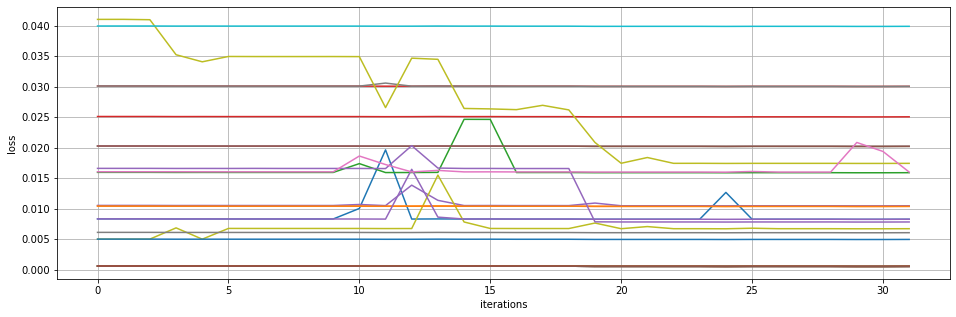

IOYZCIP ACP AYLGYYDQAZE BTB HHJD TXAEE A
---------------
epoch 2405
---------------
epoch 2410
---------------
epoch 2415
-----------------
average loss: 
[[0.00825251]
 [0.01036487]
 [0.02021515]
 [0.03006541]
 [0.01046334]
 [0.0005146 ]
 [0.02021515]
 [0.03006542]
 [0.00669662]
 [0.0005146 ]
 [0.0005146 ]
 [0.01036487]
 [0.01589195]
 [0.02506277]
 [0.00825251]
 [0.02021515]
 [0.0005146 ]
 [0.00604168]
 [0.01742333]
 [0.0399157 ]
 [0.00493626]
 [0.0005146 ]
 [0.0005146 ]
 [0.0005146 ]
 [0.00780204]
 [0.0005146 ]
 [0.01599042]]


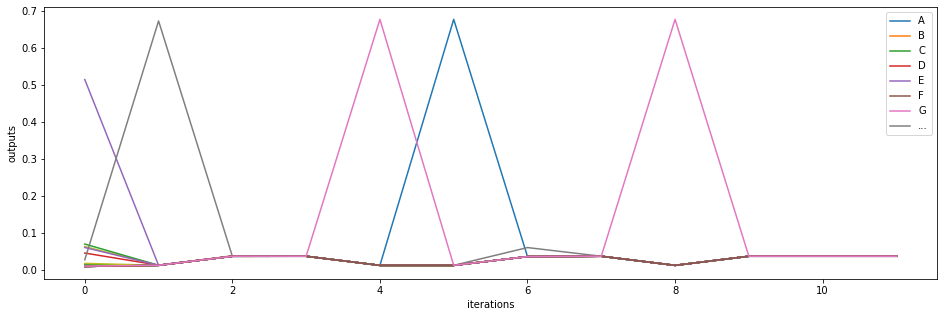

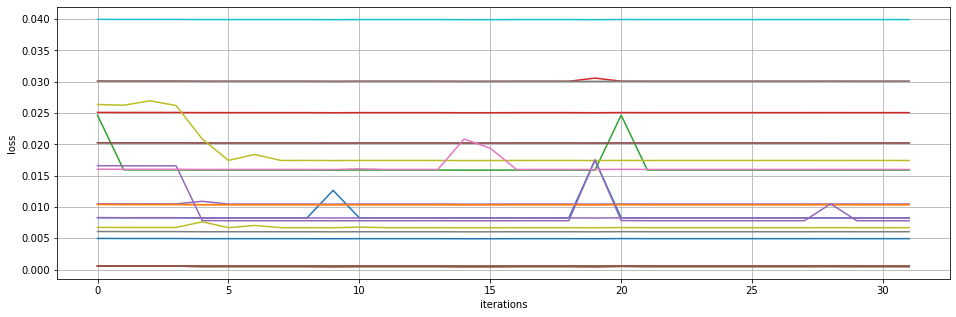

UORU ANH USE OBJ AOS MY BOOPB SOME KOPRD
---------------
epoch 2420
---------------
epoch 2425
---------------
epoch 2430
-----------------
average loss: 
[[0.00825251]
 [0.01036487]
 [0.02021515]
 [0.03006541]
 [0.01046334]
 [0.0005146 ]
 [0.02021515]
 [0.03006542]
 [0.00669662]
 [0.0005146 ]
 [0.0005146 ]
 [0.01036487]
 [0.01589195]
 [0.02506276]
 [0.00825251]
 [0.02021515]
 [0.0005146 ]
 [0.00604168]
 [0.01742333]
 [0.0399157 ]
 [0.00493626]
 [0.0005146 ]
 [0.0005146 ]
 [0.0005146 ]
 [0.00780204]
 [0.0005146 ]
 [0.01599042]]


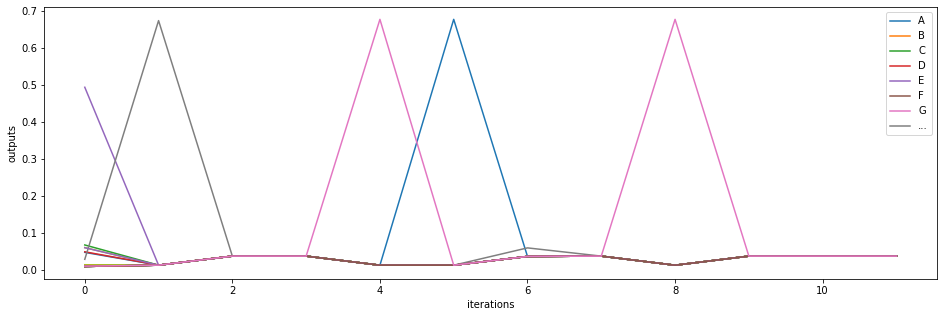

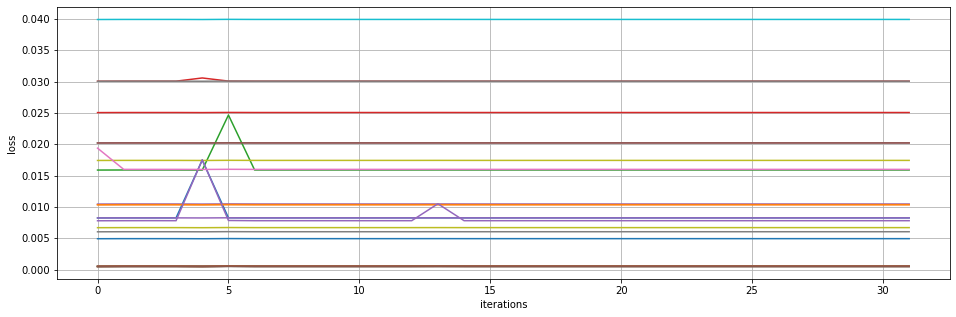

WOME XOURQ ANQ SOME WPRRNWSQERQ MLIJBERT
---------------
epoch 2435
---------------
epoch 2440
---------------
epoch 2445
-----------------
average loss: 
[[0.00825251]
 [0.01036487]
 [0.02021515]
 [0.03006541]
 [0.01046334]
 [0.0005146 ]
 [0.02021515]
 [0.03006542]
 [0.00669662]
 [0.0005146 ]
 [0.0005146 ]
 [0.01036487]
 [0.01589195]
 [0.02506273]
 [0.00825251]
 [0.02021515]
 [0.0005146 ]
 [0.00604168]
 [0.01742333]
 [0.0399157 ]
 [0.00493626]
 [0.0005146 ]
 [0.0005146 ]
 [0.0005146 ]
 [0.00780204]
 [0.0005146 ]
 [0.01599042]]


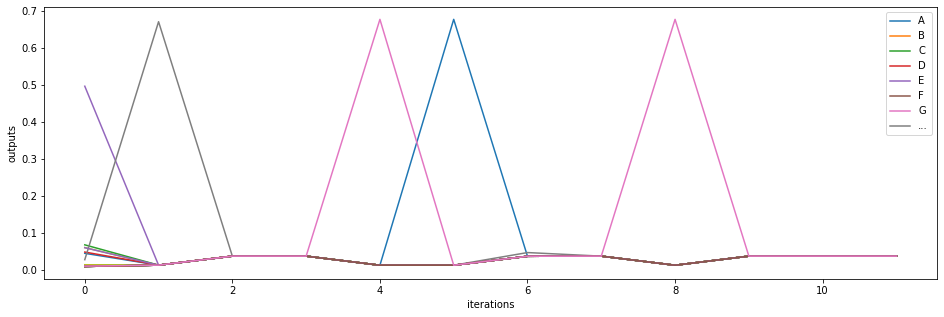

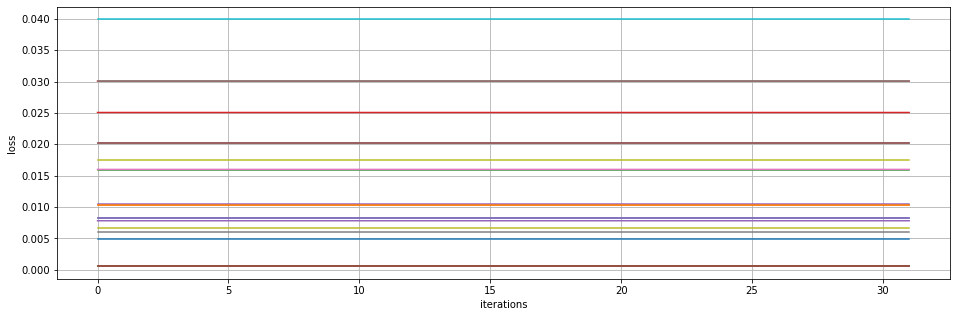

AME GLQ RKAABE BQB WOEPURKQAHLMERY HO WG
---------------
epoch 2450
---------------
epoch 2455
---------------
epoch 2460
-----------------
average loss: 
[[0.00825251]
 [0.01036487]
 [0.02021515]
 [0.03006542]
 [0.01046334]
 [0.0005146 ]
 [0.02021515]
 [0.03006542]
 [0.00669662]
 [0.0005146 ]
 [0.0005146 ]
 [0.01036487]
 [0.01589195]
 [0.02506268]
 [0.00825251]
 [0.02021515]
 [0.0005146 ]
 [0.00604168]
 [0.01742333]
 [0.0399157 ]
 [0.00493626]
 [0.0005146 ]
 [0.0005146 ]
 [0.0005146 ]
 [0.00780204]
 [0.0005146 ]
 [0.01599043]]


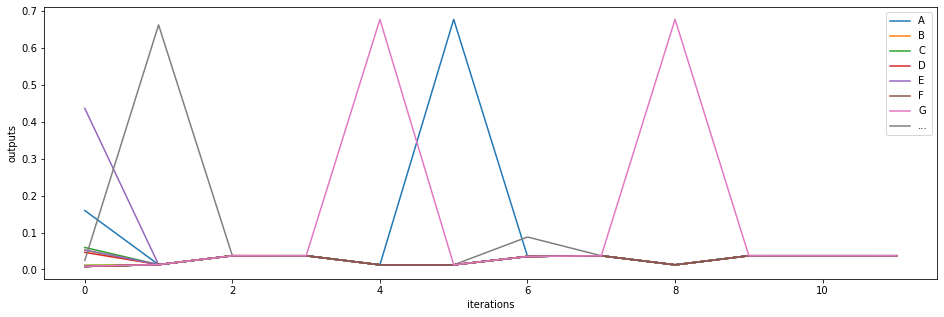

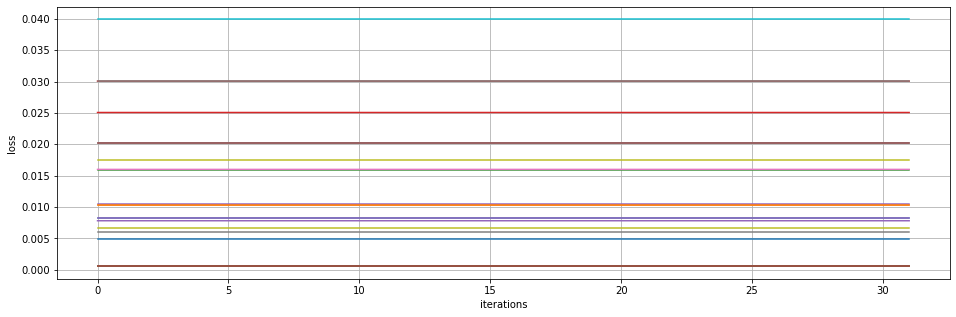

AUS ANG SOME MINUWOSWI AJK AOMK FOJDOGRP
---------------
epoch 2465
---------------
epoch 2470
---------------
epoch 2475
-----------------
average loss: 
[[0.00825251]
 [0.01036487]
 [0.02021515]
 [0.03006542]
 [0.01046334]
 [0.0005146 ]
 [0.02021515]
 [0.03006542]
 [0.00669662]
 [0.0005146 ]
 [0.0005146 ]
 [0.01036487]
 [0.01589195]
 [0.02506277]
 [0.00825251]
 [0.02021515]
 [0.0005146 ]
 [0.00604168]
 [0.01742333]
 [0.0399157 ]
 [0.00493626]
 [0.0005146 ]
 [0.0005146 ]
 [0.0005146 ]
 [0.00780204]
 [0.0005146 ]
 [0.01599042]]


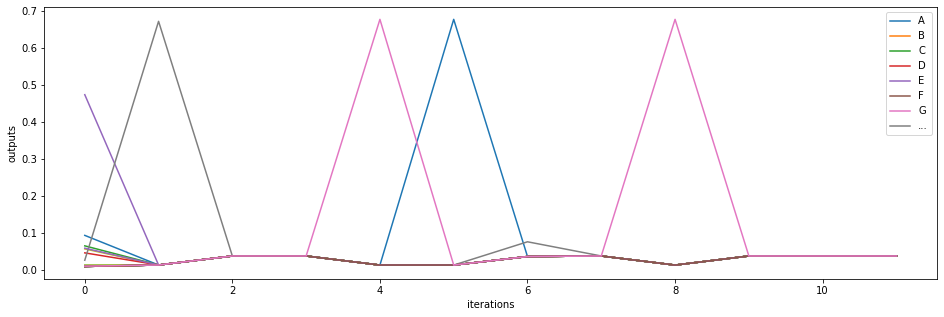

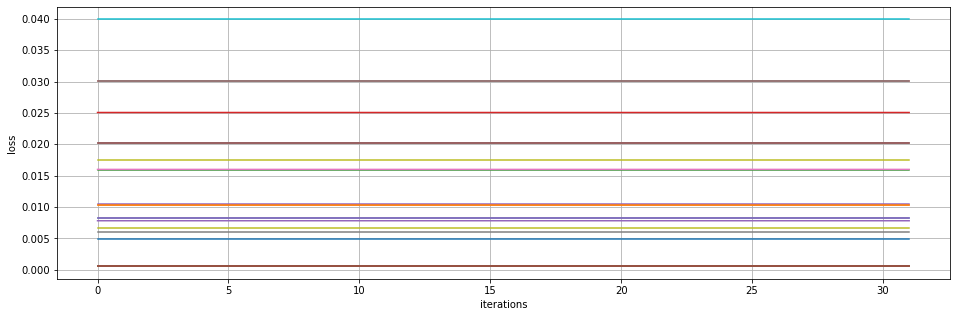

ABY SOME HOURE AYT AWF AYH AUAGRJFAME CE
---------------
epoch 2480
---------------
epoch 2485
---------------
epoch 2490
-----------------
average loss: 
[[0.00825251]
 [0.01036487]
 [0.02021515]
 [0.03006542]
 [0.01046334]
 [0.0005146 ]
 [0.02021515]
 [0.03006542]
 [0.00669662]
 [0.0005146 ]
 [0.0005146 ]
 [0.01036487]
 [0.01589195]
 [0.02506273]
 [0.00825251]
 [0.02021515]
 [0.0005146 ]
 [0.00604168]
 [0.01742333]
 [0.0399157 ]
 [0.00493626]
 [0.0005146 ]
 [0.0005146 ]
 [0.0005146 ]
 [0.00780204]
 [0.0005146 ]
 [0.01599042]]


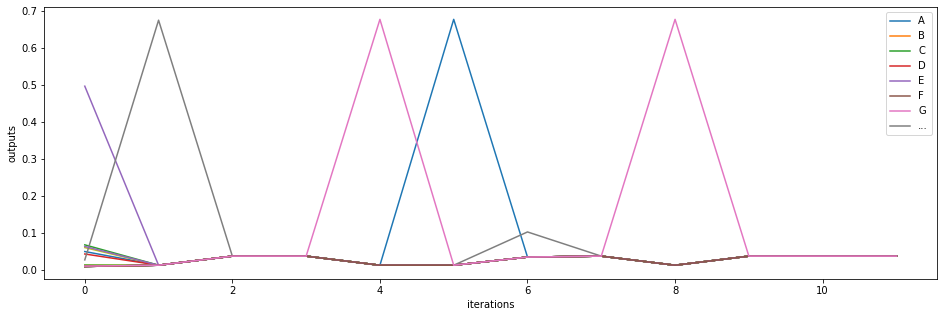

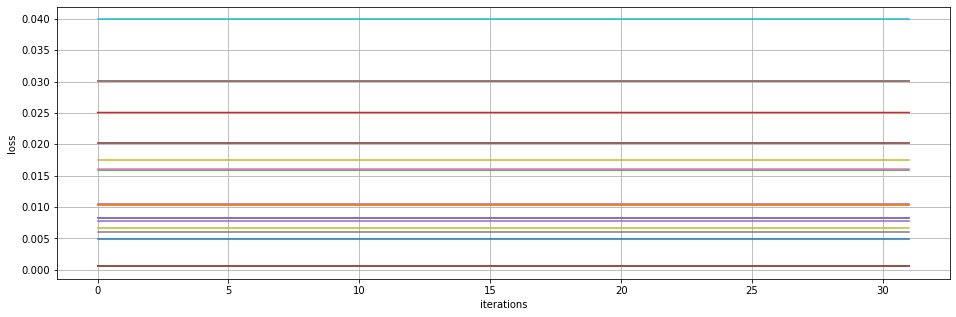

AJATEHCS GRQ ANK AYS GNP AOI ADTYIBOTE U
---------------
epoch 2495
---------------
epoch 2500
---------------
epoch 2505
-----------------
average loss: 
[[0.00825251]
 [0.01036487]
 [0.02021515]
 [0.03006541]
 [0.01046334]
 [0.0005146 ]
 [0.02021515]
 [0.03006542]
 [0.00669662]
 [0.0005146 ]
 [0.0005146 ]
 [0.01036487]
 [0.01589195]
 [0.02506277]
 [0.00825251]
 [0.02021515]
 [0.0005146 ]
 [0.00604168]
 [0.01742333]
 [0.0399157 ]
 [0.00493626]
 [0.0005146 ]
 [0.0005146 ]
 [0.0005146 ]
 [0.00780204]
 [0.0005146 ]
 [0.01599042]]


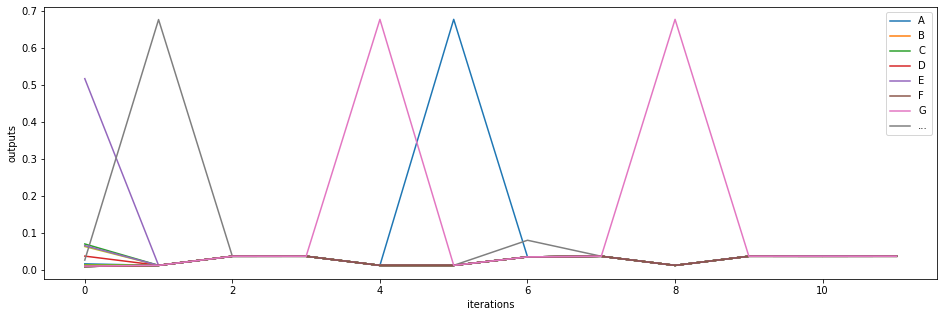

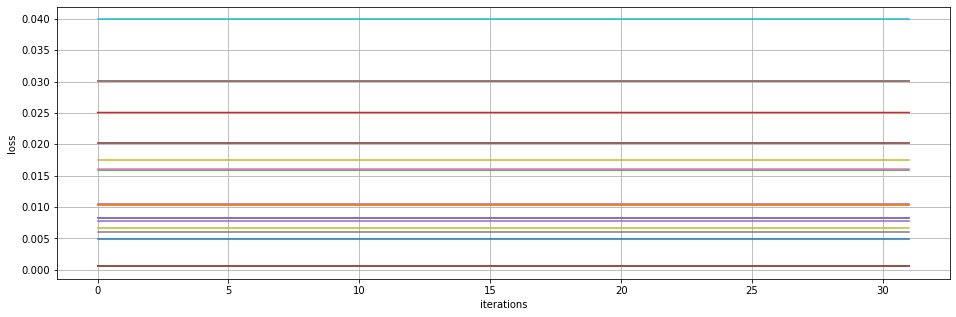

AEFD LOOCYUPOAJNY OOIW MINUYES I AOP AYV
---------------
epoch 2510
---------------
epoch 2515
---------------
epoch 2520
-----------------
average loss: 
[[0.00825354]
 [0.0103659 ]
 [0.02021618]
 [0.03006644]
 [0.01046437]
 [0.00051562]
 [0.02021617]
 [0.03006645]
 [0.00493913]
 [0.00051562]
 [0.00051562]
 [0.0103659 ]
 [0.01589298]
 [0.02506379]
 [0.00825354]
 [0.02021617]
 [0.00051562]
 [0.00604271]
 [0.01481447]
 [0.03991673]
 [0.00493731]
 [0.00051562]
 [0.00051562]
 [0.00051562]
 [0.00780306]
 [0.00051562]
 [0.01599145]]


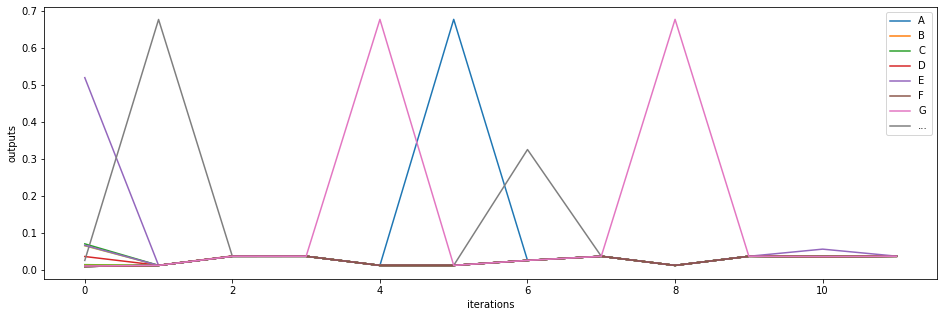

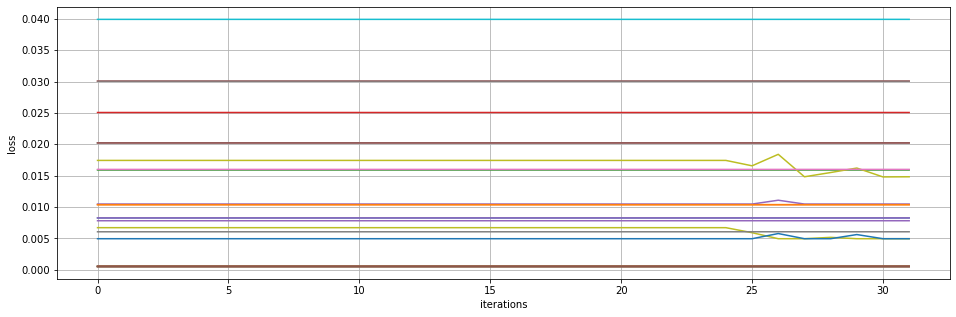

ACZCACVIAAULVAXJ ARY BONI ANK AYNCAWE S 
---------------
epoch 2525
---------------
epoch 2530
---------------
epoch 2535
-----------------
average loss: 
[[0.00825356]
 [0.01036592]
 [0.02021619]
 [0.03006646]
 [0.01046439]
 [0.00051564]
 [0.02021619]
 [0.03006647]
 [0.00493731]
 [0.00051564]
 [0.00051564]
 [0.01036592]
 [0.015893  ]
 [0.02506381]
 [0.00825355]
 [0.02021619]
 [0.00051564]
 [0.00604272]
 [0.01478758]
 [0.03991675]
 [0.00493731]
 [0.00051564]
 [0.00051564]
 [0.00051564]
 [0.00780308]
 [0.00051564]
 [0.01599147]]


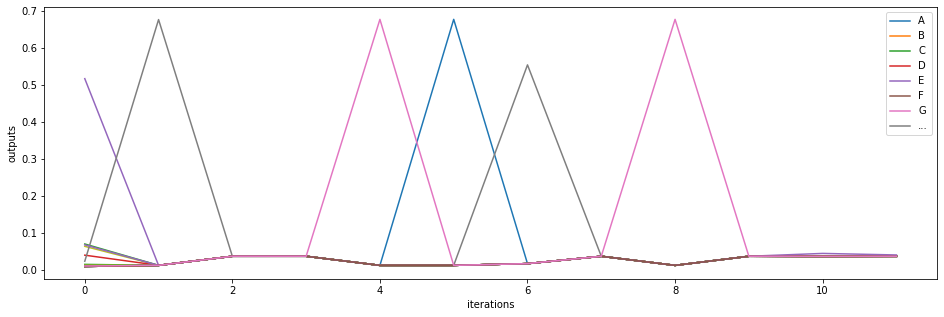

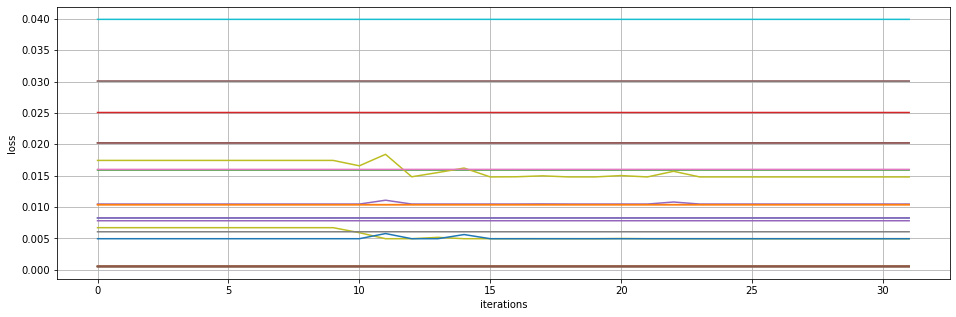

AT UYQI ALJ AYP ATE UHP AYF AML KNU KOS 
---------------
epoch 2540
---------------
epoch 2545
---------------
epoch 2550
-----------------
average loss: 
[[0.00825356]
 [0.01036592]
 [0.02021619]
 [0.03006646]
 [0.01046439]
 [0.00051564]
 [0.02021619]
 [0.03006647]
 [0.00493731]
 [0.00051564]
 [0.00051564]
 [0.01036592]
 [0.015893  ]
 [0.02506382]
 [0.00825355]
 [0.02021619]
 [0.00051564]
 [0.00604272]
 [0.01478758]
 [0.03991675]
 [0.00493731]
 [0.00051564]
 [0.00051564]
 [0.00051564]
 [0.00780308]
 [0.00051564]
 [0.01599147]]


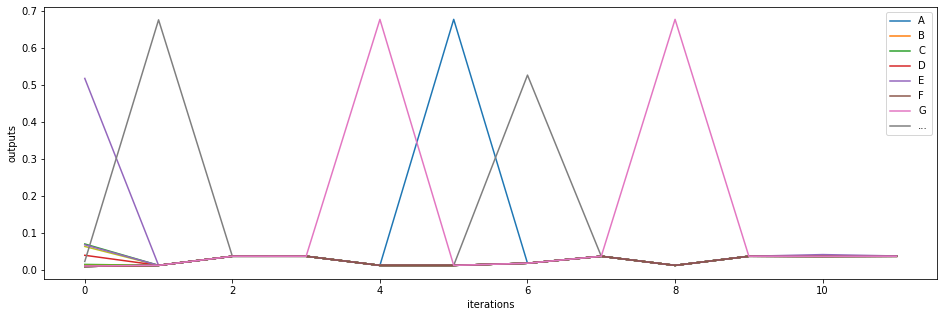

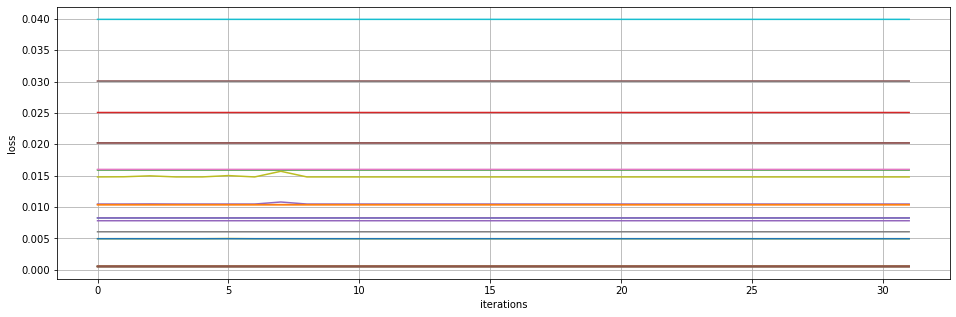

AOMY POWWKXAVERE MSAIE AUT AYE  YJZANZ A
---------------
epoch 2555
---------------
epoch 2560
---------------
epoch 2565
-----------------
average loss: 
[[0.00825356]
 [0.01036592]
 [0.02021619]
 [0.03006646]
 [0.01046439]
 [0.00051564]
 [0.02021619]
 [0.03006647]
 [0.00493731]
 [0.00051564]
 [0.00051564]
 [0.01036592]
 [0.015893  ]
 [0.02506379]
 [0.00825355]
 [0.02021619]
 [0.00051564]
 [0.00604272]
 [0.01478758]
 [0.03991675]
 [0.00493731]
 [0.00051564]
 [0.00051564]
 [0.00051564]
 [0.00780308]
 [0.00051564]
 [0.01599147]]


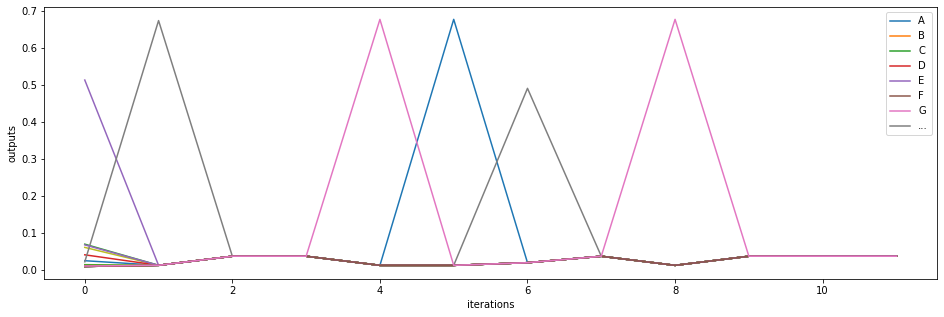

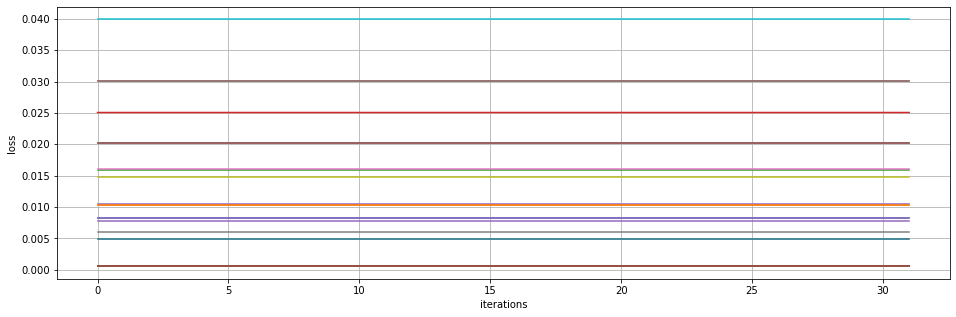

QOQI ASJRENIAWERCYAFNT IS GRUDOYNO YOORL
---------------
epoch 2570
---------------
epoch 2575
---------------
epoch 2580
-----------------
average loss: 
[[0.00825356]
 [0.01036592]
 [0.02021619]
 [0.03006646]
 [0.01046439]
 [0.00051564]
 [0.02021619]
 [0.03006647]
 [0.00493731]
 [0.00051564]
 [0.00051564]
 [0.01036592]
 [0.015893  ]
 [0.0250638 ]
 [0.00825355]
 [0.02021619]
 [0.00051564]
 [0.00604272]
 [0.01478758]
 [0.03991675]
 [0.00493731]
 [0.00051564]
 [0.00051564]
 [0.00051564]
 [0.00780308]
 [0.00051564]
 [0.01599147]]


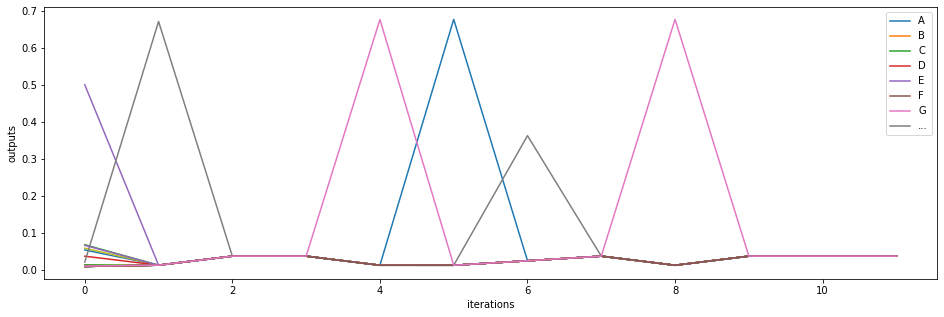

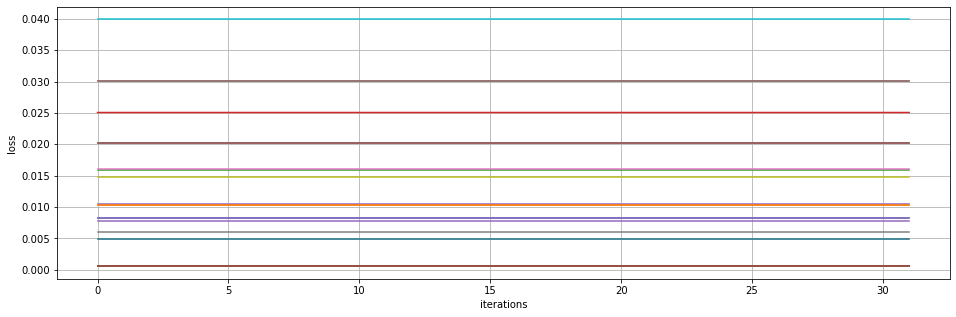

COSI AYOZWRCNAJERJKGRI ADFVERS AYC AKW A
---------------
epoch 2585
---------------
epoch 2590
---------------
epoch 2595
-----------------
average loss: 
[[0.00825356]
 [0.01036592]
 [0.02021619]
 [0.03006646]
 [0.01046439]
 [0.00051564]
 [0.02021619]
 [0.03006647]
 [0.00493731]
 [0.00051564]
 [0.00051564]
 [0.01036592]
 [0.015893  ]
 [0.02506382]
 [0.00825355]
 [0.02021619]
 [0.00051564]
 [0.00604272]
 [0.01478758]
 [0.03991675]
 [0.00493731]
 [0.00051564]
 [0.00051564]
 [0.00051564]
 [0.00780308]
 [0.00051564]
 [0.01599147]]


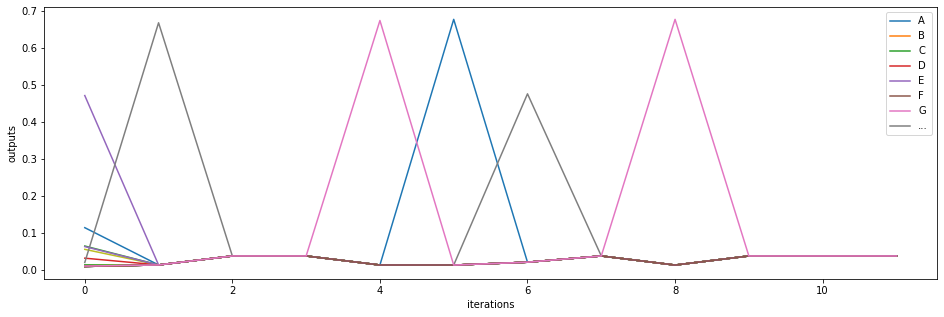

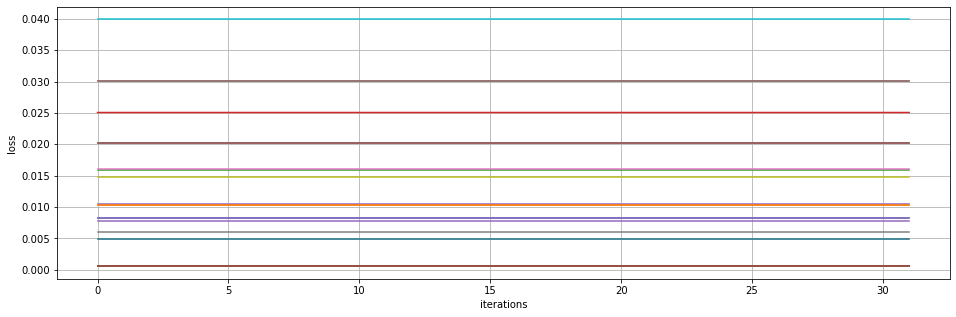

COOUYLU FPRME ME UEHXHIUARE EFURB AV YQK
---------------
epoch 2600
---------------
epoch 2605
---------------
epoch 2610
-----------------
average loss: 
[[0.00825356]
 [0.01036592]
 [0.02021619]
 [0.03006646]
 [0.01046439]
 [0.00051564]
 [0.02021619]
 [0.03006647]
 [0.00493731]
 [0.00051564]
 [0.00051564]
 [0.01036592]
 [0.015893  ]
 [0.02506382]
 [0.00825355]
 [0.02021619]
 [0.00051564]
 [0.00604272]
 [0.01478758]
 [0.03991675]
 [0.00493731]
 [0.00051564]
 [0.00051564]
 [0.00051564]
 [0.00780308]
 [0.00051564]
 [0.01599147]]


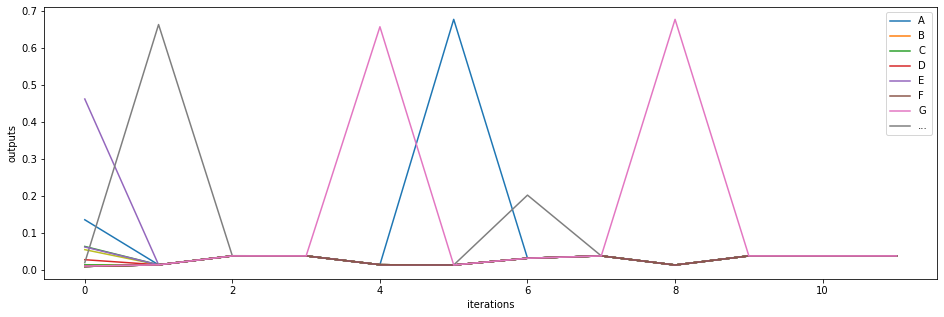

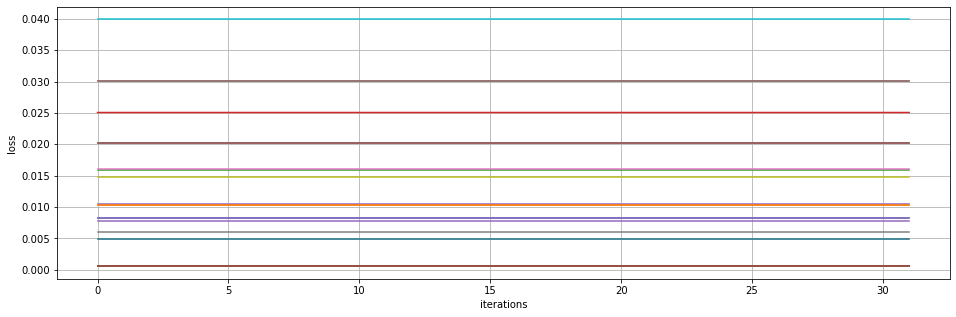

POJF YOVOXI API AYP KQLGUASVCAXZ AGW WMS
---------------
epoch 2615
---------------
epoch 2620
---------------
epoch 2625
-----------------
average loss: 
[[0.00825356]
 [0.01036592]
 [0.02021619]
 [0.03006646]
 [0.01046439]
 [0.00051564]
 [0.02021619]
 [0.03006647]
 [0.00493731]
 [0.00051564]
 [0.00051564]
 [0.01036592]
 [0.015893  ]
 [0.02506382]
 [0.00825355]
 [0.02021619]
 [0.00051564]
 [0.00604272]
 [0.01478758]
 [0.03991675]
 [0.00493731]
 [0.00051564]
 [0.00051564]
 [0.00051564]
 [0.00780308]
 [0.00051564]
 [0.01599147]]


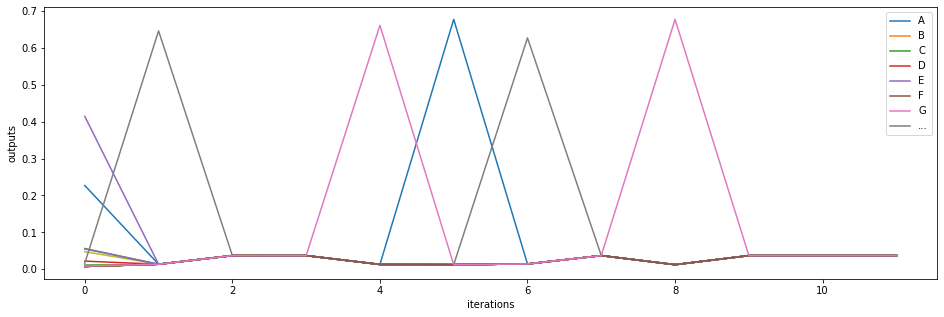

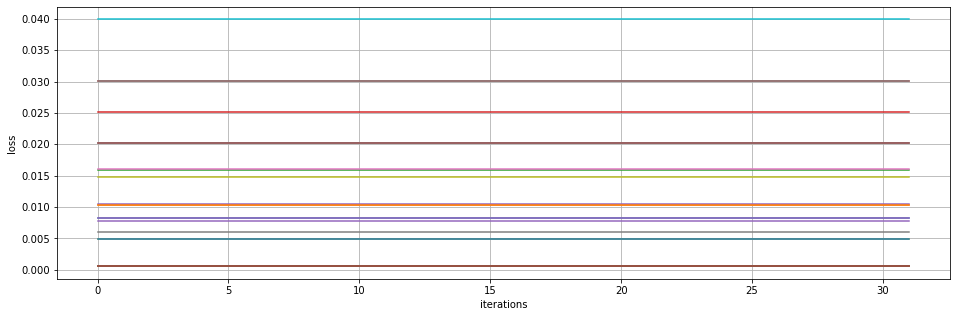

GOBME GAUIC TOHXNWJWTEUCS AYL ALN ABC RZ
---------------
epoch 2630
---------------
epoch 2635
---------------
epoch 2640
-----------------
average loss: 
[[0.00825356]
 [0.01036592]
 [0.02021619]
 [0.03006646]
 [0.01046439]
 [0.00051564]
 [0.02021619]
 [0.03006647]
 [0.00493731]
 [0.00051564]
 [0.00051564]
 [0.01036592]
 [0.015893  ]
 [0.02506381]
 [0.00825355]
 [0.02021619]
 [0.00051564]
 [0.00604272]
 [0.01478758]
 [0.03991675]
 [0.00493731]
 [0.00051564]
 [0.00051564]
 [0.00051564]
 [0.00780308]
 [0.00051564]
 [0.01599147]]


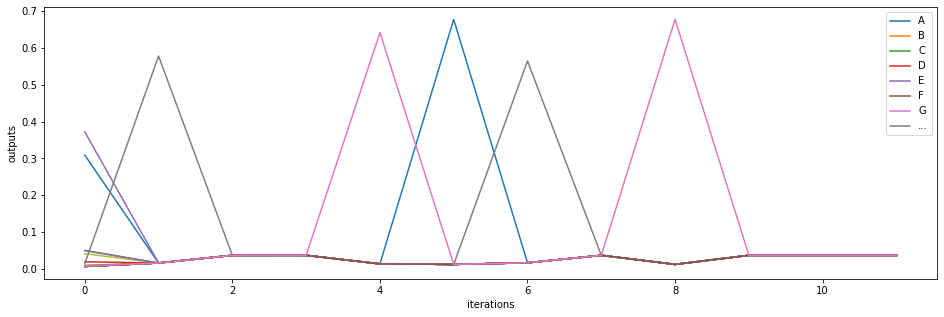

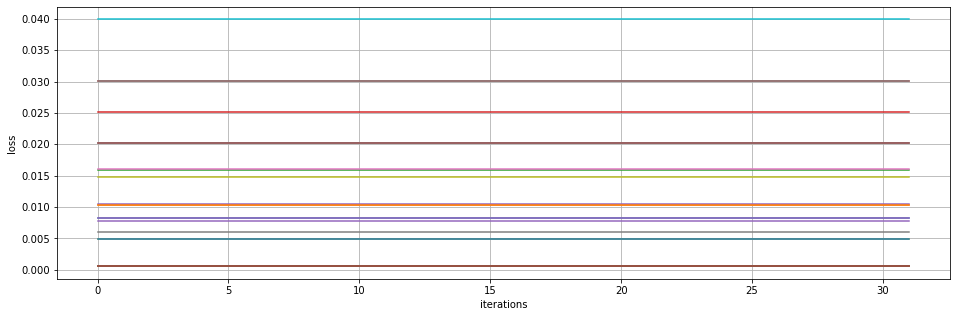

ZOLR AXH JGERG AME EKZ VEI ANP SOME MINU
---------------
epoch 2645
---------------
epoch 2650
---------------
epoch 2655
-----------------
average loss: 
[[0.00825356]
 [0.01036592]
 [0.02021619]
 [0.03006646]
 [0.01046439]
 [0.00051564]
 [0.02021619]
 [0.03006647]
 [0.00493731]
 [0.00051564]
 [0.00051564]
 [0.01036592]
 [0.015893  ]
 [0.02506381]
 [0.00825355]
 [0.02021619]
 [0.00051564]
 [0.00604272]
 [0.01478758]
 [0.03991675]
 [0.00493731]
 [0.00051564]
 [0.00051564]
 [0.00051564]
 [0.00780308]
 [0.00051564]
 [0.01599147]]


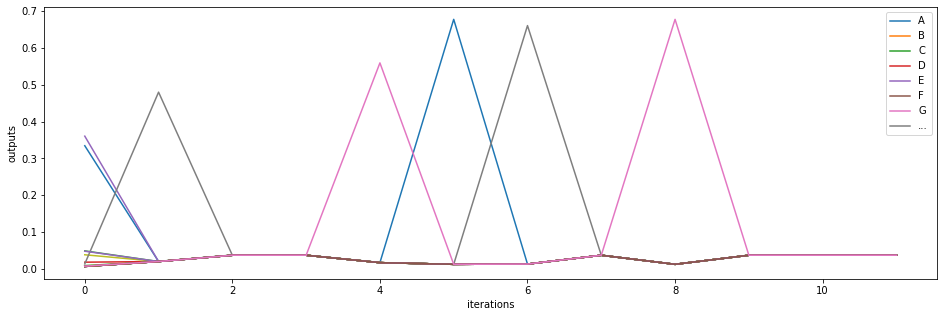

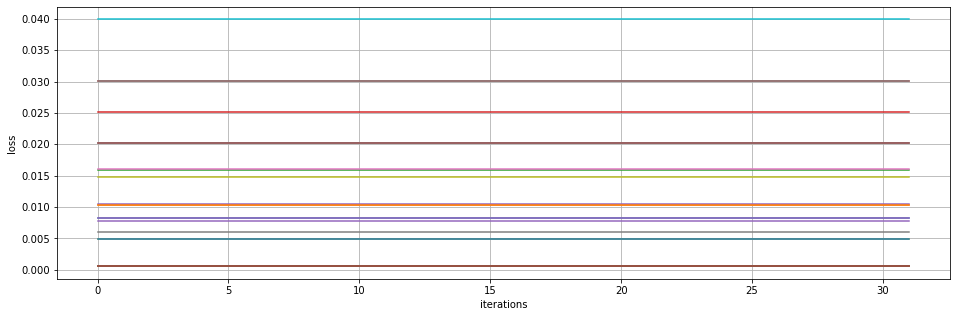

COHG AYRZASAME COURC AJGREAIAAE  WADANG 
---------------
epoch 2660
---------------
epoch 2665
---------------
epoch 2670
-----------------
average loss: 
[[0.00825356]
 [0.01036592]
 [0.0202162 ]
 [0.03006645]
 [0.01046452]
 [0.00051564]
 [0.02021619]
 [0.03006647]
 [0.0049373 ]
 [0.00051564]
 [0.00051564]
 [0.01036592]
 [0.015893  ]
 [0.02506381]
 [0.00825356]
 [0.02021619]
 [0.00051564]
 [0.00604274]
 [0.01478758]
 [0.03991674]
 [0.0049373 ]
 [0.00051564]
 [0.00051564]
 [0.00051564]
 [0.00780308]
 [0.00051564]
 [0.01599147]]


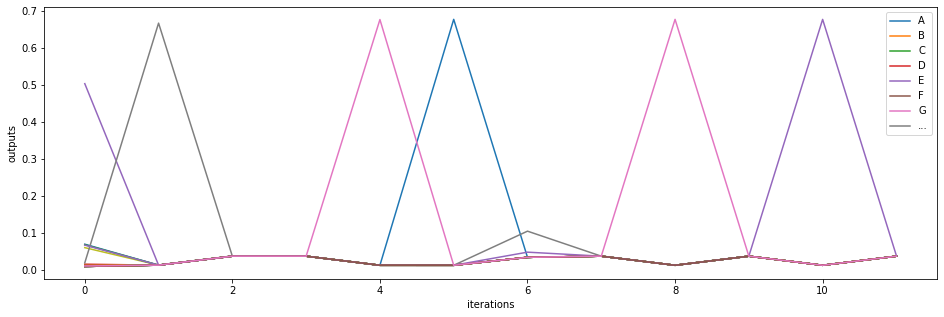

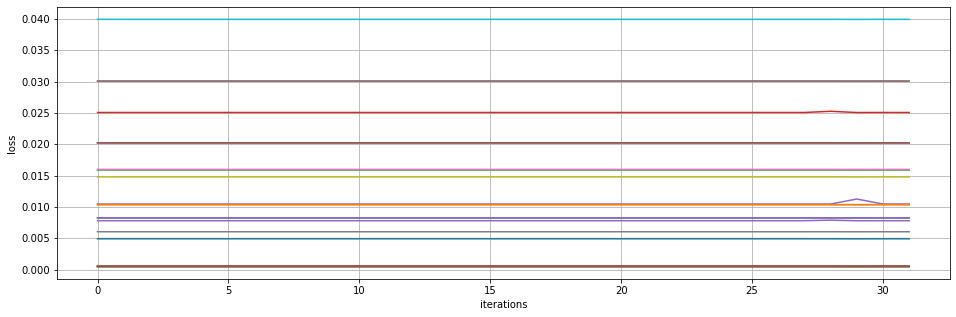

AKARJ AXN AGERPAAXE PRTE BI ABG ALC ATT 
---------------
epoch 2675
---------------
epoch 2680
---------------
epoch 2685
-----------------
average loss: 
[[0.00825356]
 [0.01036592]
 [0.02021617]
 [0.03006646]
 [0.01046439]
 [0.00051564]
 [0.02021619]
 [0.03006647]
 [0.00493731]
 [0.00051564]
 [0.00051564]
 [0.01036592]
 [0.015893  ]
 [0.02506382]
 [0.00825355]
 [0.02021619]
 [0.00051564]
 [0.00604272]
 [0.01478758]
 [0.03991675]
 [0.00493731]
 [0.00051564]
 [0.00051564]
 [0.00051564]
 [0.00780308]
 [0.00051564]
 [0.01599147]]


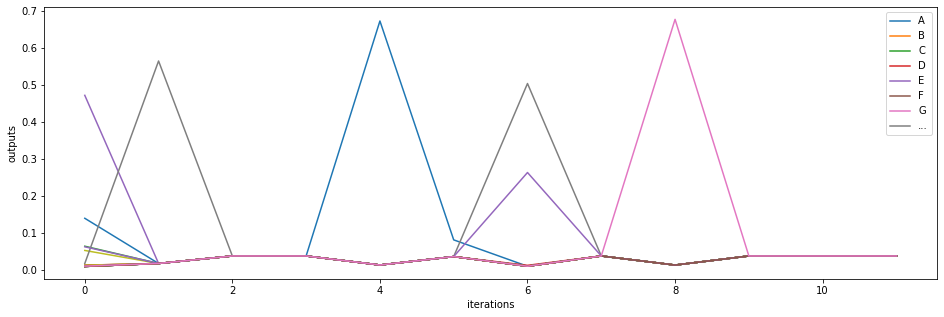

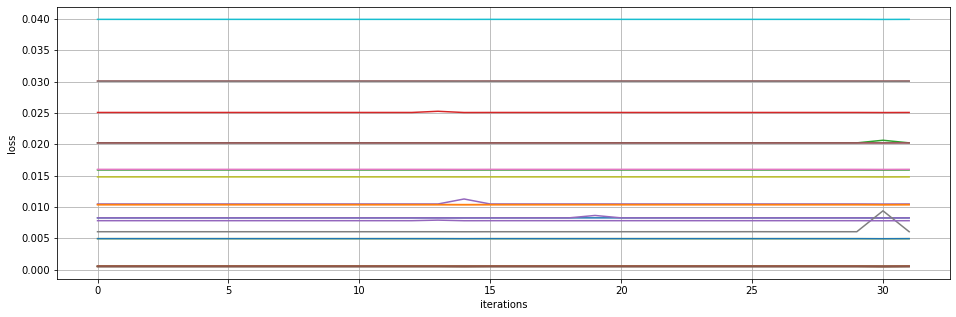

UOME FOURX ASTWLOB NOAEFZIKAILILAYEUYHAJ
---------------
epoch 2690
---------------
epoch 2695
---------------
epoch 2700
-----------------
average loss: 
[[0.00825354]
 [0.01036591]
 [0.02021256]
 [0.03006645]
 [0.01046438]
 [0.00051563]
 [0.02021618]
 [0.03006659]
 [0.00493729]
 [0.00051563]
 [0.00051563]
 [0.01036591]
 [0.01589299]
 [0.02506378]
 [0.00825354]
 [0.02021618]
 [0.00051563]
 [0.00604273]
 [0.01478757]
 [0.03991673]
 [0.00493731]
 [0.00051563]
 [0.00051563]
 [0.00051563]
 [0.00780307]
 [0.00051563]
 [0.01599146]]


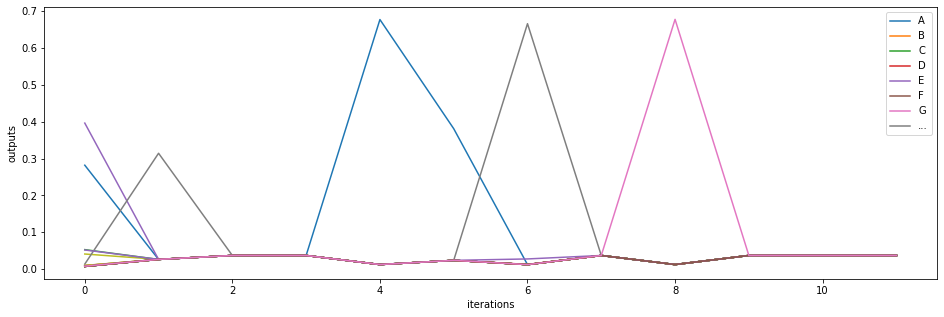

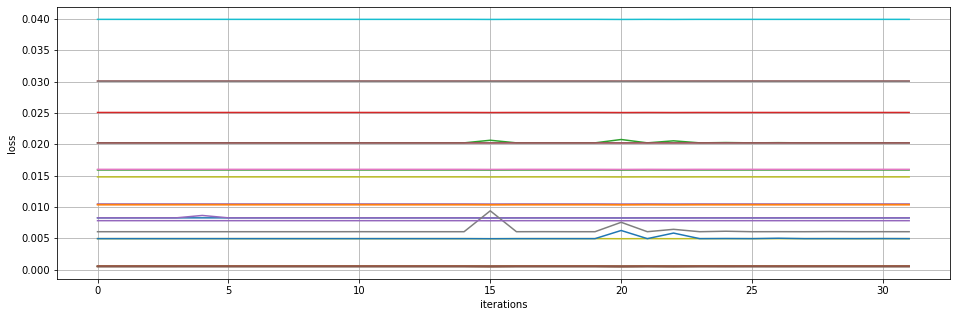

TOFJ AZG DSRJAAUHZ ZRD FONE DZMY MJ JFE 
---------------
epoch 2705
---------------
epoch 2710
---------------
epoch 2715
-----------------
average loss: 
[[0.00825349]
 [0.01036585]
 [0.02018457]
 [0.03006639]
 [0.01046432]
 [0.00051557]
 [0.02021612]
 [0.03006696]
 [0.00493724]
 [0.00051557]
 [0.00051557]
 [0.01036585]
 [0.01589293]
 [0.02506372]
 [0.00825349]
 [0.02021612]
 [0.00051557]
 [0.00604266]
 [0.01478751]
 [0.03991668]
 [0.00493724]
 [0.00051557]
 [0.00051557]
 [0.00051557]
 [0.00780302]
 [0.00051557]
 [0.0159914 ]]


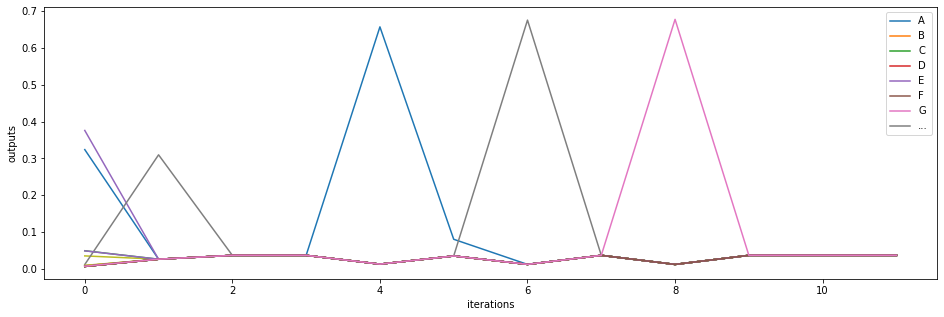

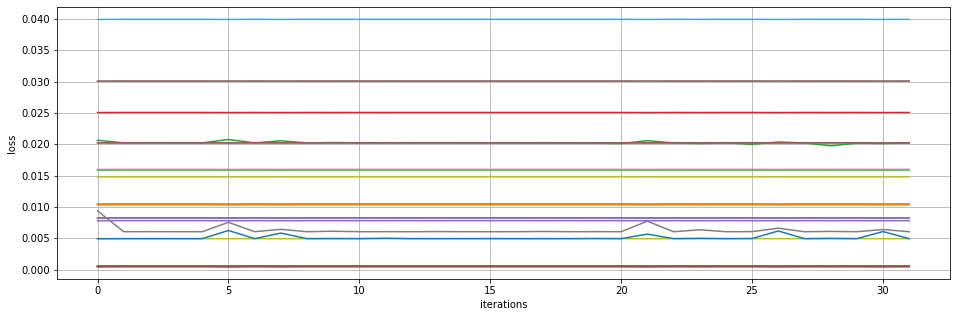

SOME JOURI ABMYETPEBZ ARY IOME POURX AJ 
---------------
epoch 2720
---------------
epoch 2725
---------------
epoch 2730
-----------------
average loss: 
[[0.00824593]
 [0.01035703]
 [0.01905105]
 [0.03005757]
 [0.0104555 ]
 [0.00050675]
 [0.02020731]
 [0.03005786]
 [0.00492842]
 [0.00050675]
 [0.00050675]
 [0.01035703]
 [0.01588411]
 [0.02505493]
 [0.00824467]
 [0.0202073 ]
 [0.00050675]
 [0.00657036]
 [0.01477869]
 [0.03990786]
 [0.00511139]
 [0.00050675]
 [0.00050675]
 [0.00050675]
 [0.00797094]
 [0.00050675]
 [0.01598261]]


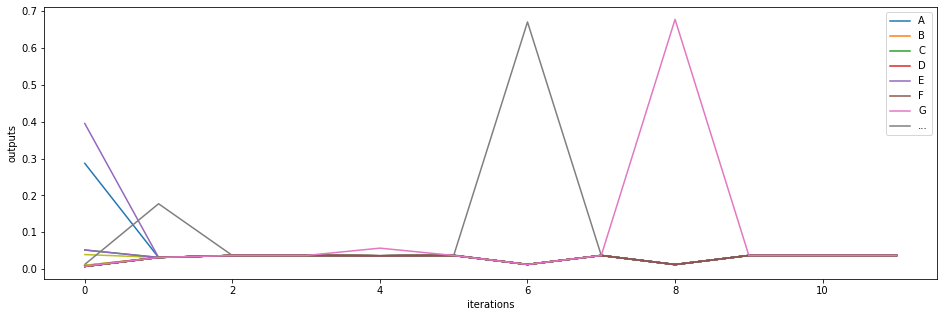

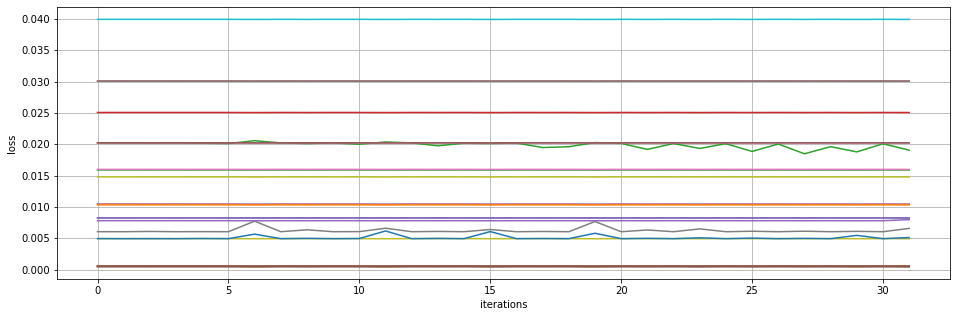

AUWVJZNE UZZ ANB SOME MINUNE MSUYXUABJER
---------------
epoch 2735
---------------
epoch 2740
---------------
epoch 2745
-----------------
average loss: 
[[0.00824867]
 [0.01036103]
 [0.01693733]
 [0.03006157]
 [0.0104595 ]
 [0.00051075]
 [0.0202113 ]
 [0.03006242]
 [0.00493242]
 [0.00051075]
 [0.00051075]
 [0.01036103]
 [0.01588811]
 [0.02505893]
 [0.00824867]
 [0.0202113 ]
 [0.00051075]
 [0.00603786]
 [0.01478269]
 [0.03991186]
 [0.00493256]
 [0.00051075]
 [0.00051075]
 [0.00051075]
 [0.0077982 ]
 [0.00051075]
 [0.01598658]]


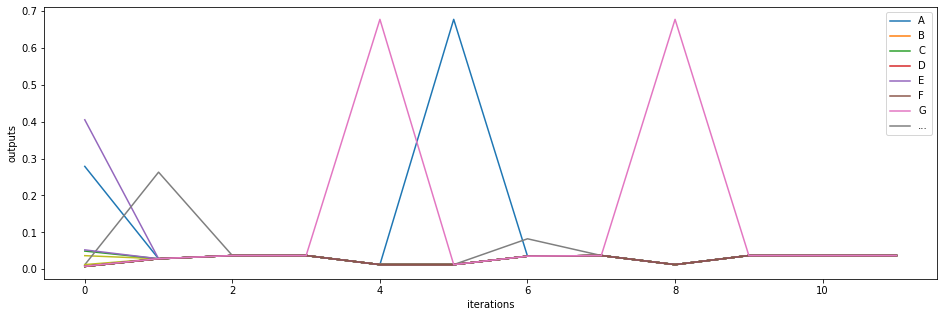

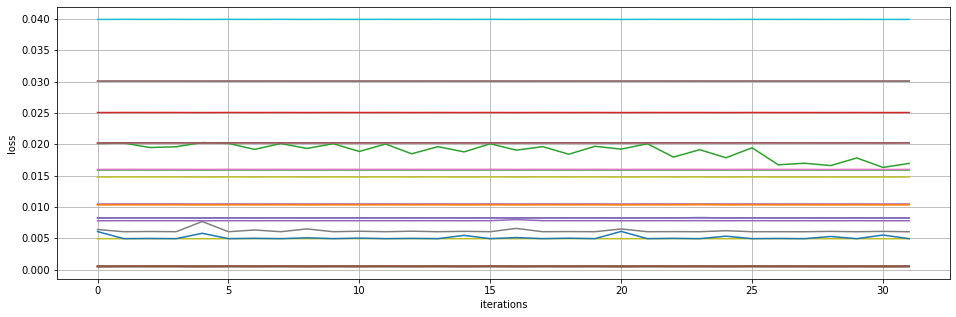

AOXZ BOX LXULY EOJJHGUOUCVUYJGWP  YCBAXE
---------------
epoch 2750
---------------
epoch 2755
---------------
epoch 2760
-----------------
average loss: 
[[0.00824085]
 [0.01035321]
 [0.01165973]
 [0.03005376]
 [0.01045168]
 [0.00050294]
 [0.02020349]
 [0.03005402]
 [0.0049246 ]
 [0.00050294]
 [0.00050294]
 [0.01035321]
 [0.01588029]
 [0.02505112]
 [0.00824169]
 [0.02020349]
 [0.00050294]
 [0.00603015]
 [0.01477488]
 [0.03990404]
 [0.00492465]
 [0.00050294]
 [0.00050294]
 [0.00050294]
 [0.00779038]
 [0.00050294]
 [0.01597876]]


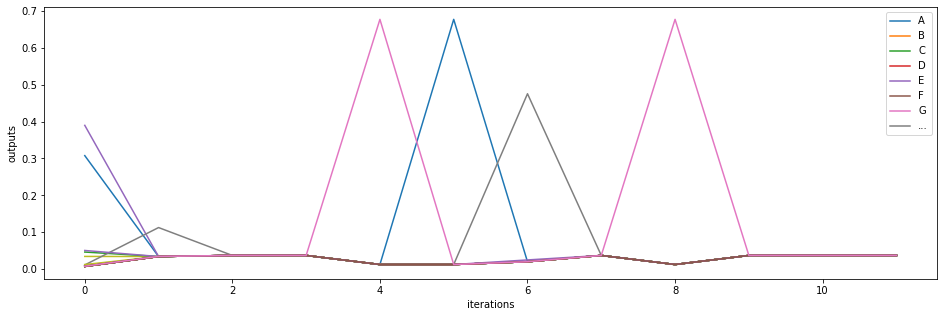

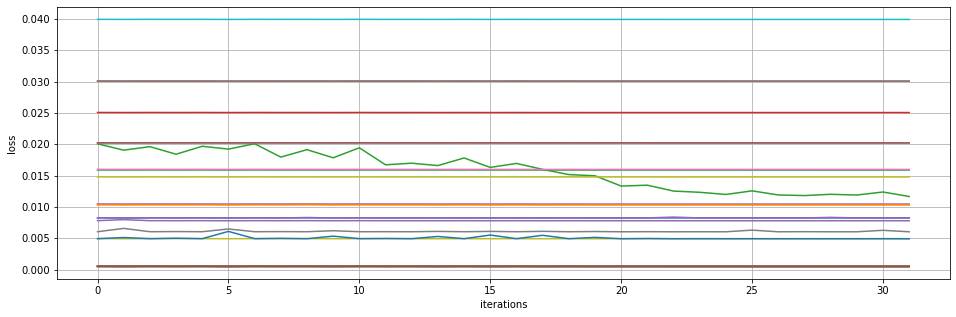

AOS HPARMQ BOME TJWYESAME EOLEY ZAELS AR
---------------
epoch 2765
---------------
epoch 2770
---------------
epoch 2775
-----------------
average loss: 
[[0.00824064]
 [0.010353  ]
 [0.0114897 ]
 [0.03005355]
 [0.01045147]
 [0.00050273]
 [0.02020328]
 [0.03005356]
 [0.00492439]
 [0.00050273]
 [0.00050273]
 [0.010353  ]
 [0.01588008]
 [0.0250509 ]
 [0.00824075]
 [0.02020328]
 [0.00050273]
 [0.00602982]
 [0.01477467]
 [0.03990383]
 [0.00492442]
 [0.00050273]
 [0.00050273]
 [0.00050273]
 [0.00779017]
 [0.00050273]
 [0.01597855]]


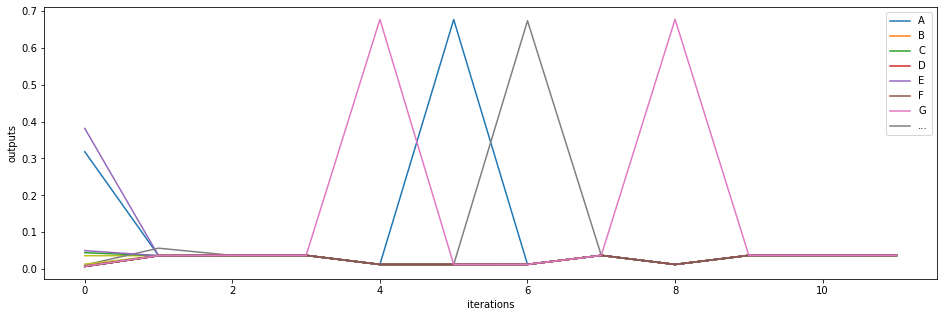

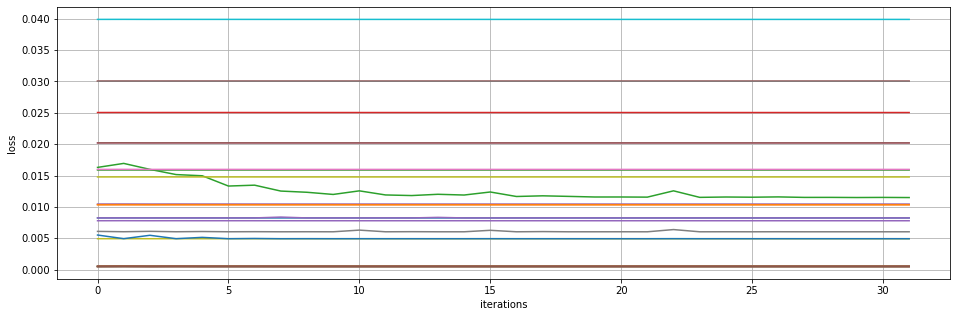

AYOXYFXAERY AOARQ AA WYVPMM XAUKB WOIDRL
---------------
epoch 2780
---------------
epoch 2785
---------------
epoch 2790
-----------------
average loss: 
[[0.00824067]
 [0.01035296]
 [0.01146725]
 [0.0300535 ]
 [0.01045143]
 [0.00050269]
 [0.02020324]
 [0.03005352]
 [0.00492435]
 [0.00050269]
 [0.00050269]
 [0.01035296]
 [0.01588004]
 [0.02505086]
 [0.00824062]
 [0.02020324]
 [0.00050269]
 [0.00603   ]
 [0.01477463]
 [0.03990379]
 [0.00492439]
 [0.00050269]
 [0.00050269]
 [0.00050269]
 [0.00779013]
 [0.00050269]
 [0.01597851]]


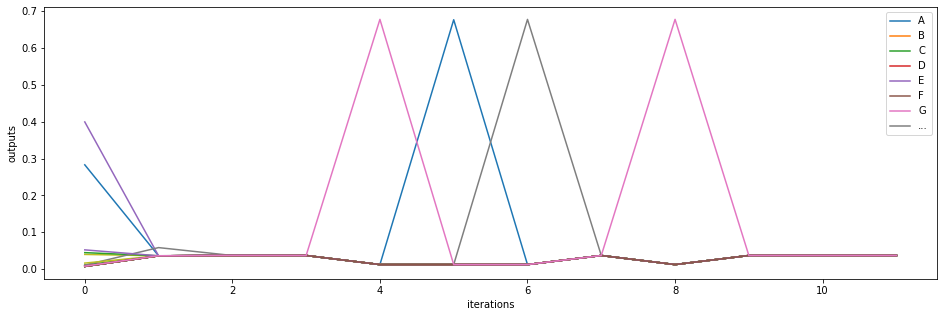

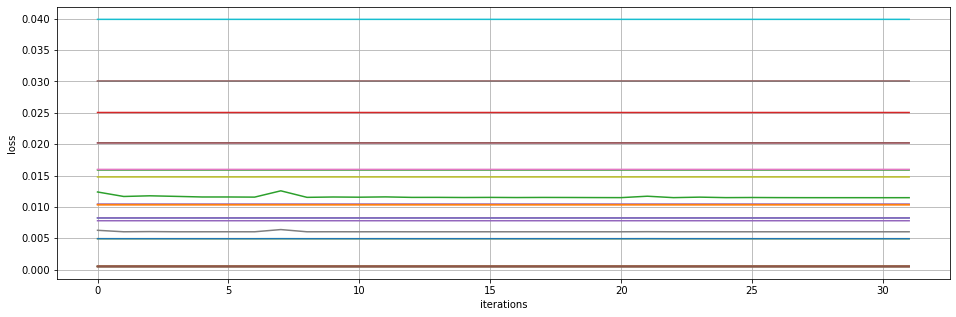

AJTPWVAWTAZEIMG BO LZ AYS YRRHAXTENJ FOT
---------------
epoch 2795
---------------
epoch 2800
---------------
epoch 2805
-----------------
average loss: 
[[0.00824061]
 [0.01035297]
 [0.011465  ]
 [0.03005352]
 [0.01045144]
 [0.0005027 ]
 [0.02020325]
 [0.03005353]
 [0.00492436]
 [0.0005027 ]
 [0.0005027 ]
 [0.01035297]
 [0.01588005]
 [0.02505072]
 [0.00824061]
 [0.02020325]
 [0.0005027 ]
 [0.00602978]
 [0.01477464]
 [0.0399038 ]
 [0.00492436]
 [0.0005027 ]
 [0.0005027 ]
 [0.0005027 ]
 [0.00779015]
 [0.0005027 ]
 [0.01597854]]


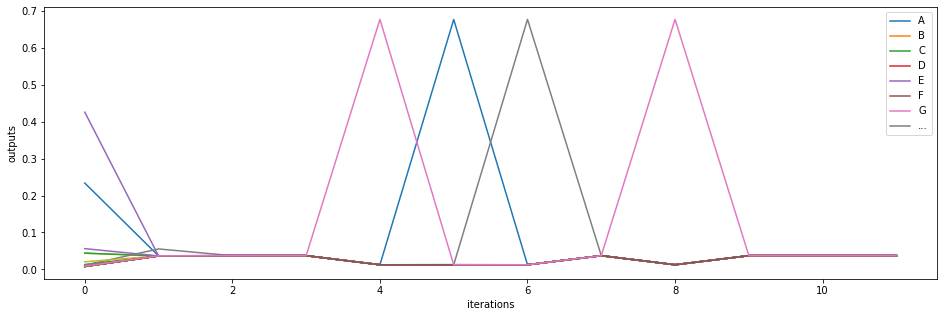

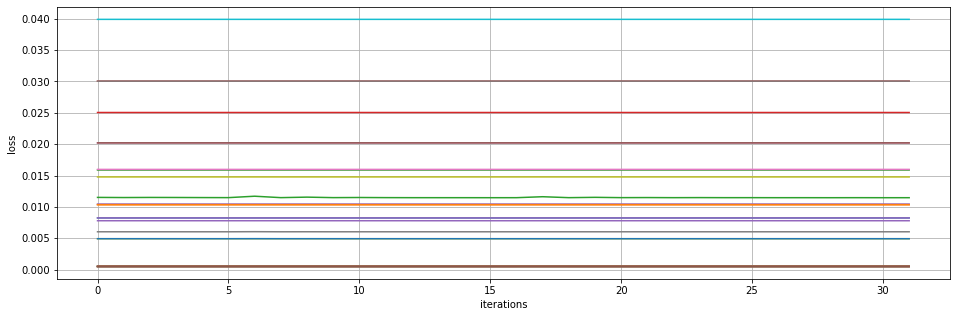

AIZ URI AXBREAWZ KAWEHQQACD GBNE MY IAXE
---------------
epoch 2810
---------------
epoch 2815
---------------
epoch 2820
-----------------
average loss: 
[[0.00824061]
 [0.01035296]
 [0.01146051]
 [0.0300535 ]
 [0.01045143]
 [0.00050269]
 [0.02020324]
 [0.03005352]
 [0.00492435]
 [0.00050269]
 [0.00050269]
 [0.01035296]
 [0.01588004]
 [0.02505087]
 [0.0082406 ]
 [0.02020324]
 [0.00050269]
 [0.00602979]
 [0.01477463]
 [0.03990379]
 [0.0049244 ]
 [0.00050269]
 [0.00050269]
 [0.00050269]
 [0.00779013]
 [0.00050269]
 [0.01597851]]


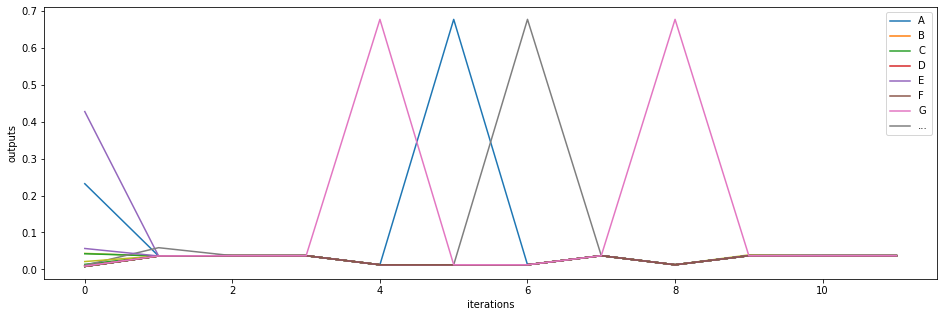

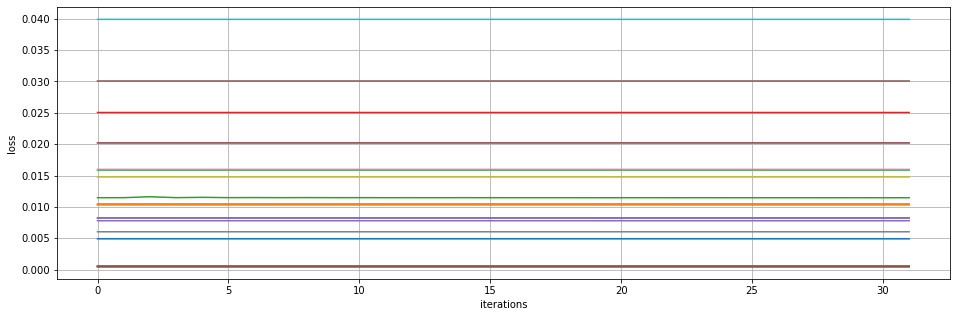

ARUJINTAND IOJXENY WOYPCUBOAIY GOOALA PO
---------------
epoch 2825
---------------
epoch 2830
---------------
epoch 2835
-----------------
average loss: 
[[0.0082406 ]
 [0.01035296]
 [0.01145908]
 [0.03005351]
 [0.01045143]
 [0.00050269]
 [0.02020324]
 [0.03005352]
 [0.00492435]
 [0.00050269]
 [0.00050269]
 [0.01035296]
 [0.01588004]
 [0.02505085]
 [0.0082406 ]
 [0.02020324]
 [0.00050269]
 [0.00602977]
 [0.01477463]
 [0.03990379]
 [0.00492435]
 [0.00050269]
 [0.00050269]
 [0.00050269]
 [0.00779013]
 [0.00050269]
 [0.01597851]]


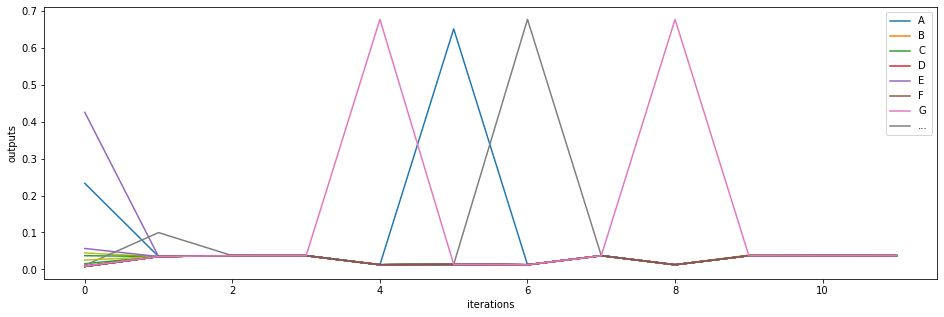

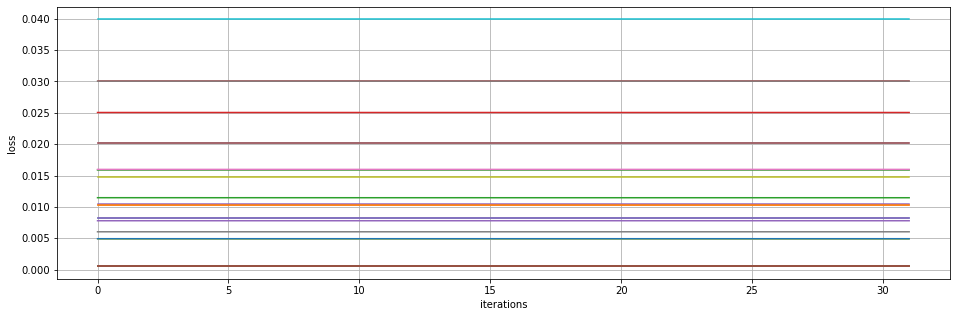

AVCUWY LOLWSOFXPCALQ NOKERY QOMH RD APME
---------------
epoch 2840
---------------
epoch 2845
---------------
epoch 2850
-----------------
average loss: 
[[0.0082406 ]
 [0.01035296]
 [0.01145902]
 [0.0300535 ]
 [0.01045143]
 [0.00050269]
 [0.02020324]
 [0.03005351]
 [0.00492435]
 [0.00050269]
 [0.00050269]
 [0.01035296]
 [0.01588004]
 [0.02505066]
 [0.0082406 ]
 [0.02020324]
 [0.00050269]
 [0.00602978]
 [0.01477463]
 [0.03990379]
 [0.00492437]
 [0.00050269]
 [0.00050269]
 [0.00050269]
 [0.00779014]
 [0.00050269]
 [0.01597853]]


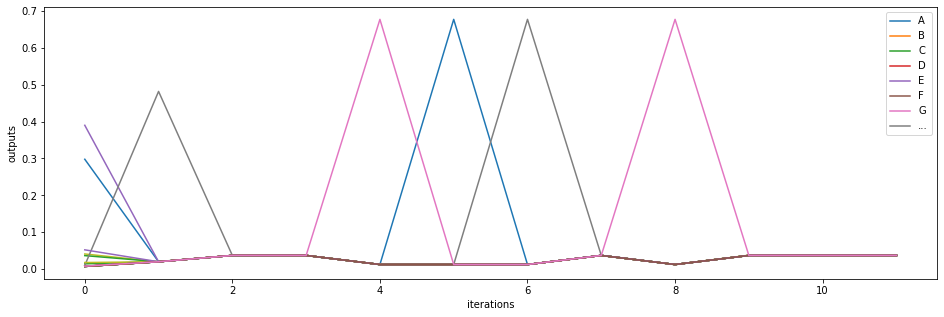

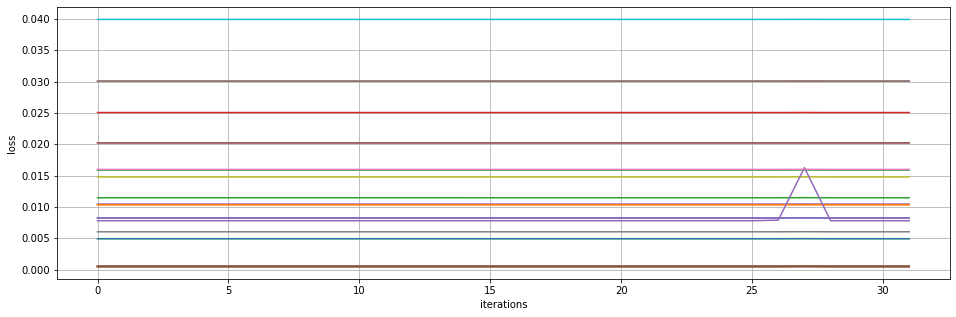

AHERE GYAIAAUE VLJ EUIE MONNH ERY WOUKI 
---------------
epoch 2855
---------------
epoch 2860
---------------
epoch 2865
-----------------
average loss: 
[[0.0082406 ]
 [0.01035296]
 [0.01145857]
 [0.0300535 ]
 [0.01045143]
 [0.00050269]
 [0.02020324]
 [0.03005351]
 [0.00492435]
 [0.00050269]
 [0.00050269]
 [0.01035296]
 [0.01588004]
 [0.02505086]
 [0.0082406 ]
 [0.02020324]
 [0.00050269]
 [0.00602977]
 [0.01477463]
 [0.03990379]
 [0.00492435]
 [0.00050269]
 [0.00050269]
 [0.00050269]
 [0.00779013]
 [0.00050269]
 [0.01597851]]


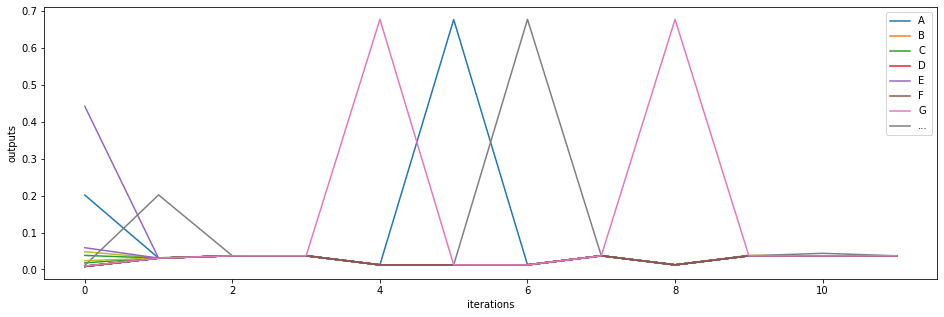

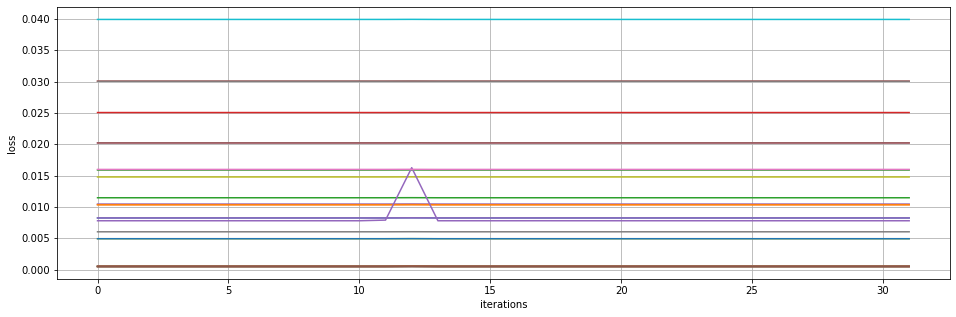

AAZY LOMT WOSVERE DOIRMY CZPQERK AOYDZXI
---------------
epoch 2870
---------------
epoch 2875
---------------
epoch 2880
-----------------
average loss: 
[[0.0082406 ]
 [0.01035296]
 [0.01145852]
 [0.0300535 ]
 [0.01045143]
 [0.00050269]
 [0.02020324]
 [0.03005351]
 [0.00492435]
 [0.00050269]
 [0.00050269]
 [0.01035296]
 [0.01588004]
 [0.02505079]
 [0.0082406 ]
 [0.02020324]
 [0.00050269]
 [0.00602977]
 [0.01477463]
 [0.03990379]
 [0.00492435]
 [0.00050269]
 [0.00050269]
 [0.00050269]
 [0.00779013]
 [0.00050269]
 [0.01597852]]


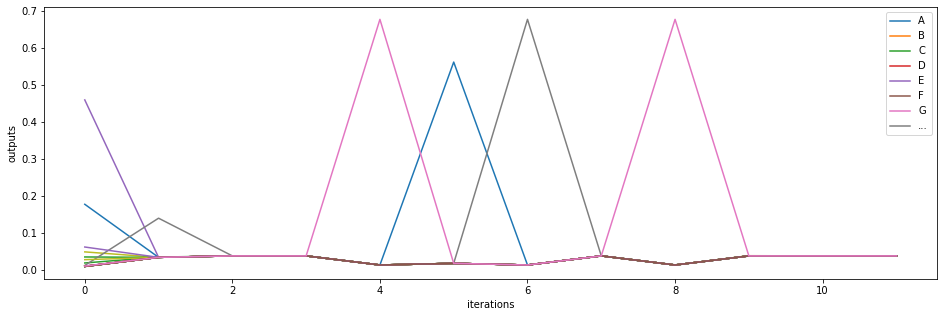

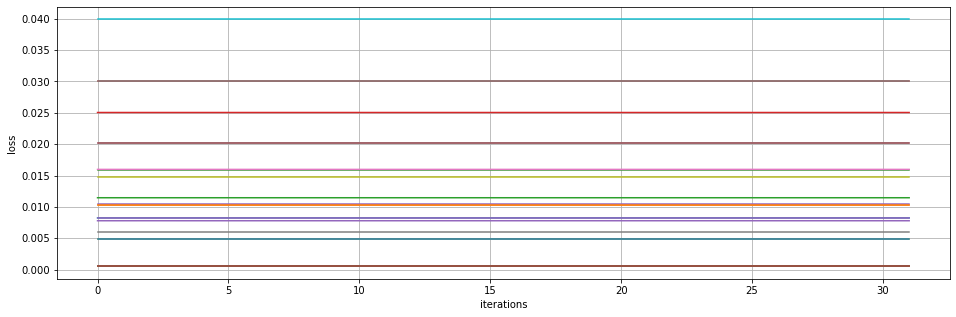

ARD ORZ AYS JOQGDAZB ERMNZAAECENE WOVQXV
---------------
epoch 2885
---------------
epoch 2890
---------------
epoch 2895
-----------------
average loss: 
[[0.0082406 ]
 [0.01035296]
 [0.01145842]
 [0.0300535 ]
 [0.01045143]
 [0.00050269]
 [0.02020324]
 [0.03005351]
 [0.00492435]
 [0.00050269]
 [0.00050269]
 [0.01035296]
 [0.01588004]
 [0.02505086]
 [0.0082406 ]
 [0.02020324]
 [0.00050269]
 [0.00602977]
 [0.01477463]
 [0.03990379]
 [0.00492435]
 [0.00050269]
 [0.00050269]
 [0.00050269]
 [0.00779013]
 [0.00050269]
 [0.01597851]]


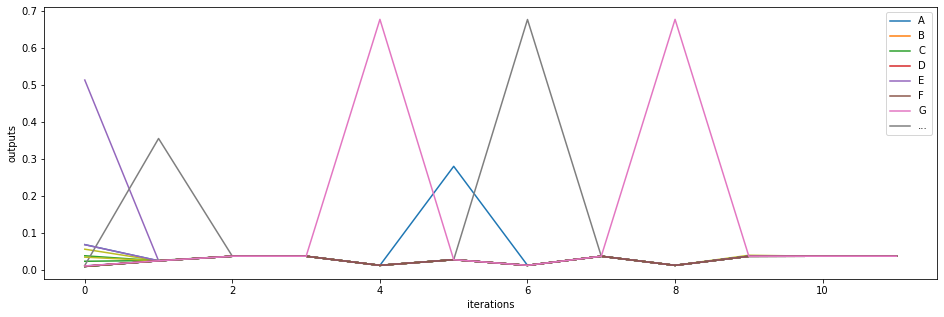

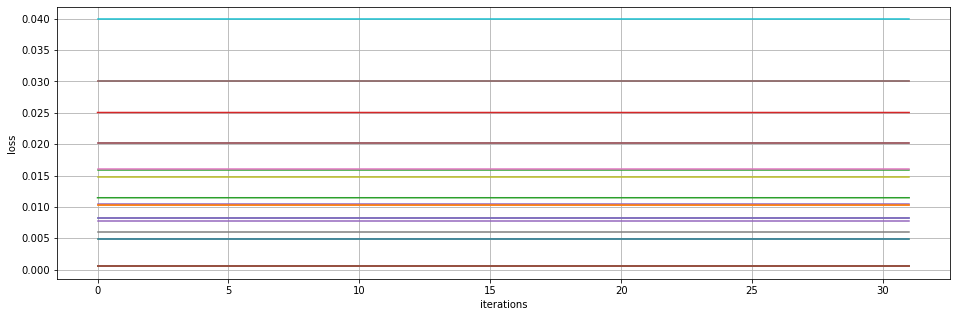

ABQFNGWFES LIAE ZRKYOKAES LD MIVEZB ZOXV
---------------
epoch 2900
---------------
epoch 2905
---------------
epoch 2910
-----------------
average loss: 
[[0.0082406 ]
 [0.01035296]
 [0.0114584 ]
 [0.03005349]
 [0.01045167]
 [0.00050269]
 [0.02020324]
 [0.03005351]
 [0.00492435]
 [0.00050269]
 [0.00050269]
 [0.01035296]
 [0.01588004]
 [0.02505083]
 [0.0082406 ]
 [0.02020324]
 [0.00050269]
 [0.00602977]
 [0.01477463]
 [0.03990379]
 [0.00492435]
 [0.00050269]
 [0.00050269]
 [0.00050269]
 [0.00779013]
 [0.00050269]
 [0.01597852]]


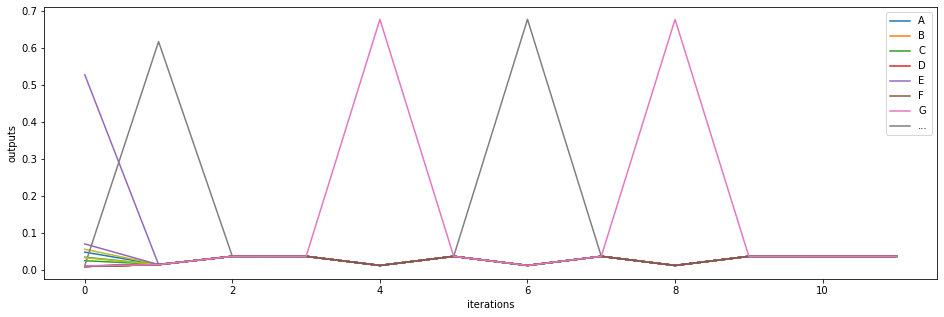

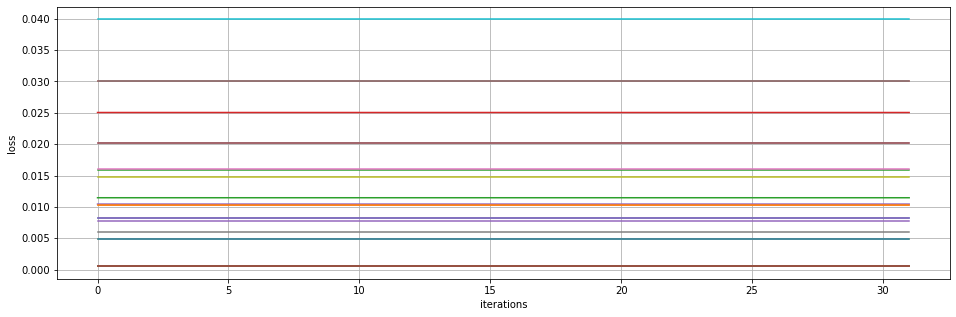

AZYIW OWTEWNA OOME MINUTESVLTBCPME C NWM
---------------
epoch 2915
---------------
epoch 2920
---------------
epoch 2925
-----------------
average loss: 
[[0.0082406 ]
 [0.01035296]
 [0.01145839]
 [0.03005351]
 [0.01045143]
 [0.00050269]
 [0.02020324]
 [0.03005351]
 [0.00492435]
 [0.00050269]
 [0.00050269]
 [0.01035296]
 [0.01588004]
 [0.02505086]
 [0.0082406 ]
 [0.02020323]
 [0.00050269]
 [0.00602977]
 [0.01477463]
 [0.03990379]
 [0.00492435]
 [0.00050269]
 [0.00050269]
 [0.00050269]
 [0.00779013]
 [0.00050269]
 [0.01597851]]


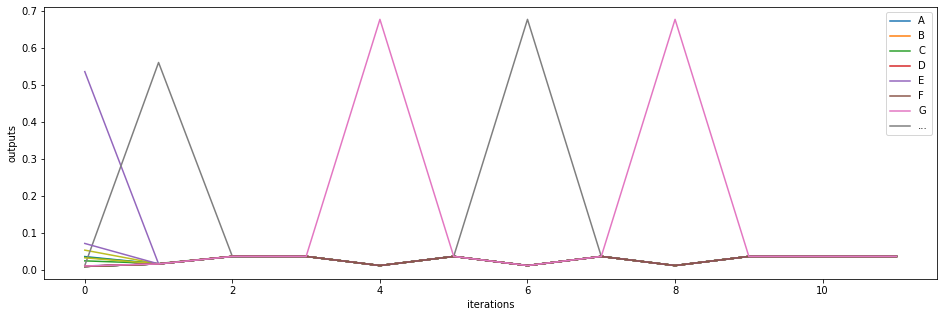

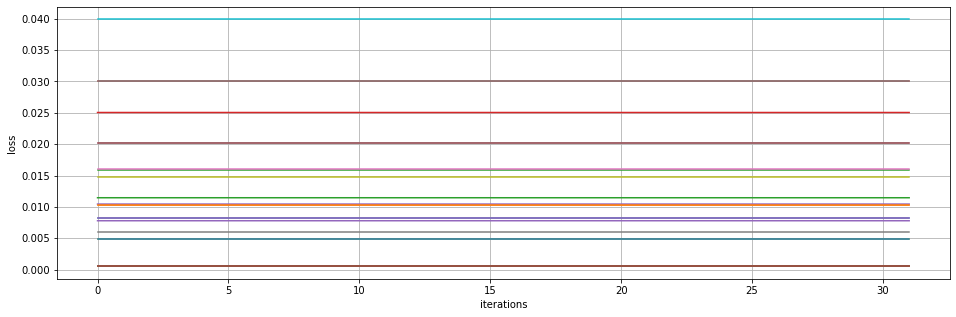

ASHVERB FOQRY HOACHBIKAOLTEXUUWTEDJVWCTL
---------------
epoch 2930
---------------
epoch 2935
---------------
epoch 2940
-----------------
average loss: 
[[0.0082406 ]
 [0.01035296]
 [0.01145838]
 [0.03005351]
 [0.01045143]
 [0.00050269]
 [0.02020324]
 [0.03005351]
 [0.00492435]
 [0.00050269]
 [0.00050269]
 [0.01035296]
 [0.01588004]
 [0.02505086]
 [0.0082406 ]
 [0.02020324]
 [0.00050269]
 [0.00602977]
 [0.01477463]
 [0.03990379]
 [0.00492435]
 [0.00050269]
 [0.00050269]
 [0.00050269]
 [0.00779013]
 [0.00050269]
 [0.01597851]]


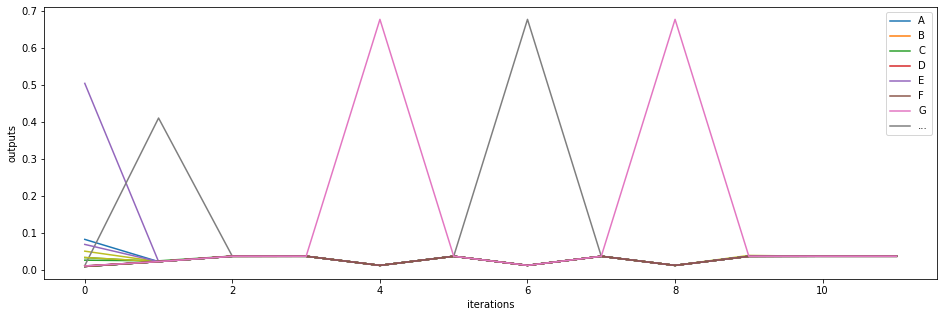

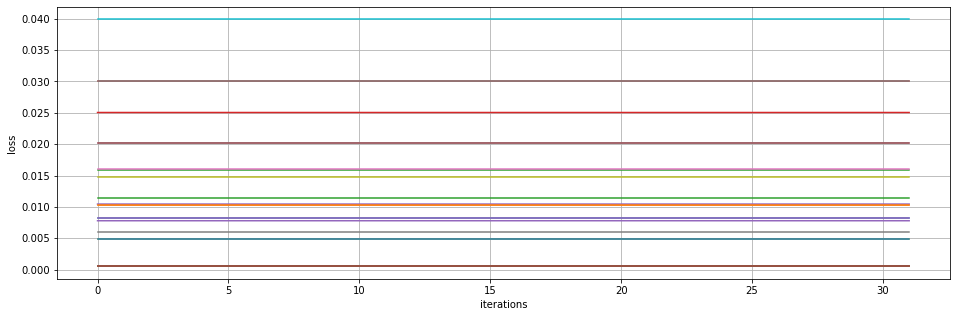

AZVJIFWXAPKOEEITD DWME MBNUCNA PRERIALOA
---------------
epoch 2945
---------------
epoch 2950
---------------
epoch 2955
-----------------
average loss: 
[[0.0082406 ]
 [0.01035296]
 [0.01145839]
 [0.03005351]
 [0.01045143]
 [0.00050269]
 [0.02020324]
 [0.03005351]
 [0.00492435]
 [0.00050269]
 [0.00050269]
 [0.01035296]
 [0.01588004]
 [0.02505085]
 [0.0082406 ]
 [0.02020324]
 [0.00050269]
 [0.00602977]
 [0.01477463]
 [0.03990379]
 [0.00492435]
 [0.00050269]
 [0.00050269]
 [0.00050269]
 [0.00779013]
 [0.00050269]
 [0.01597851]]


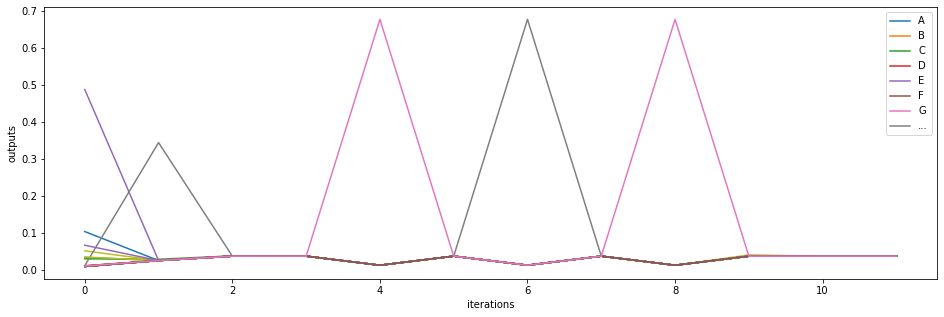

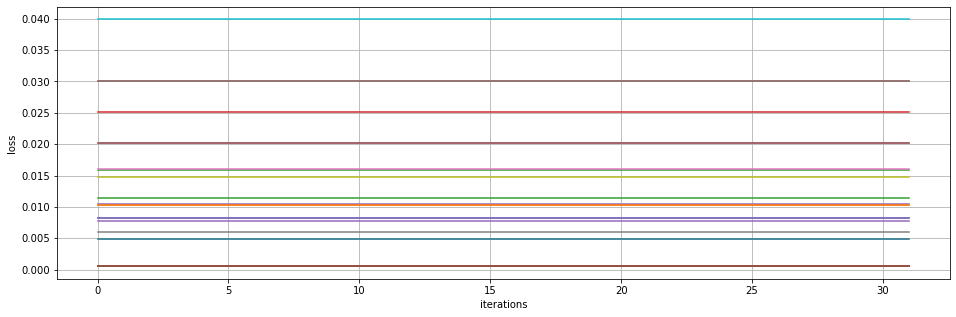

ALBY ZOVZHGNAKE CXZ ALD ZRVL HGREJNAAERD
---------------
epoch 2960
---------------
epoch 2965
---------------
epoch 2970
-----------------
average loss: 
[[0.0082406 ]
 [0.01035296]
 [0.01145838]
 [0.03005351]
 [0.01045143]
 [0.00050269]
 [0.02020324]
 [0.03005351]
 [0.00492435]
 [0.00050269]
 [0.00050269]
 [0.01035296]
 [0.01588004]
 [0.02505085]
 [0.0082406 ]
 [0.02020324]
 [0.00050269]
 [0.00602977]
 [0.01477463]
 [0.03990379]
 [0.00492435]
 [0.00050269]
 [0.00050269]
 [0.00050269]
 [0.00779013]
 [0.00050269]
 [0.01597851]]


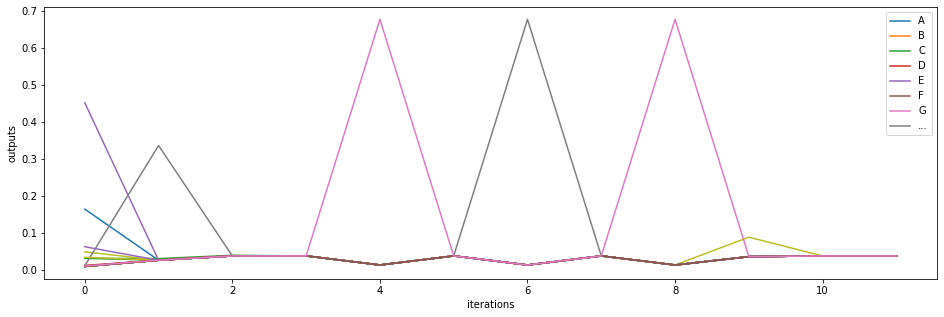

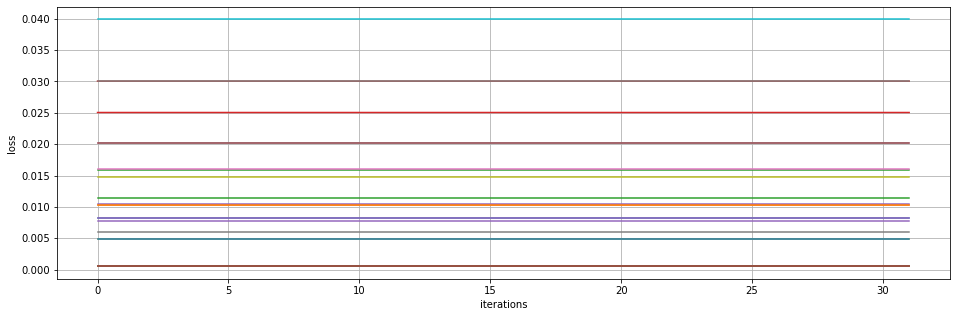

AOJUCREUDYYFXAGC NXZAEI AIQ KZFB HOS I A
---------------
epoch 2975
---------------
epoch 2980
---------------
epoch 2985
-----------------
average loss: 
[[0.0082406 ]
 [0.01035296]
 [0.01145838]
 [0.0300535 ]
 [0.01045143]
 [0.00050269]
 [0.02020324]
 [0.03005351]
 [0.00492435]
 [0.00050269]
 [0.00050269]
 [0.01035296]
 [0.01588004]
 [0.02505086]
 [0.0082406 ]
 [0.02020324]
 [0.00050269]
 [0.00602977]
 [0.01477463]
 [0.03990379]
 [0.00492435]
 [0.00050269]
 [0.00050269]
 [0.00050269]
 [0.00779013]
 [0.00050269]
 [0.01597851]]


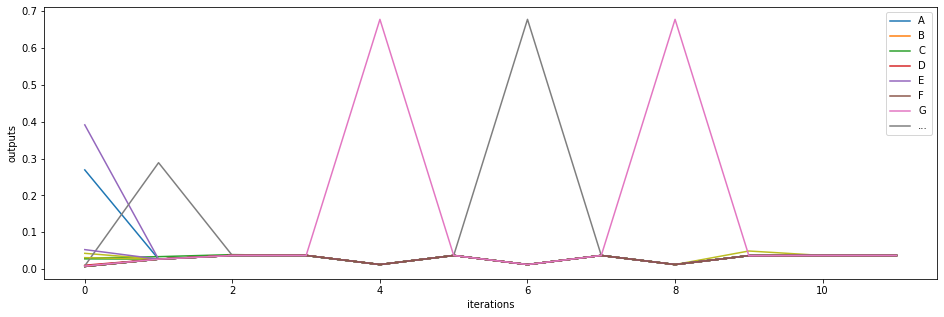

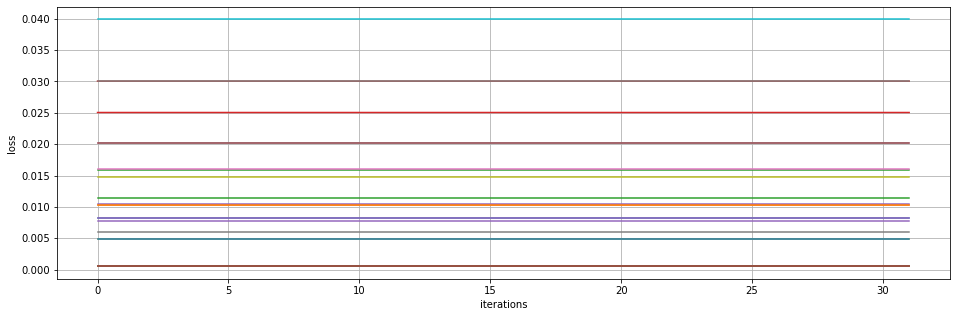

AMG MJ EWQ ZJGTEOQKGELQOHYXKERV AO UFLWA


KeyboardInterrupt: 

In [100]:
epochs = 14000
batch = 2
early_stop = 500
loss = 0
prevLoss = 999
loss_n = 0
losses = []

for e in range(0, epochs+1):
    network.clear_memory()
    loss = 0
    loss_n = 0
    outputs = []
    if e % 5 == 0:
        print("---------------")
        print("epoch " + str(e))
    network.learning_rate /= 1.0000
    for i in range(0, len(input_questions)):
        network.clear_memory()
        
        outputs = []
        #print("---------------")
        #print("question " + str(i))
        for t in range(0, len(input_questions[i])):
            output = network.forward_pass(input_questions[i][t])
            outputs.append(output)
        for t in range(0, len(input_answers[i])-1):
            network.forward_pass(input_answers[i][t])
            loss += network.backpropagation_through_time(input_answers[i], input_answers[i][t+1], 100, t+1)
            loss_n += 1
        
        #if e%5 == 0 and (i+400)%801 == 0:
        #print("---------------")
        #print("epoch " + str(e))
        #print("learning rate: " + str(network.learning_rate))
        #print("sample " + str(i))
        #print("output: \n" + str(output))
        #print("target: \n" + str(input_data[i+1]))
    losses.append(loss/loss_n)
    if e%15 == 0:        
        print("-----------------")
        print("average loss: ")
        print(str(loss/loss_n)) 
        plt.plot(np.squeeze(outputs))
        plt.ylabel('outputs')
        plt.xlabel('iterations')
        plt.legend(["A", "B", "C", "D", "E", "F", "G", "..."])
        plt.show()
        
        plt.plot(np.squeeze(losses))
        plt.ylabel('loss')
        plt.xlabel('iterations')
        plt.grid()
        plt.show()
        network.predict(input_questions[0])
        
        
    
    if e > 30:
        del losses[0]
    
    
print("------------training finished successfully!------------")
        

In [ ]:
print(str(network.layers[-3].inputs))

In [ ]:
print(str(network.layers[-1].bz))

In [ ]:
print(str(network.layers[-1].br))

In [ ]:
print(str(network.layers[-1].Wz))

In [ ]:
print(str(network.layers[-1].Wr))

In [ ]:
print(str(network.layers[-1].Wh))

In [ ]:
print(str(network.layers[-1].Ur))

In [ ]:
print(str(network.layers[-1].Uz))

In [ ]:
print(str(network.layers[-1].Uh))

In [ ]:
print(str(network.layers[-1].bh))